In [1]:
import numpy as np
import pandas as pd
from sklearn.linear_model import LinearRegression, LassoCV,LogisticRegression
from sklearn.metrics import r2_score
from scipy.stats import norm
from sklearn.cluster import KMeans
import random
from statsmodels.regression.linear_model import OLS
import statsmodels.api as sm
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
from sklearn.metrics import roc_auc_score

from scipy.stats import bernoulli

from scipy.special import expit

from gurobipy import *

In [25]:
# number of items
n = 20

# number of features
d = 5

# number of observations for each item
obs = 10

# number of clusters
z = 2

# number of trials
T = 100

# noise
sigma = 1
# prob
p, q = 2/3,1/6

In [6]:
def fit_models_upd(Ru,Rl,method):
    auc_alg_t, auc_b1_t, auc_b2_t, auc_lasso_t, auc_clus_t,auc_true_t =  np.zeros(T), np.zeros(T),np.zeros(T), np.zeros(T), np.zeros(T),np.zeros(T)
    
    flag = False
    for t in range(T):
        while not flag:
            print(flag)
            # generate data
            data = np.random.rand(n*obs,d)
            data_test = np.random.rand(int(n*obs/2),d)

            # generate clusters and betas
            feature_dict = {}
            clus_dict = {} # might not be used depending on the feature dict

            for i in range(d):
                # whether this feature should be estimated at the department level
                feature_dict[i] = np.random.choice(['dept', 'clus', 'sku'], p = [p, q, 1-p-q])
            print(feature_dict)

            items = set(range(n))

            for i in range(z):
                clus_items = random.sample(items,int(n/z))
                clus_dict[i] = clus_items
                items = items - set(clus_items)

            # generate Beta
            beta_dict = {}
            num_cols = 0
            for i in range(d):
                if feature_dict[i] == 'dept':
                    beta_dict[i] = (np.random.random_sample() - 0.5) * 10
                    num_cols += 1
                elif feature_dict[i] == 'clus':
                    beta_dict[i] = (np.random.random_sample(size = z) - 0.5) * 10
                    num_cols += z
                else:
                    beta_dict[i] = (np.random.random_sample(size = n) - 0.5) * 10
                    num_cols += n

            X_true = np.zeros((n*obs, num_cols))
            X_test = np.zeros((int(n*obs/2), num_cols))

            beta = np.zeros(num_cols)
            count = 0
            for i in range(d):
                if feature_dict[i] == 'dept':
                    beta[count] = beta_dict[i]
                    X_true[:,count] = data[:,i]
                    X_test[:,count] = data_test[:,i]

                    count += 1

                elif feature_dict[i] == 'clus':
                    for j in range(z):
                        clus_items = clus_dict[j]
                        for sku in clus_items:
                            X_true[sku*obs:(sku+1)*obs, count] = data[sku*obs:(sku+1)*obs, i]
                            X_test[int(sku*obs/2):int((sku+1)*obs/2), count] = data_test[int(sku*obs/2):int((sku+1)*obs/2), i]

                        beta[count] = beta_dict[i][j]
                        count += 1
                else:
                    for j in range(n):
                        X_true[j*obs:(j+1)*obs, count] = data[j*obs:(j+1)*obs, i]
                        X_test[int(j*obs/2):int((j+1)*obs/2), count] = data_test[int(j*obs/2):int((j+1)*obs/2), i]
                        beta[count] = beta_dict[i][j]
                        count += 1
            #epsilon = np.random.multivariate_normal(np.zeros(n*obs), np.identity(n*obs)*sigma)
            #epsilon_test = np.random.multivariate_normal(np.zeros(int(n*obs/2)), np.identity(int(n*obs/2))*sigma)
            mu = np.dot(X_true, beta)
            #+epsilon
            mu_test = np.dot(X_test, beta)
            #+epsilon_test
            y = bernoulli.rvs(size=len(mu),p=expit(mu)) #generate y from a bernoulli distribution with p = logit(X*beta)
            y_test = bernoulli.rvs(size=len(mu_test),p=expit(mu_test))
            
            #we are going to test if some features only have labels 1 or 0 and repeat 
            #the data generation until we have balanced generated data
            c= 0
            for i in range(n):
                if np.mean(y[i*obs:(i+1)*obs])*(1-np.mean(y[i*obs:(i+1)*obs]))==0:
                    c +=1
            if c==0:
                break
        print(feature_dict)
        #TRUE DAC
        model_true = sm.Logit(y, X_true).fit(method=method,maxiter=100)
        y_pred = model_true.predict(X_test)
        auc_true_t[t] = roc_auc_score(y_test, np.array(y_pred))
        
        #DECENTRALIZED
        
        y_pred = []
        logit_models = {}
        for i in range(n):

            logit_models[i] = sm.Logit(y[i*obs:(i+1)*obs],data[i*obs:(i+1)*obs,:]).fit(method=method,maxiter=100)
            y_pred += list(logit_models[i].predict(data_test[int(i*obs/2):int((i+1)*obs/2),:]))

        auc_b1_t[t] = roc_auc_score(y_test,np.array(y_pred))
        
        
        #DAC
        
        aggre_level = []
        clus_columns = []
        all_coeff = np.zeros((n,d))
        all_coeff[0,:] = logit_models[0].params
        n_cols_alg = 0

        for j in range(d):

            # a n-1 vector recording if two betas have the same mean
            test_j = np.zeros(n-1)

            for i in range(1,n):
               #print(i,j)
                all_coeff[i,j] = logit_models[i].params[j]

                z_stat = ( np.abs(logit_models[0].params[j] - logit_models[i].params[j]) / 
                          np.sqrt(np.square(logit_models[0].bse[j]) + np.square(logit_models[i].bse[j])) )
                p_value = 1 - norm.cdf(z_stat)
                if p_value >= 0.05:  #P-value ->0.05
                    test_j[i-1] = 1

            if np.sum(test_j) >= Ru*(n-1):
                aggre_level.append('dept')
                n_cols_alg += 1

            elif np.sum(test_j) <= Rl*(n-1):
                aggre_level.append('sku')
                n_cols_alg += n

            else:
                aggre_level.append('clus')
                clus_columns.append(j)
                n_cols_alg += z

        if len(clus_columns) > 0:
            X_clus = all_coeff[:, clus_columns]
            kmeans = KMeans(n_clusters=z, random_state=0).fit(X_clus)

        X_alg = np.zeros((n*obs, n_cols_alg))
        X_test = np.zeros((int(n*obs/2), n_cols_alg))

        count = 0
        for i in range(d):
            if aggre_level[i] == 'dept':
                X_alg[:,count] = data[:,i]
                X_test[:,count] = data_test[:,i]
                count += 1

            elif aggre_level[i] == 'clus':
                for j in range(z):
                    clus_items = list(np.where(kmeans.labels_ == j)[0])
                    for sku in clus_items:
                        X_alg[sku*obs:(sku+1)*obs, count] = data[sku*obs:(sku+1)*obs, i]
                        X_test[int(sku*obs/2):int((sku+1)*obs/2), count] = data_test[int(sku*obs/2):int((sku+1)*obs/2), i]


                    count += 1
            else:
                for j in range(n):
                    X_alg[j*obs:(j+1)*obs, count] = data[j*obs:(j+1)*obs, i]
                    X_test[int(j*obs/2):int((j+1)*obs/2), count] = data_test[int(j*obs/2):int((j+1)*obs/2), i]
                    count += 1
                    
                    
        model_0 = sm.Logit(y,X_alg).fit(method=method,maxiter=100)
        auc_alg_t[t] = roc_auc_score(y_test,model_0.predict(X_test))
        
        
        # CENTRALIZED
        
        model_0 = sm.Logit(y,data).fit(method=method,maxiter=100)
        auc_b2_t[t] = roc_auc_score(y_test,model_0.predict(data_test))
        

        # CLUSTER 
        
        X_clus = np.zeros((n, d))
        count = 0
        y_pred = np.zeros(int(n*obs/2))
        for i in range(n):
            X_clus[count, :] = np.mean(data[i*obs:(i+1)*obs,:], axis = 0)
            count += 1
        
        kmeans = KMeans(n_clusters=z, random_state=0).fit(X_clus)
        for i in range(z):
            clus_items = list(np.where(kmeans.labels_ == i)[0])
            base_rows = np.array(list(range(obs)))
            base_rows_test = np.array(list(range(int(obs/2))))
            rows = []
            test_rows = []
            for j in clus_items:
                rows += list(range( j*obs, (j+1)*obs ))
                test_rows += list(range( j*int(obs/2), (j+1)*int(obs/2) ))
            
            model_i = sm.Logit(y[np.ix_(rows)], data[np.ix_(rows)]).fit(method=method,maxiter=100)
            y_pred[np.ix_(test_rows)] = model_i.predict(data_test[np.ix_(test_rows)])

        auc_clus_t[t] = roc_auc_score(y_test,np.array(y_pred))
        
        
    return(np.mean(auc_alg_t),np.mean(auc_b1_t),np.mean(auc_b2_t),np.mean(auc_clus_t),np.mean(auc_true_t))
        

# INCREASE NUMBER OF ITEMS

In [ ]:
list_n = [i for i in range(10,30,5)]


auc_alg, auc_b1, auc_b2, auc_clus = [], [], [], []
for n in list_n:
    result_1, result_2, result_3, result_4,result_5 = fit_models_upd(0.9,0.6,"bfgs")
    auc_alg.append(result_1)
    auc_b1.append(result_2)
    auc_b2.append(result_3)
    auc_clus.append(result_4)
    print("dac",result_1)
    print("dec",result_2)
    print("items:",n)


In [ ]:

plt.plot(list_n, auc_alg,"--",label = 'DAC')
plt.plot(list_n, auc_b1,'',label = 'Decentralized')
plt.plot(list_n, auc_b2,linestyle=(0, (5, 2, 1, 2)), dash_capstyle='round',label = 'Centralized')
plt.plot(list_n, auc_clus,'y-o',markersize=3,label = 'Clustering')

plt.legend(loc='best',frameon=False,prop={'size': 9})
plt.xlabel('n')
plt.ylabel('AUC')
plt.ylim(0.5,0.9)
plt.show()

# INCREASE NUMBER OF FEATURES

In [ ]:
list_d = [i for i in range(2,8,1)]


auc_alg, auc_b1, auc_b2, auc_clus = [], [], [], []
for d in list_d:
    result_1, result_2, result_3, result_4,result_5 = fit_models_upd(0.9,0.6,"bfgs")
    auc_alg.append(result_1)
    auc_b1.append(result_2)
    auc_b2.append(result_3)
    auc_clus.append(result_4)

    print("features:",d)

In [ ]:

plt.plot(list_d, auc_alg,"--",label = 'DAC')
plt.plot(list_d, auc_b1,'',label = 'Decentralized')
plt.plot(list_d, auc_b2,linestyle=(0, (5, 2, 1, 2)), dash_capstyle='round',label = 'Centralized')
plt.plot(list_d, auc_clus,'y-o',markersize=3,label = 'Clustering')

plt.legend(loc='best',frameon=False,prop={'size': 9})
plt.xlabel('d')
plt.ylabel('AUC')
plt.ylim(0.5,0.9)
plt.show()

# INCREASE OBSERVATIONS

In [ ]:
list_m = [i for i in range(40,110,10)]


auc_alg, auc_b1, auc_b2, auc_clus = [], [], [], []
for obs in list_m:
    result_1, result_2, result_3, result_4,result_5 = fit_models_upd(0.9,0.6,"bfgs")
    auc_alg.append(result_1)
    auc_b1.append(result_2)
    auc_b2.append(result_3)
    auc_clus.append(result_4)

    print("observations:",obs)

In [ ]:

plt.plot(list_m, auc_alg,"--",label = 'DAC')
plt.plot(list_m, auc_b1,'',label = 'Decentralized')
plt.plot(list_m, auc_b2,linestyle=(0, (5, 2, 1, 2)), dash_capstyle='round',label = 'Centralized')
plt.plot(list_m, auc_clus,'y-o',markersize=3,label = 'Clustering')

plt.legend(loc='best',frameon=False,prop={'size': 9})
plt.xlabel('m')
plt.ylabel('AUC')
plt.ylim(0.5,0.9)
plt.show()

# VARY P

## Q = 0

In [ ]:
auc_alg, auc_b1, auc_b2, auc_clus = [], [], [], []

q = 0
list_p = list(np.linspace(0,1-q,num=10,endpoint=False))

for p in list_p:

    result_1, result_2, result_3, result_4,result_5 = fit_models_upd(0.9,0.6,"bfgs")

    auc_alg.append(result_1)
    auc_b1.append(result_2)
    auc_b2.append(result_3)
    auc_clus.append(result_4)
    
    print('trial:', p)

## Q = 1/3

In [44]:
obs = 40
n =10

In [45]:
auc_alg, auc_b1, auc_b2, auc_clus = [], [], [], []

q = 1/3
list_p = list(np.linspace(1/6,1-q,num=10,endpoint=False))

for p in list_p:

    result_1, result_2, result_3, result_4,result_5 = fit_models_upd(0.9,0.6,"bfgs")

    auc_alg.append(result_1)
    auc_b1.append(result_2)
    auc_b2.append(result_3)
    auc_clus.append(result_4)
    
    print('trial:', p)

False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'sku'}
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'sku'}
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'sku'}
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'sku'}
         Current function value: 0.236192
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 54
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.289654
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.323368
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 32
         Func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.645215
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.612551
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'dept'}
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'dept'}
         Current function value: 0.339406
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.309622
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.372889
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.427341
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.654810
         Iterations: 23
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.671253
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.358742
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
False
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'dept'}
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'dept'}
         Current function value: 0.363240
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.000019
         Iteration

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.458129
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.145988
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.376079
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.555614
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.241712
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.688140
         Iterations: 15
         Function evaluations: 17
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.262098
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.298542
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.151979
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.122044
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.261392
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.237505
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.100170
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.000027
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.378803
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.356367
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.433370
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000018
         Iterations: 47
         Function evaluations: 49
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: 

Optimization terminated successfully.
         Current function value: 0.401055
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.000023
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.379158
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.193142
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.294736
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000049
         Iterations: 32
         Function evaluations: 33
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.000020
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.131698
         Iterations: 47
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.449844
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.261751
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.000042
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.221729
         Iterations: 45
         Function evaluations: 47
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.529551
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.286201
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.000017
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.212750
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.359595
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.405524
         Iterations: 40
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.424696
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.625851
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.548033
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.448963
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.649101
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.596470
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.461277
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.567135
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.597141
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.541948
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'dept'}
         Current function value: 0.311337
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.290623
         Iterati

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.650555
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.656745
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
False
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'sku'}
False
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'clus'}
         Current function value: 0.313308
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.370746
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.615457
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'sku'}
False
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'dept'}
False
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'clus'}
False
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'clus'}
False
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'sku'}
False
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'clus'}
         Current function value: 0.229136
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.452909
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.264533
         Iterations: 39
       

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

False
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'clus'}
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'clus'}
         Current function value: 0.266985
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.071735
         Iterations: 63
         Function evaluations: 64
         Gradient evaluations: 64
Optimization terminated successfully.
         Current function value: 0.568699
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.461835
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.329017
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function v

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.165067
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.411325
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.298000
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.387972
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.203392
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
         Current function value: 0.471214
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.465230
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.394661
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.126801
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.442392
         Iterations: 90
         Function evaluations: 91
         Gradient evaluations: 91
Optimization terminated successfully.
         Current function value: 0.479388
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.533927
         Iterations: 32
         Function evaluations: 33
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.288429
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
         Current function value: 0.344187
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.660556
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.681109
         Iterations: 23
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.443923
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
False
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'sku'}
False
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'sku'}
False
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'sku

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.361619
         Iterations: 82
         Function evaluations: 83
         Gradient evaluations: 83
Optimization terminated successfully.
         Current function value: 0.383480
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.348406
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.390314
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'sku'}
False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'clus'}
False
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'sku'}
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'sku'}
         Current f

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'av

Optimization terminated successfully.
         Current function value: 0.414092
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.381767
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.401541
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.183420
         Iterations: 68
         Function evaluations: 69
         Gradient evaluations: 69
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.451578
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.370158
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.345333
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.330465
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.403195
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.306204
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.435139
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.291190
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.564836
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.486136
         Iterations: 36
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.230868
         Iterations: 43
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.626690
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.349147
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.337513
         Iterations: 78
         Function evaluations: 80
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.617561
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.531015
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'sku'}
False
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'sku'}
False
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'clus'}
False
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'dept'}
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'dept'}
         Current function value: 0.287340
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.350846
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.557002
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'sku'}
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'sku'}
         Current function value: 0.305872
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.545258
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.336263
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000072
         Iterations: 39
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function v

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed t

{0: 'sku', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'sku'}
False
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'clus'}
         Current function value: 0.293368
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.000028
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.441648
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.364959
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.404832
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimiza

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.074969
         Iterations: 61
         Function evaluations: 62
         Gradient evaluations: 62
Optimization terminated successfully.
         Current function value: 0.155124
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.309621
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.375285
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.168056
         Iterations: 50
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.092022
         Iterations: 59
         Function evaluations: 60
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.353562
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.496769
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.505949
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.287928
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.518044
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.508208
         Iterations: 28
         Function evaluations: 29
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.316146
         Iterations: 60
         Function evaluations: 61
         Gradient evaluations: 61
Optimization terminated successfully.
         Current function value: 0.371474
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.360028
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.323799
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'sku'}
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'sku'}
         Current function value: 0.272603
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.604082
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.388795
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
False
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'clus'}
False
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'sku'}
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'sku'}
         Current function value: 0.311773
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.000093
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Op

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


         Current function value: 0.268997
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.343356
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.111647
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.308084
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.140784
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.481758
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.318381
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.238748
         Iterations: 41
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.252189
         Iterations: 41
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.320480
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.398834
         Iterations: 40
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.314268
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.444584
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.393400
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.242677
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.131473
         Iterations: 53
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.216045
         Iterations: 48
         Function evaluations: 49
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.417247
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.336196
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.119692
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.398686
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.000019
         Iterations: 76
         Function evaluations: 77
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

         Current function value: 0.414564
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.655812
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.589824
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.666509
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'dept'}
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'dept'}
         Current function value: 0.198114
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.202600
         Iteration

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.622207
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.671605
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'sku'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'sku'}
         Current function value: 0.304959
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.217086
         Iterations: 42
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.465961
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.461419
         Iterations: 93
         Function evaluations: 95
         Gradient evaluations: 95
Optimization terminated successfully.
         Current function value: 0.358528
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.257246
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.372132
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.481199
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.347274
         Iterations: 39
         Function evaluations: 40
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

Optimization terminated successfully.
         Current function value: 0.352676
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.492726
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.062840
         Iterations: 73
         Function evaluations: 75
         Gradient evaluations: 75
Optimization terminated successfully.
         Current function value: 0.284039
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.427451
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.000028
         Iterations: 42
         Function evaluations: 44
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


         Current function value: 0.071487
         Iterations: 64
         Function evaluations: 65
         Gradient evaluations: 65
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.205192
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.243801
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.602175
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value: 0.658799
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
Optimi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.330611
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
         Current function value: 0.338335
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.680823
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.656320
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.687649
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
False
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'sku

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


False
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'dept'}
         Current function value: 0.345228
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.389107
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.148979
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.442986
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.303061
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.196897
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.170106
         Iterations: 50
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.437062
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.128664
         Iterations: 53
         Function evaluations: 54
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.000039
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.443218
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.388994
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.197493
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.251457
         Iterations: 44
         Function evaluations: 45
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.406130
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.383233
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.491346
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.482744
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.635132
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.631646
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.428357
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.686033
         Iterations: 21
         Function evaluations: 23
         Gradient evaluations: 23
Optimization terminated successfully.
         Current function value: 0.619009
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.541035
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'sku'}
False
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'clus'}
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'clus'}
         Current function value: 0.384372
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.596969
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.593071
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'clus'}
False
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'clus'}
False
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'sku'}
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'sku'}
         Current function value: 0.327151
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.323087
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.220254
         Iterations: 44
         Func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

         Current function value: 0.298442
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.293652
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.361185
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.443971
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.325169
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.340264
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.476729
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.582611
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.405503
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.166698
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.057767
         Iterations: 72
         Function evaluations: 74
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.114626
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.115803
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.207674
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.253146
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 34
         Function evaluations: 35
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed

Optimization terminated successfully.
         Current function value: 0.350279
         Iterations: 97
         Function evaluations: 98
         Gradient evaluations: 98
Optimization terminated successfully.
         Current function value: 0.371974
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.354722
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.373996
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'sku'}
False
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'dept'}
False
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'dept'}
         Current function value: 0.291308
         Iterations: 100
         Funct

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


{0: 'clus', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'clus'}
         Current function value: 0.212258
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.167722
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.000015
         Iterations: 62
         Function evaluations: 63
         Gradient evaluations: 63
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 42
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.334545
         Iterations: 40
         Functio

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


{0: 'dept', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'sku'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'sku'}
         Current function value: 0.344050
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.527691
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.475522
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.217754
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.150112
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function val

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

         Current function value: 0.368336
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.162050
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.432297
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.349626
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.235840
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.294845
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.088951
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.475030
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.355952
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.000027
         Iterations: 49
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.349848
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.289013
         Iterations: 40
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.318554
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.494102
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.498937
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.412663
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.480210
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'sku'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'sku'}
False
{0: 'sku', 1: 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: 

Optimization terminated successfully.
         Current function value: 0.490097
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'dept'}
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'dept'}
         Current function value: 0.377245
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.301486
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.379170
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.384149
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.342262
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.149853
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.153382
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.229533
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.566735
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.344583
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.477370
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000033
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.273592
         Iterations: 42
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.382451
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.257838
         Iterations: 37
         Function evaluations: 38
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.130232
         Iterations: 49
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.151625
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.406227
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.448625
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.352174
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.269598
         Iterations: 42
         Function evaluations: 43
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.336660
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.413659
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.335338
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.000026
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.386003
         Iterations: 39
         Function evaluations: 40
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

Optimization terminated successfully.
         Current function value: 0.093062
         Iterations: 55
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.410429
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.130428
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.075173
         Iterations: 61
         Function evaluations: 62
         Gradient evaluations: 62
Optimization terminated successfully.
         Current function value: 0.000047
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.464993
         Iterations: 36
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.454172
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.406060
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.074130
         Iterations: 61
         Function evaluations: 64
         Gradient evaluations: 64
Optimization terminated successfully.
         Current function value: 0.260940
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.367356
         Iterations: 41
         Function evaluations: 42
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.459042
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.664302
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.085161
         Iterations: 62
         Function evaluations: 63
         Gradient evaluations: 63
Optimization terminated successfully.
         Current function value: 0.645075
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'clus'}
False
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'sku'}
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'sku'}
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'sku'}
         Current function value: 0.298853
         Iterations: 100
         Function evaluations: 102
         Gradi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.324855
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.629317
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
False
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'clus'}
False
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'dept'}
False
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'clus'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'sku'}
False
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'sku'}
False
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'clus'}
False
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'clus'}
False
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'sku'}
False
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'clus'}
False
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'clus'}
{0: 'c

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow

Optimization terminated successfully.
         Current function value: 0.628844
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.215667
         Iterations: 30
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'sku'}
False
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'clus'}
         Current function value: 0.286629
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.335127
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.266697
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
O

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'sku'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'sku'}
         Current function value: 0.348017
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.185276
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.463506
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.078867
         Iterations: 67
         Function evaluations: 68
         Gradient evaluations: 68
Optimization terminated successfully.
         Current function value: 0.414807
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

Optimization terminated successfully.
         Current function value: 0.000034
         Iterations: 79
         Function evaluations: 85
         Gradient evaluations: 85
Optimization terminated successfully.
         Current function value: 0.371868
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.290374
         Iterations: 41
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.092683
         Iterations: 66
         Function evaluations: 67
         Gradient evaluations: 67
Optimization terminated successfully.
         Current function value: 0.144962
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.226819
         Iterations: 48
         Function evaluations: 49
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.576521
         Iterations: 92
         Function evaluations: 93
         Gradient evaluations: 93
Optimization terminated successfully.
         Current function value: 0.613227
         Iterations: 20
         Function evaluations: 21
         Gradient evaluations: 21
Optimization terminated successfully.
         Current function value: 0.564664
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.617164
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'sku'}
False
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'sku'}
False
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'sku'}
False
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'clus'}
False
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'sku'}
{0: 'sku', 1: '

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: 

Optimization terminated successfully.
         Current function value: 0.680044
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.291745
         Iterations: 36
         Function evaluations: 39
         Gradient evaluations: 39
False
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'sku'}
False
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'sku'}
False
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'dept'}
False
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'sku'}
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'sku'}
         Current function value: 0.245836
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.506903
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.283093
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.358329
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.440155
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.284615
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.396309
         Iterations: 39
         Function evaluations: 40
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000115
         Iterations: 72
         Function evaluations: 73
         Gradient evaluations: 73
Optimization terminated successfully.
         Current function value: 0.292259
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.434917
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.252847
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.393045
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.211113
         Iterations: 43
         Function evaluations: 45
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.000016
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.564048
         Iterations: 89
         Function evaluations: 90
         Gradient evaluations: 90
Optimization terminated successfully.
         Current function value: 0.606110
         Iterations: 19
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.653515
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.474105
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'sku'}
False
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


         Current function value: 0.321742
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.623802
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.621601
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.348227
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
False
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'dept'}
False
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'sku'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'sku'}
False
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'sku'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'sku', 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.391391
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.657739
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.653665
         Iterations: 21
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
         Current function value: 0.665310
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
trial: 0.16666666666666666
False
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'sku'}
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'sku'}
         Current function value: 0.297909
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.563262
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value: 0.607424
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.501988
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.631257
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'clus'}
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'sku'}
False
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'clus'}
         Current function value: 0.384231
         Iterations: 100
         

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.438120
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.615747
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.571931
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.542892
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'sku'}
False
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'clus'}
False
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: In

Optimization terminated successfully.
         Current function value: 0.540558
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.449345
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.551058
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'dept'}
False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'sku'}
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'sku'}
         Current function value: 0.345344
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.457427
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Op

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.670383
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.655471
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.636837
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'sku'}
False
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'clus'}
False
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'sku'}
False
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'sku'}
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'sku'}
         Current function value: 0.273893
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.152420
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.686577
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
False
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'clus'}
         Current function value: 0.236063
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.086971
         Iterations: 61
         Function evaluations: 63
         Gradient evaluations: 63
Optimization terminated successfully.
         Current function value: 0.000033
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountere

False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'sku'}
False
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
         Current function value: 0.334308
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.482005
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.347549
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000020
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.000022
         Iterations: 42
         Function evaluations: 44
         Gradient evaluations: 44


/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.121843
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.626334
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.491385
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.347988
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.425897
         Iterations: 36
         Function evaluations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.400094
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.079977
         Iterations: 38
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000072
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.268325
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.178598
         Iterations: 42
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.158426
         Iterations: 49
         Function evaluations: 50
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.438584
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.358977
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
         Current function value: 0.385092
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.508534
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.530206
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.456382
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.391670
         Iterations: 100
         Function evaluations: 103
         Gradient evaluations: 103
Optimization terminated successfully.
         Current function value: 0.628240
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.619631
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.528501
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'sku'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'sku'}
         Current function value: 0.410313
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.356491
         Itera

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.503531
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.414277
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'sku'}
False
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'sku'}
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'sku'}
         Current function value: 0.278250
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.000028
         Iterations: 82
         Function evaluations: 85
         Gradient evaluations: 85
Optimization terminated successfully.
         Current function value: 0.250361
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optim

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed

{0: 'sku', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'dept'}
False
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'sku'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'sku'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'sku'}
         Current function value: 0.295709
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.092783
         Iterations: 58
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value: 0.443783
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.288029
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.316184
         Iterations: 39
         Function

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.340056
         Iterations: 99
         Function evaluations: 100
         Gradient evaluations: 100
Optimization terminated successfully.
         Current function value: 0.240153
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.276048
         Iterations: 39
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.196434
         Iterations: 44
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.348193
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.326581
         Iterations: 42
         Function evaluations: 43


/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.375853
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.248293
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.229863
         Iterations: 44
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.327143
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.466801
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.228318
         Iterations: 45
         Function evaluations: 46
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.145728
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.298251
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.289716
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.519603
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.313233
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.284988
         Iterations: 41
         Function evaluations: 42
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.401491
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.273968
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.384041
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.474868
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.485369
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.427623
         Iterations: 36
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.645945
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.632256
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'sku'}
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'sku'}
         Current function value: 0.361190
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.237103
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.390820
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current functi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

False
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'sku'}
False
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'clus'}
False
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'sku'}
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'sku'}
         Current function value: 0.279184
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.236635
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.381970
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000018
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.296556
         Iterations: 44
         Functi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


         Current function value: 0.211766
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.109443
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.112220
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.357542
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.168875
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.426766
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.374228
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.100473
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.000097
         Iterations: 34
         Function evaluations: 36
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.155014
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.380634
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.000015
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.364547
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.191254
         Iterations: 46
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.297358
         Iterations: 42
         Function evaluations: 43
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.358221
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.356084
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.367520
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.435944
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.330798
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
         Current function value: 0.331416
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: 

         Current function value: 0.380638
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.649351
         Iterations: 22
         Function evaluations: 23
         Gradient evaluations: 23
Optimization terminated successfully.
         Current function value: 0.613071
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.655206
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'sku'}
False
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'sku'}
False
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'sku'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'clus'}
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'clus',

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


False
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'clus'}
False
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'sku'}
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'dept'}
False
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'clus'}
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'clus'}
         Current function value: 0.366001
         Iterations: 100
         Function evaluations: 103
         Gradient evaluations: 103
Optimization terminated successfully.
         Current function value: 0.463744
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.349291
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.219792
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)



False
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'sku'}
False
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'sku'}
False
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
         Current function value: 0.363277
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.388330
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.406663
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.482970
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.170067
         Iterations: 46
         

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

         Current function value: 0.248798
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.257088
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.157164
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.174876
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.238100
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.110226
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.485457
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.200623
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.437162
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.172568
         Iterations: 50
         Function evaluations: 51
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


         Current function value: 0.337311
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.677928
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.611859
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.604073
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'sku'}
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'sku'}
         Current function value: 0.314587
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.344737
         Iterations:

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.262916
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
False
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'sku'}
False
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
         Current function value: 0.295121
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.126957
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.498772
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.456402
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37


/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


{0: 'clus', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'sku'}
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'sku'}
         Current function value: 0.318744
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.299573
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.379775
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.344476
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000045
         Iterations: 41
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.599609
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'sku'}
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'sku'}
         Current function value: 0.230040
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.071419
         Iterations: 61
         Function evaluations: 62
         Gradient evaluations: 62
Optimization terminated successfully.
         Current function value: 0.000024
         Iterations: 41
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function v

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

         Current function value: 0.343085
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.529029
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.100364
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.326538
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.000022
         Iterations: 58
         Function evaluations: 61
         Gradient evaluations: 61
Optimization terminated successfully.
         Current function value: 0.412882
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: 

Optimization terminated successfully.
         Current function value: 0.000032
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.530654
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.410135
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.635185
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.384308
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.608734
         Iterations: 30
         Function evaluations: 32
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value: 0.390312
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.193039
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
         Current function value: 0.152670
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.288932
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.322493
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.503600
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.673246
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.682185
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.649554
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'clus'}
False
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'sku'}
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'sku'}
         Current function value: 0.256809
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.


/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood


         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.041054
         Iterations: 73
         Function evaluations: 74
         Gradient evaluations: 74
Optimization terminated successfully.
         Current function value: 0.620909
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'dept'}
False
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'clus'}
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'clus'}
         Current function value: 0.270181
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.178730
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.318965
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: 

Optimization terminated successfully.
         Current function value: 0.597118
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.584096
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.574158
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
         Current function value: 0.320238
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.300379
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current functi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.311451
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.121501
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.277115
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.446237
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.120518
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.355167
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.124508
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.322318
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.436554
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.449085
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.317053
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.193679
         Iterations: 46
         Function evaluations: 47
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.467474
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.390636
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.548174
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.472146
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.443555
         Iterations: 32
         Function evaluations: 33
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.498679
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.602129
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.496778
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.647178
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'sku'}
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'sku'}
         Current function value: 0.307973
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfull

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:173

Optimization terminated successfully.
         Current function value: 0.515396
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.568558
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'clus'}
False
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'clus'}
False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'sku'}
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'sku'}
         Current function value: 0.336374
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.188043
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.343811
         Iterations: 41
         F

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.431610
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'dept'}
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'dept'}
         Current function value: 0.367078
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.515158
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.263493
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43


/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.156312
         Iterations: 50
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.242596
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.514134
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.215501
         Iterations: 46
         Function evaluations: 47
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.207236
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.440413
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.171073
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.549893
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.176565
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.197523
         Iterations: 46
         Function evaluations: 47
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.385197
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.468069
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.207155
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.614330
         Iterations: 64
         Function evaluations: 65
         Gradient evaluations: 65
Optimization terminated successfully.
         Current function value: 0.639700
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.633792
         Iterations: 25
         Function evaluations: 26
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

         Current function value: 0.339610
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.489506
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.465939
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.443466
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
False
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'clus'}
         Current function value: 0.325455
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.422137
         Itera

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

Optimization terminated successfully.
         Current function value: 0.471638
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
False
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'clus'}
False
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'dept'}
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'dept'}
         Current function value: 0.347790
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.438593
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000024
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.267596
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
O

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_m

Optimization terminated successfully.
         Current function value: 0.000028
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.207261
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.460717
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.000044
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.513212
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.358187
         Iterations: 41
         Function evaluations: 42
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarnin

Optimization terminated successfully.
         Current function value: 0.000029
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.505711
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.191013
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
         Current function value: 0.373697
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.560096
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.534082
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.507360
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.655857
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.643016
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.666876
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'sku'}
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'sku'}
         Current function value: 0.288378
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.000006
         Iteration

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.395878
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.319211
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.167763
         Iterations: 48
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.499746
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.180178
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.431605
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: 

         Current function value: 0.000009
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.212834
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.142592
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.154695
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.099107
         Iterations: 54
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.000039
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
Optimi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.166228
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.335894
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.207472
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.461415
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.236847
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
         Current function value: 0.333697
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
   

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.438344
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.526812
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.326394
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
         Current function value: 0.416559
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.584846
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.589477
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: 

Optimization terminated successfully.
         Current function value: 0.176551
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.411097
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.366063
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.650599
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.383996
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.600230
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.231277
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.492280
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.421293
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000027
         Iterations: 69
         Function evaluations: 70
         Gradient evaluations: 70
Optimization terminated successfully.
         Current function value: 0.404693
         Iterations: 39
         Function evaluations: 40
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_m

Optimization terminated successfully.
         Current function value: 0.318557
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.335749
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.125054
         Iterations: 49
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.078802
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.665852
         Iterations: 23
         Function evaluations: 24
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.347741
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.586536
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.581194
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.456736
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'clus'}
False
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'clus'}
         Current function value: 0.358496
         Iterations: 100
         Function evaluations: 102
         G

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.618038
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'sku'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'sku'}
Optimization terminated successfully.
         Current function value: 0.364139
         Iterations: 90
         Function evaluations: 91
         Gradient evaluations: 91
Optimization terminated successfully.
         Current function value: 0.371976
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.334020
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.113573
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

Optimization terminated successfully.
         Current function value: 0.238632
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.113691
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.392416
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.329391
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.486200
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000041
         Iterations: 39
         Function evaluations: 40
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow

Optimization terminated successfully.
         Current function value: 0.204670
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.354117
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000021
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.304568
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.176927
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.117026
         Iterations: 56
         Function evaluations: 57
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.342903
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.462161
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.469374
         Iterations: 96
         Function evaluations: 97
         Gradient evaluations: 97
Optimization terminated successfully.
         Current function value: 0.505683
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.486865
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.493240
         Iterations: 36
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.376737
         Iterations: 78
         Function evaluations: 79
         Gradient evaluations: 79
Optimization terminated successfully.
         Current function value: 0.398334
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.404356
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.387822
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'dept'}
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'dept'}
         Current function value: 0.314003
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.659533
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.629915
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.654416
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
False
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'sku'}
False
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'dept'}
False
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'clus'}
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'sku'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'sku'}
         Current function value: 0.268156
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current f

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'clus'}
False
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'dept'}
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'dept'}
         Current function value: 0.381032
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.398940
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.347069
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.303433
         Iterations: 39
         Fun

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.210230
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.336792
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.251443
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.372390
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.282233
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.387818
         Iterations: 38
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.438820
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.563995
         Iterations: 97
         Function evaluations: 98
         Gradient evaluations: 98
Optimization terminated successfully.
         Current function value: 0.621373
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.649215
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.481472
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
False
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'clus'}
         Current function 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.561997
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.457609
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'sku'}
False
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'sku'}
False
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'dept'}
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'dept'}
         Current function value: 0.307530
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.144460
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.389860
         Iterations: 38
         Func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.444896
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'sku'}
False
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'clus'}
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'clus'}
         Current function value: 0.245189
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.244385
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.085051
         Iterations: 58
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Op

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

         Current function value: 0.235982
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.360249
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.078998
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.285531
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.000027
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.373144
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

Optimization terminated successfully.
         Current function value: 0.381948
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 54
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.354562
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.147678
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.238093
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
         Current function value: 0.309803
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.523871
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.207359
         Iterations: 44
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.306777
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.232897
         Iterations: 42
         Function evaluations: 44
         Gradient evaluations: 44
         Current function value: 0.381209
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params avai

Optimization terminated successfully.
         Current function value: 0.391768
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.333989
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.440147
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.440147
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.418368
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.448187
         Iterations: 35
         Function evaluations: 36
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.387370
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.587296
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'sku'}
False
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'sku'}
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'sku'}
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'sku'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'sku'}
Optimization terminated successfully.
         Current function value: 0.263798
         Iterations: 98
         Function evaluations: 100
         Gradient evaluations: 100
Optimization terminated successfully.
         Current function value: 0.194630
         Iterations: 44
         Function evalu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: In

Optimization terminated successfully.
         Current function value: 0.106136
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.407975
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.115926
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.261517
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.296972
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.151037
         Iterations: 47
         Function evaluations: 48
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: 

Optimization terminated successfully.
         Current function value: 0.212448
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.253807
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.000047
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.229163
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.665915
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.663634
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

         Current function value: 0.312500
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.648050
         Iterations: 22
         Function evaluations: 23
         Gradient evaluations: 23
Optimization terminated successfully.
         Current function value: 0.608607
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.665628
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
False
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'sku'}
False
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'sku'}
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'sku'}
         Current function value: 0.324157
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.641780
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.373899
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
False
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'sku'}
False
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'sku'}
False
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'sku'}
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'sku'}
         Current function value: 0.314282
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.334211
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.354921
         Iterations: 40
         Func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.361495
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.375038
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.245014
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.630970
         Iterations: 21
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.415941
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.274610
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.202405
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.200415
         Iterations: 45
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.221911
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.261535
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.276424
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.494986
         Iterations: 35
         Function evaluations: 36
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood


         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.355045
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.389147
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.560297
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.372382
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
         Current function value: 0.372478
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.575659
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.554880
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.576738
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'sku'}
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'sku'}
{0: 'sku', 1: 'clus', 2: 'clus',

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


         Current function value: 0.324641
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.560449
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.487603
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.618359
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'sku'}
False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'sku'}
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'sku'}
         Current function value: 0.226082
         Iterations: 100
         Function evaluations: 102
         Gradi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.538396
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.464711
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'sku'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'sku'}
         Current function value: 0.388280
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.233613
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.367556
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.321497
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.246045
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.426194
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.206405
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.366647
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.457411
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.365792
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.291716
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.206572
         Iterations: 44
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.210574
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 32
         Function evaluations: 33
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: 

         Current function value: 0.292686
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.454356
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.457611
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.434641
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'sku'}
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'sku'}
         Current function value: 0.340545
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.261273
         Iterati

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.587621
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.641331
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'sku'}
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'sku'}
         Current function value: 0.252647
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.055060
         Iterations: 62
         Function evaluations: 66
         Gradient evaluations: 66
Optimization terminated successfully.
         Current function v

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed

False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'sku'}
False
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'dept'}
False
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'sku'}
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'sku'}
         Current function value: 0.305520
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.000019
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.456418
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000017
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.396696
         Iterations: 36
         Fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

         Current function value: 0.349499
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.239933
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 42
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.486658
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.179054
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.304134
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.516549
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.128367
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.252523
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.190951
         Iterations: 45
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.461755
         Iterations: 34
         Function evaluations: 35
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.352461
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.268212
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.333847
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.251235
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.354451
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
         Current function value: 0.428412
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.568130
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.515230
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.344988
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.493510
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.135800
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
         Current function value: 0.425374
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

         Current function value: 0.338264
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.519036
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.523150
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.439557
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
False
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'clus'}
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'clus'}
         Current function value: 0.314943
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000010
         Iterati

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.438862
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.445529
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
False
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'dept'}
False
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'sku'}
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'sku'}
         Current function value: 0.306784
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.208385
         Iterations: 42
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.401936
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optim

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountere

Optimization terminated successfully.
         Current function value: 0.144636
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.320887
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.217559
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.363961
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.217632
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.000053
         Iterations: 40
         Function evaluations: 42
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.353029
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.199128
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.426905
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.204667
         Iterations: 43
         Function evaluations: 45
         Gradient evaluations: 45
         Current function value: 0.287487
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.659211
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.496105
         Iterations: 80
         Function evaluations: 81
         Gradient evaluations: 81
Optimization terminated successfully.
         Current function value: 0.543461
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.495408
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.540844
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'clus'}
Optimization terminated 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000078
         Iterations: 65
         Function evaluations: 66
         Gradient evaluations: 66
Optimization terminated successfully.
         Current function value: 0.137789
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.191588
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.000015
         Iterations: 76
         Function evaluations: 77
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.181492
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.238105
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.251629
         Iterations: 42
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.424468
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.198631
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 37
         Function evaluations: 38
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati


         Current function value: 0.511617
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.221522
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.454628
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.246088
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optim

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.307455
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.504669
         Iterations: 31
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.228924
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.133138
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.314106
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
         Current function value: 0.252351
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.308206
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.577136
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.334800
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.660536
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.657588
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.557336
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.491299
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'dept'}
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'dept'}
         Current function value: 0.294129
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.310538
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.391552
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current functi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.314577
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.224329
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.360093
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.269995
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.186580
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.424662
         Iterations: 39
         Function evaluations: 40
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 52
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.446231
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.287755
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.128110
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.257487
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 27
         Function evaluations: 29
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.507461
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.250759
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.100090
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.324379
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.075343
         Iterations: 63
         Function evaluations: 64
         Gradient evaluations: 64
Optimization terminated successfully.
         Current function value: 0.632187
         Iterations: 30
         Function evaluations: 31
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.449670
         Iterations: 67
         Function evaluations: 69
         Gradient evaluations: 69
Optimization terminated successfully.
         Current function value: 0.456147
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.437447
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.451963
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'dept'}
False
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'clus'}
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'clus'}
         Current function value: 0.317600
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optim

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.651418
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.549535
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.675045
         Iterations: 21
         Function evaluations: 23
         Gradient evaluations: 23
False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'dept'}
         Current function value: 0.338115
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.215479
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

Optimization terminated successfully.
         Current function value: 0.532364
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.454116
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'dept'}
         Current function value: 0.350346
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.086942
         Iterations: 57
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.555839
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current functi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

Optimization terminated successfully.
         Current function value: 0.234834
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.531463
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.501935
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.076038
         Iterations: 65
         Function evaluations: 66
         Gradient evaluations: 66
Optimization terminated successfully.
         Current function value: 0.000038
         Iterations: 23
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.442449
         Iterations: 36
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.384460
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.363820
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
         Current function value: 0.489027
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.639919
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.539229
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.593101
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.000016
         Iterations: 75
         Function evaluations: 77
         Gradient evaluations: 77
Optimization terminated successfully.
         Current function value: 0.133117
         Iterations: 48
         Function evaluations: 51
         Gradient evaluations: 51
         Current function value: 0.225937
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.528710
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.569510
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.341399
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.396514
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.531456
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.288099
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.560392
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.048609
         Iterations: 69
         Function evaluations: 70
         Gradient evaluations: 70
Optimization terminated successfully.
         Current function value: 0.407494
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.359611
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.000172
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.333763
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.239173
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.540086
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.282749
         Iterations: 42
         Function evaluations: 43
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.320954
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.294405
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000015
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.466627
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.379647
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.293811
         Iterations: 40
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


         Current function value: 0.350598
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.603796
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.531337
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.636917
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'clus'}
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'clus'}
         Current function value: 0.312103
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000011
         Iterati

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.245866
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.438448
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.204270
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.000017
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.257082
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.264043
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.392497
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.275185
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.137952
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.373524
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.327939
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.435435
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.454619
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.115853
         Iterations: 53
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.227163
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.322219
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.095589
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.347328
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.220830
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.431673
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.101784
         Iterations: 59
         Function evaluations: 60
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed

Optimization terminated successfully.
         Current function value: 0.559530
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.350784
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.266024
         Iterations: 45
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.316544
         Iterations: 40
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.563299
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.563299
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.502839
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.625165
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'clus'}
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
         Current function value: 0.313438
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101


/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


{0: 'clus', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'dept'}
         Current function value: 0.367433
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.153682
         Iterations: 51
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.501609
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000021
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.541495
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.499382
         Iterations: 37
         Function 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

         Current function value: 0.337449
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.322887
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.389682
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.457465
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.249075
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow

Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.141370
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.462496
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.374910
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.443434
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.563515
         Iterations: 29
         Function evaluations: 31
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed

         Iterations: 62
         Function evaluations: 63
         Gradient evaluations: 63
Optimization terminated successfully.
         Current function value: 0.301267
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.366765
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.000061
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.000016
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         C

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow

Optimization terminated successfully.
         Current function value: 0.000017
         Iterations: 62
         Function evaluations: 64
         Gradient evaluations: 64
Optimization terminated successfully.
         Current function value: 0.124032
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.512880
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.608535
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.284811
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.495220
         Iterations: 32
         Function evaluations: 34
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.294237
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.445886
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.194788
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
         Current function value: 0.304974
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.618262
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.563392
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

         Current function value: 0.358428
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.604370
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.247520
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.583858
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.342813
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.491771
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'dept'}
False
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'clus'}
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'sku'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.302023
         Iterations: 60
         Function evaluations: 61
         Gradient evaluations: 61
Optimization terminated successfully.
         Current function value: 0.372936
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.373371
         Iterations: 40
         Function evalu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.308728
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.380942
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.324526
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.323989
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.224830
         Iterations: 44
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.114280
         Iterations: 57
         Function evaluations: 59
         Gradient evaluations: 59
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.220478
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.112842
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.409662
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.204447
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.120835
         Iterations: 53
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.343015
         Iterations: 38
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retva

Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.137531
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.239870
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.000051
         Iterations: 47
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.358926
         Iterations: 32
         Function evaluations: 33
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.453874
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'sku'}
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'sku'}
         Current function value: 0.381387
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.452177
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.261005
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.382885
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current functi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.374750
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.111839
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.192802
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.348954
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.356136
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.259562
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.301067
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.137413
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.219627
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.336773
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.262210
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.292501
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.419016
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.319232
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.470499
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.269667
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.295970
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.126205
         Iterations: 44
         Function evaluations: 45
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.219445
         Iterations: 43
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.287925
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.382300
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.568577
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.197774
         Iterations: 37
         Function evaluations: 38
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.591948
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.374897
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.300973
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.261811
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.270207
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.441969
         Iterations: 35
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.134523
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.449792
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.349748
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.309961
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.000021
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.359336
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.573263
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.542787
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.463413
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'sku'}
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'sku'}
         Current function value: 0.314514
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current functi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.444775
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.596282
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'clus'}
False
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'clus'}
         Current function value: 0.320129
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.270713
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.164565
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Op

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.372427
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.388319
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.470389
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.552297
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.539938
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.265664
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.609270
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.314657
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.363588
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.499776
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.407355
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.400352
         Iterations: 34
         Function evaluations: 36
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.242088
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.320237
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.538494
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.126608
         Iterations: 49
         Function evaluations: 51
         Gradient evaluations: 51
         Current function value: 0.405046
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.582608
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.291842
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.646704
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.563517
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.652244
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
False
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'sku'}
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'sku'}
         Current function value: 0.259302
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.163319
         Iteration

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed

Optimization terminated successfully.
         Current function value: 0.590716
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.478366
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'clus'}
         Current function value: 0.384172
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.453573
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000029
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.315813
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.248221
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.444941
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.344168
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.173141
         Iterations: 45
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.311827
         Iterations: 43
         Function evaluations: 44
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

Optimization terminated successfully.
         Current function value: 0.361989
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.189224
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.257898
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.251326
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.000044
         Iterations: 41
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.286028
         Iterations: 41
         Function evaluations: 42
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.400349
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.443091
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.384551
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.378068
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
         Current function value: 0.459777
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.547673
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow

Optimization terminated successfully.
         Current function value: 0.244223
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.405822
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.175119
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
         Current function value: 0.438020
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.629110
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.643794
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


False
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'dept'}
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'dept'}
         Current function value: 0.328025
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.290583
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.271684
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.405606
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.199328
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current functi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


         Current function value: 0.319970
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.529540
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.459669
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.222061
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.483266
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


         Current function value: 0.301424
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.482171
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.498418
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.192787
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.270729
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

Optimization terminated successfully.
         Current function value: 0.299211
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.384463
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.237939
         Iterations: 40
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.131394
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.513894
         Iterations: 36
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.518443
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.158680
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.000022
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.411768
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.283659
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.362366
         Iterations: 40
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.238525
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
         Current function value: 0.465180
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.656782
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.603359
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.612060
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'sku'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.435049
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.360479
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.455554
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'clus'}
False
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'sku'}
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'sku'}
         Current function value: 0.287930
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.247890
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.541660
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.411718
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'sku'}
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'sku'}
         Current function value: 0.338723
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.233691
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.108823
         Iterations: 54
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current functi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


False
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'clus'}
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'dept'}
         Current function value: 0.315848
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000031
         Iterations: 42
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.529172
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.176912
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.150402
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed

Optimization terminated successfully.
         Current function value: 0.138726
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.411706
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.108023
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.000024
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.112509
         Iterations: 54
         Function evaluations: 55
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.562398
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.377345
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000015
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.354091
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.212348
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.242379
         Iterations: 45
         Function evaluations: 46
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.219423
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.465638
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.318503
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.326721
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.317056
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.210743
         Iterations: 43
         Function evaluations: 44
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.294839
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.129010
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
         Current function value: 0.310855
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.575465
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.563080
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.573763
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed

Optimization terminated successfully.
         Current function value: 0.392553
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
         Current function value: 0.237888
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.657474
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.638965
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.661744
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: 

Optimization terminated successfully.
         Current function value: 0.518757
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.340276
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.375159
         Iterations: 42
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.259041
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.299202
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.431135
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.181799
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.119931
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.000023
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.314424
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.222416
         Iterations: 44
         Function evaluations: 45
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

Optimization terminated successfully.
         Current function value: 0.087987
         Iterations: 62
         Function evaluations: 63
         Gradient evaluations: 63
Optimization terminated successfully.
         Current function value: 0.408270
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.124412
         Iterations: 41
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.000054
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.327353
         Iterations: 39
         Function evaluations: 40
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.304428
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000017
         Iterations: 54
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.269661
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000020
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.214925
         Iterations: 48
         Function evaluations: 49
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.423629
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.288636
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.175851
         Iterations: 49
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.327252
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.452550
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.154958
         Iterations: 51
         Function evaluations: 52
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.312282
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.296735
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.137599
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.430659
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
         Current function value: 0.343303
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.138132
         Iterations: 47
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.411800
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.350327
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.366634
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.486584
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.527824
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.617688
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.601406
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'sku'}
False
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'clus'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
False
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'clus'}
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'sku'}
False
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'clus'}
         Current function value: 0.299909
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.224056
         Iterations: 43


/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.295581
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.329045
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.424766
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.456240
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.105224
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)



         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.441649
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.130911
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.092676
         Iterations: 60
         Function evaluations: 61
         Gradient evaluations: 61
Optimization terminated successfully.
         Current function value: 0.348941
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.280436
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.166180
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.526891
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.291307
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.145869
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.081058
         Iterations: 63
         Function evaluations: 64
         Gradient evaluations: 64
Optimization terminated successfully.
         Current function value: 0.000015
         Iterations: 46
         Function evaluations: 47
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check

Optimization terminated successfully.
         Current function value: 0.390074
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.141750
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.000027
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.379792
         Iterations: 94
         Function evaluations: 95
         Gradient evaluations: 95
Optimization terminated successfully.
         Current function value: 0.415256
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.462698
         Iterations: 36
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.166508
         Iterations: 51
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.551475
         Iterations: 86
         Function evaluations: 87
         Gradient evaluations: 87
Optimization terminated successfully.
         Current function value: 0.577639
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.562200
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.579904
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'dept'}
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'dept'}
         Current function 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

         Current function value: 0.278426
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.429522
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.433139
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.319442
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'sku'}
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'sku'}
         Current function value: 0.315859
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.


/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.361033
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.610281
         Iterations: 20
         Function evaluations: 21
         Gradient evaluations: 21
Optimization terminated successfully.
         Current function value: 0.634648
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.568147
         Iterations: 20
         Function evaluations: 21
         Gradient evaluations: 21
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.307643
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.356559
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.298114
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'clus'}
         Current function value: 0.268644
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.193329
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.184321
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed


         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.219217
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.510954
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.149423
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.161483
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.210810
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

Optimization terminated successfully.
         Current function value: 0.000023
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.297003
         Iterations: 41
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.306478
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.257567
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.194136
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.000031
         Iterations: 59
         Function evaluations: 60
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.275776
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.272919
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.076405
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value: 0.104737
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.421152
         Iterations: 37
         Function evaluations: 38
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.126738
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.136411
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.137426
         Iterations: 39
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.103896
         Iterations: 52
         Function evaluations: 55
         Gradient evaluations: 55
False
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
         Current function value: 0.387736
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.269091
         Itera

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.567779
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.627513
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.410002
         Iterations: 98
         Function evaluations: 100
         Gradient evaluations: 100
Optimization terminated successfully.
         Current function value: 0.401584
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.434473
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.275322
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.417128
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.069786
         Iterations: 62
         Function evaluations: 64
         Gradient evaluations: 64
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.359494
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.453695
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.319129
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.395604
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.548088
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.357586
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.437404
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
         Current function value: 0.459478
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)



         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.459886
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.331230
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
         Current function value: 0.295653
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.673145
         Iterations: 21
         Function evaluations: 23
         Gradient evaluations: 23
Optimization terminated successfully.
         Current function value: 0.649389
         Iterations: 26
         Function evaluations: 27
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.088111
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
         Current function value: 0.343112
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.373031
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.345837
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.407533
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
False
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'clus'}
False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'cl

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.348913
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.345519
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.416220
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.327735
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.457444
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: 

Optimization terminated successfully.
         Current function value: 0.434929
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.323788
         Iterations: 41
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.516169
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.000027
         Iterations: 53
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.076818
         Iterations: 67
         Function evaluations: 68
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.254464
         Iterations: 39
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.386836
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.364521
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.427606
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.432986
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.409260
         Iterations: 26
         Function evaluations: 28
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: 

         Current function value: 0.387766
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.630965
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.598296
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.635966
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
False
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'sku'}
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'sku'}
         Current function value: 0.278302
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.247676
         Iteration

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params avai

Optimization terminated successfully.
         Current function value: 0.679986
         Iterations: 21
         Function evaluations: 23
         Gradient evaluations: 23
Optimization terminated successfully.
         Current function value: 0.570976
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'clus'}
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'clus'}
         Current function value: 0.333492
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.363168
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.521085
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.275144
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.304232
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.088469
         Iterations: 55
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.377813
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.306639
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.000015
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.192853
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.000048
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.299406
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.242367
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.160365
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 32
         Function evaluations: 33
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.145541
         Iterations: 49
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.295909
         Iterations: 93
         Function evaluations: 94
         Gradient evaluations: 94
Optimization terminated successfully.
         Current function value: 0.316938
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.324942
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.265307
         Iterations: 40
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.000020
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
         Current function value: 0.321130
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.524921
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.537848
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.502080
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
Optimization terminated successfull

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow

Optimization terminated successfully.
         Current function value: 0.654147
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.658558
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.221414
         Iterations: 52
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.219258
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.000015
         Iterations: 61
         Function evaluations: 62
         Gradient evaluations: 62
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

False
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'sku'}
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'sku'}
         Current function value: 0.317985
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.469937
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.222666
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.517932
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.560022
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.276173
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.449660
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.227743
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.371866
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.177150
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
         Current function value: 0.407629
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.222003
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.411015
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.411015
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.417830
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.362805
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
False
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'sku'}
False
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'dept'}
{0: 'sku', 1: 'sku', 2:

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.341375
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.660864
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.661126
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.333611
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'dept'}
False
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.439175
         Iterations: 96
       

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

         Current function value: 0.342023
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.625032
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.400036
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.418764
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.148067
         Iterations: 53
         Function evaluations: 55
         Gradient evaluations: 55
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.349716
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.356496
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.296881
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.305620
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.326062
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.369147
         Iterations: 30
         Function evaluations: 31
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.331408
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
         Current function value: 0.387232
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.475199
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.432360
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.489449
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'clus'}
         Current function value: 0.321319
         Iterations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_m

Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 75
         Function evaluations: 76
         Gradient evaluations: 76
False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'sku'}
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'sku'}
         Current function value: 0.344950
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.614216
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.510277
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current functi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check

Optimization terminated successfully.
         Current function value: 0.000025
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.444352
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.078603
         Iterations: 64
         Function evaluations: 65
         Gradient evaluations: 65
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.266499
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.201021
         Iterations: 48
         Function evaluations: 49
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.529926
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.389059
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.249507
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.000117
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.488867
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.321945
         Iterations: 41
         Function evaluations: 42
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.141091
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.220023
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.334810
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.428707
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.259493
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.402123
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.543135
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.567921
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.411571
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.418158
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.475852
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
False
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'sku'}
False
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'dept'}
         Current function value: 0.256338
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.232412
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.314139
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.444890
         Iterations: 35
      

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

         Current function value: 0.324736
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.315475
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.473554
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.071778
         Iterations: 63
         Function evaluations: 66
         Gradient evaluations: 66
Optimization terminated successfully.
         Current function value: 0.405191
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.104726
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.548352
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.434533
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.329121
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.285126
         Iterations: 43
         Function evaluations: 44
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.101087
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.378192
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.437495
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.129947
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.442408
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.255168
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.535660
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.364761
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.587788
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
         Current function value: 0.212345
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.422401
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.308133
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
False
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'dept'}
         Current function value: 0.309965
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.204386
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.289219
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'av

         Current function value: 0.200660
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.306138
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.097005
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.365810
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.167446
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.117410
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.137072
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.298911
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 71
         Function evaluations: 74
         Gradient evaluations: 74
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.153124
         Iterations: 53
         Function evaluations: 54
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.410106
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.516617
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.447563
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.295379
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.519787
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.484513
         Iterations: 34
         Function evaluations: 36
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'sku'}
False
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.388679
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.211413
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.248854
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.250335
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.390758

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

Optimization terminated successfully.
         Current function value: 0.210439
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.398531
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.290182
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.253079
         Iterations: 39
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.270449
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.250650
         Iterations: 44
         Function evaluations: 45
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: 

Optimization terminated successfully.
         Current function value: 0.398783
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.000015
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.178440
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.000052
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.000040
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
         Current function value: 0.362907
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.333870
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.556683
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.112600
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.000022
         Iterations: 23
         Function evaluations: 24
         Gradient evaluations: 24
         Current function value: 0.357017
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.528237
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.128593
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.444830
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.485296
         Iterations: 93
         Function evaluations: 94
         Gradient evaluations: 94
Optimization terminated successfully.
         Current function value: 0.522238
         Iterations: 21
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
         Current function value: 0.518645
         Iterations: 28
         Function evaluations: 29
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.572916
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.495142
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.520861
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.295687
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
         Current function value: 0.328848
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.653321
         Iterations: 22
         Function evaluations: 23
         Gradient evaluations: 23
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.268966
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.411531
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.441134
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.268336
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.358959
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.428627
         Iterations: 76
         Function evaluations: 77
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.195055
         Iterations: 45
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.190132
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.326867
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.340511
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.175079
         Iterations: 47
         Function evaluations: 48
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.449780
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.572292
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.466538
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.266053
         Iterations: 43
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.395696
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.292573
    

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.581679
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.604678
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.520669
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.624653
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'sku'}
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'clus'}
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'dept'}
         Curre

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: In

Optimization terminated successfully.
         Current function value: 0.594925
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'clus'}
         Current function value: 0.354944
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.380430
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.383251
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.506698
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.356276
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.115595
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.415451
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.276141
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.312521
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.318964
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.523398
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.055003
         Iterations: 67
         Function evaluations: 68
         Gradient evaluations: 68
Optimization terminated successfully.
         Current function value: 0.159429
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.441562
         Iterations: 36
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

         Current function value: 0.323280
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.418432
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.459461
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.316330
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'dept'}
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'clus'}
False
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'sku'}
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'sku'}
         Current function value: 0.400895
         I

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.594857
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.447135
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
False
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'sku'}
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'sku'}
         Current function value: 0.210723
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000017
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.145769
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: 

Optimization terminated successfully.
         Current function value: 0.210372
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
False
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'dept'}
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'sku'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'sku'}
         Current function value: 0.240143
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.192438
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.000018
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.238421
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45


/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

{0: 'clus', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'clus'}
         Current function value: 0.296389
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.247098
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.183977
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.440719
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.220757
         Iterations: 46
         Functio

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.292402
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.227096
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.384920
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000034
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.270032
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.149899
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.443395
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.131575
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.355578
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.439759
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.344612
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.678183
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: 

         Current function value: 0.491132
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.389621
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.672164
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.539935
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.677056
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
False
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'clus'}
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'clus'}
         Current function value: 0.236

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.281781
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.286665
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.431952
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.000034
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.271820
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: Convergence

Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.000048
         Iterations: 60
         Function evaluations: 61
         Gradient evaluations: 61
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 47
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.431892
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.111629
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 35
         Function evaluations: 36
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.373346
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.691700
         Iterations: 17
         Function evaluations: 18
         Gradient evaluations: 18
False
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
         Current function value: 0.363185
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.499272
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.421309
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


         Current function value: 0.370850
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.420885
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.559851
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.320941
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.543516
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed


         Iterations: 60
         Function evaluations: 61
         Gradient evaluations: 61
Optimization terminated successfully.
         Current function value: 0.132779
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.100456
         Iterations: 51
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.000019
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.097308
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.477088
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.224604
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 63
         Function evaluations: 64
         Gradient evaluations: 64
Optimization terminated successfully.
         Current function value: 0.148834
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.117749
         Iterations: 56
         Function evaluations: 57
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.126553
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.120810
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
         Current function value: 0.450209
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.531090
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.536637
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.521439
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.309272
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.512668
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.567878
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.419837
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'dept'}
False
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'dept'}
         Current function value: 0.305653
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successful

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'sku'}
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.419306
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.221707
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.176867
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.441240
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.584784
         Iterations: 34
         Function evaluations:

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow

         Current function value: 0.233542
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 65
         Function evaluations: 69
         Gradient evaluations: 69
Optimization terminated successfully.
         Current function value: 0.000128
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.092576
         Iterations: 60
         Function evaluations: 62
         Gradient evaluations: 62
Optimization terminated successfully.
         Current function value: 0.211451
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.528310
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.123810
         Iterations: 52
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.112725
         Iterations: 59
         Function evaluations: 61
         Gradient evaluations: 61
Optimization terminated successfully.
         Current function value: 0.365927
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.512431
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.465712
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.560153
         Iterations: 34
         Function evaluations: 35
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 96
         Function evaluations: 98
         Gradient evaluations: 98
Optimization terminated successfully.
         Current function value: 0.350710
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.232893
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.433123
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.299130
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.467152
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retva

Optimization terminated successfully.
         Current function value: 0.000091
         Iterations: 64
         Function evaluations: 65
         Gradient evaluations: 65
Optimization terminated successfully.
         Current function value: 0.218383
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
         Current function value: 0.473167
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.507759
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.408741
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.531888
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow

         Current function value: 0.315776
         Iterations: 100
         Function evaluations: 103
         Gradient evaluations: 103
Optimization terminated successfully.
         Current function value: 0.665802
         Iterations: 18
         Function evaluations: 19
         Gradient evaluations: 19
Optimization terminated successfully.
         Current function value: 0.646727
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.672442
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
False
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'dept'}
False
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'sku'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'sku'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'sku'}
         Current function value: 0.239593
         I

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.336152
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.363952
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
False
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'sku'}
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'sku'}
         Current function value: 0.394650
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.320906
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.294208
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.382707
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.198306
         Iterations: 44
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.243969
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.156916
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.278136
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.442837
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.341727
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.243126
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.000047
         Iterations: 48
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.310847
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000039
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.122745
         Iterations: 54
         Function evaluations: 56
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.533597
         Iterations: 54
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.592523
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.639230
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.555645
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'clus'}
         Current function value: 0.182117
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.236971
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.270140
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.087265
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
False
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'sku'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'sku'}
         Current function value: 0.271869
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.441062
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 4

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.380594
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.582579
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.549641
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.550882
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'dept'}
False
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'dept'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'sku'}
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'dept', 4

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.520063
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.496552
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.539604
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'sku'}
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'sku'}
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'sku'}
         Current function value: 0.236334
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.212458
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.610624
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.589952
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.394372
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'sku'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'sku'}
Optimization terminated successfully.
         Current function value: 0.398245
         Iterations: 81
         Function evaluations: 82
         Gradient evaluations: 82
Optimization terminated successfully.
         Current function value: 0.316474
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.685111
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.668665
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'dept'}
False
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
         Current function value: 0.375273
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.495959
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.395349
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 3

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInve


Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.000017
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.225711
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.148612
         Iterations: 53
         Function evaluations: 54
 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)



         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.281621
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.335881
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.448641
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.168220
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.254661
         Iterations: 100
         Function evaluations: 102
   

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.376530
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.326891
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.354651
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
         Current function value: 0.525279
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.589266
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

Optimization terminated successfully.
         Current function value: 0.237254
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.356302
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
         Current function value: 0.371459
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.511121
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.503910
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.471320
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.392730
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.374307
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.000022
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.440885
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.325304
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
         Current function value: 0.455087
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.276810
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.145576
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.342655
         Iterations: 92
         Function evaluations: 93
         Gradient evaluations: 93
Optimization terminated successfully.
         Current function value: 0.516092
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.488373
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.427092
         Iterations: 37
         Function evaluations: 38
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.516213
         Iterations: 69
         Function evaluations: 71
         Gradient evaluations: 71
Optimization terminated successfully.
         Current function value: 0.570992
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.581924
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.550460
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'dept'}
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
         Current function value: 0.333649
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.478785
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.132297
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
False
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'sku'}
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'sku'}
         Current function value: 0.343263
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.538314
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.481256
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function v

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.119891
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.221126
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.246127
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.000032
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.439496
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.415166
         Iterations: 37
         Function evaluations: 38
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.075079
         Iterations: 62
         Function evaluations: 64
         Gradient evaluations: 64
Optimization terminated successfully.
         Current function value: 0.182765
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.000058
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.103028
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
         Current function value: 0.111904
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.292760
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.293987
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.572907
         Iterations: 74
         Function evaluations: 75
         Gradient evaluations: 75
Optimization terminated successfully.
         Current function value: 0.616065
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.405315
         Iterations: 37
         Function evaluations: 38
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'av

Optimization terminated successfully.
         Current function value: 0.524841
         Iterations: 95
         Function evaluations: 96
         Gradient evaluations: 96
Optimization terminated successfully.
         Current function value: 0.577503
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.586235
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.544890
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.433937
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

{0: 'sku', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'dept'}
         Current function value: 0.435952
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000005
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.000065
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.343632
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.602789
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
Optim

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000030
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.330663
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.283861
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.512540
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.509777
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.210251
         Iterations: 47
         Function evaluations: 48
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow

Optimization terminated successfully.
         Current function value: 0.103980
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.367464
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.450907
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.476505
         Iterations: 62
         Function evaluations: 63
         Gradient evaluations: 63
Optimization terminated successfully.
         Current function value: 0.511323
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.530640
         Iterations: 33
         Function evaluations: 34
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.561327
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.584206
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.316066
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.572355
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'clus'}
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'sku'}
False
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'sku'}
False
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization te

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.162932
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.266233
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.373003
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.323650
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.379306
         Iterations: 39
         Function evaluations: 40
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.287208
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.246141
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.139924
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.246455
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.328717
         Iterations: 39
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.541708
         Iterations: 27
         Function evaluations: 28
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.423829
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.440213
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.372103
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.354221
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.211592
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.316120
         Iterations: 41
         Function evaluations: 42
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.388130
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.294255
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.156876
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.418375
         Iterations: 91
         Function evaluations: 92
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.454124
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.531954
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.519520
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.539985
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'dept'}
False
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'sku'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'dept'}
         Current function value: 0.440535
         Iterations: 100
         Function evaluations: 101
         G

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.531544
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.537293
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'sku'}
False
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'sku'}
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'sku'}
         Current function value: 0.333751
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.482708
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.255115
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Op

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.597608
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.512011
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.179290
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.436584
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.563617
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.351644
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.277116
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.427026
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.412066
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.283991
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.097811
         Iterations: 60
         Function evaluations: 61
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.000015
         Iterations: 71
         Function evaluations: 74
         Gradient evaluations: 74
Optimization terminated successfully.
         Current function value: 0.225636
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.175404
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.270764
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.189664
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.175151
         Iterations: 47
         Function evaluations: 49
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed

Optimization terminated successfully.
         Current function value: 0.215349
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.354433
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
         Current function value: 0.174360
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.352213
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.234206
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.369032
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

Optimization terminated successfully.
         Current function value: 0.076707
         Iterations: 58
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value: 0.422827
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
         Current function value: 0.354939
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.509043
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.540246
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.476679
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.432592
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.573455
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.235628
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.255510
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.225660
         Iterations: 45
         Function evaluations: 46
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.343545
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.458875
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.313661
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.373656
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.303700
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.323650
         Iterations: 40
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.342576
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.501506
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.107669
         Iterations: 52
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.319217
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
         Current function value: 0.398439
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.363668
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.655482
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.659497
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.178269
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'sku'}
False
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'sku'}
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'sku'}
         Current function value: 0.303185
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfull

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.558260
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.457891
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'dept'}
         Current function value: 0.307400
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.228926
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.098475
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.499633
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'clus'}
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.351053
         Iterations: 66
         Function evaluations: 67
         Gradient evaluations: 67
Optimization terminated successfully.
         Current function value: 0.122451
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.489462
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountere

Optimization terminated successfully.
         Current function value: 0.306816
         Iterations: 74
         Function evaluations: 75
         Gradient evaluations: 75
Optimization terminated successfully.
         Current function value: 0.463608
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.052331
         Iterations: 67
         Function evaluations: 70
         Gradient evaluations: 70
Optimization terminated successfully.
         Current function value: 0.603236
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.111707
         Iterations: 57
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.318884
         Iterations: 41
         Function evaluations: 42
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountere

Optimization terminated successfully.
         Current function value: 0.582002
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.099621
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.169628
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.299573
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.412912
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.326121
         Iterations: 41
         Function evaluations: 42
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.138519
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.230292
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.066431
         Iterations: 60
         Function evaluations: 62
         Gradient evaluations: 62
Optimization terminated successfully.
         Current function value: 0.379804
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.386147
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.441935
         Iterations: 29
         Function evaluations: 30
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.571450
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.625282
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.636180
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.609599
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'clus'}
         Current function value: 0.307572
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 10

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.447947
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.580161
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'dept'}
         Current function value: 0.328091
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.171773
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.386129
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current functi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.299884
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000019
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.217469
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.347297
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.105731
         Iterations: 60
         Function evaluations: 61
         Gradient evaluations: 61
Optimization terminated successfully.
         Current function value: 0.230191
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.216531
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.176662
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.000018
         Iterations: 31
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.503010
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.099465
         Iterations: 56
         Function evaluations: 57
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.261957
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.343466
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.000018
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.062668
         Iterations: 64
         Function evaluations: 66
         Gradient evaluations: 66
Optimization terminated successfully.
         Current function value: 0.104777
         Iterations: 53
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.225344
         Iterations: 46
         Function evaluations: 47
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.000022
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.202900
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.245327
         Iterations: 42
         Function evaluations: 44
         Gradient evaluations: 44
         Current function value: 0.198706
         Iterations: 100
         Function evaluations: 103
         Gradient evaluations: 103
Optimization terminated successfully.
         Current function value: 0.212307
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.311129
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.464497
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.504446
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.380372
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
False
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
         Current function value: 0.421246
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.347078
         Itera

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.615620
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.672301
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.354817
         Iterations: 78
         Function evaluations: 80
         Gradient evaluations: 80
Optimization terminated successfully.
         Current function value: 0.332434
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.409735
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: Convergence

Optimization terminated successfully.
         Current function value: 0.383141
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.098930
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value: 0.336945
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.290496
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.270689
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.292221
         Iterations: 43
         Function evaluations: 44
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.414448
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.437416
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.453045
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.453425
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.437558
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.454294
         Iterations: 36
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: 

         Current function value: 0.334171
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.526879
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.539134
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.485398
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'dept'}
False
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'sku'}
False
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'dept', 4:

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.500146
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.166234
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.256657
         Iterations: 61
         Function evaluations: 62
         Gradient evaluations: 62
Optimization terminated successfully.
         Current function value: 0.242861
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.161334
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: Convergence

False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'dept'}
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'clus'}
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'clus'}
         Current function value: 0.318392
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.198147
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.279949
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.385307
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.150179
         Iterations: 52
      

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


{0: 'sku', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'sku'}
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'clus'}
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'clus'}
         Current function value: 0.354778
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.144620
         Iterations: 50
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.390672
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.144644
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


{0: 'dept', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'dept'}
False
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'sku'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'sku'}
         Current function value: 0.360954
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.352489
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.457938
         Iterations: 37
         Funct

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.185070
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.000019
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.046693
         Iterations: 52
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.322486
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.279876
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.279876
         Iterations: 42
         Function evaluations: 43
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed

         Current function value: 0.257475
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.329044
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.247980
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.131459
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.258573
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.492006
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.289209
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.225243
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.414671
         Iterations: 36
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.365686
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.516068
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.465993
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.301235
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.187572
         Iterations: 45
         Function evaluations: 46
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.306984
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.543970
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.390834
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.540284
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.625035
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.625035
         Iterations: 23
         Function evaluations: 25
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.202804
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.153223
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.269119
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.000053
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.325166
         Iterations: 99
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.246453
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.241623
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.106839
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.369078
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.475263
         Iterations: 35
         Function evaluations: 36


/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.219479
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.376690
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.416469
         Iterations: 91
         Function evaluations: 92
         Gradient evaluations: 92
Optimization terminated successfully.
         Current function value: 0.500472
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.520013
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.476630
         Iterations: 29
         Function evaluations: 30
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.483102
         Iterations: 75
         Function evaluations: 76
         Gradient evaluations: 76
Optimization terminated successfully.
         Current function value: 0.506876
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.527658
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.420973
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'sku'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'sku'}
Optimization terminated successfully.
         Current function value: 0.419769
         Iterations: 83
         Function evaluations: 85
         Gradient evaluations: 85
Optimization terminated 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed

Optimization terminated successfully.
         Current function value: 0.543950
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.509987
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'sku'}
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.135000
         Iterations: 76
         Function evaluations: 77
         Gradient evaluations: 77
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 40
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 61
         Function evaluations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

Optimization terminated successfully.
         Current function value: 0.378652
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.301766
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.402108
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.309331
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.398403
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.264687
         Iterations: 45
         Function evaluations: 46
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.419561
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.425714
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.483264
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.050821
         Iterations: 70
         Function evaluations: 71
         Gradient evaluations: 71
Optimization terminated successfully.
         Current function value: 0.433127
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.486681
         Iterations: 35
         Function evaluations: 36
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.647741
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.669084
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.601774
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'dept'}
         Current function value: 0.314706
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.390799
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current functi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.573949
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.483138
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.626406
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'dept'}
         Current function value: 0.387884
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.422642
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current functi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: 

         Current function value: 0.567585
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.572321
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.482100
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
False
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'dept'}
False
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'sku'}
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'sku'}
         Current function value: 0.264925
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
   

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.293264
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.575319
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.289105
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.323517
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.271569
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.605526
         Iterations: 32
         Function evaluations: 33
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.283107
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.588958
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.300657
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.108340
         Iterations: 56
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.302439
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.252062
         Iterations: 42
         Function evaluations: 43
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.389841
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.662229
         Iterations: 21
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
         Current function value: 0.658339
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.339157
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
False
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'dept'}
         Current function value: 0.322970
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.485616
         Itera

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: 

Optimization terminated successfully.
         Current function value: 0.674031
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.656816
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
False
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'sku'}
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'sku'}
         Current function value: 0.378453
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.517579
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34


/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: 

{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'sku'}
False
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'clus'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
False
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'dept'}
False
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'dept'}
         Current function value: 0.347657
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.324808
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
       

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'av

Optimization terminated successfully.
         Current function value: 0.385360
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.442949
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.330323
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.070262
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.268376
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.332759
         Iterations: 41
         Function evaluations: 42
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

Optimization terminated successfully.
         Current function value: 0.000018
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.444154
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.509197
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.488441
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.313217
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
         Current function value: 0.399136
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.542736
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.435406
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
trial: 0.41666666666666674
False
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.434706
         Iterations: 94
         Function evaluations: 96
         Gradient evaluations: 96
Optimization terminated successfully.
         Current function value: 0.293838
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.509374
         Iterations: 35
     

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.365290
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.459738
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.313137
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.360383
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.152491
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Opt

Optimization terminated successfully.
         Current function value: 0.464047
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.419963
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'sku'}
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'sku'}
         Current function value: 0.240617
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000019
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current functi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: Convergence

Optimization terminated successfully.
         Current function value: 0.135350
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.132190
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.129099
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.364390
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.239319
         Iterations: 42
         Function evaluations: 43
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.192203
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.431882
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.184267
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.189548
         Iterations: 45
         Function evaluations: 46
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.230706
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.000031
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.237881
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.107225
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.115093
         Iterations: 54
         Function evaluations: 56
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.224794
         Iterations: 43
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.255885
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.315198
         Iterations: 39
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.515589
         Iterations: 81
         Function evaluations: 82
         Gradient evaluations: 82
Optimization terminated successfully.
         Current function value: 0.564272
         Iterations: 27
         Function evaluations: 28
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)



Optimization terminated successfully.
         Current function value: 0.426019
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.518496
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.285795
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.247397
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.424040
         Iterations: 37
         Function evaluations: 38
 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.253051
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.000040
         Iterations: 22
         Function evaluations: 23
         Gradient evaluations: 23
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.000020
         Iterations: 79
         Function evaluations: 81
         Gradient evaluations: 81
Optimization terminated successfully.
         Current function value: 0.125555
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.341844
         Iterations: 40
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_m

Optimization terminated successfully.
         Current function value: 0.300469
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.282648
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.530639
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.412241
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.587536
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.281585
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.474332
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.511183
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.427040
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'sku'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.323146
         Iterations: 44
         Function evaluations: 46
         Gradient evaluations:

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.576733
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.584154
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'dept'}
         Current function value: 0.262684
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.170139
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.262631
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current functi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.398886
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.471356
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.382891
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.000019
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.000019
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.496170
         Iterations: 35
         Function evaluations: 36
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.229958
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.280597
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
         Current function value: 0.370630
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.569021
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.558736
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.408828
         Iterations: 72
         Function evaluations: 73
         Gradient evaluations: 73
Optimization terminated successfully.
         Current function value: 0.417018
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.402634
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.438418
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.297220
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.374028
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.276167
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.531002
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.626116
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.553291
         Iterations: 34
         Function evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.462162
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.421744
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.428361
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.549492
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.263741
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.568538
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.471514
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000020
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.413200
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.325311
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.416070
         Iterations: 34
         Function evaluations: 36
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.492277
         Iterations: 78
         Function evaluations: 80
         Gradient evaluations: 80
Optimization terminated successfully.
         Current function value: 0.521390
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.545210
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.352231
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.226436
         Iterations: 61
         Function evaluations: 63
         Gradient evaluations: 63
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.649656
         Iterations: 18
         Function evaluations: 19
         Gradient evaluations: 19
Optimization terminated successfully.
         Current function value: 0.000027
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'sku'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.354296
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.249761
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.159312
         Iterations: 46
         Function evaluations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow

         Current function value: 0.325451
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.553467
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.233648
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.335981
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.133831
         Iterations: 52
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.368516
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.495529
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.098051
         Iterations: 60
         Function evaluations: 61
         Gradient evaluations: 61
Optimization terminated successfully.
         Current function value: 0.282796
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.453479
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.504129
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.362810
         Iterations: 40
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.248415
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.446735
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.112302
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.343447
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.176052
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.345558
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.283916
         Iterations: 40
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.456201
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.317467
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.316390
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.273027
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.419035
         Iterations: 96
         Function evaluations: 97
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000052
         Iterations: 46
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.355550
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
         Current function value: 0.311937
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.335394
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.345993
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.300993
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.623700
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.524134
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.338409
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.337175
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.353412
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.226046
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.355377
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.308449
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.164611
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.403232
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.353147
         Iterations: 58
         Function evaluations: 59
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.296224
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
         Current function value: 0.329871
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.543841
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.546838
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.532177
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'clus'}
         Current function value: 0.330652
         Iteratio

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.236518
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.000052
         Iterations: 69
         Function evaluations: 70
         Gradient evaluations: 70
Optimization terminated successfully.
         Current function value: 0.248032
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.197642
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.356204
         Iterations: 40
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check

Optimization terminated successfully.
         Current function value: 0.387543
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.124768
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.463170
         Iterations: 32
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.369605
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.230957
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.404189
         Iterations: 39
         Function evaluations: 40
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow

Optimization terminated successfully.
         Current function value: 0.295620
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.286071
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.183018
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.195943
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.343053
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.379485
         Iterations: 38
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: 

Optimization terminated successfully.
         Current function value: 0.262488
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.515013
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.000023
         Iterations: 47
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.243081
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.343853
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.100354
         Iterations: 57
         Function evaluations: 58
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.558918
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.433987
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000038
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.221826
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000025
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
         Current function value: 0.291714
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.352072
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.624044
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.591768
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.403261
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'clus'}
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
         Current function value: 0.317330
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successful

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.595746
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'sku'}
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'sku'}
False
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'dept'}
         Current function value: 0.258117
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.211161
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.375989
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Cur

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.440568
         Iterations: 50
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.461943
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.383290
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.280429
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.451765
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.401713
         Iterations: 36
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.068917
         Iterations: 68
         Function evaluations: 70
         Gradient evaluations: 70
Optimization terminated successfully.
         Current function value: 0.362197
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.171477
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.566691
         Iterations: 40
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.653971
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.659859
         Iterations: 26
         Function evaluations: 27
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

         Current function value: 0.177110
         Iterations: 100
         Function evaluations: 104
         Gradient evaluations: 104
Optimization terminated successfully.
         Current function value: 0.183447
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.174312
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.174892
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'dept'}
False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'dept'}
         Current function value: 0.323608
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_m

Optimization terminated successfully.
         Current function value: 0.521414
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.445318
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.551950
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'dept'}
         Current function value: 0.300551
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.148881
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.422348
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.361113
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.439899
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'sku'}
False
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.449057
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

         Current function value: 0.348806
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.243829
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.478619
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.298629
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.385049
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.438744
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: 

Optimization terminated successfully.
         Current function value: 0.422852
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.093338
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value: 0.388266
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.187899
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 46
         Function evaluations: 47
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.385634
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.369295
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.517080
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.526161
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.391542
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 53
         Function evaluations: 55
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.329733
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.473264
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.221811
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.336920
         Iterations: 41
         Function evaluations: 42
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: 

Optimization terminated successfully.
         Current function value: 0.155374
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
         Current function value: 0.224284
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.621131
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.455954
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.549890
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'dept'}
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'dept'}
         Current function value: 0.356240
         Iterations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


         Current function value: 0.381724
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.535291
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.554324
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.466466
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.265150
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.405343
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.259110
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
False
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
         Current function value: 0.318345
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.000016
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

         Current function value: 0.318461
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.465334
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.388018
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.296544
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.437056
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.491203
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
      

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))



         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.097600
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.280832
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.142466
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.641054
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.463043
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.247839
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.440016
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.222887
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.256143
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.328974
         Iterations: 41
         Function evaluations: 42
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.523859
         Iterations: 78
         Function evaluations: 79
         Gradient evaluations: 79
Optimization terminated successfully.
         Current function value: 0.580035
         Iterations: 20
         Function evaluations: 21
         Gradient evaluations: 21
Optimization terminated successfully.
         Current function value: 0.573097
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.573274
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'sku'}
False
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
         Current function value: 0.347331
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101


/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'av

Optimization terminated successfully.
         Current function value: 0.534786
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.547318
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.357300
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.479672
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.227993
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.328979
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.370290
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.253594
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.256652
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.260426
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.235212
         Iterations: 42
         Function evaluations: 44
         Gradient evaluations: 44
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000031
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value: 0.149659
         Iterations: 48
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.341300
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.399293
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.248480
         Iterations: 47
         Function evaluations: 48
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.273918
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.266759
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.295183
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.418099
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.194812
         Iterations: 49
         Function evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.303134
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.412630
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000020
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.366259
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.605384
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         C

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.275541
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.297249
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.169686
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.516498
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.354694
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.464449
         Iterations: 37
         Function evaluations: 38
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.232675
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.239560
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.216297
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.190872
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.306771
         Iterations: 90
         Function evaluations: 91
         Gradient evaluations: 91
Optimization terminated successfully.
         Current function value: 0.438464
         Iterations: 30
         Function evaluations: 31
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.173734
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.437971
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.427679
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.649331
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.581012
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.633417
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'av

False
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'dept'}
         Current function value: 0.296938
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.432872
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.138793
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.263693
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.409080
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.426567
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.448211
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.323177
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.075788
         Iterations: 67
         Function evaluations: 68
         Gradient evaluations: 68
Optimization terminated successfully.
         Current function value: 0.559962
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.520003
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.258597
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.489991
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.379677
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.433746
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.401804
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.404937
         Iterations: 37
         Function evaluations: 38
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.607644
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.559439
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.305751
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.167848
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.208396
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.370330
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.351444
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.501389
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.329670
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.299748
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.372747
         Iterations: 38
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.424443
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.430916
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.415918
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.479391
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
False
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'dept'}
False
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'clus'}
         Current function value: 0.360076
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 10

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.594333
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.592009
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.578235
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'dept'}
         Current function value: 0.394986
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.620824
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current functi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.670663
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'sku'}
False
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.378022
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.348937
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.247715
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.233669
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.449131
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.376282
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.235567
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.347479
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.201596
         Iterations: 47
         Function evaluations: 48
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.238347
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
         Current function value: 0.410687
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.562626
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.497869
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.580611
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'dept'}
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dep

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.501531
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.523197
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.472066
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.295507
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.458609
         Iterations: 29
         Function evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.376895
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.297096
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.186207
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.363883
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.294238
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.454729
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: 

Optimization terminated successfully.
         Current function value: 0.297715
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.453644
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.214029
         Iterations: 44
         Function evaluations: 46
         Gradient evaluations: 46
         Current function value: 0.266705
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.475361
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.516056
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.426651
         Iterations: 43
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.427298
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.450514
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.381095
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'clus'}
         Current function value: 0.237309
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 1

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.401451
         Iterations: 99
         Function evaluations: 100
         Gradient evaluations: 100


/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.433116
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.560564
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.383786
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.375801
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.381191
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.375801
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.371087
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.357235
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'dept'}
         Current function value: 0.420003
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.516600
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.250436
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 48
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.000029
         Iterations: 45
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.192635
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 47
         Function evaluations: 48
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.421682
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.425189
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.335853
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.492464
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'dept'}
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.126469
         Iterations: 74
         Function evaluations:

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Ma

Optimization terminated successfully.
         Current function value: 0.155372
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.133671
         Iterations: 46
         Function evaluations: 48
         Gradient evaluations: 48
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.484676
         Iterations: 49
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.388442
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.444152
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.567586
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.402307
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.533082
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.412447
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.363304
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         C

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.109253
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.159464
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.000025
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.324118
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.218644
         Iterations: 93
         Function evaluations: 96
         Gradient evaluations: 96
Optimization terminated successfully.
         Current function value: 0.235795
         Iterations: 36
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.234619
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.286553
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.055480
         Iterations: 59
         Function evaluations: 62
         Gradient evaluations: 62
Optimization terminated successfully.
         Current function value: 0.000038
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.397853
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.218231
         Iterations: 44
         Function evaluations: 46
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.198426
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.508002
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.271131
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.485699
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.316115
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.504326
         Iterations: 36
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.335815
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.211281
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.226008
         Iterations: 42
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.363431
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
         Current function value: 0.416691
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.624322
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: 

         Current function value: 0.397043
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.420389
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.265040
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.427575
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.294569
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.440174
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.333910
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.187079
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.318712
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.226215
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.380331
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.430205
         Iterations: 38
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.191740
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.354647
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.482809
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.316380
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.459329
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.458410
         Iterations: 29
         Function evaluations: 30
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check

         Current function value: 0.437202
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.419825
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
         Current function value: 0.230190
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.200871
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfull

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.237357
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.437287
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'dept'}
False
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'dept'}
         Current function value: 0.351518
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.302641
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.396824
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 4

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.613876
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.579806
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.648769
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.299231
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.345522
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.290379
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.383180
         Iterations: 64
         Function evaluations: 65
         Gradient evaluations: 65
Optimization terminated successfully.
         Current function value: 0.425820
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.273157
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000017
         Iterations: 38
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.437137
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.247085
         Iterations: 40
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.279547
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.408336
         Iterations: 33
         Function evaluations: 34
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.456872
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.193744
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.115012
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.485477
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.538420
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.267597
         Iterations: 44
         Function evaluations: 45
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.280103
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.589138
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value: 0.649303
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.555921
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.438175
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.075615
         Iterations: 62
         Function evaluations: 63
         Gradient evaluations: 63
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 64
         Function evaluations: 65
         Gradient evaluations: 65
Optimization terminated successfully.
         Current function value: 0.234997
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.362979
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.000033
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.427527
         Iterations: 38
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.254467
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.211808
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.385189
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.385112
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.275762
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.385881
         Iterations: 39
         Function evaluations: 40
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.433759
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.518752
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.506730
         Iterations: 76
         Function evaluations: 78
         Gradient evaluations: 78
Optimization terminated successfully.
         Current function value: 0.525172
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.360904
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.523627
         Iterations: 25
         Function evaluations: 27
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


         Current function value: 0.171577
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.348294
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.394449
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.306734
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.267155
         Iterations: 61
         Function evaluations: 62
         Gradient evaluations: 62
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.335861
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.385861
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'dept'}
False
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'dept'}
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
         Current function value: 0.358976
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.394440
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.435487
         Iterations: 39
       

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.642753
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.558083
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.594492
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'dept'}
False
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
False
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'clus'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'clus'}
         Current function value: 0.325772
         Iterations: 100
         Function evaluations: 101
         Gradient evalua

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.161694
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.134029
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.408714
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.367966
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.000035
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.330920
         Iterations: 42
         Function evaluations: 43
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.148474
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.234859
         Iterations: 45
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.091703
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.397330
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.490239
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.368376
         Iterations: 38
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.424665
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.395320
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.282033
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.444363
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.068428
         Iterations: 66
         Function evaluations: 67
         Gradient evaluations: 67
Optimization terminated successfully.
         Current function value: 0.453279
         Iterations: 33
         Function evaluations: 35
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: 

Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.198218
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.298296
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
         Current function value: 0.235469
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.507284
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.467962
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.437723
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.270222
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.446570
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.492727
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.118499
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'sku'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dep

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or

         Current function value: 0.078498
         Iterations: 100
         Function evaluations: 103
         Gradient evaluations: 103
Optimization terminated successfully.
         Current function value: 0.146776
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000028
         Iterations: 61
         Function evaluations: 62
         Gradient evaluations: 62
Optimization terminated successfully.
         Current function value: 0.162466
         Iterations: 40
         Function evaluations: 43
         Gradient evaluations: 43
False
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'clus'}
         Current function value: 0.415898
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.640505
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.638837
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.389436
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.379333
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: Convergence

Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.254631
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.191003
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.420884
         Iterations: 37
         Function evaluations: 38
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.385519
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.338389
         Iterations: 83
         Function evaluations: 84
         Gradient evaluations: 84
Optimization terminated successfully.
         Current function value: 0.506617
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.470427
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.528562
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.601018
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.593048
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'clus'}
False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.389790
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.391333
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.2

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.278048
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.491794
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.425136
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.405086
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.542585
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.482128
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

         Current function value: 0.159382
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000016
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.246407
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.192995
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.228002
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.289515
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.359817
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.142455
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.385177
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.393908
         Iterations: 36
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.100643
         Iterations: 60
         Function evaluations: 61
         Gradient evaluations: 61
Optimization terminated successfully.
         Current function value: 0.336009
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.370665
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.302312
         Iterations: 98
         Function evaluations: 99
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: In

Optimization terminated successfully.
         Current function value: 0.245769
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.216262
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.412246
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.202421
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
         Current function value: 0.310474
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.594404
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.361107
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.602499
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.623254
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.557218
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'dept'}
False
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'dept'}
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'dept'}
         Current function value: 0.388501
         Iterations: 100
         Function evaluations: 102
        

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

Optimization terminated successfully.
         Current function value: 0.559331
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.537085
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'dept'}
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'dept'}
         Current function value: 0.352606
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.434323
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.177638
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current functi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.347319
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.352309
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.148390
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.000035
         Iterations: 39
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.544483
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.562571
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.224988
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.142151
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.501089
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.203288
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.251115
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.169509
         Iterations: 48
         Function evaluations: 49
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: 

Optimization terminated successfully.
         Current function value: 0.280222
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.165354
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000021
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.205287
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.302830
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', H

Optimization terminated successfully.
         Current function value: 0.683817
         Iterations: 23
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.677071
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.656075
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.316950
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.139089
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.573807
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.388835
         Iterations: 88
         Function evaluations: 89
         Gradient evaluations: 89
Optimization terminated successfully.
         Current function value: 0.220857
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.510792
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.095915
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.174976
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.297320
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.000027
         Iterations: 85
         Function evaluations: 87
         Gradient evaluations: 87
Optimization terminated successfully.
         Current function value: 0.253161
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.091032
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value: 0.203915
         Iterations: 43
         Function evaluations: 44
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.248554
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.419327
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.387884
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.274653
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.261731
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.578716
         Iterations: 34
         Function evaluations: 35
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000016
         Iterations: 82
         Function evaluations: 83
         Gradient evaluations: 83
Optimization terminated successfully.
         Current function value: 0.202197
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.392416
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.096498
         Iterations: 56
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.246864
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.361549
         Iterations: 40
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow

         Current function value: 0.235108
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.507450
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.412812
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.533937
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.209117
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

Optimization terminated successfully.
         Current function value: 0.208342
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.220645
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'dept'}
         Current function value: 0.367589
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.367827
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.453809
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000034
         Iterations: 66
         Function evaluations: 67
         Gradient evaluations: 67
Optimization terminated successfully.
         Current function value: 0.296290
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.331280
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.238615
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.000015
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.411983
         Iterations: 38
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.411263
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.572971
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.573902
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.564674
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'sku'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.418779
         Iterations: 61
         Function evaluations: 62
         Gradient evaluations:

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.313523
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 67
         Function evaluations: 68
         Gradient evaluations: 68
Optimization terminated successfully.
         Current function value: 0.366717
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.087091
         Iterations: 63
         Function evaluations: 64
         Gradient evaluations: 64
Optimization terminated successfully.
         Current function value: 0.254677
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.459181
         Iterations: 34
         Function evaluations: 35
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.488312
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.202379
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.445282
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.351509
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.293322
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.238469
         Iterations: 45
         Function evaluations: 46
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.344020
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.288511
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.293928
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.258575
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.000022
         Iterations: 76
         Function evaluations: 77
         Gradient evaluations: 77
Optimization terminated successfully.
         Current function value: 0.110582
         Iterations: 55
         Function evaluations: 57
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.432232
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.256059
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.221308
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.315856
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.311521
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.000088
         Iterations: 69
         Function evaluations: 72
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.249683
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.464125
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.469243
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.493182
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.434541
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'dept'}
         Current functio

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.539300
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.295243
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.385702
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.315994
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.000018
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.201548
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.199371
         Iterations: 41
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.000025
         Iterations: 33
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.126764
         Iterations: 55
         Function evaluations: 56
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.000029
         Iterations: 58
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.000016
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.192549
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 56
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.164886
         Iterations: 51
         Function evaluations: 52
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.186053
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.399896
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.455882
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.447033
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.412168
         Iterations: 86
         Function evaluations: 88
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

         Current function value: 0.401220
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.606798
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.645353
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.438090
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.277204
         Iterations: 60
         Function evaluations: 61
         Gradient evaluations: 61
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow

Optimization terminated successfully.
         Current function value: 0.439082
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
False
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'clus'}
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'dept'}
         Current function value: 0.248078
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.326969
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.424803
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


         Current function value: 0.345546
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.380178
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.335489
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.316140
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.355774
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.220326
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


False
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
         Current function value: 0.352767
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.456300
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.321577
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.339787
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.255076
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.644803
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.606947
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.653520
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.376435
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.155370
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check

Optimization terminated successfully.
         Current function value: 0.558948
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.654946
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.325294
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.455821
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.272195
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.233945
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.076863
         Iterations: 65
         Function evaluations: 66
         Gradient evaluations: 66
Optimization terminated successfully.
         Current function value: 0.165842
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.295728
         Iterations: 40
         Function evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.226036
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.178573
         Iterations: 44
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.000018
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 60
         Function evaluations: 61
         Gradient evaluations: 61
Optimization terminated successfully.
         Current function value: 0.242299
         Iterations: 44
         Function evaluations: 45
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.200924
         Iterations: 90
         Function evaluations: 94
         Gradient evaluations: 94
Optimization terminated successfully.
         Current function value: 0.224320
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.150609
         Iterations: 49
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.248743
         Iterations: 42
         Function evaluations: 44
         Gradient evaluations: 44
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.418904
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.432303
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.253138
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.393020
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.580503
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.564793
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.494959
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.080958
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value: 0.145004
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 69
         Function evaluations: 71
         Gradient evaluations: 71
Optimization terminated successfully.
         Current function value: 0.207706
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 32
         Function evaluations: 33
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)



         Current function value: 0.613424
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.588956
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.179498
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.319388
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.000019
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.217608
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000029
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.460268
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.236024
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.099371
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.293881
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.213237
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.403401
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
False
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.401575
         Iterations: 85
         Function evaluations: 86
         Gradient evaluations: 86
Optimization terminated successfully.
         Current function value: 0.514613
         Iterations: 32
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.448104
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.491291
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'clus'}
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
         Current function value: 0.315519
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.346679
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
        

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.326383
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.283994
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.320886
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.360935
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.235849
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 33
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.589947
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.524284
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'sku'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'sku'}
         Current function value: 0.343068
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.222434
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.356046
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.000023
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
False
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.290100
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.278559
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.425940
         Iterations: 37
         Function evaluations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.379539
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.441776
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.443737
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.313840
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.351611
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.313471
         Iterations: 40
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.448471
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.437684
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.393727
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.356061
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.136172
         Iterations: 46
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.115026
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.451812
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.364444
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
         Current function value: 0.353851
         Iterations: 100
         Function evaluations: 103
         Gradient evaluations: 103
Optimization terminated successfully.
         Current function value: 0.569781
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)



         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.155627
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.285269
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.554283
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.506859
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.319084
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInve

Optimization terminated successfully.
         Current function value: 0.309031
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.239280
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.221187
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.303990
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.418577
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.362930
         Iterations: 40
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.168784
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.418803
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.000032
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.417949
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.239075
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.373050
         Iterations: 40
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.509547
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.511912
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.510371
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.480813
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.448345
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.454999
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.395011
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'dept'}
         Current function value: 0.430887
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.594377
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.000022
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.472235
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 40
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.367470
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.146863
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.161459
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.306684
         Iterations: 43
         Function evaluations: 44
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.202251
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.264343
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.220348
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.233832
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 30
         Function evaluations: 31
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', H

Optimization terminated successfully.
         Current function value: 0.380136
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.154664
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.131874
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.226000
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.144308
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
         Current function value: 0.320541
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.213862
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.000016
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.588676
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.588427
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.466620
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.675818
         Iterations: 23
         Function evaluations: 24
         Gradient evaluations: 24
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.253387
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.321316
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.232536
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.337087
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.490976
         Iterations: 37
         Function evaluations: 38
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.357142
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.531247
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.539261
         Iterations: 49
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.586307
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.564807
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.584295
         Iterations: 29
         Function evaluations: 31
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.369515
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.576285
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.520843
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.587956
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.384181
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.381518
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.259023
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.273579
         Iterations: 40
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.523908
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.173383
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.311568
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.183153
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.140110
         Iterations: 52
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.171128
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.329437
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.000038
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.516000
         Iterations: 35
         Function evaluations: 36
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.224989
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.341698
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.272421
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.531154
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.210930
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.197961
         Iterations: 47
         Function evaluations: 49
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.346034
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.341357
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.242139
         Iterations: 42
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.325544
         Iterations: 95
         Function evaluations: 96
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check

Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.218820
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.426447
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.451808
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.300843
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.308365
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.518996
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.518261
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.511991
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.493049
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.304069
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.218232
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.476625
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.437144
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.257097
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.389702
         Iterations: 38
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.541550
         Iterations: 75
         Function evaluations: 76
         Gradient evaluations: 76
Optimization terminated successfully.
         Current function value: 0.563661
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.520324
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.564709
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'sku'}
False
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'clus'}
         Current function value: 0.406236
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 10

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.418713
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.486103
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.507039
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.456046
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.000015
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.191028
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.466561
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.224781
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.318722
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.330359
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.237726
         Iterations: 44
         Function evaluations: 45
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


False
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'sku'}
False
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.378697
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.372005
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.177700
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.364508
         Iterations: 39
         Function 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


False
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'dept'}
         Current function value: 0.400481
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.637940
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.389022
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.140734
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.488552
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.425486
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.214327
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.123948
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.545857
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.195845
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.331467
         Iterations: 40
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.461485
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.574877
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.594813
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.543283
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.511266
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed t

Optimization terminated successfully.
         Current function value: 0.410646
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.540949
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.447976
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.193292
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.313981
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.337877
         Iterations: 41
         Function evaluations: 42
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.425840
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.208730
         Iterations: 43
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.452665
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.309888
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.479765
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.296898
         Iterations: 40
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.186297
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.175239
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
         Current function value: 0.181553
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.199938
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.275649
         Iterations: 62
         Function evaluations: 63
         Gradient evaluations: 63
Optimization terminated successfully.
         Current function value: 0.153134
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.146323
         Iterations: 48
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.485322
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.301471
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.117143
         Iterations: 51
         Function evaluations: 52
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.294669
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.430348
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.446174
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.404288
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
False
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.313739
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations:

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow

Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.491173
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.415191
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.502243
         Iterations: 36
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.390388
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.461004
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.374773
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.329706
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.306188
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.521640
         Iterations: 37
         Function evaluations: 38
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.499248
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.381258
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.408216
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.341922
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.358838
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.328475
         Iterations: 41
         Function evaluations: 42
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.469152
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.475154
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.451962
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.516841
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
         Current function value: 0.295512
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.400203
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.364647
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
False
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.228352
         Iterations: 64
         Function evaluations: 65
         Gradient evaluations: 65
Optimization terminated successfully.
         Current fun

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.467338
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.583368
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.481004
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.461358
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.619879
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.408744
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.474278
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.422312
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.389393
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.321047
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.482035
         Iterations: 36
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.310011
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.493710
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.497675
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.481992
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'clus'}
         Current function value: 0.389656
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.083027
         Itera

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.580133
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.497964
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.382757
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.216724
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.392925
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.340119
         Iterations: 68
         Function evaluations: 69
         Gradient evaluations: 69
Optimization terminated successfully.
         Current function value: 0.238075
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.335055
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.312250
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.304013
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.199510
         Iterations: 37
         Function evaluations: 38
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed t

Optimization terminated successfully.
         Current function value: 0.239928
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.282918
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.378000
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.356843
         Iterations: 89
         Function evaluations: 90
         Gradient evaluations: 90
Optimization terminated successfully.
         Current function value: 0.415046
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.433226
         Iterations: 35
         Function evaluations: 36
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.392772
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.546186
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.421251
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.583277
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.394946
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.416609
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.449093
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
False
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'dept'}
         Current function value: 0.373815
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.333797
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.218138
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current functi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:173

         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.366197
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000070
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.360182
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.238881
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.374643
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
         Current function value: 0.216541
         Iterations: 100
     

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.499900
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.577701
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.437124
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.325918
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.286509
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.464070
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.381577
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.400134
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.488612
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000017
         Iterations: 31
         Function evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.311440
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.446896
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.301145
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.343391
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.306368
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.371001
         Iterations: 94
         Function evaluations: 95
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.346256
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
         Current function value: 0.372566
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.477550
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.540021
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.325378
   

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))



         Current function value: 0.172385
         Iterations: 46
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.286778
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
         Current function value: 0.197941
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.220974
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.225518
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)



         Current function value: 0.216410
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.442626
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.331410
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.369113
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.534481
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.606947
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.605935
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.404360
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.445264
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.491808
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.148129
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.142634
         Iterations: 49
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.169112
         Iterations: 90
         Function evaluations: 93
         Gradient evaluations: 93
Optimization terminated successfully.
         Current function value: 0.181191
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.211672
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.140887
         Iterations: 36
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.383246
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.394270
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.280239
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.568634
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.177825
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed

         Current function value: 0.292356
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.198532
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.448717
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.524329
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.000068
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.140016
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.428588
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.404911
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.414389
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.422280
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.255576
         Iterations: 41
         Function evaluations: 42
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.378934
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.430285
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.328905
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.334990
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.229457
         Iterations: 47
         Function evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.404851
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.452494
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.191844
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.116602
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.516878
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.404550
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.203071
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.073509
         Iterations: 61
         Function evaluations: 63
         Gradient evaluations: 63
Optimization terminated successfully.
         Current function value: 0.127637
         Iterations: 53
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.000016
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.286508
         Iterations: 42
         Function evaluations: 43
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

         Current function value: 0.178244
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.203071
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.098656
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.237458
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
         Current function value: 0.310721
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successf

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.074716
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.284920
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
         Current function value: 0.373729
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.570244
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.580080
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.513998
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'av

Optimization terminated successfully.
         Current function value: 0.461916
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.425630
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.236501
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000049
         Iterations: 58
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value:

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)



         Current function value: 0.427483
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.126531
         Iterations: 50
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.114375
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.199772
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
         Current function value: 0.160529
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.669803
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.609088
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.480393
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.452837
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.274803
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.505638
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.229832
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.379436
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.122478
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.414028
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.000040
         Iterations: 71
         Function evaluations: 73
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.419636
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.309103
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.237799
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.000027
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.284783
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
         Current function value: 0.268900
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.294071
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.312478
         Iterations: 41
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.427101
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.427101
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.448322
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.378430
         Iterations: 28
         Function evaluations: 30
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.140634
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.173651
         Iterations: 44
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.147206
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
         Current function value: 0.232727
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.584843
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.593281
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.387851
         Iterations: 100
         Function evaluations: 103
         Gradient evaluations: 103
Optimization terminated successfully.
         Current function value: 0.608488
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.595815
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.589469
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.334305
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.540890
         Iterations: 62
         Function evaluations: 63
         Gradient evaluations: 63
Optimization terminated successfully.
         Current function value: 0.561659
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.575725
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.531984
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
{0

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.572047
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.511834
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.273848
         Iterations: 62
         Function evaluations: 63
         Gradient evaluations: 63
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.149155
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.438453
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.388523
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.187099
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.335240
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.256934
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.480278
         Iterations: 37
         Function evaluations: 38
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or

Optimization terminated successfully.
         Current function value: 0.184844
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.228760
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
False
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
         Current function value: 0.496900
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.378043
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.595208
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.558204
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.330502
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.116788
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.389984
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.134856
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.339563
         Iterations: 41
         Function evaluations: 42
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.105329
         Iterations: 100
         Function evaluations: 103
         Gradient evaluations: 103
Optimization terminated successfully.
         Current function value: 0.169240
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.138592
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.183638
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.433646
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.607413
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.475543
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.498447
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.211006
         Iterations: 45
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.333064
         Iterations: 40
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.301429
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.138144
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.237269
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.282995
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.283202
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.296837
         Iterations: 32
         Function evaluations: 34
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.502890
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.467301
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.405377
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.355060
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.380848
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.380612
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.404733
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.475792
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.204291
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.313369
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.540573
         Iterations: 35
         Function evaluations: 36
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'clus'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.344471
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value: 0.000017
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.514164
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.126228
         Iterations: 49
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.142728
         Iterations: 53
         Function evaluations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.399719
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.126008
         Iterations: 56
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.454278
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.210489
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
         Current function value: 0.469138
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.516035
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.438002
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.315869
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.383633
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.432687
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.495469
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.422190
         Iterations: 39
         Function evaluations: 40
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'av

Optimization terminated successfully.
         Current function value: 0.000024
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.135111
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.189244
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.166025
         Iterations: 85
         Function evaluations: 86
         Gradient evaluations: 86
Optimization terminated successfully.
         Current function value: 0.170915
         Iterations: 38
         Function evaluations: 39
  

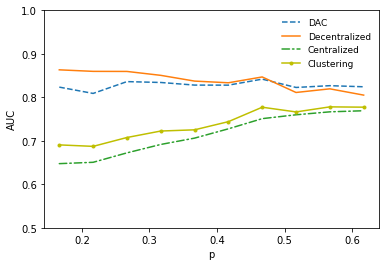

In [46]:
plt.plot(list_p, auc_alg,"--",label = 'DAC')
plt.plot(list_p, auc_b1,'',label = 'Decentralized')
plt.plot(list_p, auc_b2,linestyle=(0, (5, 2, 1, 2)), dash_capstyle='round',label = 'Centralized')
plt.plot(list_p, auc_clus,'y-o',markersize=3,label = 'Clustering')

plt.legend(loc='best',frameon=False,prop={'size': 9})
plt.xlabel('p')
plt.ylabel('AUC')
plt.ylim(0.5,1.0)
plt.show()

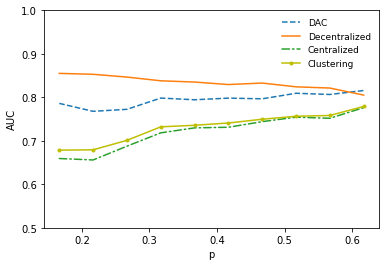

In [22]:
plt.plot(list_p, auc_alg,"--",label = 'DAC')
plt.plot(list_p, auc_b1,'',label = 'Decentralized')
plt.plot(list_p, auc_b2,linestyle=(0, (5, 2, 1, 2)), dash_capstyle='round',label = 'Centralized')
plt.plot(list_p, auc_clus,'y-o',markersize=3,label = 'Clustering')

plt.legend(loc='best',frameon=False,prop={'size': 9})
plt.xlabel('p')
plt.ylabel('AUC')
plt.ylim(0.5,1.0)
plt.show()

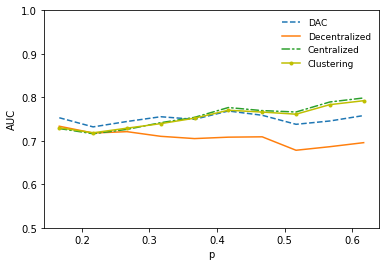

In [18]:

plt.plot(list_p, auc_alg,"--",label = 'DAC')
plt.plot(list_p, auc_b1,'',label = 'Decentralized')
plt.plot(list_p, auc_b2,linestyle=(0, (5, 2, 1, 2)), dash_capstyle='round',label = 'Centralized')
plt.plot(list_p, auc_clus,'y-o',markersize=3,label = 'Clustering')

plt.legend(loc='best',frameon=False,prop={'size': 9})
plt.xlabel('p')
plt.ylabel('AUC')
plt.ylim(0.5,1.0)
plt.show()

## Q = 2/3

In [38]:
obs = 40
n =10

In [39]:
auc_alg, auc_b1, auc_b2, auc_clus = [], [], [], []

q = 2/3
list_p = list(np.linspace(1/6,1-q,num=10,endpoint=False))

for p in list_p:

    result_1, result_2, result_3, result_4,result_5 = fit_models_upd(0.9,0.6,"bfgs")

    auc_alg.append(result_1)
    auc_b1.append(result_2)
    auc_b2.append(result_3)
    auc_clus.append(result_4)
    
    print('trial:', p)

False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
         Current function value: 0.365633
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.247622
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.436665
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.376028
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.375838
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.680017
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.651932
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
         Current function value: 0.332381
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.418373
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
        

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.453919
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.317715
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.600855
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.627625
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.335700
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
         Current function value: 0.369599
         Iteratio

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.338009
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.236245
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.420453
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.268134
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.280555
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.367465
         Iterations: 40
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.292824
         Iterations: 39
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.241265
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.188530
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.325447
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.345314
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.392270
         Iterations: 37
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.393139
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.105760
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.366343
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.302879
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.000015
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.128235
         Iterations: 55
         Function evaluations: 56
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.370069
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.502153
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.255799
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.284828
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.198805
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.419065
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.146972
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.380706
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.505974
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.206357
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.514588
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.445157
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.454424
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.545022
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.528071
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.534812
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'sku'}
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'dept', 2: 'dept', 3:

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.413903
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.435731
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
False
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'clus'}
         Current function value: 0.310585
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.216764
         Iterations: 45
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.329852
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.655033
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.460703
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.379748
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.363385
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.552907
         Iterations: 34
         Function evaluations: 35
         Gradient eval

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.625317
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.333785
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.446899
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.441623
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.201887
         Iterations: 43
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.535159
         Iterations: 31
         Function evaluations: 33
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'av

Optimization terminated successfully.
         Current function value: 0.289086
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.413036
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000046
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.000023
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.402908
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 34
         Function evaluations: 35
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.615064
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.564491
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'clus'}
         Current function value: 0.443633
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.384283
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.523192
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.404421
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.650224
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.612867
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.640765
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'sku'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'sku'}
         Current function value: 0.392355
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101


/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.315555
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.247782
         Iterations: 40
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.198090
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.424908
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.592884
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.280374
         Iterations: 40
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow

Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.194794
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.356642
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
         Current function value: 0.354857
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.377796
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.441099
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.383668
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.483937
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.411725
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.449062
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.362519
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.101061
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.391526
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.526703
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.187233
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.325567
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.340860
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.378454
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.395606
         Iterations: 100
         Function evaluations: 103
         Gradient evaluations: 103
Optimization terminated successfully.
         Current function value: 0.642786
         Iterations: 21
         Function evaluations: 23
         Gradient evaluations: 23
Optimization terminated successfully.
         Current function value: 0.618431
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.655236
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.420140
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.504570
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.644456
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.385409
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.325334
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimiza

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.313137
         Iterations: 91
         Function evaluations: 92
         Gradient evaluations: 92
Optimization terminated successfully.
         Current function value: 0.348897
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.318350
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.369646
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'sku'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'sku'}
         Current function value: 0.385344
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.373296
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.557241
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.437793
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.577716
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'dept'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.291450
         Iterations: 66
         Function evaluations: 67
         Gradient evaluations: 6

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.523566
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'clus'}
         Current function value: 0.381581
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.618035
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.206383
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.390612
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.532142
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.453819
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.494654
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'sku'}
False
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
         Current function value: 0.323812
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfull

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

Optimization terminated successfully.
         Current function value: 0.560771
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.491268
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'clus'}
         Current function value: 0.385289
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.407688
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.286461
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.257803
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.426406
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.076134
         Iterations: 56
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.346508
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.384093
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 29
         Function evaluations: 30
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.350457
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.462592
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.301213
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.489108
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.508423
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.390695
         Iterations: 39
         Function evaluations: 40
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.593077
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.603150
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'sku'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.470924
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.292368
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.162783
         Iterations: 50
         Function evaluations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

Optimization terminated successfully.
         Current function value: 0.643208
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.444178
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
         Current function value: 0.347844
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.221057
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.425401
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.344802
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.216774
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.282889
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.080202
         Iterations: 63
         Function evaluations: 64
         Gradient evaluations: 64
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 29
         Function evaluations: 30
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.315397
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.467082
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.268591
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.238953
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
         Current function value: 0.299093
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.304558
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.378192
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.274036
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.345812
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.092264
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.378011
         Iterations: 40
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

         Current function value: 0.278744
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.151994
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.264819
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.433936
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.253647
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 42
         Function evaluations: 44
         Gradient evaluations: 44
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.350226
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.159785
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.267016
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.193107
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.419493
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.222032
         Iterations: 46
         Function evaluations: 47
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed t

Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.116007
         Iterations: 53
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 58
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value: 0.169176
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
         Current function value: 0.145403
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.154730
         Iterations: 46
         Function evaluations: 48
         Gradient evaluations: 48
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.478463
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.091683
         Iterations: 60
         Function evaluations: 61
         Gradient evaluations: 61
         Current function value: 0.412964
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.614370
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.421275
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.662177
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.668404
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.650414
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.226348
         Iterations: 66
         Function evaluations: 67
         Gradient evaluations: 67
Optimization terminated successfully.
         Current function value: 0.256304
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.119192
         Iterations: 51
         Function evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


{0: 'clus', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'sku'}
False
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'clus'}
         Current function value: 0.275163
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.396606
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.000048
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.244702
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.215330
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optim

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.413974
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value: 0.354856
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.282289
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.225427
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.278392
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated succ

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 71
         Function evaluations: 72
         Gradient evaluations: 72
Optimization terminated successfully.
         Current function value: 0.234638
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.527519
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.166554
         Iterations: 46
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.485050
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.398384
         Iterations: 39
         Function evaluations: 40
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed

Optimization terminated successfully.
         Current function value: 0.208784
         Iterations: 88
         Function evaluations: 89
         Gradient evaluations: 89
Optimization terminated successfully.
         Current function value: 0.233665
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.237288
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.200405
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
False
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
         Current function value: 0.383470
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 10

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.570897
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.552821
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'sku'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'sku'}
         Current function value: 0.368897
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.281665
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.000038
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.310913
         Iterations: 62
         Function evaluations: 63
         Gradient evaluations: 63
Optimization terminated successfully.
         Current function value: 0.172161
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.273015
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 61
         Function evaluations: 62
         Gradient evaluations: 62
Optimization terminated successfully.
         Current function value: 0.300999
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 59
         Function evaluations: 60
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.414464
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.515410
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.400812
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.212527
         Iterations: 42
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.543537
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.376215
         Iterations: 34
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.148894
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.276789
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.423237
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.487484
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.310209
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.517319
         Iterations: 79
         Function evaluations: 80
         Gradient evaluations: 80
Optimization terminated successfully.
         Current function value: 0.555121
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.416181
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.651076
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'sku'}
False
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'dept'}
         Current function value: 0.316183
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 10

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.548522
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.602614
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.339155
         Iterations: 82
         Function evaluations: 83
         Gradient evaluations: 83
Optimization terminated successfully.
         Current function value: 0.229232
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.399197
         Iterations: 35
         Function evaluations:

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.522248
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.515811
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.431356
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.510171
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.551912
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.247553
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.176514
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.349870
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.279963
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.534381
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.154442
         Iterations: 52
         Function evaluations: 53
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.430000
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
         Current function value: 0.336773
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.583620
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.596063
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.530847
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'sku'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'sku'}
         Current function value: 0.361729
         Iteratio

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.611988
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.504213
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'sku'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'sku'}
         Current function value: 0.383288
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.336540
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.328860
         Iterations: 33
    

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


{0: 'clus', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'dept'}
         Current function value: 0.342240
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.196664
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.367031
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.506025
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function v

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed t

Optimization terminated successfully.
         Current function value: 0.533689
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.370682
         Iterations: 63
         Function evaluations: 64
         Gradient evaluations: 64
Optimization terminated successfully.
         Current function value: 0.203195
         Iterations: 46
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.418283
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.392755
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


         Current function value: 0.366006
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.314866
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.405180
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.530425
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.267820
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.217263
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.313175
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.481707
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.142633
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.096124
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.485357
         Iterations: 35
         Function evaluations: 36
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: 

Optimization terminated successfully.
         Current function value: 0.329320
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.258064
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.235618
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.343521
         Iterations: 40
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.346498
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.376190
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.289626
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.389629
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'clus'}
         Current function value: 0.241122
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successf

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.376169
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.285047
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.232866
         Iterations: 41
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.460712
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.377003
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.402570
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.141507
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.307747
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.349507
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.503557
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.443383
         Iterations: 33
         Function evaluations: 35
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.305832
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
         Current function value: 0.346022
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.469343
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.424861
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.476885
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'clus'}
         Current function value: 0.326891
         Iteratio

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.332003
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.619208
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.582593
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.624523
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.301109
         Iterations: 72
         Function evaluations: 73
         Gradient evaluations: 73
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.393857
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.436192
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.319491
         Iterations: 68
         Function evaluations: 69
         Gradient evaluations: 69
Optimization terminated successfully.
         Current function value: 0.246767
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.246556
         Iterations: 40
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.155917
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.270446
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.380659
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.276904
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.177134
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.146204
         Iterations: 48
         Function evaluations: 50
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.517930
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.383240
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.119217
         Iterations: 52
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.148166
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.285887
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.383315
         Iterations: 36
         Function evaluations: 38
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

Optimization terminated successfully.
         Current function value: 0.000039
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.406593
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.529112
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.520146
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.311681
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.524507
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.294759
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
         Current function value: 0.266569
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.604483
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.485634
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.627509
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
         Current function value: 0.355083
         Iteratio

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.623571
         Iterations: 39
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.673553
         Iterations: 16
         Function evaluations: 18
         Gradient evaluations: 18
Optimization terminated successfully.
         Current function value: 0.636327
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.675820
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
trial: 0.16666666666666666
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.348142
         Iterations: 62
         Function evaluations: 63
         Gradient evaluations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

Optimization terminated successfully.
         Current function value: 0.445832
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.422901
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'clus'}
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'clus'}
         Current function value: 0.354989
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.443848
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.129946
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current functi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.319410
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.190082
         Iterations: 45
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.556659
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.472371
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.134074
         Iterations: 51
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.322875
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.619083
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'sku'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'sku'}
         Current function value: 0.387628
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.209360
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.515671
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.429084
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.626502
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.535638
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'dept'}
         Current function value: 0.309984
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.358461
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.358184
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)



Optimization terminated successfully.
         Current function value: 0.405368
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.429923
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.561800
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.317827
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
         Current function value: 0.440016
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.625236
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Op

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.507968
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.587418
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.587418
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.577987
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.486759
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
         Current functio

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.483000
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.487400
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.317467
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.477898
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.457892
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.211519
         Iterations: 46
         Function evaluations: 47
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.107088
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.233998
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.329405
         Iterations: 97
         Function evaluations: 98
         Gradient evaluations: 98
Optimization terminated successfully.
         Current function value: 0.358522
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.349748
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.345765
         Iterations: 38
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.487049
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.451658
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
         Current function value: 0.365093
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.281907
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.205512
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.130691
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.333004
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.115495
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.112183
         Iterations: 54
         Function evaluations: 55
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.357173
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.504347
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.317627
         Iterations: 41
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.263481
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.139585
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.436870
         Iterations: 39
         Function evaluations: 40
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 45
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.151187
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
         Current function value: 0.269806
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.281591
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.261850
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.466645
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.364226
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'sku'}
False
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'sku'}
False
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'sku'}
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
         Current function value: 0.392793
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.315345
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Curren

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.214224
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.364698
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.335930
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.343269
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.505352
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.496701
         Iterations: 34
         Function evaluations: 35
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.414022
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.237973
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.452657
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.566124
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.178265
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.389015
         Iterations: 38
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.142772
         Iterations: 49
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.217052
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.173129
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.166549
         Iterations: 49
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.258755
         Iterations: 47
         Function evaluations: 48
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.215328
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.310312
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.477804
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.120585
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.483789
         Iterations: 35
         Function evaluations: 36
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.448064
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.215331
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.123731
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.186781
         Iterations: 42
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.176504
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
         Current function value: 0.277052
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.454385
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.235605
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.360774
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
         Current function value: 0.271309
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.363605
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.090086
         Iterations: 62
         Function evaluations: 63
         Gradient evaluations: 63
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
         Current function value: 0.213123
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.082159
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.223758
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.253573
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.319278
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.305574
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.305574
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.338987
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.219171
         Iterations: 42
         Function evaluations: 44
         Gradient evaluations: 44
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'sku'}
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus',

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.599351
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.665541
         Iterations: 21
         Function evaluations: 23
         Gradient evaluations: 23
False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'clus'}
         Current function value: 0.412589
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.346959
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.489319
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.353291
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.236629
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.487872
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.350271
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.000017
         Iterations: 71
         Function evaluations: 72
         Gradient evaluations: 72
Optimization terminated successfully.
         Current function value: 0.265351
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.328585
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.084017
         Iterations: 65
         Function evaluations: 66
         Gradient evaluations: 66
Optimization terminated successfully.
         Current function value: 0.131324
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.544167
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.423002
         Iterations: 37
         Function evaluations: 38
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.243929
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.584464
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.624557
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.385671
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.381087
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.518790
         Iterations: 36
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.263627
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.335673
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.239851
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.000019
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.113762
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.242350
         Iterations: 42
         Function evaluations: 44
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.177553
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.481307
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.357920
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.280808
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.387083
         Iterations: 39
         Function evaluations: 40
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.245539
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.467931
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.439776
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.445690
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.458395
         Iterations: 50
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.631418
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.607215
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'sku'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'dept'}
False
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.308840
         Iterations: 62
         Function evaluations: 63
         Gradient evaluations: 63
Optimization terminated successfully.
         Current function value: 0.000017
         Iterations: 62
         Function evaluations: 64
         Gradient evaluations: 64
Optimization

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.451530
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.484642
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.261917
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.281684
         Iterations: 38
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.437823
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.281093
         Iterations: 40
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.411906
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.331777
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.511833
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.327029
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
         Current function value: 0.403303
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.585567
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'av

Optimization terminated successfully.
         Current function value: 0.222424
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.425214
         Iterations: 82
         Function evaluations: 83
         Gradient evaluations: 83
Optimization terminated successfully.
         Current function value: 0.450016
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.440229
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.431662
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.301516
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.568962
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.650380
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.402045
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'clus'}
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
         Current function value: 0.369942
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_m

Optimization terminated successfully.
         Current function value: 0.319130
         Iterations: 39
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.493431
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'clus'}
         Current function value: 0.306148
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.227514
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current functi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.498321
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.370524
         Iterations: 67
         Function evaluations: 68
         Gradient evaluations: 68
Optimization terminated successfully.
         Current function value: 0.402179
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 66
         Function evaluations: 67
         Gradient evaluations: 67
Optimization terminated successfully.
         Current function value: 0.127694
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.575824
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.256658
         Iterations: 64
         Function evaluations: 65
         Gradient evaluations: 65
Optimization terminated successfully.
         Current function value: 0.137020
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 40
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.096434
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.155413
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.308141
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.256222
         Iterations: 88
         Function evaluations: 89
         Gradient evaluations: 89
Optimization terminated successfully.
         Current function value: 0.313248
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.200668
         Iterations: 44
         Function evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.406441
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.439940
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'clus'}
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.402407
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.264835
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.387707
         Iterations: 38
         Function evaluations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

         Current function value: 0.374626
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.226781
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.354880
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.139956
         Iterations: 48
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.161514
         Iterations: 49
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.249795
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.329011
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.522337
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.373350
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.305424
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.600516
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.512052
         Iterations: 35
         Function evaluations: 36
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.352194
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.443929
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.441773
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.423418
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.348745
         Iterations: 96
         Function evaluations: 97
         Gradient evaluations: 97
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.332321
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.627176
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.627804
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.579737
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.459423
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.580602
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.591693
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.430804
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
         Current function value: 0.354764
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000023
         Iterations: 68
         Function evaluations: 71
         Gradient evaluations: 71
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.529543
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.604896
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'dept'}
         Current function value: 0.415459
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.563189
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.327983
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.640192
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'sku'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.365842
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.495978
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.258509
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.310308
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000031
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.278907
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.345314
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.137399
         Iterations: 53
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.191315
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.289946
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.167726
         Iterations: 46
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.250788
         Iterations: 39
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.155648
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.249440
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.322793
         Iterations: 39
         Function evaluations: 40
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.454925
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.489225
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.433793
         Iterations: 82
         Function evaluations: 83
         Gradient evaluations: 83
Optimization terminated successfully.
         Current function value: 0.512037
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.514747
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.474420
         Iterations: 35
         Function evaluations: 36
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.347693
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.660050
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.659123
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.614766
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.393592
         Iterations: 63
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

         Current function value: 0.237527
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.323496
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.000019
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.364013
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.099693
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.244551
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.623085
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.333025
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000016
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.402818
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.506493
         Iterations: 75
         Function evaluations: 76
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.178754
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.378518
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.367781
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
         Current function value: 0.467857
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.679245
         Iterations: 21
         Function evaluations: 23
         Gradient evaluations: 23
Optimization terminated successfully.
         Current function value: 0.668516
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.412312
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.576027
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.593809
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.535813
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.332823
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.253369
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.440189
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'clus'}
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'clus'}
         Current function value: 0.396011
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.480428
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.511666
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current functi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'av

Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.426305
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.266492
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.256915
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
         Current function value: 0.384954
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.529690
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.264162
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.270581
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.047489
         Iterations: 69
         Function evaluations: 70
         Gradient evaluations: 70
Optimization terminated successfully.
         Current function value: 0.305967
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.358520
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed

Optimization terminated successfully.
         Current function value: 0.393975
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.412495
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000024
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'sku'}
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'sku'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'sku'}
         Current function value: 0.484764
         Iterations: 100
         Function evaluations: 101
         Gradient eval

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.419019
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'clus'}
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'clus'}
         Current function value: 0.439181
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.506506
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.437984
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.408688
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.626631
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.660880
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.355960
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value: 0.474702
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.405670
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.482618
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.446133
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.383362
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.437716
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.351942
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.288037
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.265298
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.312651
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.343714
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
         Current function value: 0.303277
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.624682
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.402906
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.488095
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.346829
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.524631
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.417213
         Iterations: 43
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.256344
         Iterations: 65
         Function evaluations: 66
         Gradient evaluations: 66
Optimization terminated successfully.
         Current function value: 0.279526
         Iterations: 28
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.291212
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.355346
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.096564
         Iterations: 61
         Function evaluations: 62
         Gradient evaluations: 62
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.149586
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.188243
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.394660
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.367497
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000053
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.265929
         Iterations: 43
         Function evaluations: 44
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.473977
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.471510
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.514234
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.350688
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.622451
         Iterations: 32
         Function evaluations: 33
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.338192
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.286283
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.394127
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.325260
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.188021
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.302360
         Iterations: 43
         Function evaluations: 44
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.285366
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.449392
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'clus'}
         Current function value: 0.290809
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.336569
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000029
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.309279
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.416407
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.209387
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'sku'}
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.408590
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.244315
         Iterations: 46
         Function evaluations:

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.413522
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.264831
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.327389
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.322149
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.224742
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.249329
         Iterations: 45
         Function evaluations: 46
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.592484
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.305454
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.211625
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.451136
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.441817
         Iterations: 99
         Function evaluations: 100
         Gradient evaluations: 100
Optimization terminated successfully.
         Current function value: 0.517571
         Iterations: 29
         Function evaluations: 30


/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.419586
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.234614
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.204959
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
         Current function value: 0.355473
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.556559
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.366528
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.497431
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.521616
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.373951
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.152938
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.319742
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


         Current function value: 0.373352
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.543097
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.288323
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.156904
         Iterations: 49
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.330101
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.318821
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.373025
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.417718
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.301417
         Iterations: 39
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.386137
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.477953
         Iterations: 33
         Function evaluations: 35
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.294864
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.375278
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.599942
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.339819
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.609527
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.643132
         Iterations: 27
   

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.512058
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.535757
         Iterations: 70
         Function evaluations: 71
         Gradient evaluations: 71
Optimization terminated successfully.
         Current function value: 0.582954
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.594061
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.449769
         Iterations: 36
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.308854
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.217010
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.213635
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.221904
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.313965
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.235028
         Iterations: 44
         Function evaluations: 45
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'av

Optimization terminated successfully.
         Current function value: 0.315947
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.389037
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.191593
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.450621
         Iterations: 81
         Function evaluations: 82
         Gradient evaluations: 82
Optimization terminated successfully.
         Current function value: 0.494342
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.453773
         Iterations: 30
         Function evaluations: 31
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.279274
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.303572
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
         Current function value: 0.309733
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.463786
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.453064
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.453480
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.422730
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.508128
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'clus'}
         Current function value: 0.309131
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.300161
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

         Current function value: 0.359920
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.157308
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.171647
         Iterations: 43
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.449061
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.206174
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.493557
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.281182
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.096144
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.284859
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.359426
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.131032
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.216015
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.614351
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.656784
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.622770
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.571517
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'sku'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'sku'}
         Current function value: 0.282685
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 1

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.626876
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.570062
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.284622
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value: 0.286512
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.218409
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.182537
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.369001
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.244889
         Iterations: 40
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.326421
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.381668
         Iterations: 39
         Function evaluations: 40
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.295711
         Iterations: 43
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.257874
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.156697
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.203316
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.181125
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.335180
         Iterations: 43
         Function evaluations: 44
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.343340
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
         Current function value: 0.279360
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.541160
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.353766
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.525299
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'sku'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.663505
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.641848
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.626932
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'dept'}
         Current function value: 0.243996
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.340659
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.469233
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.289211
         Iterations: 74
         Function evaluations: 75
         Gradient evaluations: 75
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.195849
         Iterations: 41
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.322602
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.365492
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 44
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.096180
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.208277
         Iterations: 47
         Function evaluations: 48
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.433116
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.412555
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.322612
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.155009
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.332366
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.319746
         Iterations: 31
         Function evaluations: 32
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.248547
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.222295
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.334570
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.478049
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.431664
         Iterations: 37
         Function evaluations: 38
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.275362
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.339653
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.179806
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.459985
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.216142
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 44
         Function evaluations: 45
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.000054
         Iterations: 60
         Function evaluations: 61
         Gradient evaluations: 61
Optimization terminated successfully.
         Current function value: 0.364582
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.246013
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.169034
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.254218
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.106826
         Iterations: 57
         Function evaluations: 58
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.000032
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.468628
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.202598
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.129524
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.099341
         Iterations: 54
         Function evaluations: 55
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.357088
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.525227
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.362527
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.369638
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.370752
         Iterations: 37
         Function evaluations: 38
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.318284
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.328888
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.354137
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.211793
         Iterations: 44
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.321018
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.417292
         Iterations: 35
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.240734
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.290560
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.276986
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.000061
         Iterations: 21
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
         Current function value: 0.358274
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.444661
         Iterations: 34
         Function evaluations: 36
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.291847
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.373017
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.347201
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.414881
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.501929
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.349362
         Iterations: 44
         Function evaluations: 45
  

         Current function value: 0.450776
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.600730
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.565106
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.564337
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.406124
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.418666
         Iterations: 60
         Function evaluations: 61
         Gradient evaluations: 61
Optimization terminated successfully.
         Current function value: 0.433915
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.456164
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.378424
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'sku'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'sku'}
         Current function value: 0.359664
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.355212
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.474388
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.499281
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.113373
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
False
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'clus'}
         Current function value: 0.365542
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.458102
         Itera

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.354780
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.256483
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
         Current function value: 0.399782
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.648760
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.618201
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: 

Optimization terminated successfully.
         Current function value: 0.139499
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.169970
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.294841
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.396596
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 58
         Function evaluations: 59
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.336331
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'clus'}
False
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'dept'}
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'dept'}
         Current function value: 0.305039
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.168507
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.377996
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.299836
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.342720
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.647146
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.638912
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.630705
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'sku'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'sku'}
False
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'dept'}
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'cl

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.351298
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.433607
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.430187
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.414181
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.337442
         Iterations: 68
         Function evaluations: 69
         Gradient evaluations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


         Current function value: 0.426984
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.481329
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.447183
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.517648
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.363275
         Iterations: 68
         Function evaluations: 69
         Gradient evaluations: 69
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.377858
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.500052
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.451235
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.520046
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.325804
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


         Current function value: 0.294407
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.608496
         Iterations: 23
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.574830
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.607463
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
      

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.415621
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.465136
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.406787
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.473735
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'dept'}
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'dept'}
         Current function value: 0.360598
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.434955
         Iteration

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.459216
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.651642
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.643771
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.511778
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.350956
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


         Current function value: 0.529467
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.580709
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.566354
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.565896
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
         Current function value: 0.334199
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successf

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


         Current function value: 0.349577
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.557153
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.516310
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.567283
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.383014
         Iterations: 74
         Function evaluations: 75
         Gradient evaluations: 75
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


         Current function value: 0.392855
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.558281
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.475032
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.576862
         Iterations: 21
         Function evaluations: 22
         Gradient evaluations: 22
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'dept'}
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
       

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value: 0.590211
         Iterations: 93
         Function evaluations: 94
         Gradient evaluations: 94
Optimization terminated successfully.
         Current function value: 0.659457
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.630245
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.245482
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
False
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'sku'}
{0: 'clus', 1: 'dep

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'av

Optimization terminated successfully.
         Current function value: 0.000067
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.482387
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000036
         Iterations: 53
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.189319
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.341249
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 43
         Function evaluations: 44
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000043
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.278482
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.333759
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.313107
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.336321
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.182486
         Iterations: 48
         Function evaluations: 49
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.512491
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.457465
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
False
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'clus'}
         Current function value: 0.328588
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.370365
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.327321
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.465177
         Iterations: 83
         Function evaluations: 84
         Gradient evaluations: 84
Optimization terminated successfully.
         Current function value: 0.480591
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.352414
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.496510
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'clus'}
         Current function value: 0.341191
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.443633
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.310711
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.482119
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.442320
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.513914
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'clus'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'clus', 4: 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.484376
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.094143
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.186818
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.253946
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.127981
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.302888
         Iterations: 42
         Function evaluations: 43
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.593877
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.497418
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.431017
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.146287
         Iterations: 47
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value:

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.517863
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.569423
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.455337
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.344711
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.116121
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


         Current function value: 0.366042
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.654283
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.445463
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.677034
         Iterations: 21
         Function evaluations: 23
         Gradient evaluations: 23
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'sku'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'clus'}
         Current function value: 0.391601
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfull

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

         Current function value: 0.404951
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.540548
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.287226
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.579463
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.436708
         Iterations: 53
 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.423931
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.559377
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.544287
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.475242
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.249615
         Iterations: 76
         Function evaluations: 77
         Gradient evaluations: 77
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInve

         Current function value: 0.210067
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.391773
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.312157
         Iterations: 39
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.414070
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.301593
         Iterations: 69
         Function evaluations: 70
         Gradient evaluations: 70
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


         Current function value: 0.361282
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.385779
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.325750
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.409596
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.445166
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.413229
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.466007
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.417785
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.492731
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.364026
         Iterations: 70
         Function evaluations: 71
         Gradient evaluations: 71
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.497390
         Iterations: 73
         Function evaluations: 74
         Gradient evaluations: 74
Optimization terminated successfully.
         Current function value: 0.528213
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.553332
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.439331
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.406963
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.500027
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.498072
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.496149
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'sku'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'sku'}
         Current function value: 0.235331
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000015
         Iterations: 58
         Function evaluations: 61
   

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.255374
         Iterations: 40
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.493545
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.493545
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.290528
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.533960
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed t

         Current function value: 0.618684
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.681952
         Iterations: 23
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.640843
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.553574
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.257659
         Iterations: 65
         Function evaluations: 66
         Gradient evaluations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.291184
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.647211
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.157170
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.642191
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'sku'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'sku'}
Optimization terminated successfully.
         Current function value: 0.304390
         Iterations: 95
         Function evaluations: 96
         Gradient evaluations: 96
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.239663
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.443488
         Iterations: 67
         Function evaluations: 68
         Gradient evaluations: 68
Optimization terminated successfully.
         Current function value: 0.470821
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.447035
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.490471
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'clus'}
{0: 'clus', 1: 'sk

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.243763
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.303754
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.440883
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.385878
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.249270
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.419859
         Iterations: 30
         Function evaluations: 31
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.651206
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.649312
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.644137
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.289081
         Iterations: 69
         Function evaluations: 70
         Gradient evaluations: 70
Optimization terminated successfully.
         Current function value: 0.265167
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.265094
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
         Current function value: 0.351979
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.604582
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.612423
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.540867
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'sku'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dep

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed

Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 65
         Function evaluations: 67
         Gradient evaluations: 67
Optimization terminated successfully.
         Current function value: 0.000017
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.538315
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.492251
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.603036
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.297369
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.220117
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.594500
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.174205
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.237098
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.356392
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.413090
         Iterations: 39
         Function evaluations: 40
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.335661
         Iterations: 95
         Function evaluations: 96
         Gradient evaluations: 96
Optimization terminated successfully.
         Current function value: 0.289981
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.206824
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.106972
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.212957
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.400851
         Iterations: 38
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.454791
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.404384
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'clus'}
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'sku'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'sku'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.340521
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value: 0.399466
         Iterations: 39
         Function 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


         Current function value: 0.339881
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.536332
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.514602
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.544264
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
trial: 0.2
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'sku'}
False
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


         Current function value: 0.295322
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.643247
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.589150
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.561290
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.294688
         Iterations: 83
         Function evaluations: 84
         Gradient evaluations: 84
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.486023
         Iterations: 85
         Function evaluations: 86
         Gradient evaluations: 86
Optimization terminated successfully.
         Current function value: 0.533023
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.521384
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.548827
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.364433
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


         Current function value: 0.269978
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.575251
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.525302
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.626522
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.480908
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations:

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.480944
         Iterations: 68
         Function evaluations: 69
         Gradient evaluations: 69
Optimization terminated successfully.
         Current function value: 0.492667
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.434565
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.514742
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.442204
         Iterations: 60
         Function evaluations: 62
         Gradient evaluations: 62
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.500044
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.554869
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.519054
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.565367
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'sku'}
False
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
         Current function value: 0.446865
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.434383
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.653713
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.613340
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.657083
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'clus'}
False
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'clus'}
False
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'clus'}
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         C

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.316639
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.331556
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.321739
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.300523
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'dept'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.375383
         Iterations: 68
         Function evaluations: 69
         Gradient evaluations:

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.158118
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
         Current function value: 0.278137
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.449480
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.488395
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.264054
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'clus'}
         Current function value: 0.306575
         Iteratio

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.320911
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.260088
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.103431
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.405223
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.550453
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.282017
         Iterations: 41
         Function evaluations: 42
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.589011
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.163514
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.000030
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.243494
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.412800
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.363724
         Iterations: 40
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.185676
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.674894
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.631922
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.583633
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'clus'}
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'clus'}
         Current function value: 0.275421
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.297425
         Iterati

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.000065
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.329407
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.365238
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
         Current function value: 0.329989
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.655912
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.635286
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.362932
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.519732
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.508593
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.219787
         Iterations: 42
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.285854
         Iterations: 45
         Function evaluations: 46
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.377959
         Iterations: 65
         Function evaluations: 66
         Gradient evaluations: 66
Optimization terminated successfully.
         Current function value: 0.595705
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.571621
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.454732
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.272606
         Iterations: 44
         Function evaluations: 45
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.304723
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.444326
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.307265
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.397199
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.207860
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.320029
         Iterations: 42
         Function evaluations: 43
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.406585
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.340185
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.215349
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.449600
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.547974
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.382168
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed

         Current function value: 0.108910
         Iterations: 100
         Function evaluations: 103
         Gradient evaluations: 103
Optimization terminated successfully.
         Current function value: 0.225979
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.223295
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.224738
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.330218
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.387494
         Iterations: 68
         Function evaluations: 69
         Gradient evaluations: 69
Optimization terminated successfully.
         Current function value: 0.395841
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.402007
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.355835
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.274909
         Iterations: 60
         Function evaluations: 61
         Gradient evaluations: 61
Optimization terminated successfully.
         Current funct

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.519598
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.519247
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.215848
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.429481
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.395361
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.092453
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value: 0.395452
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.070489
         Iterations: 63
         Function evaluations: 64
         Gradient evaluations: 64
Optimization terminated successfully.
         Current function value: 0.365481
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.378212
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.329149
         Iterations: 41
         Function evaluations: 42
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.589800
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.639215
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.376456
         Iterations: 63
         Function evaluations: 64
         Gradient evaluations: 64
Optimization terminated successfully.
         Current function value: 0.551813
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 31
         Function evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'clus'}
         Current function value: 0.328638
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.401099
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.484444
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.256779
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.350894
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.443426
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.265830
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.331792
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.399172
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.134951
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.405673
         Iterations: 37
         Function evaluations: 38
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.487222
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.440929
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.504022
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.414240
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.166112
         Iterations: 49
         Function evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.352152
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
         Current function value: 0.333039
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.539544
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.539726
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.497066
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'clus'}
         Current function value: 0.389041
         Iteratio

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.530374
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.446829
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.441573
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.452755
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.229550
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 44
         Function evaluations: 45
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.385945
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.189089
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.297503
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.421469
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.330492
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.000027
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.495295
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000015
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.413791
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.112208
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.000015
         Iterations: 84
         Function evaluations: 85
         Gradient evaluations: 85
Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 46
         Function evaluations: 48
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', H

Optimization terminated successfully.
         Current function value: 0.000022
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.265125
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.491701
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.319137
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.280910
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.460572
         Iterations: 36
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.273664
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.467638
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000033
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 64
         Function evaluations: 65
         Gradient evaluations: 65
Optimization terminated successfully.
         Current function value: 0.542149
         Iterations: 33
         Function evaluations: 34
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.333532
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.000021
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.467332
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.404997
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 25
         Function evaluations: 26
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.000032
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.374674
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.413150
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.142361
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.261700
         Iterations: 44
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.262011
         Iterations: 42
         Function evaluations: 43
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.418597
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.283590
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.138569
         Iterations: 41
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.330577
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.288581
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.217172
         Iterations: 47
         Function evaluations: 48
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.558126
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.431216
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.405472
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.586257
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimizat

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.265135
         Iterations: 63
         Function evaluations: 64
         Gradient evaluations: 64
Optimization terminated successfully.
         Current function value: 0.223743
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.262846
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.139737
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.408681
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 52
         Function evaluations: 53
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed

Optimization terminated successfully.
         Current function value: 0.424499
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.199379
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.000025
         Iterations: 48
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.213399
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.607176
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.251070
         Iterations: 44
         Function evaluations: 45
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.000025
         Iterations: 48
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.566083
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'sku'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.383292
         Iterations: 68
         Function evaluations: 69
         Gradient evaluations: 69
Optimization terminated successfully.
         Current function value: 0.221614
         Iterations: 45
         Function evaluations: 47
         Gradient evaluations: 47
Optimizati

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


         Current function value: 0.410377
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.472783
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.485814
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.400701
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
         Current function value: 0.320647
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.258891
         Itera

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.336670
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
         Current function value: 0.371353
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.518587
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.533061
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.258891
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}


/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.386276
         Iterations: 46
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.196901
         Iterations: 43
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.423344
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.349093
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.143269
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.313937
         Iterations: 41
         Function evaluations: 42
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


         Current function value: 0.291033
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.389026
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.330501
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.420219
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.257646
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


         Current function value: 0.234528
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.311229
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.317608
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.069342
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
False
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.403938
         Iterations: 96
         Function evaluations: 97
         Gradient evaluations: 97
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.316229
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.479385
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.414881
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.335332
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.430799
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.206115
         Iterations: 45
         Function evaluations: 47
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.150691
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.000032
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.188813
         Iterations: 45
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.335924
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.378646
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.386841
         Iterations: 37
         Function evaluations: 38
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.556665
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.619240
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.609441
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.603594
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'clus'}
         Current function value: 0.270588
         Iterations: 100
         Function evaluations: 101
     

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.305402
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.249050
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.346527
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.373896
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.283366
         Iterations: 39
         Function evaluations: 41
         Gradient evaluations: 41
         Current function value: 0.394276
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.131362
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.424870
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.101786
         Iterations: 55
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.377075
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.216620
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.136956
         Iterations: 51
         Function evaluations: 52
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.311167
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.338550
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.282061
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.411311
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.331311
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.449310
         Iterations: 37
         Function evaluations: 38
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

         Current function value: 0.206642
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000017
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.265324
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.111915
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.000039
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.353067
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.163289
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.234457
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.315780
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.568593
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.285550
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.374141
         Iterations: 31
         Function evaluations: 32
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


         Current function value: 0.382750
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.464431
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.364451
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.503114
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.362038
         Iterations: 67
         Function evaluations: 68
         Gradient evaluations: 68
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.577686
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.553633
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.479898
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'clus'}
         Current function value: 0.296185
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.070793
         Iterations: 62
         Function evaluations: 64
         Gradient evaluations: 64
Optimization terminated successfully.
         Current functi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.408002
         Iterations: 96
         Function evaluations: 97
         Gradient evaluations: 97
Optimization terminated successfully.
         Current function value: 0.442073
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.377081
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.466171
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'sku'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'sku'}
         Current function value: 0.298231
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 10

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.524249
         Iterations: 86
         Function evaluations: 87
         Gradient evaluations: 87
Optimization terminated successfully.
         Current function value: 0.573946
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.453054
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.567435
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.324444
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.146181
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.215002
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.292776
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.195262
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.303215
         Iterations: 42
         Function evaluations: 43
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.392744
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.507014
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.491996
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.475121
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.556463
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.391871
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.000019
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.531725
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 65
         Function evaluations: 67
         Gradient evaluations: 67
         Current function value: 0.411732
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.565546
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.437848
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.416157
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.468554
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.237515
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.336221
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
         Current function value: 0.377990
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.375155
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.259343
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.353074
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.288823
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.437002
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.383018
         Iterations: 45
         Function evaluations: 46
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.533657
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'sku'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'sku'}
         Current function value: 0.324956
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.103046
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.354337
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.373781
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.609562
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.603070
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.351170
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.363527
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.000021
         Iterations: 56
         Function evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.596111
         Iterations: 21
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
         Current function value: 0.596111
         Iterations: 21
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
         Current function value: 0.645824
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.352421
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
False
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'clus'}
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'clus'}
         Current function value: 0.260178
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current functi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.590687
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.638278
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.461025
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'sku'}
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'sku'}
         Current function value: 0.364253
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.338789
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current functi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.527941
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.383905
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.292536
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.399115
         Iterations: 96
         Function evaluations: 98
         Gradient evaluations: 98
Optimization terminated successfully.
         Current function value: 0.622380
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.597822
         Iterations: 26
         Function evaluations: 27
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)



Optimization terminated successfully.
         Current function value: 0.350570
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
         Current function value: 0.292060
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.202927
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.271017
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.465840
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current fun

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.457895
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.560412
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.230370
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
         Current function value: 0.336990
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000017
         Iterations: 69
         Function evaluations: 73
         Gradient evaluations: 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)



         Current function value: 0.506305
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.250507
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
         Current function value: 0.346303
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.201394
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.283391
    

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.101007
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value: 0.000021
         Iterations: 42
         Function evaluations: 44
         Gradient evaluations: 44
         Current function value: 0.454260
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.629753
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.488432
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.583027
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.342134
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.246621
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.186774
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.297863
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.160815
         Iterations: 50
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.516876
         Iterations: 52
         Function evaluations: 53
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.237405
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.086697
         Iterations: 62
         Function evaluations: 63
         Gradient evaluations: 63
Optimization terminated successfully.
         Current function value: 0.557551
         Iterations: 81
         Function evaluations: 83
         Gradient evaluations: 83
Optimization terminated successfully.
         Current function value: 0.639193
         Iterations: 25
         Function evaluations: 26
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.315684
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.410022
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.168957
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.169788
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.201245
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.000017
         Iterations: 34
         Function evaluations: 35
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.420795
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.559147
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.510958
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.201490
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.433945
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.386603
         Iterations: 35
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.361718
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.659734
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.647622
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.633763
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
False
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'sku'}
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'sku'}
         Current function value: 0.390612
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.313193
         Iterati

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.196304
         Iterations: 47
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.392576
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.278937
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.145042
         Iterations: 49
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.502753
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.285987
         Iterations: 41
         Function evaluations: 42
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.599291
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.618496
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.366967
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.361371
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.526358
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.482921
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.518847
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'clus'}
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.298558
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.265263
         Iterations: 43
         Function evaluations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.449787
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.514755
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.366235
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.575274
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.296194
         Iterations: 39
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.576511
         Iterations: 85
         Function evaluations: 86
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.343692
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.340535
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.261993
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.265287
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.293464
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
         Current function value: 0.281744
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: Convergence

Optimization terminated successfully.
         Current function value: 0.463912
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.379045
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.080807
         Iterations: 61
         Function evaluations: 62
         Gradient evaluations: 62
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.000048
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.155624
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


         Current function value: 0.278379
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.360455
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.389044
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.248616
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
False
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'clus'}
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.414856
         Iterations: 57
   

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.407416
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.645280
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.630246
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.568242
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
False
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
      

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.312101
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.245564
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.340393
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
trial: 0.21666666666666667
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.419263
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.323476
         Iterations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.538202
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.530110
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.515524
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.281711
         Iterations: 63
         Function evaluations: 64
         Gradient evaluations: 64
Optimization terminated successfully.
         Current function value: 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.204680
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.232491
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.155510
         Iterations: 47
         Function evaluations: 50
         Gradient evaluations: 50
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'clus'}
         Current function value: 0.325169
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.335961
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.518147
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.274018
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.455335
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.188333
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.299480
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.216231
         Iterations: 67
         Function evaluations: 68
         Gradient evaluations: 68
Optimization terminated successfully.
         Current function value: 0.300835
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.201392
         Iterations: 45
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.000051
         Iterations: 55
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.225594
         Iterations: 47
         Function evaluations: 48
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.612850
         Iterations: 92
         Function evaluations: 94
         Gradient evaluations: 94
Optimization terminated successfully.
         Current function value: 0.681071
         Iterations: 23
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.621951
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.661556
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.346329
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.173285
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.256340
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.644283
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.644283
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.395874
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.642547
         Iterations: 23
         Function evaluations: 25
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.517200
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.468231
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.546785
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.495409
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.276173
         Iterations: 41
         Function evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.591788
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.577795
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.153705
         Iterations: 71
         Function evaluations: 73
         Gradient evaluations: 73
Optimization terminated successfully.
         Current function value: 0.000025
         Iterations: 76
         Function evaluations: 77
         Gradient evaluations: 77
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  

Optimization terminated successfully.
         Current function value: 0.596297
         Iterations: 82
         Function evaluations: 87
         Gradient evaluations: 87
Optimization terminated successfully.
         Current function value: 0.663296
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.634435
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.664866
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimiza

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


         Current function value: 0.213497
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.644969
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.628763
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.622547
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'clus'}
         Current function value: 0.295887
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.145286
         Itera

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.280586
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.448477
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.473770
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.262315
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'dept', 4:

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.252307
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 67
         Function evaluations: 68
         Gradient evaluations: 68
Optimization terminated successfully.
         Current function value: 0.223374
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.110091
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.277195
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.408189
         Iterations: 38
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountere

False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.297939
         Iterations: 97
         Function evaluations: 98
         Gradient evaluations: 98
Optimization terminated successfully.
         Current function value: 0.000020
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.489936
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.538426
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed t

Optimization terminated successfully.
         Current function value: 0.000034
         Iterations: 66
         Function evaluations: 67
         Gradient evaluations: 67
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.281278
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.422904
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.353542
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 31
         Function evaluations: 32
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.427031
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.618964
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.628340
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.611483
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
         Current function value: 0.400183
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.102363
         Itera

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.226086
         Iterations: 62
         Function evaluations: 63
         Gradient evaluations: 63
Optimization terminated successfully.
         Current function value: 0.297319
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.288890
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.197717
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.000025
         Iterations: 26
         Function evaluations: 28
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.377366
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.335317
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000031
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.407780
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.366565
         Iterations: 41
         Function evaluations: 42
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.000076
         Iterations: 78
         Function evaluations: 79
         Gradient evaluations: 79
Optimization terminated successfully.
         Current function value: 0.313434
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.539725
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.000022
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
         Current function value: 0.305215
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.654953
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.104815
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.232453
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
         Current function value: 0.206761
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.519493
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.523700
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.503533
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.176721
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.423110
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.278132
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.248702
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.257609
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.424876
         Iterations: 38
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.336752
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.388471
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.190809
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.526341
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.226137
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.305835
         Iterations: 41
         Function evaluations: 42
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.249948
         Iterations: 43
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.276389
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
         Current function value: 0.259620
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.414792
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.427433
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed t

         Current function value: 0.226310
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.283589
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.314255
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.253117
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.385556
         Iterations: 72
         Function evaluations: 73
         Gradient evaluations: 73
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.162718
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.311990
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.417490
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.425429
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.417780
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.540378
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.479547
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.652299
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.606042
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.649027
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.383979
         Iterations: 60
         Function evaluations: 61
         Gradient evaluations: 61
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.345958
         Iterations: 61
         Function evaluations: 62
         Gradient evaluations: 62
Optimization terminated successfully.
         Current function value: 0.181115
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.417716
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.144181
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.218226
         Iterations: 47
         Function evaluations: 48
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


         Current function value: 0.378684
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.431949
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.505731
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.488577
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 42
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 38
         Function evaluations: 41
         Gradient evaluations: 41
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.194200
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.387907
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.274195
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.145873
         Iterations: 49
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.445623
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 39
         Function evaluations: 40
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.555329
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.159016
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'sku'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'sku'}
         Current function value: 0.382575
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.377506
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.385548
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.413890
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.407892
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.515181
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.361179
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.471144
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.457506
         Iterations: 35
         Function evaluations: 36
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.576081
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.591173
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.428002
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.272086
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.531629
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.344697
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.310419
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.232748
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.557732
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.284020
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.343980
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.678409
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'sku'}
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.427178
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.323464
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.271381
         Iterations: 44
         Functio

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.569636
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.526429
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.586964
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'sku'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'sku'}
Optimization terminated successfully.
         Current function value: 0.375226
         Iterations: 96
         Function evaluations: 97
         Gradient evaluations: 97
Optimization terminated successfully.
         Current function value: 0.326365
         Iterations: 39
         Function evaluations:

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 0.404114
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.600011
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.609076
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.542643
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'dept'}
         Current function value: 0.417958
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Op

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.451368
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.414484
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.293252
         Iterations: 41
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.457169
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.173445
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.641832
         Iterations: 33
         Function evaluations: 34
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.596068
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'sku'}
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.464832
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.359144
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.274998
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.426595
         Iterations: 38
         Function evaluations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.536343
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.461848
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.329840
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.532441
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.574348
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.448258
         Iterations: 33
         Function evaluations: 35
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.000035
         Iterations: 53
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.262366
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.244132
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.304817
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.394768
         Iterations: 39
         Function evaluations: 40
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.409380
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.313233
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
         Current function value: 0.416183
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.497083
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.510210
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.464140
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.572094
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.445916
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.588755
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'clus'}
         Current function value: 0.247426
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.174020
         Iterations: 46
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.380287
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.628140
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.585932
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.527742
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.491077
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.585209
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.588439
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.575336
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.569320
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.476677
         Iterations: 36
         Function evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'av

         Current function value: 0.447814
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.507477
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.462246
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.498001
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'sku'}
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.407780
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations:

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.445641
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.534197
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.369807
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.521318
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.271560
         Iterations: 68
         Function evaluations: 69
         Gradient evaluations: 69
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
         Current function value: 0.418593
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.317629
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.373204
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.361518
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.333849
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.368831
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.592467
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.202628
         Iterations: 44
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.449402
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.099974
         Iterations: 58
         Function evaluations: 61
         Gradient evaluations: 61
Optimization terminated successfully.
         Current function value: 0.502947
         Iterations: 36
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.655115
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.632755
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.485587
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.106781
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.345605
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.108563
         Iterations: 51
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.102613
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.376865
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.274635
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.499941
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.374970
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.448508
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.438090
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.284918
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.433375
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.275963
         Iterations: 39
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.518700
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.222898
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.571076
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'clus'}
         Current function value: 0.193291
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.114335
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed

Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.161917
         Iterations: 46
         Function evaluations: 48
         Gradient evaluations: 48
         Current function value: 0.196267
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.251938
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed t

         Current function value: 0.303798
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.515533
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.410623
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.549869
         Iterations: 21
         Function evaluations: 22
         Gradient evaluations: 22
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.308666
         Iterations: 61
         Function evaluations: 62
         Gradient evaluations: 62
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.362383
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.382669
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.344804
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.474436
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.385414
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

         Current function value: 0.411695
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.461935
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.604824
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.154875
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.229355
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.296281
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.288456
         Iterations: 40
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.460455
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.534806
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.596176
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.460521
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.548245
         Iterations: 33
         Function evaluations: 34
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.306820
         Iterations: 73
         Function evaluations: 74
         Gradient evaluations: 74
Optimization terminated successfully.
         Current function value: 0.410448
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.468781
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.151203
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.511668
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 31
         Function evaluations: 32
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.413274
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.383020
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.403692
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.320636
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.498959
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.576833
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.277262
         Iterations: 73
         Function evaluations: 74
         Gradient evaluations: 74
Optimization terminated successfully.
         Current function value: 0.249043
         Iterations: 40
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.415604
         Iterations: 33
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.114918
         Iterations: 53
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.470231
         Iterations: 36
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.480524
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.483426
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'clus'}
         Current function value: 0.322143
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.256354
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.511721
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.582381
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'clus'}
         Current function value: 0.429916
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.426001
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.419257
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.231555
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
         Current function value: 0.364546
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.390821
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.478534
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.318760
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.347341
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.612813
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.440610
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.579985
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'dept', 1: 'clus', 2: 'dept'

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.603204
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.620521
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.437177
         Iterations: 49
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.436861
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.519464
         Iterations: 32
         Function evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.331600
         Iterations: 70
         Function evaluations: 71
         Gradient evaluations: 71
Optimization terminated successfully.
         Current function value: 0.235820
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.579758
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.000030
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.077757
         Iterations: 66
         Function evaluations: 67
         Gradient evaluations: 67
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 30
         Function evaluations: 31
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.427711
         Iterations: 52
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.484777
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.463453
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.391397
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.296597
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.415928
         Iterations: 37
         Function evaluations: 38
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.355344
         Iterations: 62
         Function evaluations: 63
         Gradient evaluations: 63
Optimization terminated successfully.
         Current function value: 0.334191
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.098461
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.166268
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.523458
         Iterations: 36
         Function evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.123191
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.278787
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.123816
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.293954
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.231032
         Iterations: 47
         Function evaluations: 48
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.248078
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.195752
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
         Current function value: 0.242069
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.320398
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.094747
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
         Current function value: 0.330558
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.655744
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.654698
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.420937
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'dept'}
         Current function value: 0.394690
         Iteratio

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.528419
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.543186
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.505758
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.304162
         Iterations: 45
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.415260
         Iterations: 35
         Function evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  

Optimization terminated successfully.
         Current function value: 0.104485
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.356820
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.387115
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.497184
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.399100
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.244333
         Iterations: 45
         Function evaluations: 46
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.518102
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.524070
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.112905
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.537948
         Iterations: 78
         Function evaluations: 79
         Gradient evaluations: 79
Optimization terminated successfully.
         Current function value: 0.627569
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.343257
         Iterations: 41
         Function evaluations: 42
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.449436
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.302731
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'dept'}
False
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'dept'}
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.235716
         Iterations: 58
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value: 0.315362
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.3

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or

Optimization terminated successfully.
         Current function value: 0.378391
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.089772
         Iterations: 62
         Function evaluations: 63
         Gradient evaluations: 63
Optimization terminated successfully.
         Current function value: 0.358090
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.140651
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.455572
         Iterations: 36
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.325854
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.178023
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.575245
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.343415
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.585670
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInve

Optimization terminated successfully.
         Current function value: 0.636429
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.627857
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.599370
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.280418
         Iterations: 90
         Function evaluations: 91
         Gradient evaluations: 91
Optimization terminated successfully.
         Current function value: 0.109633
         Iterations: 53
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.545510
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.433434
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
False
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'clus'}
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.381615
         Iterations: 62
         Function evaluations: 63
         Gradient evaluations: 63
Optimization terminated successfully.
         Current function value: 0.506882
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000025
         Iterations: 26
         Function evaluations:

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.590229
         Iterations: 69
         Function evaluations: 70
         Gradient evaluations: 70
Optimization terminated successfully.
         Current function value: 0.645327
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.642877
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.596665
         Iterations: 20
         Function evaluations: 21
         Gradient evaluations: 21
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'clus'}
         Current function value: 0.308118
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 1

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.329650
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.397369
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.215398
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.548358
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.280047
         Iterations: 42
         Function evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.443538
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.468633
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.371142
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.167023
         Iterations: 80
         Function evaluations: 81
         Gradient evaluations: 81
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 48
         Function evaluations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.190369
         Iterations: 99
         Function evaluations: 103
         Gradient evaluations: 103
Optimization terminated successfully.
         Current function value: 0.215814
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.228063
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.166390
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.491368
         Iterations: 52
         Function evaluations: 54
         Gradient evaluations: 54
Optimization termina

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.428462
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.386334
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.379765
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.412158
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.432036
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.313268
         Iterations: 33
         Function evaluations: 34
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.364464
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.490351
         Iterations: 22
         Function evaluations: 23
         Gradient evaluations: 23
Optimization terminated successfully.
         Current function value: 0.515157
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.444227
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'dept'}
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'sku'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'sku'}
         Current function value: 0.324497
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successful

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)



         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.200441
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.367614
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.310018
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.409359
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.269724
         Iterations: 45
 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.406956
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.589628
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.585416
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.587970
         Iterations: 21
         Function evaluations: 22
         Gradient evaluations: 22
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.378596
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


         Current function value: 0.308655
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.341851
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.251877
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.368022
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.354936
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.321053
         Iterations: 79
         Function evaluations: 80
         Gradient evaluations: 80
Optimization terminated successfully.
         Current function value: 0.000044
         Iterations: 80
         Function evaluations: 83
         Gradient evaluations: 83
Optimization terminated successfully.
         Current function value: 0.209060
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.425704
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.168233
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.126924
         Iterations: 52
         Function evaluations: 53
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.167242
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.373315
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.270253
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.438287
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.388879
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.294196
         Iterations: 40
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.646922
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.599050
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.396584
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.301487
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.439646
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)



         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.076237
         Iterations: 59
         Function evaluations: 62
         Gradient evaluations: 62
Optimization terminated successfully.
         Current function value: 0.489786
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.573094
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.309409
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.387239
         Iterations: 32
 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.217305
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.294820
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.067749
         Iterations: 61
         Function evaluations: 62
         Gradient evaluations: 62
Optimization terminated successfully.
         Current function value: 0.214875
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.298853
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
         Current function value: 0.536235
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.141668
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.000035
         Iterations: 70
         Function evaluations: 74
         Gradient evaluations: 74
Optimization terminated successfully.
         Current function value: 0.276844
         Iterations: 42
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.154768
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.541526
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.541526
         Iterations: 28
         Function evaluations: 29
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.230049
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.481884
         Iterations: 69
         Function evaluations: 70
         Gradient evaluations: 70
Optimization terminated successfully.
         Current function value: 0.518432
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.539277
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.485571
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
         Current functio

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.297563
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.379395
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.000015
         Iterations: 68
         Function evaluations: 70
         Gradient evaluations: 70
Optimization terminated successfully.
         Current function value: 0.570974
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.426867
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.309087
         Iterations: 41
         Function evaluations: 42
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.412376
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.156474
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.180520
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.258027
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.134176
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.275128
         Iterations: 43
         Function evaluations: 44
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.526573
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.412129
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.345464
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.343354
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.231961
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.512238
         Iterations: 35
         Function evaluations: 36
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.369853
         Iterations: 80
         Function evaluations: 82
         Gradient evaluations: 82
Optimization terminated successfully.
         Current function value: 0.621441
         Iterations: 17
         Function evaluations: 19
         Gradient evaluations: 19
Optimization terminated successfully.
         Current function value: 0.605594
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.611319
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.118598
         Iterations: 74
         Function evaluations: 75
         Gradient evaluations: 75
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or

         Current function value: 0.058119
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.674421
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.130472
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.458509
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.382702
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.667721
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.319411
         Iterations: 90
         Function evaluations: 91
         Gradient evaluations: 91
Optimization terminated successfully.
         Current function value: 0.000071
         Iterations: 22
         Function evaluations: 23
         Gradient evaluations: 23
Optimization terminated successfully.
         Current function value: 0.356513
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.309015
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.283562
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.000029
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.325773
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.348214
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.325739
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.588915
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.317507
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.299897
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.338228
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.324880
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.496799
         Iterations: 33
         Function evaluations: 35
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.432690
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.532079
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.437418
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.622490
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value:

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.369303
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.115702
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.368794
         Iterations: 93
         Function evaluations: 94
         Gradient evaluations: 94
Optimization terminated successfully.
         Current function value: 0.401948
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.388147
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.405886
         Iterations: 29
         Function evaluations: 30
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.353373
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.000090
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.435824
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.604537
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.000025
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.328634
         Iterations: 36
         Function evaluations: 38
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.146768
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.608404
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.334056
         Iterations: 71
         Function evaluations: 72
         Gradient evaluations: 72
Optimization terminated successfully.
         Current function value: 0.462131
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.164854
         Iterations: 53
         Function evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.320233
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.081678
         Iterations: 60
         Function evaluations: 62
         Gradient evaluations: 62
Optimization terminated successfully.
         Current function value: 0.316922
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.291131
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.298659
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.274951
         Iterations: 40
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.369320
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.604180
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.563083
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.630559
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.240899
         Iterations: 67
         Function evaluations: 68
         Gradient evaluations: 68
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.343468
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.205492
         Iterations: 44
         Function evaluations: 46
         Gradient evaluations: 46
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.393620
         Iterations: 98
         Function evaluations: 100
         Gradient evaluations: 100
Optimization terminated successfully.
         Current function value: 0.408750
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.206325
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.471755
         Iterations: 50
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.420320
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.427472
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.536608
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.511668
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.421092
         Iterations: 35
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.197923
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.523919
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.297947
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.551245
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000026
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.000018
         Iterations: 44
         Function evaluations: 45
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.314691
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.214835
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.118413
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.300773
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.223255
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.358909
    

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.331779
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.411667
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.457971
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.474822
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.554852
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.313854
         Iterations: 40
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000107
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value: 0.298295
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.235339
         Iterations: 39
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.304843
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
         Current function value: 0.359932
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.551454
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.217520
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.437229
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.437853
         Iterations: 99
         Function evaluations: 100
         Gradient evaluations: 100
Optimization terminated successfully.
         Current function value: 0.473479
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.542215
         Iterations: 27
         Function evaluations: 28


/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.308098
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.645695
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.605768
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.229859
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'clus'}
         Current function value: 0.317978
         Iterations: 100
         Function evaluations: 101
     

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.558855
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'sku'}
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'sku'}
         Current function value: 0.328384
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.447123
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.292740
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.161289
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

Optimization terminated successfully.
         Current function value: 0.194321
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 46
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.244762
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.380774
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.496767
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.400502
         Iterations: 38
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.139365
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.224756
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.000030
         Iterations: 84
         Function evaluations: 85
         Gradient evaluations: 85
Optimization terminated successfully.
         Current function value: 0.219060
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
         Current function value: 0.590050
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.639032
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: 

False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.460799
         Iterations: 97
         Function evaluations: 98
         Gradient evaluations: 98
Optimization terminated successfully.
         Current function value: 0.210549
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.545216
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.415033
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.414521
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.482486
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.462385
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.304484
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.349676
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.377539
         Iterations: 38
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.100361
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.252956
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.128172
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.181226
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.360145
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.293666
         Iterations: 36
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000044
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.219204
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
         Current function value: 0.204656
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.635855
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.627183
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.629784
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.314647
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.671567
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.665041
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.641333
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.328163
         Iterations: 60
         Function evaluations: 61
         Gradient evaluations: 61
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.444979
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.638511
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.620144
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.650838
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
         Current function value: 0.308565
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.356967
         Itera

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.339544
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.659702
         Iterations: 20
         Function evaluations: 21
         Gradient evaluations: 21
Optimization terminated successfully.
         Current function value: 0.374564
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.655812
         Iterations: 23
         Function evaluations: 24
         Gradient evaluations: 24
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.419822
         Iterations: 89
         Function evaluations: 91
         Gradient evaluations: 91
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.475677
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.599262
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.425144
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.266876
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.232127
         Iterations: 46
         Function evaluations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.626443
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.620520
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.624956
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.475940
         Iterations: 60
         Function evaluations: 61
         Gradient evaluations: 61
Optimization terminated successfully.
         Current function value: 0.496588
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.203799
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.159761
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.135761
         Iterations: 50
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 29
         Function evaluations: 30
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed t

{0: 'clus', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'dept'}
         Current function value: 0.374862
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.437997
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.327200
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.316975
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function v

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.589690
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.614265
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.233727
         Iterations: 70
         Function evaluations: 71
         Gradient evaluations: 71
Optimization terminated successfully.
         Current function value: 0.140900
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.179087
         Iterations: 46
         Function evaluations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.235430
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.647644
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.623440
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.621729
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.433793
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.406044
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.356307
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.422907
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.259494
         Iterations: 64
         Function evaluations: 65
         Gradient evaluations: 65
Optimization terminated successfully.
         Current function value: 0.314444
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.380379
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.585001
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.606807
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.285471
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.315755
         Iterations: 69
         Function evaluations: 70
         Gradient evaluations: 70
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.525393
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.544428
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.495820
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.545336
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
         Current function value: 0.364445
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.371447
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.561655
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.353616
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.574880
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'sku'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'sku'}
         Current function value: 0.263834
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.139594
         Itera

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.414980
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.436077
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'sku'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'sku'}
         Current function value: 0.415688
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.407147
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.188778
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.633174
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.592445
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.628599
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'sku'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
False
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.389672
         Iterations: 79
         Function evaluations: 81
         Gradient evaluations: 81
Optimization

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.519073
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.558475
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.504661
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.583956
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.417218
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.293058
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.674837
         Iterations: 22
         Function evaluations: 23
         Gradient evaluations: 23
Optimization terminated successfully.
         Current function value: 0.677259
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.654941
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.375911
         Iterations: 90
         Function evaluations: 92
         Gradient evaluations: 92
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.590577
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.292132
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'sku'}
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'sku'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'sku'}
         Current function value: 0.323282
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000064
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.603153
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 3

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.085649
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.165677
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.254402
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.160124
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.255287
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.149720
         Iterations: 41
         Function evaluations: 42
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.276064
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.448441
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.293594
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.426531
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.449917
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.293957
         Iterations: 41
         Function evaluations: 42
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.086250
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.231606
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.134540
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.393015
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.232840
         Iterations: 47
         Function evaluations: 48
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.469012
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.524376
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.444038
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.368757
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.466873
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.459878
         Iterations: 37
         Function evaluations: 38
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.478697
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.184915
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.435877
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.348407
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 31
         Function evaluations: 32
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.193770
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.450728
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.171156
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.482182
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.413373
         Iterations: 38
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.484050
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.634377
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
False
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'clus'}
False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.303232
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.175167
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.347863
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.376690
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.322010
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.435328
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.336537
         Iterations: 41
         Function evaluations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.326064
         Iterations: 67
         Function evaluations: 68
         Gradient evaluations: 68
Optimization terminated successfully.
         Current function value: 0.329739
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.457281
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.233045
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.156988
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.289835
         Iterations: 41
         Function evaluations: 42
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.429199
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000023
         Iterations: 92
         Function evaluations: 93
         Gradient evaluations: 93
Optimization terminated successfully.
         Current function value: 0.267786
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.483248
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.401209
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.469904
         Iterations: 36
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountere

Optimization terminated successfully.
         Current function value: 0.535876
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.460640
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.488942
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'sku'}
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.354325
         Iterations: 68
         Function evaluations: 69
         Gradient evaluations: 69
Optimization terminated successfully.
         Current function value: 0.

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.419868
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.526465
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.456969
         Iterations: 54
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.557790
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.322697
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.433650
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000031
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.520829
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.555736
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.573702
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.499223
         Iterations: 34
         Function evaluations: 35
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.376012
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.129190
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.222625
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.336502
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.420817
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.405315
         Iterations: 36
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', H

Optimization terminated successfully.
         Current function value: 0.105622
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.237970
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.270089
         Iterations: 85
         Function evaluations: 86
         Gradient evaluations: 86
Optimization terminated successfully.
         Current function value: 0.132027
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.283219
         Iterations: 43
         Function evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


         Current function value: 0.286262
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.327998
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.284479
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.360634
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
False
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'clus'}
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'sku'}
False
{0: 'dept', 1: 'clus', 2: 'dept', 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.389342
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.376727
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.389501
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.303865
         Iterations: 62
         Function evaluations: 63
         Gradient evaluations: 63
Optimization terminated successfully.
         Current function value: 0.127019
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


         Current function value: 0.373524
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.612170
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.507936
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.594449
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.451295
         Iterations: 49
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.448450
         Iterations: 53
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.492831
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.452643
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.482230
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.410108
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.137610
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.580908
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.589108
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.417832
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.539630
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.198898
         Iterations: 51
         Function evaluations: 52
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.498637
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.393323
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.151094
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.400205
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.233269
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.155451
         Iterations: 43
         Function evaluations: 45
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.593126
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.476049
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.535693
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'clus'}
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.184354
         Iterations: 67
         Function evaluations: 68
         Gradient evaluations: 68
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 71
         Function evaluations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.190644
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.205454
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.232246
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.187306
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.166895
         Iterations: 61
         Function evaluations: 62
         Gradient evaluations: 62
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.093664
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value: 0.144553
         Iterations: 48
         Function evaluations: 51
         Gradient evaluations: 51
         Current function value: 0.189030
         Iterations: 100
         Function evaluations: 103
         Gradient evaluations: 103
Optimization terminated successfully.
         Current function value: 0.685757
         Iterations: 19
         Function evaluations: 21
         Gradient evaluations: 21
Optimization terminated successfully.
         Current function value: 0.680559
         Iterations: 21
         Function evaluations: 23
         Gradient evaluations: 23
Optimization terminated successfully.
         Current function value: 0.619078
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.390879
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.354651
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.484922
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.350667
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.275860
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.231609
         Iterations: 42
         Function evaluations: 43
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or

Optimization terminated successfully.
         Current function value: 0.252490
         Iterations: 44
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.071484
         Iterations: 62
         Function evaluations: 63
         Gradient evaluations: 63
Optimization terminated successfully.
         Current function value: 0.134140
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.500943
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.340177
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.663373
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.604447
         Iterations: 96
         Function evaluations: 98
         Gradient evaluations: 98
Optimization terminated successfully.
         Current function value: 0.662610
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.674083
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.629963
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.405080
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.274589
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.453819
         Iterations: 91
         Function evaluations: 92
         Gradient evaluations: 92
Optimization terminated successfully.
         Current function value: 0.468937
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.455530
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.454425
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.481670
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.377109
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.284018
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.357480
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.304141
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.457952
         Iterations: 37
         Function evaluations: 38
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.429379
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.668967
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.313889
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.299769
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
         Current function value: 0.474709
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.661057
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountere

         Current function value: 0.233521
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.486698
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.111553
         Iterations: 39
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.481517
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.462724
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.383414
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.329692
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.217265
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.565917
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.306323
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.239103
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.341222
         Iterations: 60
         Function evaluations: 61
         Gradient evaluations: 61
Optimization terminated successfully.
         Current function value: 0.498143
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.418203
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.259896
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.315343
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.215783
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.569195
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.252475
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.536886
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.324038
         Iterations: 72
         Function evaluations: 73
         Gradient evaluations: 73
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.557344
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.190385
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.415751
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.287061
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.316564
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.662673
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'sku'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.357397
         Iterations: 67
         Function evaluations: 68
         Gradient evaluations: 68
Optimization terminated successfully.
         Current function value: 0.206957
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.319959
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimizati

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


         Current function value: 0.363261
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.490447
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.504580
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.474284
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.346425
         Iterations: 69
         Function evaluations: 70
         Gradient evaluations: 70
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


         Current function value: 0.336390
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.682765
         Iterations: 21
         Function evaluations: 23
         Gradient evaluations: 23
Optimization terminated successfully.
         Current function value: 0.668254
         Iterations: 21
         Function evaluations: 23
         Gradient evaluations: 23
Optimization terminated successfully.
         Current function value: 0.665729
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.479988
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.607954
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.602532
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'clus'}
         Current function value: 0.382023
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.269555
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.413399
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.149398
         Iterations: 49
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.150350
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.115879
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.220979
         Iterations: 44
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.000134
         Iterations: 50
         Function evaluations: 52
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.109701
         Iterations: 54
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.198095
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.251181
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.000015
         Iterations: 41
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.619486
         Iterations: 85
         Function evaluations: 87
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.327908
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.088735
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.120575
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.247028
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
         Current function value: 0.320246
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.339890
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.478717
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.099562
         Iterations: 55
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.502230
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.093595
         Iterations: 62
         Function evaluations: 63
         Gradient evaluations: 63
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.359816
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.313131
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.363644
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.394591
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.440491
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.588579
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.348864
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.658614
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.639930
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.556941
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.356198
         Iterations: 64
         Function evaluations: 65
         Gradient evaluations: 65
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.490946
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.460264
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.474933
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.448673
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.492998
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.478865
    

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


         Current function value: 0.353930
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.632352
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.508183
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.630701
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.232195
         Iterations: 75
         Function evaluations: 76
         Gradient evaluations: 76
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed

Optimization terminated successfully.
         Current function value: 0.438299
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.476423
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.273731
         Iterations: 75
         Function evaluations: 76
         Gradient evaluations: 76
Optimization terminated successfully.
         Current function value: 0.442390
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 31
         Function evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.529613
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.393002
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.463791
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.504133
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.563115
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.579055
         Iterations: 34
         Function evaluations: 35
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'av

Optimization terminated successfully.
         Current function value: 0.201059
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
         Current function value: 0.333780
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.606269
         Iterations: 20
         Function evaluations: 21
         Gradient evaluations: 21
Optimization terminated successfully.
         Current function value: 0.562508
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.613705
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.466696
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.433991
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.334417
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.285803
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.096249
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000061
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.197633
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.320116
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.419842
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.446104
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.183948
         Iterations: 47
         Function evaluations: 48
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.354925
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.659997
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.626106
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.626925
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.439127
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.207144
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.236433
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.473389
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.085053
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.387888
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.324528
         Iterations: 42
         Function evaluations: 43
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.607413
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.544701
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
         Current function value: 0.350684
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.252657
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.223669
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.000017
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.226529
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.353721
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.104074
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.269745
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.325683
         Iterations: 41
         Function evaluations: 42
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.510019
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.488381
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.203495
         Iterations: 45
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.217571
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.557956
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.000020
         Iterations: 63
         Function evaluations: 65
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.287631
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.389689
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.069816
         Iterations: 64
         Function evaluations: 65
         Gradient evaluations: 65
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 75
         Function evaluations: 78
         Gradient evaluations: 78
Optimization terminated successfully.
         Current function value: 0.291010
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.482298
         Iterations: 49
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.360716
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.439459
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.326578
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.455927
         Iterations: 34
         Function evaluations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.147834
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.192195
         Iterations: 49
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.376610
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.311658
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 34
         Function evaluations: 35
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.252109
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.318326
         Iterations: 66
         Function evaluations: 67
         Gradient evaluations: 67
Optimization terminated successfully.
         Current function value: 0.291831
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.287834
         Iterations: 40
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.201892
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.360476
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.470029
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.494268
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.509308
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.394573
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow

Optimization terminated successfully.
         Current function value: 0.452732
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.304683
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.146113
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.400063
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.271943
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
         Current function value: 0.261969
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 40
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000017
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.467110
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000018
         Iterations: 69
         Function evaluations: 71
         Gradient evaluations: 71
Optimization terminated successfully.
         Current function value: 0.344427
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.300227
         Iterations: 44
         Function evaluations: 45
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.327139
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.215502
         Iterations: 47
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.231647
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.511074
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000018
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.355474
         Iterations: 42
         Function evaluations: 43
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.309975
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.400966
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.283589
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.496890
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.357510
         Iterations: 38
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.149069
         Iterations: 46
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.401666
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.199717
         Iterations: 45
         Function evaluations: 47
         Gradient evaluations: 47
         Current function value: 0.362382
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.560580
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26


/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.553477
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.560667
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.342936
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.230681
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.473052
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.112346
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.436167
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.236543
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.325447
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
         Current function value: 0.330798
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.486020
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)



{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.297820
         Iterations: 70
         Function evaluations: 71
         Gradient evaluations: 71
Optimization terminated successfully.
         Current function value: 0.168124
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.297834
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.257953
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.269068
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated suc

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


         Current function value: 0.466098
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.579817
         Iterations: 20
         Function evaluations: 21
         Gradient evaluations: 21
Optimization terminated successfully.
         Current function value: 0.502894
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.650949
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.251982
         Iterations: 67
         Function evaluations: 68
         Gradient evaluations: 68
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.298601
         Iterations: 70
         Function evaluations: 71
         Gradient evaluations: 71
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.226734
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.314508
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.116552
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.456572
    

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.270342
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.451795
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.232848
         Iterations: 41
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.479847
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.159903
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.324279
         Iterations: 41
         Function evaluations: 42
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.450763
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.486271
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.326430
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.505081
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.588628
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.605080
         Iterations: 26
         Function evaluations: 27
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed

Optimization terminated successfully.
         Current function value: 0.085483
         Iterations: 58
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value: 0.000021
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.216605
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.338731
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.335223
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.000047
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.161328
         Iterations: 45
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.139005
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.332941
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.479851
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.188107
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.270619
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.306110
         Iterations: 42
         Function evaluations: 43
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.360599
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.000017
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.522024
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.097789
         Iterations: 65
         Function evaluations: 66
         Gradient evaluations: 66
Optimization terminated successfully.
         Current function value: 0.468191
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.493584
         Iterations: 36
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.000033
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.251840
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.152720
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.316336
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.000041
         Iterations: 49
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.334581
         Iterations: 32
         Function evaluations: 33
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


         Current function value: 0.233083
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000032
         Iterations: 55
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.000030
         Iterations: 40
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.279727
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.000019
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed

Optimization terminated successfully.
         Current function value: 0.582122
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.368274
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value: 0.474415
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000034
         Iterations: 65
         Function evaluations: 66
         Gradient evaluations: 66
Optimization terminated successfully.
         Current function value: 0.428581
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed

         Current function value: 0.230159
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.313463
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.248949
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.346377
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.453923
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.443794
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.663004
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.658275
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.559172
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.376249
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.439895
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.351461
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.423828
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.421068
         Iterations: 64
         Function evaluations: 65
         Gradient evaluations: 65
Optimization terminated successfully.
         Current function value: 0.319898
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.347642
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.372130
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.362131
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.345318
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.328894
         Iterations: 49
         Function evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'av

False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.253845
         Iterations: 67
         Function evaluations: 68
         Gradient evaluations: 68
Optimization terminated successfully.
         Current function value: 0.242739
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.082916
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.276318
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.000028
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.327054
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.398962
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.327183
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.098776
         Iterations: 56
         Function evaluations: 57
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.499805
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.518040
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.544849
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.564466
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.471225
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.388837
         Iterations: 76
         Function evaluations: 77
         Gradient evaluations: 77
Optimization terminated successfully.
         Current function value: 0.419288
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.430181
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.393273
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.300973
         Iterations: 60
         Function evaluations: 61
         Gradient evaluations: 61
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.287125
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.333509
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.299247
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.391836
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.214076
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
         Current function value: 0.365972
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.579045
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.582852
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.341525
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value: 0.317439
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.357188
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.323021
         Iterations: 61
         Function evaluations: 62
         Gradient evaluations: 62
Optimization terminated successfully.
         Current function value: 0.434231
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.352091
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.368578
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated succ

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.000024
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.181641
         Iterations: 46
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.323258
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.321634
         Iterations: 42
         Function evaluations: 43
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000063
         Iterations: 63
         Function evaluations: 64
         Gradient evaluations: 64
Optimization terminated successfully.
         Current function value: 0.272065
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.341246
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.124685
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
         Current function value: 0.378602
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.584367
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.311065
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.287139
         Iterations: 96
         Function evaluations: 97
         Gradient evaluations: 97
Optimization terminated successfully.
         Current function value: 0.306164
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.327619
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.189014
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
False
{0: 'clus'

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.440532
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.578425
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.599666
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.496461
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.337227
         Iterations: 68
         Function evaluations: 69
         Gradient evaluations: 69
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.530929
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.316741
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.305037
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.371231
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.330942
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.366653
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.449919
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.487553
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.552074
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.521322
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminate

Optimization terminated successfully.
         Current function value: 0.362928
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.416493
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.287706
         Iterations: 40
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.299934
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.458711
         Iterations: 75
         Function evaluations: 76
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.189807
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.367076
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.370905
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.331520
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.182032
         Iterations: 44
         Function evaluations: 46
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.385841
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.349398
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.290743
         Iterations: 40
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.357139
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.526183
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.569216
         Iterations: 27
         Function evaluations: 28
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.497620
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.536458
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.427766
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'dept'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.380133
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.357607
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.381317
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.282750
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.357752
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.450427
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.205899
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.367223
         Iterations: 62
         Function evaluations: 63
         Gradient evaluations: 63
Optimization terminated successfully.
         Current function value: 0.282954
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.392056
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.196017
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.315078
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'av

Optimization terminated successfully.
         Current function value: 0.323669
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.254356
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.261209
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.265113
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.313248
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.387177
         Iterations: 38
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.414565
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.230680
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.097435
         Iterations: 53
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.371599
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.384343
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.289871
         Iterations: 41
         Function evaluations: 42
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.199270
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.156700
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.300019
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.268242
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000032
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.112633
         Iterations: 52
         Function evaluations: 53
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.272215
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.214603
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.095243
         Iterations: 64
         Function evaluations: 65
         Gradient evaluations: 65
Optimization terminated successfully.
         Current function value: 0.000058
         Iterations: 82
         Function evaluations: 83
         Gradient evaluations: 83
Optimization terminated successfully.
         Current function value: 0.281556
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.149253
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.624228
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.539083
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.283693
         Iterations: 72
         Function evaluations: 73
         Gradient evaluations: 73
Optimization terminated successfully.
         Current function value: 0.143936
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.419631
         Iterations: 38
         Function evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.251758
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.390279
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.159074
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.386364
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'sku'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'sku'}
Optimization terminated successfully.
         Current function value: 0.444191
         Iterations: 99
     

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.370161
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.061880
         Iterations: 61
         Function evaluations: 63
         Gradient evaluations: 63
Optimization terminated successfully.
         Current function value: 0.069973
         Iterations: 67
         Function evaluations: 68
         Gradient evaluations: 68
Optimization terminated successfully.
         Current function value: 0.000033
         Iterations: 60
         Function evaluations: 64
         Gradient evaluations: 64
Optimization terminated successfully.
         Current function value: 0.354952
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 45
         Function evaluations: 48
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.177197
         Iterations: 45
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.389189
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.285969
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.150638
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.268224
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.096044
         Iterations: 61
         Function evaluations: 62
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


         Current function value: 0.344939
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.210724
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.291633
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.235312
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.183046
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or


         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.000017
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.000024
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.000044
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.391447
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
         Current function value: 0.169172
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.249359
         Iterations: 33
         Function evaluations: 35
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.191656
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.308881
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
         Current function value: 0.356034
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.680839
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.681034
         Iterations: 22
         Function evaluations: 23
         Gradient evaluations: 23
Optimization terminated successfully.
         Current function value: 0.675099
         Iterations: 22
         Function evaluations: 23
         Gradient evaluations: 23
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000026
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.146043
         Iterations: 53
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.123380
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.206340
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.191332
         Iterations: 48
         Function evaluations: 49
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.368875
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.653424
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.535065
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.401025
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.290616
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.480289
         Iterations: 32
         Function evaluations: 34
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.387185
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.458639
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.107763
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.468948
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.404481
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.538250
         Iterations: 34
         Function evaluations: 35
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.457327
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.379979
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.184963
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.437576
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.314121
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.435329
         Iterations: 33
         Function evaluations: 35
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.403410
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.632763
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.627651
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.603381
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.461882
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountere

Optimization terminated successfully.
         Current function value: 0.319651
         Iterations: 71
         Function evaluations: 72
         Gradient evaluations: 72
Optimization terminated successfully.
         Current function value: 0.384396
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.000017
         Iterations: 63
         Function evaluations: 65
         Gradient evaluations: 65
Optimization terminated successfully.
         Current function value: 0.559947
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.332696
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.074030
         Iterations: 57
         Function evaluations: 59
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.212789
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.429847
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.292658
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.340807
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.380032
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.346468
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.073814
         Iterations: 60
         Function evaluations: 61
         Gradient evaluations: 61
Optimization terminated successfully.
         Current function value: 0.000043
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.000030
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.243504
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.275765
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.262003
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.083014
         Iterations: 65
         Function evaluations: 66
         Gradient evaluations: 66
Optimization terminated successfully.
         Current function value: 0.437628
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.393357
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.466348
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.195161
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.283105
         Iterations: 42
         Function evaluations: 43
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.215798
         Iterations: 75
         Function evaluations: 76
         Gradient evaluations: 76
Optimization terminated successfully.
         Current function value: 0.119163
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.000035
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.000025
         Iterations: 62
         Function evaluations: 63
         Gradient evaluations: 63
Optimization terminated successfully.
         Current function value: 0.215613
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.096674
         Iterations: 55
         Function evaluations: 56
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.430391
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.205976
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.477902
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.386784
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.338601
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.167322
         Iterations: 49
         Function evaluations: 50
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)



         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.201901
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
         Current function value: 0.355974
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.386135
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.326841
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.437965
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: '

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.255425
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.371408
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.374107
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.354845
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.267000
         Iterations: 72
         Function evaluations: 73
         Gradient evaluations: 73
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.308191
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.198927
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.098655
         Iterations: 56
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.146713
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.245883
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.159543
         Iterations: 44
         Function evaluations: 48
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.312635
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.486020
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.077060
         Iterations: 65
         Function evaluations: 66
         Gradient evaluations: 66
Optimization terminated successfully.
         Current function value: 0.096580
         Iterations: 62
         Function evaluations: 63
         Gradient evaluations: 63
Optimization terminated successfully.
         Current function value: 0.088436
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value: 0.336275
         Iterations: 41
         Function evaluations: 42
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.272929
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
         Current function value: 0.295630
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.321461
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.337354
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.106741
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.572782
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.576350
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.427584
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.347787
         Iterations: 42
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.425402
         Iterations: 40
         Function evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.094021
         Iterations: 60
         Function evaluations: 61
         Gradient evaluations: 61
         Current function value: 0.314051
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.665739
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.668447
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.638858
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'cl

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.321911
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
         Current function value: 0.361543
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.610630
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.570335
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.627624
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.309032
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.667392
         Iterations: 20
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
         Current function value: 0.658470
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.536725
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.272039
         Iterations: 85
         Function evaluations: 87
         Gradient evaluations: 87
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.506950
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.505689
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.427480
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.506604
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.261584
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed

Optimization terminated successfully.
         Current function value: 0.144578
         Iterations: 65
         Function evaluations: 67
         Gradient evaluations: 67
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.261537
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.079928
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 29
         Function evaluations: 30
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.554525
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.566012
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.521650
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.380513
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.434528
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.437304
         Iterations: 100
         Function evaluations: 103
         Gradient evaluations: 103
Optimization terminated successfully.
         Current function value: 0.566156
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.576227
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.537104
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.394116
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.500986
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.389031
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.384769
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
         Current function value: 0.449277
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.536187
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.524834
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.466937
         Iterations: 98
         Function evaluations: 99
         Gradient evaluations: 99
Optimization terminated successfully.
         Current function value: 0.504090
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.471691
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.505345
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.365940
         Iterations: 68
         Function evaluations: 69
         Gradient evaluations: 69
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.430560
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.322142
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.634663
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.486948
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.212942
         Iterations: 46
         Function evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.181241
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.137021
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.367162
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.182547
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.000018
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.427720
         Iterations: 38
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.353230
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.298660
         Iterations: 72
         Function evaluations: 73
         Gradient evaluations: 73
Optimization terminated successfully.
         Current function value: 0.099842
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.470824
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.190176
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.344794
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.000086
         Iterations: 67
         Function evaluations: 68
         Gradient evaluations: 68
Optimization terminated successfully.
         Current function value: 0.264526
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.291138
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.439206
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.254928
         Iterations: 46
         Function evaluations: 47
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.295649
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.571345
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.218171
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.601409
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.271616
         Iterations: 63
         Function evaluations: 64
         Gradient evaluations: 64
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed t

Optimization terminated successfully.
         Current function value: 0.446270
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.367457
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.333536
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.203695
         Iterations: 44
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.174426
         Iterations: 48
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.239682
         Iterations: 47
         Function evaluations: 48
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'av

Optimization terminated successfully.
         Current function value: 0.321845
         Iterations: 72
         Function evaluations: 73
         Gradient evaluations: 73
Optimization terminated successfully.
         Current function value: 0.348111
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.304111
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.353406
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.392223
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInve

False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.384663
         Iterations: 64
         Function evaluations: 65
         Gradient evaluations: 65
Optimization terminated successfully.
         Current function value: 0.521020
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.000034
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.295395
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.353068
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)



Optimization terminated successfully.
         Current function value: 0.298472
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.154153
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.314566
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 44
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.237463
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.134093
         Iterations: 41
         Function evaluations: 42
 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.294166
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.315712
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.396795
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.353655
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.299382
         Iterations: 40
         Function evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.596438
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.317630
         Iterations: 40
         Function evaluations: 42
         Gradient evaluations: 42
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.462063
         Iterations: 62
         Function evaluations: 63
         Gradient evaluations: 63
Optimization terminated successfully.
         Current function value: 0.555945
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.104434
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.000028
         Iterations: 42
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.231686
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.487717
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.000037
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.241829
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.595800
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.469216
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.385518
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.536728
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.451923
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.187075
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.000084
         Iterations: 44
         Function evaluations: 46
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.296875
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.227452
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.278021
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.338379
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.494827
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.625454
         Iterations: 31
         Function evaluations: 32
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.300144
         Iterations: 38
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.323671
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
         Current function value: 0.430657
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.597915
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.620870
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.496541
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', H

Optimization terminated successfully.
         Current function value: 0.382335
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.545785
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000022
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.429116
         Iterations: 82
         Function evaluations: 83
         Gradient evaluations: 83
Optimization terminated successfully.
         Current function value: 0.459128
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.427203
         Iterations: 33
         Function evaluations: 34
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.228258
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.145604
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'clus'}
         Current function value: 0.387504
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.136299
         Iterations: 47
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.263574
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.399259
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.309123
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.000069
         Iterations: 67
         Function evaluations: 71
         Gradient evaluations: 71
Optimization terminated successfully.
         Current function value: 0.283098
         Iterations: 40
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000064
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 44
         Function evaluations: 45
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.093410
         Iterations: 63
         Function evaluations: 64
         Gradient evaluations: 64
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.347358
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.442006
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.312693
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.472322
         Iterations: 38
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.530430
         Iterations: 71
         Function evaluations: 72
         Gradient evaluations: 72
Optimization terminated successfully.
         Current function value: 0.574211
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.516425
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.569036
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.375027
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.299045
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.575841
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value: 0.628405
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.605046
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.612213
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.679154
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.638511
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.677567
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.395755
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.296582
         Iterations: 43
         Function evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 71
         Function evaluations: 74
         Gradient evaluations: 74
Optimization terminated successfully.
         Current function value: 0.145662
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.410602
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.139309
         Iterations: 47
         Function evaluations: 49
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.545815
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.438711
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.192805
         Iterations: 46
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.223568
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.431346
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.416706
         Iterations: 41
         Function evaluations: 42
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)



         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.290608
         Iterations: 61
         Function evaluations: 62
         Gradient evaluations: 62
Optimization terminated successfully.
         Current function value: 0.185676
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.262476
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.202555
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.266704
         Iterations: 45
         Function eva

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.257439
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.339773
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.376417
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.448908
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.539972
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.399563
         Iterations: 36
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.269289
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.376436
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.000050
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.138185
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.250948
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.294873
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.136293
         Iterations: 51
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.315250
         Iterations: 75
         Function evaluations: 76
         Gradient evaluations: 76
Optimization terminated successfully.
         Current function value: 0.321123
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.321367
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.311076
         Iterations: 34
         Function evaluations: 35
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.562816
         Iterations: 98
         Function evaluations: 100
         Gradient evaluations: 100
Optimization terminated successfully.
         Current function value: 0.627283
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.609067
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.636578
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.505688
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization termina

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.321410
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.152191
         Iterations: 49
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.507525
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.514937
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.369721
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.643871
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.333297
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.499231
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.479608
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.500715
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
         Current function value: 0.252625
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.430874
         Itera

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'sku'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.226622
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value: 0.281937
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.294734
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 43
         Functi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.485491
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.422884
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.360650
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.475229
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.434142
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.524396
         Iterations: 35
         Function evaluations: 36
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.530843
         Iterations: 97
         Function evaluations: 98
         Gradient evaluations: 98
Optimization terminated successfully.
         Current function value: 0.551583
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.571492
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.415287
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.317300
         Iterations: 67
         Function evaluations: 68
         Gradient evaluations: 68
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.366955
         Iterations: 66
         Function evaluations: 67
         Gradient evaluations: 67
Optimization terminated successfully.
         Current function value: 0.390419
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.188622
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.133033
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.491366
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.343221
         Iterations: 41
         Function evaluations: 42
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.283700
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.514787
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.237952
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.274950
         Iterations: 40
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.372439
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.212663
         Iterations: 44
         Function evaluations: 45
  

Optimization terminated successfully.
         Current function value: 0.180577
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.108030
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.196891
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.000019
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.000015
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value: 0.381462
         Iterations: 30
         Function evaluations: 31
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.327592
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.466829
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.413354
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.450153
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.432010
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.449351
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed

Optimization terminated successfully.
         Current function value: 0.505444
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.504637
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.483883
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.370531
         Iterations: 61
         Function evaluations: 62
         Gradient evaluations: 62
Optimization terminated successfully.
         Current function value: 0.189796
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.300920
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.344558
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.203383
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.454110
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.188102
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.554109
         Iterations: 34
         Function evaluations: 35
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.395486
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.601140
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.537020
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.639151
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'clus'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.334756
         Iterations: 57
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.350077
         Iterations: 69
         Function evaluations: 70
         Gradient evaluations: 70
Optimization terminated successfully.
         Current function value: 0.095060
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.325770
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.491706
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.463936
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000076
         Iterations: 56
         Function evaluations: 57
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.472868
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.560932
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.541424
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.273919
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.470867
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.563585
         Iterations: 27
         Function evaluations: 28
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.356720
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.172106
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.277447
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.156305
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.332580
         Iterations: 32
         Function evaluations: 33
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: 

Optimization terminated successfully.
         Current function value: 0.146269
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.401340
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.327292
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.102554
         Iterations: 52
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.499784
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.550578
         Iterations: 67
         Function evaluations: 68
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.271191
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.515089
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.505650
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.502717
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.325432
         Iterations: 79
         Function evaluations: 80
         Gradient evaluations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.475751
         Iterations: 96
         Function evaluations: 97
         Gradient evaluations: 97
Optimization terminated successfully.
         Current function value: 0.642196
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.151360
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.360097
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.402409
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.503149
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.362297
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.438602
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.250550
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.306682
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.523181
         Iterations: 35
         Function evaluations: 36
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.325344
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.390786
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.380608
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.395166
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.448856
         Iterations: 61
         Function evaluations: 62
         Gradient evaluations: 62
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.322286
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.389888
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.347162
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.303639
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.280861
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.242027
         Iterations: 43
         Function evaluations: 45
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.576855
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.553382
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.210647
         Iterations: 65
         Function evaluations: 66
         Gradient evaluations: 66
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.595225
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.491693
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.220466
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
         Current function value: 0.402518
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.486760
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.459367
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.465158
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.499511
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.507778
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.478584
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.342761
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.241084
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.241944
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.225794
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.330982
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.348168
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.354458
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInve

Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 90
         Function evaluations: 93
         Gradient evaluations: 93
Optimization terminated successfully.
         Current function value: 0.345938
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.234723
         Iterations: 46
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.102543
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.340619
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.289063
         Iterations: 42
         Function evaluations: 43
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.231876
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
         Current function value: 0.417549
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.595205
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.569305
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.571583
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.269804
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.074350
         Iterations: 60
         Function evaluations: 61
         Gradient evaluations: 61
Optimization terminated successfully.
         Current function value: 0.479111
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.167745
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.510182
         Iterations: 33
         Function evaluations: 35
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.378506
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.429820
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.310185
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.404343
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.419545
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.325358
         Iterations: 40
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.449968
         Iterations: 74
         Function evaluations: 76
         Gradient evaluations: 76
Optimization terminated successfully.
         Current function value: 0.610887
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.627628
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.577636
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.440374
         Iterations: 53
         Function evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.345234
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value: 0.261955
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.322140
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.159884
         Iterations: 45
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.087219
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.445802
         Iterations: 39
         Function evaluations: 40
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.255565
         Iterations: 76
         Function evaluations: 77
         Gradient evaluations: 77
Optimization terminated successfully.
         Current function value: 0.272076
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.275572
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.263909
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.475544
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.282324
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.129105
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.180001
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.161301
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.559821
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.145352
         Iterations: 52
         Function evaluations: 53
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.295736
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.428478
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.335946
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.389787
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.323094
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
         Current function value: 0.315320
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.517659
         Iterations: 98
         Function evaluations: 99
         Gradient evaluations: 99
Optimization terminated successfully.
         Current function value: 0.562406
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.562411
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.488784
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.472233
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.430585
         Iterations: 55
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.350202
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.289589
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.363340
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.371961
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.448828
         Iterations: 36
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.211448
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.241701
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.288086
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
         Current function value: 0.296920
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.413173
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.340215
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.440669
         Iterations: 98
         Function evaluations: 100
         Gradient evaluations: 100
Optimization terminated successfully.
         Current function value: 0.305327
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.273752
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.488875
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.558230
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.347250
         Iterations: 41
         Function evaluations: 42


/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.288158
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.128586
         Iterations: 53
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.197611
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.148164
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.313499
         Iterations: 64
         Function evaluations: 65
         Gradient evaluations: 65
Optimization terminated successfully.
         Current function value: 0.319382
         Iterations: 33
         Function evaluations: 34
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed t

         Current function value: 0.177274
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.185360
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.211298
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.111079
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.312331
         Iterations: 66
         Function evaluations: 67
         Gradient evaluations: 67
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.408688
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.497229
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.162157
         Iterations: 45
         Function evaluations: 47
         Gradient evaluations: 47
         Current function value: 0.503328
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.548277
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.558519
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.389864
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.411746
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.342741
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.362758
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.419358
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.326564
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.388547
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.529237
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.241061
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.244194
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.436804
         Iterations: 38
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.342373
         Iterations: 62
         Function evaluations: 63
         Gradient evaluations: 63
Optimization terminated successfully.
         Current function value: 0.346417
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.319858
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.385580
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.263727
         Iterations: 62
         Function evaluations: 63
         Gradient evaluations: 63
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.393934
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.344052
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.393306
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.379328
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.421

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.126995
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.400063
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.270756
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.554834
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.424397
         Iterations: 37
         Function evaluations: 38
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.334382
         Iterations: 82
         Function evaluations: 83
         Gradient evaluations: 83
Optimization terminated successfully.
         Current function value: 0.084761
         Iterations: 42
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.439017
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000016
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.428168
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.481098
         Iterations: 36
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check

Optimization terminated successfully.
         Current function value: 0.355412
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.154481
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.255145
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
         Current function value: 0.281276
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.325714
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.257718
         Iterations: 89
         Function evaluations: 90
         Gradient evaluations: 90
Optimization terminated successfully.
         Current function value: 0.370591
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.000033
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.000020
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.337070
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 25
         Function evaluations: 26
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000036
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.111237
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
         Current function value: 0.316549
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.393430
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.370321
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.427147
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountere

         Current function value: 0.435458
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.470008
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.367871
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.480841
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.205621
         Iterations: 77
         Function evaluations: 78
         Gradient evaluations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: Convergence

Optimization terminated successfully.
         Current function value: 0.486866
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000032
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.365033
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.000037
         Iterations: 66
         Function evaluations: 70
         Gradient evaluations: 70
Optimization terminated successfully.
         Current function value: 0.350150
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.309258
         Iterations: 43
         Function evaluations: 44
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed t

Optimization terminated successfully.
         Current function value: 0.373991
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.185151
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.341975
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.408939
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.301285
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.546658
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.624628
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.306357
         Iterations: 63
         Function evaluations: 64
         Gradient evaluations: 64
Optimization terminated successfully.
         Current function value: 0.301399
         Iterations: 39
         Funct

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.487573
         Iterations: 82
         Function evaluations: 83
         Gradient evaluations: 83
Optimization terminated successfully.
         Current function value: 0.545321
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.462469
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.572790
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.373623
         Iterations: 75
         Function evaluations: 76
         Gradient evaluations: 76
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.297400
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.510455
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.264815
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.293179
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.296535
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.375470
         Iterations: 41
         Function evaluations: 42
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.000018
         Iterations: 39
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.202613
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.203839
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.349440
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
         Current function value: 0.189922
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.240677
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.311541
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.429761
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.302055
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.473465
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.591320
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.596662
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.394112
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.365948
         Iterations: 57
         Funct

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.504500
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.309258
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.499819
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
Optimiza

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.464897
         Iterations: 90
         Function evaluations: 91
         Gradient evaluations: 91
Optimization terminated successfully.
         Current function value: 0.501290
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.521406
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.449566
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value:

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.271606
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.636006
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.616533
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.625186
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.299044
         Iterations: 69
         Function evaluations: 70
         Gradient evaluations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000039
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.000034
         Iterations: 78
         Function evaluations: 79
         Gradient evaluations: 79
         Current function value: 0.312142
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.654408
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.634995
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.642451
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.092640
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.269980
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.311469
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.365495
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.296432
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.267977
         Iterations: 44
         Function evaluations: 45
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.321270
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.405807
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.226948
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.347893
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.359871
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.465633
         Iterations: 35
         Function evaluations: 36
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.376303
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.353827
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.376216
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.360665
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.356683
    

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.645737
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'sku'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.356424
         Iterations: 67
         Function evaluations: 68
         Gradient evaluations: 68
Optimization terminated successfully.
         Current function value: 0.499983
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.170723
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.216798
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.215923
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
         Current function value: 0.321644
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.551399
         Iterations: 21
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
         Current function value: 0.536828
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.074569
         Iterations: 54
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.513626
         Iterations: 80
         Function evaluations: 81
         Gradient evaluations: 81
Optimization terminated successfully.
         Current function value: 0.540609
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.563415
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.511312
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed t

Optimization terminated successfully.
         Current function value: 0.462842
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.328224
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.424368
         Iterations: 71
         Function evaluations: 72
         Gradient evaluations: 72
Optimization terminated successfully.
         Current function value: 0.206278
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.274865
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


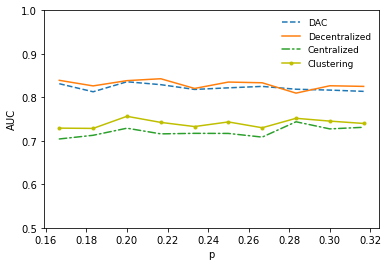

In [40]:
plt.plot(list_p, auc_alg,"--",label = 'DAC')
plt.plot(list_p, auc_b1,'',label = 'Decentralized')
plt.plot(list_p, auc_b2,linestyle=(0, (5, 2, 1, 2)), dash_capstyle='round',label = 'Centralized')
plt.plot(list_p, auc_clus,'y-o',markersize=3,label = 'Clustering')

plt.legend(loc='best',frameon=False,prop={'size': 9})
plt.xlabel('p')
plt.ylabel('AUC')
plt.ylim(0.5,1.0)
plt.show()

# VARY Q

## P = 0

In [ ]:
auc_alg, auc_b1, auc_b2, auc_clus = [], [], [], []

p = 0
list_q = list(np.linspace(0,1-p,num=10,endpoint=False))

for q in list_q:

    result_1, result_2, result_3, result_4,result_5 = fit_models_upd(0.9,0.6,"bfgs")

    auc_alg.append(result_1)
    auc_b1.append(result_2)
    auc_b2.append(result_3)
    auc_clus.append(result_4)
    
    print('trial:', q)

In [ ]:

plt.plot(list_p, auc_alg,"--",label = 'DAC')
plt.plot(list_p, auc_b1,'',label = 'Decentralized')
plt.plot(list_p, auc_b2,linestyle=(0, (5, 2, 1, 2)), dash_capstyle='round',label = 'Centralized')
plt.plot(list_p, auc_clus,'y-o',markersize=3,label = 'Clustering')

plt.legend(loc='best',frameon=False,prop={'size': 9})
plt.xlabel('q')
plt.ylabel('AUC')
plt.ylim(0.5,1.0)
plt.show()

## P = 1/3

In [66]:
obs = 40
n = 10

In [67]:
auc_alg, auc_b1, auc_b2, auc_clus = [], [], [], []

p = 1/3
list_q = list(np.linspace(1/6,1-p,num=10,endpoint=False))

for q in list_q:

    result_1, result_2, result_3, result_4,result_5 = fit_models_upd(0.9,0.6,"bfgs")

    auc_alg.append(result_1)
    auc_b1.append(result_2)
    auc_b2.append(result_3)
    auc_clus.append(result_4)
    
    print('trial:', q)

False
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'dept'}
False
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
False
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'dept'}
         Current function value: 0.305548
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.294049
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.378971
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.175073
         Iterations: 42
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.426103
         Iterations: 34
        

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.567157
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.537161
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'sku'}
False
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'sku'}
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'sku'}
         Current function value: 0.291855
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.218319
         Iterations: 45
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.070496
         Iterations: 65
         Function evaluations: 66
         Gradient evaluations: 66
Optimi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.568954
         Iterations: 73
         Function evaluations: 74
         Gradient evaluations: 74
Optimization terminated successfully.
         Current function value: 0.651875
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.630755
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.681723
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
False
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'dept'}
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'dept'}
         Current function value: 0.262072
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.260498
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.538656
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.522472
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.288398
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
False
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'sku'}
False
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
         Current function value: 0.273514
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.233220
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.576318
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.614394
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.168002
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
False
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'dept'}
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'dept'}
         Current function value: 0.325158
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.266055
         Iteration

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.422943
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.601439
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.524825
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.592196
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
False
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'sku'}
False
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'sku'}
False
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'dept', 4:

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.171623
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.424012
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.518409
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.305554
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 27
         Function evaluations: 28
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.617241
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.606653
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.571982
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'clus'}
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'clus'}
         Current function value: 0.325857
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.335047
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current functi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.597806
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.566695
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.611603
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.294351
         Iterations: 60
         Function evaluations: 61
         Gradient evaluations: 61
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 46
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.484312
         Iterations: 76
         Function evaluations: 77
         Gradient evaluations: 77
Optimization terminated successfully.
         Current function value: 0.504885
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.549787
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.257476
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
False
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'sku'}
False
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
         Current function value: 0.353228
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
O

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.504417
         Iterations: 66
         Function evaluations: 67
         Gradient evaluations: 67
Optimization terminated successfully.
         Current function value: 0.549128
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.550232
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.538114
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'sku'}
False
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'clus'}
False
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'clus'}
False
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'sku'}
False
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'sku'}
False
{0: 'sku', 1:

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.312666
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.608640
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.646263
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.594806
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'dept'}
False
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'sku'}
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'sku'}
      

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.319074
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.245689
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.328117
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.233071
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.330610
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.473076
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.670901
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.589783
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'sku'}
False
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'clus'}
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'sku'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'sku'}
         Current function value: 0.344890
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.143117
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.344943
         Iterations: 42
         

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.329000
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.436735
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.361901
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
         Current function value: 0.346747
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.495263
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.405493
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.383939
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.486303
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.255122
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.463911
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.173139
         Iterations: 49
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.000074
         Iterations: 52
         Function evaluations: 53
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

         Current function value: 0.347572
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.374299
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.407941
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.281253
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.300030
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.000019
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountere

Optimization terminated successfully.
         Current function value: 0.474758
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.355713
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'clus'}
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'dept'}
         Current function value: 0.270509
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.339746
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.135455
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.316853
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.405359
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.448112
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.315821
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.476291
         Iterations: 36
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.434290
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'dept'}
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'dept'}
         Current function value: 0.352179
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.291142
         Iterations: 40
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000064
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.358735
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current functi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.378285
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.619399
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.590051
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.569182
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'sku'}
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.406914
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 4

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.532998
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.388593
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'clus'}
False
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'clus'}
False
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'sku'}
False
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'dept'}
         Current function value: 0.258296
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.484229
         Iterations: 36
         Function evaluations: 37
         Gradient evaluati

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check

Optimization terminated successfully.
         Current function value: 0.235601
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.283417
         Iterations: 40
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.077471
         Iterations: 61
         Function evaluations: 63
         Gradient evaluations: 63
Optimization terminated successfully.
         Current function value: 0.315490
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.273909
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.414754
         Iterations: 39
         Function evaluations: 40
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'av

Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.241066
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.161600
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.242727
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.228837
         Iterations: 46
         Function evaluations: 47
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.238052
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.240307
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'sku'}
False
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'sku'}
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'sku'}
         Current function value: 0.360553
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.359799
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.505245
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Opti

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.355974
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
         Current function value: 0.420927
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.536881
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.511879
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.507810
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.374613
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.477463
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.532883
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.273188
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.235875
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.206278
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.647451
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.548191
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'sku'}
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'sku'}
         Current function value: 0.386064
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.453073
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.440310
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current functi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


         Current function value: 0.415269
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.674598
         Iterations: 23
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.648920
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.642226
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
False
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'sku'}
False
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'sku'}
False
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'sku'}
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'sku'}
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'sku'}
         Current function value: 0.265845
         Iterati

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.495087
         Iterations: 79
         Function evaluations: 80
         Gradient evaluations: 80
Optimization terminated successfully.
         Current function value: 0.528986
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.641150
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.277593
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'clus'}
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'clus'}
         Current function value: 0.252324
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.133768
         Iterations: 49
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.620477
         Iterations: 75
         Function evaluations: 77
         Gradient evaluations: 77
Optimization terminated successfully.
         Current function value: 0.684867
         Iterations: 19
         Function evaluations: 21
         Gradient evaluations: 21
Optimization terminated successfully.
         Current function value: 0.325078
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.689774
         Iterations: 22
         Function evaluations: 23
         Gradient evaluations: 23
False
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'clus'}
False
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
False
{0: 'sku', 1: 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed

Optimization terminated successfully.
         Current function value: 0.241086
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.000021
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000043
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
         Current function value: 0.226352
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.629468
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.588890
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.239161
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.480957
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.390818
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.329890
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.106563
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.473735
         Iterations: 28
         Function evaluations: 29
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.477053
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.552454
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.625072
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.378216
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.401869
         Iterations: 40
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.397454
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.584948
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.277811
         Iterations: 88
         Function evaluations: 89
         Gradient evaluations: 89
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.425211
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.342793
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.322054
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.349646
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
False
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'sku'}
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'sku'}
         Current function value: 0.330838
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.261610
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.485722
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.159679
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.275717
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.285576
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
         Current function value: 0.358166
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.463967
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.360067
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.316480
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.488042
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.281564
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.320857
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.089856
         Iterations: 59
         Function evaluations: 60
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.315484
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.475282
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.409435
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.394874
         Iterations: 31
         Function evaluations: 32
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.263888
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.415613
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.156701
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.255914
         Iterations: 40
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

Optimization terminated successfully.
         Current function value: 0.485634
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.423431
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.090447
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.384249
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.188494
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.408735
         Iterations: 40
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.305310
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.429689
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.196334
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.382596
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.127194
         Iterations: 52
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.300599
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.565327
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.512128
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'sku'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'sku'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'sku'}
         Current function value: 0.422685
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.257897
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.582684
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Op

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: Convergence

Optimization terminated successfully.
         Current function value: 0.516743
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.609610
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.481228
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'sku'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'sku'}
         Current function value: 0.255111
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.146884
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.364814
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.282816
         Iterations: 39
         Function evaluations: 41
         Gradient evaluations: 41
False
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'sku'}
False
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'sku'}
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'sku'}
         Current function value: 0.344598
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.223912
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.567967
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimiz

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.690504
         Iterations: 23
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.180599
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
False
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'dept'}
False
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'dept'}
         Current function value: 0.348445
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.136112
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.315510
         Iterations: 37
         

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.490221
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.459298
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.481950
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
False
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'sku'}
False
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'sku'}
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'sku'}
         Current function value: 0.270407
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.268204
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optim

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.373112
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.324738
         Iterations: 39
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.239301
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.350110
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.638206
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.180311
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.232795
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.318876
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.426983
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.471195
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.411301
         Iterations: 38
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.465453
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.143080
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.043050
         Iterations: 77
         Function evaluations: 78
         Gradient evaluations: 78
Optimization terminated successfully.
         Current function value: 0.223810
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.447182
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.299361
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.267787
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.507252
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.508790
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.285218
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.000035
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.199653
         Iterations: 48
         Function evaluations: 49
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.198473
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.197194
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.188092
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.107667
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.000063
         Iterations: 66
         Function evaluations: 68
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.361260
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.268940
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.063720
         Iterations: 64
         Function evaluations: 66
         Gradient evaluations: 66
Optimization terminated successfully.
         Current function value: 0.427643
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.498982
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.259719
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.487339
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.409892
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.319828
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.371393
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.382499
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.375211
         Iterations: 39
         Function evaluations: 40
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.254462
         Iterations: 41
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.155582
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.243078
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.496953
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.103418
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.361693
         Iterations: 41
         Function evaluations: 42
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.306922
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.315820
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.407554
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.366803
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.151981
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.129938
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.202646
         Iterations: 45
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.450128
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.340233
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.328259
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.295217
         Iterations: 41
         Function evaluations: 42
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed t


         Current function value: 0.000010
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.454506
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.296220
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.306209
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.319774
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optim

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'av

Optimization terminated successfully.
         Current function value: 0.326115
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.437632
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.371218
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
         Current function value: 0.456996
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.499282
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.500141
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.318292
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
         Current function value: 0.349652
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.645890
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.544741
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.645940
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'sku'}
False
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'sku'}
False
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'sku

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

         Current function value: 0.310623
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.347344
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.411001
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.232762
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.397181
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.494985
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.342950
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.412568
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.173605
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.343186
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.382155
         Iterations: 31
         Function evaluations: 32
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.282145
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.292903
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.461435
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.500743
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.251522
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.213927
         Iterations: 45
         Function evaluations: 46
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.172784
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.133156
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.358194
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.478966
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.192241
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.424046
         Iterations: 37
         Function evaluations: 38
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.501445
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.465316
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.427369
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.424172
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.488439
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 30
         Function evaluations: 31
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.475093
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.556828
         Iterations: 96
         Function evaluations: 97
         Gradient evaluations: 97
Optimization terminated successfully.
         Current function value: 0.649476
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.646955
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.626361
         Iterations: 26
         Function evaluations: 27
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.364795
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.199494
         Iterations: 44
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.611790
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.481075
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.317382
         Iterations: 43
         Function evaluations: 44
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.137347
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.243629
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.191189
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.343751
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.200146
         Iterations: 51
         Function evaluations: 52
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.326083
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.227314
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.195339
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.290168
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.339731
         Iterations: 40
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.326840
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.514652
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.316842
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.413170
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 27
         Function evaluations: 28
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

Optimization terminated successfully.
         Current function value: 0.359699
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.393624
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.295781
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.155929
         Iterations: 48
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.150002
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.122592
         Iterations: 55
         Function evaluations: 56
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.221355
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.102095
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.330803
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.372056
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.337541
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
         Current function value: 0.313710
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.298609
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.568278
         Iterations: 65
         Function evaluations: 66
         Gradient evaluations: 66
Optimization terminated successfully.
         Current function value: 0.604757
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.582592
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.562448
         Iterations: 27
         Function evaluations: 28
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

         Current function value: 0.436059
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.467440
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.420735
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.481918
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'sku'}
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'sku'}
         Current function value: 0.345915
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.219152
         Iterations:

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.644780
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.607359
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'clus'}
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'clus'}
         Current function value: 0.278444
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.286607
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.169296
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.565972
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'sku'}
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'dept'}
False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'sku'}
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'sku'}
False
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'sku'}
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'sku'}
         Current function value: 0.312766
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.472445
         Iterations: 36
         Function evaluations: 37
         Gradient evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.562153
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.642374
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'dept'}
False
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
         Current function value: 0.465821
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.263970
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.195875
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50


/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

Optimization terminated successfully.
         Current function value: 0.500285
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.505476
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.497143
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'sku'}
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'sku'}
         Current function value: 0.352327
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.446558
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function v

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.235816
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.510124
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.582785
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.426758
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'sku'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'sku'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'sku'}
         Current function value: 0.483170
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.397135
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.522418
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.602150
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.516364
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.660206
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'sku'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'sku'}
         Current function 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.515436
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.559836
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.570609
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.527742
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'sku'}
False
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'sku'}
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'sku'}
         Current function value: 0.233338
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.338894
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.452208
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.452208
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.508320
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.336832
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'dept'}
         Current function 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000058
         Iterations: 37
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.000035
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.243242
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.279302
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.339317
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
         Current function value: 0.319090
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

Optimization terminated successfully.
         Current function value: 0.260073
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.417862
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.160871
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.339357
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.266191
         Iterations: 44
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.165273
         Iterations: 49
         Function evaluations: 50
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.463693
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.613060
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.573673
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.603381
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'sku'}
False
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'sku'}
False
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'dept'}
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'dept'}
         Current function value: 0.344383
         Iterations: 100
         Function evaluations: 102
         Gradient

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.372592
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.610251
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.560206
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.604035
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'dept'}
         Current function value: 0.509875
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.613124
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.644538
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'sku'}
False
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'dept'}
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'dept'}
         Current function value: 0.298089
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.341572
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.419916
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Op

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


{0: 'sku', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'dept'}
False
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'sku'}
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'sku'}
         Current function value: 0.305306
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.071918
         Iterations: 64
         Function evaluations: 66
         Gradient evaluations: 66
Optimization terminated successfully.
         Current function value: 0.112233
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.392873
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.416480
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimiza

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.543354
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.446888
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.390590
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.483645
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.370783
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.399213
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.588369
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.417534
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.434591
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.283447
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.252317
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.368663
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.370684
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.517067
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.418485
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.437976
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.385752
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.148609
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.286926
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.275589
         Iterations: 39
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.148142
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.284490
         Iterations: 41
         Function evaluations: 42
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.270139
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.305683
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.337261
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.000005
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.166678
         Iterations: 43
         Function evaluations: 46
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.311696
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.483458
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.362299
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.575213
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.255241
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.370988
         Iterations: 38
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.181238
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.326905
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.189200
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.436674
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.282859
         Iterations: 43
         Function evaluations: 44
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'av

Optimization terminated successfully.
         Current function value: 0.279999
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.000059
         Iterations: 34
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.604831
         Iterations: 81
         Function evaluations: 85
         Gradient evaluations: 85
Optimization terminated successfully.
         Current function value: 0.672809
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.672034
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.000059
         Iterations: 34
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

         Current function value: 0.265993
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.663325
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.641102
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.401446
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.524351
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000015
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.465448
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.265879
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.372946
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.354624
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.498308
         Iterations: 36
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.270429
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.581625
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.414345
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.198823
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.519008
         Iterations: 35
         Function evaluations: 36
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.181891
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.075543
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
         Current function value: 0.377303
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.403244
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.542148
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.368865
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.510582
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.549222
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.554018
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.604762
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'sku'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'sku'}
         Current function value: 0.261860
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.193419
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.074706
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.392716
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.314725
         Iterations: 85
         Function evaluations: 87
         Gradient evaluations: 87
Optimization terminated successfully.
         Current function value: 0.234161
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.212909
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.430935
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.110518
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.160541
         Iterations: 49
         Function evaluations: 50
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.376197
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.427780
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.288995
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.297607
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.246754
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 53
         Function evaluations: 54
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

Optimization terminated successfully.
         Current function value: 0.209901
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.493132
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.508899
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.399653
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.433803
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.395304
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.350304
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.667047
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.560337
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.676365
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'dept'}
False
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'sku'}
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'sku'}
         Current function value: 0.291030
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.


/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.540287
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.440642
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'sku'}
False
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'sku'}
False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'sku'}
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'sku'}
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'sku'}
         Current function value: 0.382727
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.391327
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


         Current function value: 0.249764
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.150770
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.147661
         Iterations: 48
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.000036
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.286949
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.210134
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.101261
         Iterations: 56
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.628337
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.292504
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.456453
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.384381
         Iterations: 40
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.436968
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.432232
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.348180
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.232477
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.307978
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
         Current function value: 0.307625
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.326684
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.596008
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.634320
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.549072
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'clus'}
False
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'sku'}
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'sku'}
         Current function value: 0.307951
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfull

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.557667
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.506098
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'sku'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'dept'}
False
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'sku'}
False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'clus'}
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'clus'}
         Current function value: 0.375396
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.303394
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.380184
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.242445
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.309415
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.154900
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.264268
         Iterations: 42
         Function evaluations: 44
         Gradient evaluations: 44
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.510393
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000020
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.359487
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.290587
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.324619
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.362825
         Iterations: 40
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.000030
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.239422
         Iterations: 90
         Function evaluations: 92
         Gradient evaluations: 92
Optimization terminated successfully.
         Current function value: 0.258817
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.257462
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.213452
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.252433
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.468045
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.514542
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.514916
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.417403
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.434060
         Iterations: 39
         Function evaluations: 40
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

Optimization terminated successfully.
         Current function value: 0.331115
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.269478
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.241071
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.321968
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
         Current function value: 0.255204
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.448117
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.473912
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.662748
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.613128
         Iterations: 21
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
         Current function value: 0.656680
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'dept'}
         Current function value: 0.304221
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.346723
         Itera

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.292987
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 42
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.419087
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.236369
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.502829
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.465428
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.668333
         Iterations: 17
         Function evaluations: 19
         Gradient evaluations: 19
Optimization terminated successfully.
         Current function value: 0.662957
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.538581
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'clus'}
         Current function value: 0.344907
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.192173
         Itera

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


False
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'dept'}
False
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'dept'}
         Current function value: 0.378935
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.294542
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.292070
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.461385
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38


/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.227143
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.352405
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.097454
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.428619
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.239445
         Iterations: 45
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 43
         Function evaluations: 44
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.151920
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.186666
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.229669
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.222095
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.403229
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.221620
         Iterations: 42
         Function evaluations: 43
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed

         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.144467
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.245913
         Iterations: 41
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.000043
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.293747
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.386726
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
         Current function value: 0.513624
      

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)



Optimization terminated successfully.
         Current function value: 0.245867
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
         Current function value: 0.250571
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.655920
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.502742
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.653349
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'clus'}
False
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'clus'}
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'clus'}
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))



         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.487146
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.633075
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.634148
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.599843
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.624823
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'sku'

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.342922
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.635939
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.590190
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.642970
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'sku'}
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'sku'}
         Current function value: 0.223732
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.179628
         Iterations:

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed

         Current function value: 0.300345
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.137920
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.528269
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.339750
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.378546
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.405487
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow

         Current function value: 0.237195
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.176826
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.147558
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.518923
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.405855
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.129857
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.101974
         Iterations: 56
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.303555
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.159852
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.079631
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value: 0.395234
         Iterations: 39
         Function evaluations: 40
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.359011
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.322659
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.379022
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
False
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'dept'}
False
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'clus'}
False
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'sku'}
False
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'clus'}
         Current function value: 0.341048
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.652921
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.639457
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.616614
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'dept'}
         Current function value: 0.393205
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.363636
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.615822
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.621448
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'sku'}
False
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'sku'}
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'sku'}
         Current function value: 0.271695
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.000040
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.260105
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optim

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.123768
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.256272
         Iterations: 40
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.309926
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.508921
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.318448
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.562927
         Iterations: 31
         Function evaluations: 33
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.464359
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.217617
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.280192
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.287227
         Iterations: 41
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 60
         Function evaluations: 62
         Gradient evaluations: 62
Optimization terminated successfully.
         Current function value: 0.119974
         Iterations: 58
         Function evaluations: 59
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.425669
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.280631
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.129099
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.092228
         Iterations: 56
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.201040
         Iterations: 46
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.320517
         Iterations: 36
         Function evaluations: 38
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow

Optimization terminated successfully.
         Current function value: 0.000018
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.321568
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.167945
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.251280
         Iterations: 44
         Function evaluations: 45
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes


         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.000032
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 38
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.152470
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.376395
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000020
         Iterations: 52
 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.108526
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.443988
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.463107
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.233088
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.140066
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.405368
         Iterations: 37
         Function evaluations: 38
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.614564
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.204945
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.518186
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.399536
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.606985
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.392650
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.402528
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.355375
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.657765
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.475427
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.677567
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
False
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'clus'}
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.295996
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
False
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'clus'}
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'clus'}
         Current function value: 0.271372
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.309746
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.071871
         Iterations: 60
         Function evaluations: 61
         Gradient evaluations: 61
Optimization terminated successfully.
         Current function

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.670384
         Iterations: 21
         Function evaluations: 23
         Gradient evaluations: 23
Optimization terminated successfully.
         Current function value: 0.607345
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'dept'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.502872
         Iterations: 48
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.534097
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.3

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.341889
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.350184
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.632820
         Iterations: 29
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.431250
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.225821
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.100573
         Iterations: 56
         Function evaluations: 57
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.342489
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.144952
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.085422
         Iterations: 60
         Function evaluations: 62
         Gradient evaluations: 62
Optimization terminated successfully.
         Current function value: 0.294287
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.129753
         Iterations: 49
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.365436
         Iterations: 32
         Function evaluations: 33
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

Optimization terminated successfully.
         Current function value: 0.277725
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.495489
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.357935
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.297592
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.324634
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
         Current function value: 0.410558
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.071141
         Iterations: 66
         Function evaluations: 67
         Gradient evaluations: 67
Optimization terminated successfully.
         Current function value: 0.374788
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.102050
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value: 0.644155
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.187604
         Iterations: 47
         Function evaluations: 48
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed t

Optimization terminated successfully.
         Current function value: 0.418497
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.237779
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.138486
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
         Current function value: 0.225354
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.317315
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.431164
         Iterations: 96
         Function evaluations: 97
         Gradient evaluations: 97
Optimization terminated successfully.
         Current function value: 0.670330
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.514686
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.671514
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
False
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'sku'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'sku'}
False
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'dept'}
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'dept'}
         Current function value: 0.245439
         Iterations: 100
         Func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.627870
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.612921
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'clus'}
False
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'dept'}
         Current function value: 0.305643
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.284225
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.238114
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45


/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

False
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'sku'}
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'sku'}
         Current function value: 0.263335
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 34
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.098671
         Iterations: 60
         Function evaluations: 61
         Gradient evaluations: 61
Optimization terminated successfully.
         Current function value: 0.504294
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.414541
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.203751
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.452777
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.374044
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.509492
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.392087
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.484893
         Iterations: 37
         Function evaluations: 38
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: 


Optimization terminated successfully.
         Current function value: 0.117031
         Iterations: 54
         Function evaluations: 56
         Gradient evaluations: 56
         Current function value: 0.230193
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.627449
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.432133
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.684941
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'sku'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'sku'}
         Current function value: 0.301849
         Iteration

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
         Current function value: 0.358707
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.561269
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.617804
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.443799
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'clus'}
False
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'clus'}
False
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'sku', 4: 's

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.158869
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.428050
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.644881
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.644881
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.674876
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.580244
         Iterations: 24
         Function evaluations: 25
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

Optimization terminated successfully.
         Current function value: 0.633988
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
trial: 0.21666666666666667
False
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'sku'}
False
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'sku'}
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'sku'}
         Current function value: 0.442347
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.461612
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.235073
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.471922
         Iterations: 35
         Function evaluations: 36
         

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.349705
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.185592
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.095801
         Iterations: 56
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.000019
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.218254
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.469653
         Iterations: 35
         Function evaluations: 36
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.453146
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.419619
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.488557
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.296331
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.069189
         Iterations: 61
         Function evaluations: 63
         Gradient evaluations: 63
Optimization terminated successfully.
         Current function value: 0.284445
         Iterations: 43
         Function evaluations: 44
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.262157
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.430089
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.149606
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.518030
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.305719
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.174421
         Iterations: 48
         Function evaluations: 49
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.274646
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 59
         Function evaluations: 61
         Gradient evaluations: 61
Optimization terminated successfully.
         Current function value: 0.000039
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.089317
         Iterations: 57
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.344118
         Iterations: 69
         Function evaluations: 70
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.447673
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.647074
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.583214
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.554833
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'sku'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'clus'}
         Current function value: 0.393932
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfull

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.625593
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.193127
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.635307
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.308954
         Iterations: 68
         Function evaluations: 69
         Gradient evaluations: 69
Optimization terminated successfully.
         Current function value: 0.297880
         Iterations: 40
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.525217
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.578135
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'dept'}
False
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'dept'}
         Current function value: 0.377017
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.538497
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.243252
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46


/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000016
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.367181
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.394172
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.384782
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.089620
         Iterations: 60
         Function evaluations: 61
         Gradient evaluations: 61
Optimization terminated successfully.
         Current function value: 0.101620
         Iterations: 56
         Function evaluations: 57
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.283704
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.652532
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.402140
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.673645
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
False
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'sku'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'sku'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.480872
         Iterations: 57
       

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.141567
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.288272
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.327511
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.222577
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.413393
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 39
         Function evaluations: 40
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.513516
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.365044
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.588054
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.581040
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.585032
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'dept'}
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'dept'}
         Current function value: 0.367826
         Iterations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.357072
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.602399
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.598731
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.589816
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'dept'}
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'dept'}
         Current function value: 0.327152
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.554397
         Iterati

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.312872
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.592675
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'sku'}
False
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'sku'}
False
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'dept'}
         Current function value: 0.327997
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.000037
         Iterations: 50
       

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.417060
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.197890
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.380599
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.076455
         Iterations: 55
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.228738
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 54
         Function evaluations: 57
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
         Current function value: 0.341198
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.372786
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.382833
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.320898
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
False
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'sku'}
False
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'clus'}


/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.470945
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.557589
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.491725
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.554930
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'dept'}
False
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'sku'}
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'sku'}
         Current function value: 0.391069
         Iterations: 100
         

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.389239
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.272174
         Iterations: 43
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.000017
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.157783
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.328449
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.410443
         Iterations: 36
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.303790
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000024
         Iterations: 68
         Function evaluations: 71
         Gradient evaluations: 71
Optimization terminated successfully.
         Current function value: 0.440005
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.000026
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.187878
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.425187
         Iterations: 38
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.405929
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.229074
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.249306
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
         Current function value: 0.267313
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.595030
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.141014
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.191608
         Iterations: 43
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.439354
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.336832
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.545485
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.550045
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.612049
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.642890
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.544658
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'sku'}
False
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'clus'}
False
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'sku'}
False
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'clus'}
False
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'clus'}
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'clus'}
         Current function value: 0.366261
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations:

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.468468
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.463523
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
False
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'sku'}
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'sku'}
         Current function value: 0.236128
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.000025
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.200037
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountere

Optimization terminated successfully.
         Current function value: 0.673488
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'clus'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'sku'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'sku'}
         Current function value: 0.320900
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.397569
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.163868
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.000036
         Iterations: 61
         Function evaluations: 62
         Gradient evaluations: 6

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountere

Optimization terminated successfully.
         Current function value: 0.288202
         Iterations: 41
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.507119
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.193630
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.473752
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.139910
         Iterations: 54
         Function evaluations: 55
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/mod

Optimization terminated successfully.
         Current function value: 0.222193
         Iterations: 44
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.237277
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
         Current function value: 0.242587
         Iterations: 100
         Function evaluations: 103
         Gradient evaluations: 103
Optimization terminated successfully.
         Current function value: 0.572173
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.551624
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.545428
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: 

Optimization terminated successfully.
         Current function value: 0.398036
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.457162
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.267392
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'dept'}
         Current function value: 0.384427
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.302456
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.655329
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'sku'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'sku'}
         Current function value: 0.237968
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.246118
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.348695
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.219724
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current functi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.267068
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.280728
         Iterations: 40
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.249830
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.132574
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.435511
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.288490
         Iterations: 42
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.000019
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.534741
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.217816
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.491242
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.484147
         Iterations: 36
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

         Current function value: 0.344643
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.615808
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.643066
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.563851
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'clus'}
False
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'sku'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.264181
         Iterations: 63
      

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'sku'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'sku'}
         Current function value: 0.323582
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000016
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.263890
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.000047
         Iterations: 80
         Function evaluations: 82
         Gradient evaluations: 82
Optimization terminated successfully.
         Current function value: 0.564122
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.437833
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.154247
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.468754
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.299100
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.286597
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.383736
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.493315
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.260090
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.274460
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.441723
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.258904
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.188460
         Iterations: 47
         Function evaluations: 48
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.423776
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.184454
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.253030
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.146974
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.341079
         Iterations: 40
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.415139
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.641422
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.642687
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.488477
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'dept'}
False
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'clus'}
         Current function value: 0.382327
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.462581
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.514680
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'dept'}
False
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'dept'}
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'sku'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'sku'}
         Current function value: 0.268394
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.418366
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated suc

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.323541
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.276722
         Iterations: 41
         Function evaluations: 43
         Gradient evaluations: 43
False
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'dept'}
False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'clus'}
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'clus'}
         Current function value: 0.379647
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.453139
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.538465
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
O

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.279814
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.000035
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.414799
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.281488
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.305197
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.264447
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.463148
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.135764
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.385458
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.144666
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.390886
         Iterations: 38
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.065433
         Iterations: 67
         Function evaluations: 68
         Gradient evaluations: 68
Optimization terminated successfully.
         Current function value: 0.227902
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 62
         Function evaluations: 63
         Gradient evaluations: 63
Optimization terminated successfully.
         Current function value: 0.205626
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.279738
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.315030
         Iterations: 33
         Function evaluations: 34
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.301763
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
         Current function value: 0.324233
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.661628
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.636970
         Iterations: 19
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.345846
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
False
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'clus'}
         Current function value: 0.222008
         Iterations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.156916
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
         Current function value: 0.232720
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.534500
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.354024
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.558609
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'sku'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'sku'}
         Current function value: 0.302629
         Iterations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


         Current function value: 0.363652
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.579874
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.574349
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.568449
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'sku'}
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'sku'}
         Current function value: 0.232184
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.000021
         Iteration

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.624518
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.496232
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.614002
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'sku'}
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'sku'}
         Current function value: 0.354315
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current functi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.358442
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.330946
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.188997
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.254694
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.360900
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.274130
         Iterations: 42
         Function evaluations: 43
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: 

Optimization terminated successfully.
         Current function value: 0.195000
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.223133
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.149232
         Iterations: 47
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.324602
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 62
         Function evaluations: 64
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.406676
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.444408
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.228740
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.074051
         Iterations: 61
         Function evaluations: 62
         Gradient evaluations: 62
Optimization terminated successfully.
         Current function value: 0.465715
         Iterations: 36
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.268337
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.322004
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.136712
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.205148
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.239785
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.349102
         Iterations: 33
         Function evaluations: 34
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.000033
         Iterations: 74
         Function evaluations: 78
         Gradient evaluations: 78
Optimization terminated successfully.
         Current function value: 0.494207
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.301230
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.163499
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.000033
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.391794
         Iterations: 36
         Function evaluations: 38
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.546786
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.514803
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.611844
         Iterations: 71
         Function evaluations: 72
         Gradient evaluations: 72
Optimization terminated successfully.
         Current function value: 0.685758
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.658768
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.678667
         Iterations: 25
         Function evaluations: 26
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.664886
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.664174
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.523626
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'sku'}
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'sku'}
         Current function value: 0.311112
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.171736
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function v

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: In

         Current function value: 0.311080
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.499145
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.176169
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.255634
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.343302
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.295594
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.317178
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.572038
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.239144
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.494804
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.383428
         Iterations: 39
         Function evaluations: 40
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.428684
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.472705
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.460985
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.496808
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.304663
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.214659
         Iterations: 46
         Function evaluations: 47
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.370692
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.116403
         Iterations: 60
         Function evaluations: 61
         Gradient evaluations: 61
Optimization terminated successfully.
         Current function value: 0.290129
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
         Current function value: 0.305577
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.655896
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.629907
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.358154
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'clus'}
False
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'sku'}
False
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'sku'}
False
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'sku'}
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'sku'}
         Current function value: 0.298539
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.334051
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.000015
         Iterations: 31
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.568011
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.532041
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'sku'}
False
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'dept'}
         Current function value: 0.344594
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.426886
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.238940
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

{0: 'sku', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'dept'}
         Current function value: 0.253933
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.252160
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.370257
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.295666
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.000015
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function val

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.399012
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'dept'}
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'dept'}
         Current function value: 0.382078
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.481854
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.332394
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.616094
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.224477
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.295001
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.304682
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.178107
         Iterations: 49
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.433787
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.354945
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.000038
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.393435
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.241652
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.399141
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.226195
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.297866
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.354863
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.000016
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.402768
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.310974
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

         Current function value: 0.399997
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.371656
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.332405
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.430941
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.309313
         Iterations: 39
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.239066
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


{0: 'dept', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'dept'}
         Current function value: 0.335415
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.153117
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.356730
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.172410
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.193168
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.432175
         Iterations: 37
         Function

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.595106
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.618207
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'dept'}
False
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'sku'}
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'sku'}
         Current function value: 0.220227
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.210585
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31


/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: Convergence

Optimization terminated successfully.
         Current function value: 0.682187
         Iterations: 19
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.636251
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.660468
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
False
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'sku'}
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'sku'}
False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'dept'}
False
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'sku'}
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'sku'}
         Current function value: 0.267595
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.264007
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.672331
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.602486
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.648020
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'sku'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'sku'}
         Current function value: 0.419365
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfull

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.461355
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.666645
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.674105
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.652256
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
False
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'dept'}
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'dept'}
         Current function value: 0.343584
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.600756
         Iterations:

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.402120
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.680129
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.663872
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.638500
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'clus'}
         Current function value: 0.318893
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.093809
         Itera

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.395342
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.402872
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.372820
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.418197
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.203535
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Ma

Optimization terminated successfully.
         Current function value: 0.192920
         Iterations: 90
         Function evaluations: 93
         Gradient evaluations: 93
Optimization terminated successfully.
         Current function value: 0.207985
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.098863
         Iterations: 62
         Function evaluations: 63
         Gradient evaluations: 63
Optimization terminated successfully.
         Current function value: 0.219377
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
False
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'sku'}
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'sku'}
         Current function value: 0.272300
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function v

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.265496
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.493025
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.312547
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.536337
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
trial: 0.26666666666666666
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'sku'}
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'sku'}
False
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'dept'}
False
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.589822
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.427927
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'dept'}
False
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'clus'}
         Current function value: 0.364818
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.404066
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 32
       

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: 

Optimization terminated successfully.
         Current function value: 0.374843
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.194686
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.276967
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.325910
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.172219
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.404696
         Iterations: 36
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.448574
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.198220
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.123087
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.082004
         Iterations: 67
         Function evaluations: 68
         Gradient evaluations: 68
Optimization terminated successfully.
         Current function value: 0.162376
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.561160
         Iterations: 34
         Function evaluations: 35
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 46
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.442686
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000028
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.308546
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.258757
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.388987
         Iterations: 39
         Function evaluations: 40
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000033
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.291043
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.458487
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.264520
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.542158
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'dept'}
False
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'sk

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.381595
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.362656
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.488849
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.438007
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.464278
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.358089
         Iterations: 38
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/mod

         Current function value: 0.278599
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.664453
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.598738
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.653412
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'clus'}
False
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'dept'}
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'dept'}
         Current function value: 0.301322
         Iterations: 100
         Function evaluations: 102
         Gr

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params avai

Optimization terminated successfully.
         Current function value: 0.606234
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.545324
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'dept'}
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'dept'}
         Current function value: 0.274934
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.000018
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.418380
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.647195
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.403751
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'sku'}
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.433332
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.264970
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.380458
         Iterations: 40
         Function evaluations: 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: 

Optimization terminated successfully.
         Current function value: 0.275303
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.148791
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000023
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.137681
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.421027
         Iterations: 36
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.299192
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.411919
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.328208
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.000037
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.155133
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.438422
         Iterations: 29
         Function evaluations: 30
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

         Current function value: 0.169702
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.669476
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.589953
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.671452
         Iterations: 18
         Function evaluations: 19
         Gradient evaluations: 19
False
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'clus'}
         Current function value: 0.233567
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.209606
         Iterati

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.570447
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.492193
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'sku'}
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'sku'}
         Current function value: 0.260472
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.325490
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.445844
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.440169
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'sku'}
False
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
         Current function value: 0.259154
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.427532
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.122987
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.264443
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 4

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.250847
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.283705
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.374773
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.371072
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.329526
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.556551
         Iterations: 40
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.486916
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.593612
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.604728
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.504129
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'clus'}
         Current function value: 0.417662
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.600273
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.508521
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
         Current function value: 0.341789
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.360599
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.310950
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'av

Optimization terminated successfully.
         Current function value: 0.478924
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
False
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'sku'}
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.431123
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.376729
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.388120
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.455972
         Iterations: 33
         Function evaluations:

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.199254
         Iterations: 43
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.227372
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.191897
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.370952
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.336440
         Iterations: 39
         Function evaluations: 40
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


         Current function value: 0.172900
         Iterations: 46
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.395936
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.000029
         Iterations: 37
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.310728
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.465056
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.369810
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.581106
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.611742
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.518292
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'clus'}
         Current function value: 0.359675
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.379903
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.519869
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'sku'}
False
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'clus'}
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'clus'}
         Current function value: 0.378065
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.303349
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.417476
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
O

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.572133
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.644762
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'dept'}
False
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'dept'}
False
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'dept'}
False
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'sku'}
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'sku'}
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'sku'}
         Current function value: 0.332754
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.343232
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.680103
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.641223
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
         Current function value: 0.311236
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.378184
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.269292
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.493945
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.295535
         Iterations: 78
         Function evaluations: 79
         Gradient evaluations: 79
Optimization terminated successfully.
         Current function value: 0.314333
         Iterations: 40
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountere

         Current function value: 0.346342
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.573426
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.566242
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.524611
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'sku'}
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'sku'}
         Current function value: 0.268827
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.358757
         Iteration

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: 

Optimization terminated successfully.
         Current function value: 0.471928
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
False
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'clus'}
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'clus'}
         Current function value: 0.361376
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.142047
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.302192
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.626348
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/mod

         Current function value: 0.224347
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000041
         Iterations: 42
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 46
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.327987
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.088167
         Iterations: 61
         Function evaluations: 62
         Gradient evaluations: 62
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.208237
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.341864
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.434555
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000022
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.430866
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.122988
         Iterations: 52
         Function evaluations: 53
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.303902
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.508715
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.492100
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.246765
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'clus'}
         Current function value: 0.294086
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000007
         Itera

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.303064
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.524461
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'sku'}
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'sku'}
         Current function value: 0.319373
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.371672
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.123198
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
O

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.298335
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
False
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'dept'}
False
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
False
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'sku'}
False
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'dept'}
         Current function value: 0.395813
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.138599
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.427188
         Iterations: 39
         Function evaluations: 40
         Gradient evaluatio

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed

Optimization terminated successfully.
         Current function value: 0.262291
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.376607
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 62
         Function evaluations: 64
         Gradient evaluations: 64
Optimization terminated successfully.
         Current function value: 0.411877
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.386886
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.374688
         Iterations: 39
         Function evaluations: 40
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.310393
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.306571
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.487544
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.240605
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.232861
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 28
         Function evaluations: 29
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

Optimization terminated successfully.
         Current function value: 0.495357
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.131853
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.356212
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.000022
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.267803
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.685307
         Iterations: 21
         Function evaluations: 23
         Gradient evaluations: 23
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 52
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.255569
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
         Current function value: 0.298639
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.668987
         Iterations: 21
         Function evaluations: 23
         Gradient evaluations: 23
Optimization terminated successfully.
         Current function value: 0.634419
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.649688
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


         Current function value: 0.342928
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.366760
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.255368
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.434040
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'sku'}
False
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'sku'}
False
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'dept'}
False
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'sku'}
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'sku'}
         Current function value: 0.207300
         Iteratio

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.656337
         Iterations: 19
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.632819
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.240068
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.381213
         Iterations: 52
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.276547
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.308837
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.182921
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.289344
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.288364
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.341917
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.375279
         Iterations: 38
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.402885
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.306818
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.461446
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.171932
         Iterations: 46
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.333245
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.360837
         Iterations: 40
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.232726
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.211238
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.355811
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.381114
         Iterations: 69
         Function evaluations: 70
         Gradient evaluations: 70
Optimization terminated successfully.
         Current function value: 0.396074
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.352229
         Iterations: 40
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.568006
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.516138
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'sku'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'sku'}
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'dept'}
False
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'sku'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.226510
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.000019
         Iterations: 41
         Function eva

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


{0: 'sku', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'clus'}
False
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'sku'}
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'sku'}
         Current function value: 0.245469
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.268549
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.335908
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.490045
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimizati

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.371681
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.208883
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.297758
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.406049
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.276420
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.236018
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

Optimization terminated successfully.
         Current function value: 0.438221
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.214676
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.276610
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
         Current function value: 0.426540
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.475092
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.516966
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.542496
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.497084
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.599948
         Iterations: 71
         Function evaluations: 72
         Gradient evaluations: 72
Optimization terminated successfully.
         Current function value: 0.630357
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.633965
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.304914
         Iterations: 40
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInve

Optimization terminated successfully.
         Current function value: 0.598269
         Iterations: 81
         Function evaluations: 82
         Gradient evaluations: 82
Optimization terminated successfully.
         Current function value: 0.646918
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.548171
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.605116
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'clus'}
False
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'dept'}
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'dept'}
         Current function value: 0.307707
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101


/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.161968
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.503023
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.263483
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.252736
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.173601
         Iterations: 48
         Function evaluations: 49
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.179393
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.145363
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.429490
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.337129
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.522559
         Iterations: 35
         Function evaluations: 36
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.454111
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.596848
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.311205
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.593330
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'dept'}
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'dept'}
         Current function value: 0.294849
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.366323
         Iterati

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.522786
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.540446
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'sku'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'sku'}
         Current function value: 0.277318
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.234219
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.242007
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current functi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.463061
         Iterations: 74
         Function evaluations: 75
         Gradient evaluations: 75
Optimization terminated successfully.
         Current function value: 0.456247
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.404105
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.346636
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.418173
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.251088
         Iterations: 44
         Function evaluations: 45
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.451326
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.109797
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.085217
         Iterations: 60
         Function evaluations: 61
         Gradient evaluations: 61
Optimization terminated successfully.
         Current function value: 0.322797
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.364808
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.220411
         Iterations: 45
         Function evaluations: 48
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

Optimization terminated successfully.
         Current function value: 0.000016
         Iterations: 74
         Function evaluations: 76
         Gradient evaluations: 76
Optimization terminated successfully.
         Current function value: 0.263929
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.317130
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.313317
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
         Current function value: 0.284299
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow

Optimization terminated successfully.
         Current function value: 0.524471
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.396429
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.643993
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.635216
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.567859
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
False
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'sku'}
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'sku'}
         Current function value: 0.369732
         Iterations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.390533
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.604216
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.611283
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.545044
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'sku'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'sku'}
         Current function value: 0.276989
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successf

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.466275
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.473073
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.329202
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
False
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'dept'}
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'dept'}
         Current function value: 0.355146
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.372912
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current functi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.519686
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.626004
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'sku'}
False
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'sku'}
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'sku'}
         Current function value: 0.397291
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.119199
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.489149
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
O

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.297637
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.185615
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.370187
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.127780
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.479836
         Iterations: 35
         Function evaluations: 36
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.577146
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.364614
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.293105
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.353594
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.379019
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 29
         Function evaluations: 30
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.362426
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.409226
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.550488
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.608717
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.485563
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.602870
         Iterations: 27
         Function evaluations: 28
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete

         Current function value: 0.335950
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.582691
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.577783
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.554961
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'dept'}
         Current function value: 0.278790
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.251090
         Iterati

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.486223
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.531545
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.454162
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.561040
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.520912
         Iterations: 36
         Function evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:173

Optimization terminated successfully.
         Current function value: 0.153783
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.342397
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.511204
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.000070
         Iterations: 76
         Function evaluations: 77
         Gradient evaluations: 77
Optimization terminated successfully.
         Current function value: 0.000043
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.000016
         Iterations: 32
         Function evaluations: 33
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.626399
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.521756
         Iterations: 69
         Function evaluations: 70
         Gradient evaluations: 70
Optimization terminated successfully.
         Current function value: 0.634158
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.645896
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.527811
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
False
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'sku'}
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'sku'}
         Current function valu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.309314
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.483715
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.425371
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.517303
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'sku'}
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'sku'}
         Current function value: 0.282864
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.142409
         Iteration

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.635650
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.241815
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
False
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'clus'}
False
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'sku'}
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'sku'}
         Current function value: 0.248456
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.047419
         Iterations: 78
         Function evaluations: 79
         Gradient evaluations: 79
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


{0: 'sku', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
         Current function value: 0.316198
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.250680
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.194445
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.518290
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.101401
         Iterations: 57
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.352192
         Iterations: 41
         Functio

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000020
         Iterations: 53
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.000022
         Iterations: 75
         Function evaluations: 77
         Gradient evaluations: 77
Optimization terminated successfully.
         Current function value: 0.221739
         Iterations: 43
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.310448
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.291389
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 39
         Function evaluations: 40
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000017
         Iterations: 71
         Function evaluations: 72
         Gradient evaluations: 72
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.376777
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.479548
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.464211
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.477748
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


False
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'clus'}
         Current function value: 0.303394
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.342052
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.277831
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.455664
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.235574
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.208932
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.066607
         Iterations: 63
         Function evaluations: 64
         Gradient evaluations: 64
Optimization terminated successfully.
         Current function value: 0.373561
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.321198
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.342572
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.521439
         Iterations: 35
         Function evaluations: 36
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.122234
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.547534
         Iterations: 92
         Function evaluations: 93
         Gradient evaluations: 93
Optimization terminated successfully.
         Current function value: 0.591935
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.610939
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.501081
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
False
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'dept'}
         Current function 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'sku'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'sku'}
         Current function value: 0.303310
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.379511
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.281792
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.000019
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.270082
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.259236
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.344503
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.420191
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.308068
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.093141
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value: 0.364160
         Iterations: 41
         Function evaluations: 42
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: 

Optimization terminated successfully.
         Current function value: 0.539334
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.200285
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.436228
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.336724
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.372845
         Iterations: 38
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.500753
         Iterations: 70
         Function evaluations: 72
         Gradient evaluations: 72
Optimization terminated successfully.
         Current function value: 0.558892
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.443318
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.578982
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'sku'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'sku'}
         Current function value: 0.369347
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.503323
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.462337
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'sku'}
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'sku'}
         Current function value: 0.374548
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.452046
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.442634
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current functi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.245884
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.118274
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.498003
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.268471
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.513760
         Iterations: 36
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.214894
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.298850
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.250028
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.571872
         Iterations: 97
         Function evaluations: 98
         Gradient evaluations: 98
Optimization terminated successfully.
         Current function value: 0.648939
         Iterations: 23
         Function evaluations: 25
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000061
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.205440
         Iterations: 40
         Function evaluations: 42
         Gradient evaluations: 42
         Current function value: 0.247689
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.480236
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.478384
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.370515
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.213149
         Iterations: 65
         Function evaluations: 66
         Gradient evaluations: 66
Optimization terminated successfully.
         Current function value: 0.206488
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.000041
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.191604
         Iterations: 43
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.050816
         Iterations: 69
         Function evaluations: 70
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.369700
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000030
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.494579
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.362461
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.168032
         Iterations: 48
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.354461
         Iterations: 36
         Function evaluations: 39
         Gradient evaluations: 39
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.348584
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.331785
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.423915
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.364841
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.382672
         Iterations: 95
         Function evaluations: 97
         Gradient evaluations: 97
Optimization terminated successfully.
         Current function value: 0.410404
         Iterations: 30
         Function evaluations: 31
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

Optimization terminated successfully.
         Current function value: 0.408755
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'sku'}
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'sku'}
         Current function value: 0.311783
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.173615
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.299686
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.163654
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.532966
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'sku', 4: 'clus'}
         Current function value: 0.272237
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.325697
         Iterations: 39
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.235932
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.520832
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current functi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.410348
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.470137
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.403326
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.279536
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

         Current function value: 0.272074
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.345698
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.305936
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 54
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.102632
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.134737
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

         Current function value: 0.258972
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.483633
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.523429
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.409499
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
False
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'sku'}
False
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'sku'}
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'sku'}
         Current function value: 0.332260
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
   

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: In

Optimization terminated successfully.
         Current function value: 0.670158
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.675981
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.637268
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'sku'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'sku'}
         Current function value: 0.399701
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

Optimization terminated successfully.
         Current function value: 0.673262
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'clus'}
         Current function value: 0.264372
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.402819
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.390021
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.086348
         Iterations: 69
         Function evaluations: 70
         Gradient evaluations: 70
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.241843
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.499203
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.158353
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.565755
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.449814
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.500052
         Iterations: 35
         Function evaluations: 36
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.361349
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.177040
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.482834
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.504637
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.427024
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.628899
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.267837
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.450360
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.354341
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.563081
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.434844
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.601667
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.480546
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'sku'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'sku'}
         Current function value: 0.315697
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.332845
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.328178
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.414707
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.000035
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.442092
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.412247
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.384210
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.182909
         Iterations: 45
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.127213
         Iterations: 53
         Function evaluations: 54
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.430425
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.345833
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.269322
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.391977
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.428570
         Iterations: 37
         Function evaluations: 38
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.315303
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.357745
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.000026
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.317564
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.083712
         Iterations: 62
         Function evaluations: 63
         Gradient evaluations: 63
         Current function value: 0.213827
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.622822
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'sku'}
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'sku'}
         Current function value: 0.448716
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.479066
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.431307
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.451117
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current functi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.205578
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.227011
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.447159
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.313262
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.198008
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.345225
         Iterations: 40
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'av

Optimization terminated successfully.
         Current function value: 0.399099
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.408443
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.121195
         Iterations: 52
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.154349
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.117849
         Iterations: 52
         Function evaluations: 54
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.000078
         Iterations: 73
         Function evaluations: 74
         Gradient evaluations: 74
Optimization terminated successfully.
         Current function value: 0.483271
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.426429
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.392307
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.411368
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.378684
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.461969
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.378400
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.608355
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.608668
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.566984
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'dept'}
False
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


{0: 'sku', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
         Current function value: 0.276373
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.099861
         Iterations: 61
         Function evaluations: 62
         Gradient evaluations: 62
Optimization terminated successfully.
         Current function value: 0.389501
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.469022
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.206640
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.479287
         Iterations: 33
         Function

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.239308
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.423450
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.332492
         Iterations: 41
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.194286
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.461557
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.437449
         Iterations: 39
         Function evaluations: 40
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)



         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.156136
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.142167
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.224485
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.330247
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.120512
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
         Current function value: 0.264515
         Iterations: 100
    

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.377719
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.642525
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.351737
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.366899
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.500568
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.413644
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.349777
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.550044
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.522867
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.465387
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
False
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'sku'}
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'sku'}
         Current function value: 0.357589
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.434468
         Iterati

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.608765
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.542077
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'clus'}
         Current function value: 0.347463
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.331810
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.453924
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

         Current function value: 0.299424
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.269914
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.235124
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.213334
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.228946
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.276898
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.217526
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.276800
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.197184
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.398170
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.446795
         Iterations: 36
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.132203
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.168836
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.372575
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.211135
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.110052
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.000018
         Iterations: 81
         Function evaluations: 83
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.327855
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.324147
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.299121
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.449234
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.367442
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.241361
         Iterations: 43
         Function evaluations: 44
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.210524
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.389382
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
         Current function value: 0.288957
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.461312
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.496745
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.370300
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.524357
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.466587
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.443871
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.282931
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.482746
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.182739
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
         Current function value: 0.376180
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.599064
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.396552
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.364862
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.601250
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.538282
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.621056
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'dept'}
False
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'clus'}
False
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'sku'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'sku'}
Optimization terminated successfully.
         Curr

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.507366
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.587318
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.387785
         Iterations: 96
         Function evaluations: 97
         Gradient evaluations: 97
Optimization terminated successfully.
         Current function value: 0.287164
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.586178
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete

Optimization terminated successfully.
         Current function value: 0.000018
         Iterations: 81
         Function evaluations: 83
         Gradient evaluations: 83
Optimization terminated successfully.
         Current function value: 0.162792
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.107617
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.419696
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.428470
         Iterations: 37
         Function evaluations: 38
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: 

Optimization terminated successfully.
         Current function value: 0.072308
         Iterations: 60
         Function evaluations: 62
         Gradient evaluations: 62
Optimization terminated successfully.
         Current function value: 0.000033
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.252078
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.237234
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.527960
         Iterations: 75
         Function evaluations: 76
         Gradient evaluations: 76
Optimization terminated successfully.
         Current function value: 0.568166
         Iterations: 28
         Function evaluations: 29
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000019
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.292254
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.605306
         Iterations: 19
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.586165
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.461965
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
False
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'dept'}
         Current function value: 0.243173
         Iteratio

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

         Current function value: 0.609292
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.670211
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.679597
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.651687
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'dept'}
False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'sku'}
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'sku'}
         Current function value: 0.245845
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.


/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.570451
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.587534
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.471396
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'clus'}
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'clus'}
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'sku'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'sku'}
         Current function value: 0.344041
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.121631
         Iterations: 54
     

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.

Optimization terminated successfully.
         Current function value: 0.513167
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.404351
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
False
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'sku'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.274921
         Iterations: 63
         Function evaluations: 64
         Gradient evaluations: 64
Optimization terminated successfully.
         Current function value: 0.158221
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.367656
         Iterations: 39
         Function evaluations:

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.329995
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'dept'}
         Current function value: 0.321030
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.355454
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.212503
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.333800
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.244400
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.381007
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.179098
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.398949
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.051666
         Iterations: 73
         Function evaluations: 76
         Gradient evaluations: 76
Optimization terminated successfully.
         Current function value: 0.367571
         Iterations: 38
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.464821
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.449814
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.472118
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.287544
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
         Current function value: 0.404673
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.641143
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.437141
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.636052
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.499323
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.626368
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.382834
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.279124
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.266311
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.214305
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.210238
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.552257
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.223001
         Iterations: 47
         Function evaluations: 48
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

Optimization terminated successfully.
         Current function value: 0.136045
         Iterations: 46
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.055090
         Iterations: 64
         Function evaluations: 66
         Gradient evaluations: 66
Optimization terminated successfully.
         Current function value: 0.175994
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.387696
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.201133
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
         Current function value: 0.299164
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.116666
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.245712
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.235995
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.155676
         Iterations: 46
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.144660
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.602078
         Iterations: 54
         Function evaluations: 56
         Gradient evaluations: 56
Optimi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.333586
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.591828
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.403265
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.660970
         Iterations: 15
         Function evaluations: 17
         Gradient evaluations: 17
False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'dept'}
False
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'sku'}
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'sku'}
         Current function value: 0.298227
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.620366
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.490485
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'sku'}
False
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'sku'}
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'sku'}
         Current function value: 0.174244
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.131850
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.251535
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Op

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.437495
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.166262
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.439094
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.216335
         Iterations: 44
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.297056
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.284413
         Iterations: 42
         Function evaluations: 43
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.287899
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.266168
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.288160
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
         Current function value: 0.346321
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.502732
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.508541
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.341898
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.442296
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.481805
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.364964
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'dept'}
         Current function value: 0.434458
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.218420
         Itera

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.306135
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.413812
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.065451
         Iterations: 70
         Function evaluations: 71
         Gradient evaluations: 71
Optimization terminated successfully.
         Current function value: 0.258270
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.220821
         Iterations: 45
         Function evaluations: 46
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.113128
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.397929
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.453548
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.519750
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.167057
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.199119
         Iterations: 47
         Function evaluations: 48
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.232068
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.665285
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.665285
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.663866
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.479301
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
False
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'clus'}
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'cl

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.477573
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.480339
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'sku'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.290353
         Iterations: 72
         Function evaluations: 73
         Gradient evaluations: 73
Optimization terminated successfully.
         Current function value: 0.112040
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.348247
         Iterations: 34
         Function evaluations: 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.000030
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.407519
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.260756
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.166215
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.477539
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.232258
         Iterations: 47
         Function evaluations: 48
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.176634
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.451026
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.205022
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.330756
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.319189
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.246012
         Iterations: 45
         Function evaluations: 46
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.343525
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.292817
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.124552
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.189914
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
         Current function value: 0.323296
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.356272
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000030
         Iterations: 74
         Function evaluations: 76
         Gradient evaluations: 76
Optimization terminated successfully.
         Current function value: 0.403513
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.294804
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
         Current function value: 0.353292
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.569921
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.585464
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: 

Optimization terminated successfully.
         Current function value: 0.351569
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.297805
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.368620
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'sku'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'sku'}
Optimization terminated successfully.
         Current function value: 0.444500
         Iterations: 96
         Function evaluations: 98
         Gradient evaluations: 98
Optimization terminated successfully.
         Current function value: 0.455321
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.588084
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.638631
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'dept'}
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'dept'}
         Current function value: 0.440317
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.553099
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.349979
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current functi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.198437
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.384201
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.346320
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.350083
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.084102
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.494534
         Iterations: 37
         Function evaluations: 38
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.621226
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.347876
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.306618
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
         Current function value: 0.412023
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.675840
         Iterations: 18
         Function evaluations: 19
         Gradient evaluations: 19
Optimization terminated successfully.
         Current function value: 0.672664
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retva

Optimization terminated successfully.
         Current function value: 0.532822
         Iterations: 94
         Function evaluations: 95
         Gradient evaluations: 95
Optimization terminated successfully.
         Current function value: 0.588072
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.431030
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.418293
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
False
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'clus'}
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'clus'}
         Current function value: 0.436653
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current functi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.655035
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.638247
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'dept'}
         Current function value: 0.312610
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.300435
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.000035
         Iterations: 72
         Function evaluations: 73
         Gradient evaluations: 73
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.159706
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.391772
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.411612
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value: 0.241139
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.259922
         Iterations: 46
         Function evaluations: 47
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retva

         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.426341
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.287690
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.088436
         Iterations: 52
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.393829
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.000016
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.249118
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.458339
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.474644
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.459995
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.612214
         Iterations: 30
         Function evaluations: 32
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.365858
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.297676
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.445047
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.322971
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.609292
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.613006
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.458028
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.501545
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.547577
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.405434
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.549794
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'dept'}
         Current functio

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.329128
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.212151
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.369086
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.351314
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.341924
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 70
         Function evaluations: 71
         Gradient evaluations: 71
Optimization terminated successfully.
         Current function value: 0.291215
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.506104
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.000034
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.190496
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.473319
         Iterations: 37
         Function evaluations: 38
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.175606
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.096886
         Iterations: 51
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.339270
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.125341
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.248760
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.337186
         Iterations: 41
         Function evaluations: 42
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.133022
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.137350
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.610059
         Iterations: 52
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.650151
         Iterations: 21
         Function evaluations: 23
         Gradient evaluations: 23
Optimization terminated successfully.
         Current function value: 0.573040
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.635635
         Iterations: 25
         Function evaluations: 26
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.311167
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.575973
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.605173
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.429684
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'clus'}
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.360439
         Iterations: 97
         Function evaluations: 98
         Gradient evaluations: 98

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.453545
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.517866
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'sku'}
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'sku'}
         Current function value: 0.363694
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.227894
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.082461
         Iterations: 59
         Function evaluations: 61
         Gradient evaluations: 61
Optimization terminated successfully.
         Current functi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.438633
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.278193
         Iterations: 43
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.000092
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.385111
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.539897
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.446961
         Iterations: 37
         Function evaluations: 38
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.332559
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.231782
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.345627
         Iterations: 91
         Function evaluations: 93
         Gradient evaluations: 93
Optimization terminated successfully.
         Current function value: 0.522572
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.525155
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.320327
         Iterations: 39
         Function evaluations: 40
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


         Current function value: 0.327172
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.640105
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.633240
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.608288
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
         Current function value: 0.392442
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000008
         Itera

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.617735
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.493449
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'sku'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'sku'}
         Current function value: 0.341345
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.370887
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.445993
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

Optimization terminated successfully.
         Current function value: 0.312371
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.417357
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.268108
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.236371
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.354139
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.305052
         Iterations: 35
         Function evaluations: 36
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.352491
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.507609
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.520733
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.091811
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
False
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'dept'}
         Current function value: 0.362945
         Iteratio

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


         Current function value: 0.375037
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.511420
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.485765
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.516809
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'clus'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.292583
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.246012
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.188824
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.386859
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.204200
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
         Current function value: 0.374577
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.627796
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.242289
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.380768
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.517607
         Iterations: 86
         Function evaluations: 87
         Gradient evaluations: 87
Optimization terminated successfully.
         Current function value: 0.536741
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.171702
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.576830
         Iterations: 27
         Function evaluations: 28
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.328927
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.630033
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.656596
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.584603
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'dept'}
         Current function value: 0.305084
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successful

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.567712
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.568448
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'clus'}
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'clus'}
         Current function value: 0.360559
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.431090
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.489253
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


False
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'clus'}
False
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'clus'}
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'clus'}
         Current function value: 0.243536
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000022
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.242046
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.131264
         Iterations: 53
         Function evaluations: 54
         Gradient evaluati

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.595939
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'clus'}
         Current function value: 0.383897
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.412999
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.310902
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.335637
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current functi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.649434
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'clus'}
         Current function value: 0.420992
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.302238
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.327148
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.317501
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

Optimization terminated successfully.
         Current function value: 0.415194
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.269061
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.199602
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.096506
         Iterations: 62
         Function evaluations: 63
         Gradient evaluations: 63
Optimization terminated successfully.
         Current function value: 0.199194
         Iterations: 45
         Function evaluations: 46
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountere

Optimization terminated successfully.
         Current function value: 0.171562
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.252517
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.084502
         Iterations: 55
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
         Current function value: 0.351854
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.381965
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.131215
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
         Current function value: 0.329168
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.653400
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.660070
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.644507
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.423990
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.446256
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.387879
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.566869
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'sku'}
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'sku'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'sku'}
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus',

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.599060
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.575536
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'dept'}
         Current function value: 0.202064
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.162018
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current functi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.503922
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.504255
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.394038
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.588679
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.347863
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.570866
         Iterations: 50
         Function evaluations: 51
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.356307
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.560635
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.566149
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.497194
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'sku'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'sku'}
Optimization terminated successfully.
         Current function value: 0.253979
         Iterations: 99
         Function evaluations: 100
         Gradient evaluations: 100
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.610890
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.650669
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'sku'}
False
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'sku'}
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'sku'}
         Current function value: 0.380379
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.384341
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         C

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.331650
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.311883
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.107892
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.193356
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
         Current function value: 0.299665
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: 

Optimization terminated successfully.
         Current function value: 0.261692
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.411556
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.212885
         Iterations: 100
         Function evaluations: 103
         Gradient evaluations: 103
Optimization terminated successfully.
         Current function value: 0.485328
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.155082
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.548362
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.406182
         Iterations: 100
         Function evaluations: 103
         Gradient evaluations: 103
Optimization terminated successfully.
         Current function value: 0.684865
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.474093
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.659728
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'sku'}
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'dept'}
         Current function value: 0.384904
         Iterations: 100
         Function evaluations: 102
         

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.506460
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.576847
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
         Current function value: 0.286639
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.500970
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.309559
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.386714
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.387453
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.246145
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.415797
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.352501
         Iterations: 91
         Function evaluations: 92
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.512114
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.592141
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.630614
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.441620
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
False
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'sku'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.318532
         Iterations: 57
    

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.348044
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.314915
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.368329
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.333712
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000035
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.486213
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.520574
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.278158
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.558180
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.503331
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.290515
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000050
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.433263
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.141229
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.187108
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.000061
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.196352
         Iterations: 43
         Function evaluations: 45
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.554670
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.259647
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.397040
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.373063
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
         Current function value: 0.365549
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.482424
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: 

Optimization terminated successfully.
         Current function value: 0.264336
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.349287
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
         Current function value: 0.284764
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.671467
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.669243
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.392729
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.503755
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.280604
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.227886
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.087141
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value: 0.228452
         Iterations: 46
         Function evaluations: 47
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.345812
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.350891
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.246825
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.180506
         Iterations: 45
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.188271
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.336252
         Iterations: 43
         Function evaluations: 44
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.413401
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.504576
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.485511
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.522903
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'clus'}
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'clus'}
         Current function value: 0.190766
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.172090
         Iterations:

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.121498
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.667432
         Iterations: 21
         Function evaluations: 23
         Gradient evaluations: 23
False
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'clus'}
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'clus'}
         Current function value: 0.295501
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.000028
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.083760
         Iterations: 62
         Function evaluations: 63
         Gradient evaluations: 63
Optimization terminated successfully.
         Current function

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.248037
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.456573
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.295680
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.474604
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.322328
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.203699
         Iterations: 37
         Function evaluations: 38
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.329574
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.546596
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.480309
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.195161
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.413879
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.265912
         Iterations: 43
         Function evaluations: 44
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.346824
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.382763
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.144049
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.475059
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.486399
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.172181
         Iterations: 44
         Function evaluations: 47
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.519614
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.442569
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.538811
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'sku'}
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'clus'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated su

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.581718
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.557434
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.588925
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'dept'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'clus'}
         Current function value: 0.444753
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.619545
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 3

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.626845
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.681732
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'clus'}
False
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.410731
         Iterations: 64
         Function evaluations: 65
         Gradient evaluations: 65
Optimization terminated successfully.
         Current function value: 0.335972
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimizatio

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.181691
         Iterations: 44
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.400997
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.253134
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.128818
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.390695
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.205194
         Iterations: 47
         Function evaluations: 48
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.495678
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.540340
         Iterations: 84
         Function evaluations: 85
         Gradient evaluations: 85
Optimization terminated successfully.
         Current function value: 0.573781
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.587535
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.515445
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.558001
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'sku'}
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'sku'}
         Current function value: 0.249088
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.264815
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.490185
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.184192
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current functi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  


         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.000019
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.000054
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.146171
         Iterations: 51
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.000026
         Iterations: 78
         Function evaluations: 82
         Gradient evaluations: 82
Optimization terminated successfully.
         Current function value: 0.339877
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.454089
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.370909
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.257071
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.424288
         Iterations: 39
         Function evaluations: 40
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.307025
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.285720
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.312136
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.000029
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
         Current function value: 0.344641
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.595947
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.541898
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.506955
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.417302
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.355877
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.304236
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.414139
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.252291
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.406315
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.228635
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
         Current function value: 0.413650
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.653665
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.207265
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.350263
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
         Current function value: 0.389970
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.508563
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.512765
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.474672
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
False
{0: 'dept', 1: 'clus', 2: 'dept', 3

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)



         Current function value: 0.157172
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.152471
         Iterations: 48
         Function evaluations: 50
         Gradient evaluations: 50
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'sku'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'sku'}
         Current function value: 0.380284
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.233937
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.350453
         Iterati

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.617489
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'sku'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'sku'}
         Current function value: 0.301425
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.439383
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.345283
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.250961
         Iterations: 42
     

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.238251
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.428466
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.298779
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.429410
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.564549
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.429378
         Iterations: 35
         Function evaluations: 36
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed

Optimization terminated successfully.
         Current function value: 0.171988
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
         Current function value: 0.314984
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.566641
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.523725
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.572009
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

Optimization terminated successfully.
         Current function value: 0.601055
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.620331
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.197510
         Iterations: 68
         Function evaluations: 69
         Gradient evaluations: 69
Optimization terminated successfully.
         Current function value: 0.382598
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Ma

         Current function value: 0.275759
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.386254
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.235985
         Iterations: 42
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.422612
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 26
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.182522
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.235661
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.213820
         Iterations: 48
         Function evaluations: 49
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood


         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.587337
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
         Current function value: 0.309027
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.406555
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.248903
         Iterations: 40
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.338794
         Iterations: 40
         Function evaluations: 41
         Gradient evaluati

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.474678
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.441757
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.297470
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.375578
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.258094
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.188330
         Iterations: 49
         Function evaluations: 50
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.378110
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.508717
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.332015
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.569882
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.128944
         Iterations: 49
         Function evaluations: 50
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.232366
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.176140
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.312776
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.259340
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.308793
         Iterations: 42
         Function evaluations: 43
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.384251
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.532010
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.498250
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.538125
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'dept'}
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.466358
         Iterations: 55
   

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.568255
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.445543
         Iterations: 98
         Function evaluations: 100
         Gradient evaluations: 100
Optimization terminated successfully.
         Current function value: 0.465323
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.365421
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.489191
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.304221
         Iterations: 40
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.204243
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.000062
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.292421
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.276127
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.275918
         Iterations: 43
         Function evaluations: 44
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.425590
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.347613
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.462044
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.389400
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.511314
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.500561
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.191762
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
         Current function value: 0.350779
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.390612
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.378868
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.392284
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'sku'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'sku'}
         Current function value: 0.425812
         Iteratio

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.638717
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.556927
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.644295
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'sku'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'sku'}
         Current function value: 0.382192
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.178075
         Iterations: 46
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.447397
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.552841
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
         Current function value: 0.353689
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.368319
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.495379
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.258975
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'sku'}
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'sku'}
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'sku'}
         Current function value: 0.305355
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.272062
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.277149
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.309700
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
O

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.415875
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.074344
         Iterations: 60
         Function evaluations: 62
         Gradient evaluations: 62
Optimization terminated successfully.
         Current function value: 0.099960
         Iterations: 59
         Function evaluations: 61
         Gradient evaluations: 61
Optimization terminated successfully.
         Current function value: 0.585692
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.324367
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.339386
         Iterations: 41
         Function evaluations: 42
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check

Optimization terminated successfully.
         Current function value: 0.287962
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.175429
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.000015
         Iterations: 62
         Function evaluations: 63
         Gradient evaluations: 63
Optimization terminated successfully.
         Current function value: 0.528678
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.306762
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.312069
         Iterations: 43
         Function evaluations: 44
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.313641
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.476566
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.241737
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.339722
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.443448
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.150920
         Iterations: 51
         Function evaluations: 52
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.346641
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.504746
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.304089
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.215061
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.387536
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.614513
         Iterations: 26
         Function evaluations: 27
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.577524
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.642686
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.384370
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.459441
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.331085
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

         Current function value: 0.254396
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.000020
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.000034
         Iterations: 51
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.478551
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.146877
         Iterations: 50
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.212887
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.268749
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.381586
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.243898
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.129989
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.283008
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 58
         Function evaluations: 59
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.179296
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.117217
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
         Current function value: 0.308750
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.613752
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.571669
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.116975
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
         Current function value: 0.340673
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.437112
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.446260
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.430116
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'dept'}

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

         Current function value: 0.276037
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.533089
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.508448
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.551563
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
         Current function value: 0.257364
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successf

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.536955
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.397573
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'sku'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'sku'}
         Current function value: 0.408719
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.369640
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.257712
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete

Optimization terminated successfully.
         Current function value: 0.000028
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.396598
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.269056
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.000068
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.338896
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.388267
         Iterations: 37
         Function evaluations: 38
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.381307
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.514123
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.514216
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.498909
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'dept'}
         Current function value: 0.369473
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.456047
         Itera

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: 

Optimization terminated successfully.
         Current function value: 0.576563
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'dept'}
         Current function value: 0.337135
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.453761
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.439616
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 38
     

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


         Current function value: 0.317940
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.344540
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.208727
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.183951
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.295156
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.376756
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.386830
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.465393
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.511319
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.150624
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.237490
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.231046
         Iterations: 45
         Function evaluations: 46
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.126659
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.190767
         Iterations: 47
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.497443
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.183859
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 30
         Function evaluations: 31
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

         Current function value: 0.342524
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.575956
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.553463
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.456110
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'clus'}
         Current function value: 0.202543
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.165327
         Itera

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.383423
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.240910
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.419137
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.207573
         Iterations: 68
         Function evaluations: 69
         Gradient evaluations: 69
Optimization terminated successfully.
         Current function value: 0.140772
         Iterations: 49
         Function evaluations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.190139
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.211182
         Iterations: 42
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.201570
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.193817
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.309112
         Iterations: 60
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.455556
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.441910
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.446936
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
False
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'dept'}
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'dept'}
         Current function value: 0.334977
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.119407
         Iterations: 54
      

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.171974
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.179282
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.301475
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.237605
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.165531
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.302675
         Iterations: 44
         Function evaluations: 45
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.336525
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.389447
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
         Current function value: 0.331564
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.447938
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.420771
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.437622
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.209847
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
False
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'clus'}
         Current function value: 0.324771
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.353934
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.228317
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.158611
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current functi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)



         Current function value: 0.491190
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.536780
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'sku', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.371404
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.122532
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.381315
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29


/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.146264
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.473667
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.390237
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.386946
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.090661
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.000027
         Iterations: 41
         Function evaluations: 42
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.356426
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.403688
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.320638
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.352109
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.345874
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.400672
         Iterations: 65
         Function evaluations: 66
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.160407
         Iterations: 47
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.402022
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.370220
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
         Current function value: 0.310902
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.610960
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.351763
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.230631
         Iterations: 79
         Function evaluations: 82
         Gradient evaluations: 82
Optimization terminated successfully.
         Current function value: 0.243547
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.228942
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.241452
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.451386
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.521838
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
         Current function value: 0.307323
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.474992
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.167709
         Iterations: 48
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.190381
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.527981
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.159846
         Iterations: 50
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.253699
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.266669
         Iterations: 38
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.111218
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.414815
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.343373
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.323959
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.360332
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.392978
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         C

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', H

Optimization terminated successfully.
         Current function value: 0.365896
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.000063
         Iterations: 64
         Function evaluations: 65
         Gradient evaluations: 65
Optimization terminated successfully.
         Current function value: 0.146787
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.583761
         Iterations: 90
         Function evaluations: 91
         Gradient evaluations: 91
Optimization terminated successfully.
         Current function value: 0.649988
         Iterations: 14
         Function evaluations: 16
         Gradient evaluations: 16
Optimization terminated successfully.
         Current function value: 0.563886
         Iterations: 27
         Function evaluations: 28
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

         Current function value: 0.590021
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.658771
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.642020
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.653163
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'clus'}
         Current function value: 0.361855
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.185358
         Itera

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.117652
         Iterations: 50
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.000052
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.000031
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.346605
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.237879
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.159305
         Iterations: 55
         Function evaluations: 56
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.334422
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.244999
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.337391
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.000018
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         C

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.627924
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'sku'}
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'sku'}
         Current function value: 0.296945
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.202109
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.403241
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.069205
         Iterations: 62
         Function evaluations: 63
         Gradient evaluations: 63
Optimization terminated successfully.
         Current functi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.630635
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'sku'}
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.494016
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.401777
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.433685
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.362914
         Iterations: 37
         Function evaluations:

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.430750
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.504737
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.413819
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.374780
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.221673
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.530369
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'sku'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'sku'}
         Current function value: 0.429859
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.287528
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.176220
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.450271
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

         Current function value: 0.343114
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.483393
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.409273
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.242931
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.377291
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

Optimization terminated successfully.
         Current function value: 0.293343
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.495007
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.263125
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.278666
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.339108
         Iterations: 38
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.128736
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.218296
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.489449
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.365289
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.470426
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.324703
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.399026
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.572936
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.579297
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.482820
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'sku'}
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'sku'}
         Current function value: 0.345155
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.228207
         Iterati

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.370714
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'clus'}
         Current function value: 0.397757
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.163026
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.273342
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.564313
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.417041
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000065
         Iterations: 70
         Function evaluations: 71
         Gradient evaluations: 71
Optimization terminated successfully.
         Current function value: 0.326096
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.322297
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.587345
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.048467
         Iterations: 72
         Function evaluations: 75
         Gradient evaluations: 75
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.370978
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.568516
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.575435
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.487714
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.279943
         Iterations: 63
         Function evaluations: 64
         Gradient evaluations: 64
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.322367
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
         Current function value: 0.357385
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.299219
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.345188
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.269866
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.420184
         Iterations: 51
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.404761
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.315198
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.185376
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.366871
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.506144
         Iterations: 35
         Function evaluations: 36
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.427127
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.562788
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.561166
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.500828
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.350377
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.196365
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.082631
         Iterations: 60
         Function evaluations: 61
         Gradient evaluations: 61
Optimization terminated successfully.
         Current function value: 0.000027
         Iterations: 79
         Function evaluations: 80
         Gradient evaluations: 80
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 62
         Function evaluations: 63
         Gradient evaluations: 63
Optimization terminated successfully.
         Current function value: 0.000015
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 31
         Function evaluations: 32
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.080757
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value: 0.480092
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.185701
         Iterations: 43
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.351232
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.315199
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.267004
         Iterations: 43
         Function evaluations: 44
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.230150
         Iterations: 42
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.324972
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
         Current function value: 0.267918
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.597263
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.440426
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.641225
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.631814
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'dept'}
         Current function value: 0.303003
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.359831
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.0000

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow

Optimization terminated successfully.
         Current function value: 0.674301
         Iterations: 21
         Function evaluations: 23
         Gradient evaluations: 23
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.342457
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.519699
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.000023
         Iterations: 68
         Function evaluations: 70
         Gradient evaluations: 70
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.300592
         Iterations: 71
         Function evaluations: 72
         Gradient evaluations: 72
Optimization terminated successfully.
         Current function value: 0.362767
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.077751
         Iterations: 62
         Function evaluations: 63
         Gradient evaluations: 63
Optimization terminated successfully.
         Current function value: 0.447516
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.138884
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: In

Optimization terminated successfully.
         Current function value: 0.121768
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.462704
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.465373
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.517935
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.559710
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 43
         Function evaluations: 44
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'av

Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.143399
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.251593
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.000027
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.374216
         Iterations: 83
         Function evaluations: 84
         Gradient evaluations: 84
Optimization terminated successfully.
         Current function value: 0.382641
         Iterations: 31
         Function evaluations: 32
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed t

Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 46
         Function evaluations: 48
         Gradient evaluations: 48
         Current function value: 0.193902
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.500254
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.497866
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.442121
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.346715
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.424670
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.168509
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.294974
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.407047
         Iterations: 38
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.356141
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.355088
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.000025
         Iterations: 60
         Function evaluations: 61
         Gradient evaluations: 61
Optimization terminated successfully.
         Current function value: 0.176183
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.352632
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.513930
         Iterations: 35
         Function evaluations: 36
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

Optimization terminated successfully.
         Current function value: 0.233580
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.385086
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.485180
         Iterations: 33
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.425832
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.582908
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.634727
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.445403
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.556703
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.353104
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.650556
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.644295
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.637037
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.616972
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.642883
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.651508
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.633790
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.333867
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.421571
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.331607
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.134994
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.180628
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.112237
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.000132
         Iterations: 38
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.395536
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.175099
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
         Current function value: 0.225025
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.238315
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.172971
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.287014
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.298888
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.381076
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.372796
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.306568
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.511208
         Iterations: 35
         Function evaluations: 36
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_m

Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.000044
         Iterations: 76
         Function evaluations: 78
         Gradient evaluations: 78
Optimization terminated successfully.
         Current function value: 0.125620
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.306679
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.501866
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 30
         Function evaluations: 31
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_m

Optimization terminated successfully.
         Current function value: 0.343057
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.146758
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.077531
         Iterations: 53
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.000030
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.135290
         Iterations: 54
         Function evaluations: 56
         Gradient evaluations: 56
         Current function value: 0.241258
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.256593
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.297231
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.371089
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.334527
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
         Current function value: 0.367503
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.446913
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.113745
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.376598
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.517489
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.338221
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.558591
   

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.437253
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.650575
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.596361
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.656203
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
False
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'sku'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
         Current function value: 0.203794
         Iterations: 100
         Function evaluations: 101
       

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.256044
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.272720
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.385293
         Iterations: 63
         Function evaluations: 64
         Gradient evaluations: 64
Optimization terminated successfully.
         Current function value: 0.356920
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.514566
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.298968
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.333136
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.379577
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.181584
         Iterations: 45
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.204043
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.344658
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000032
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.353212
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.344373
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.223338
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.424996
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.318893
         Iterations: 41
         Function evaluations: 42
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.212543
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
         Current function value: 0.259743
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.513983
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.518169
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.493491
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'sku'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'sku'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'sku'}

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.614632
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.538509
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.604077
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.349568
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.281738
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000018
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.520243
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.424804
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.287692
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.340883
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.089994
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.379812
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.207642
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.238787
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.257738
         Iterations: 41
         Function evaluations: 43
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.474569
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.566544
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.000021
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.240034
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.357258
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.323339
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

         Current function value: 0.313289
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.512820
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.562025
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.467813
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
         Current function value: 0.241149
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successf

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.677660
         Iterations: 23
         Function evaluations: 24
         Gradient evaluations: 24
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.385640
         Iterations: 65
         Function evaluations: 66
         Gradient evaluations: 66
Optimization terminated successfully.
         Current function value: 0.306954
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.589489
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.205887
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: 

Optimization terminated successfully.
         Current function value: 0.227280
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.315996
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.000015
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.000053
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.129754
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.315041
         Iterations: 31
         Function evaluations: 32
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.409240
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.311726
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.432368
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.439188
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.480426
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.372857
         Iterations: 38
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


         Current function value: 0.374806
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.405545
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.477948
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.267770
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.213699
         Iterations: 77
         Function evaluations: 78
         Gradient evaluations: 78
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: 

Optimization terminated successfully.
         Current function value: 0.244846
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.266775
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'clus'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'clus'}
         Current function value: 0.279114
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.173738
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 5

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.505161
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.280228
         Iterations: 40
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.491424
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.356513
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.504241
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.386591
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.456287
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.442012
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.403472
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.184312
         Iterations: 45
         Function evaluations: 46
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.470527
         Iterations: 75
         Function evaluations: 76
         Gradient evaluations: 76
Optimization terminated successfully.
         Current function value: 0.499232
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.475280
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.478638
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'sku'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.481703
         Iterations: 44
         Function evaluations: 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.554157
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.362187
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.159364
         Iterations: 49
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.452267
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.453301
         Iterations: 32
         Function evaluations: 33
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.388528
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.280006
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.404829
         Iterations: 88
         Function evaluations: 89
         Gradient evaluations: 89
Optimization terminated successfully.
         Current function value: 0.437413
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.473222
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.401139
         Iterations: 30
         Function evaluations: 31
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


         Current function value: 0.258225
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.608147
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.626338
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.573095
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.431201
         Iterations: 52
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

Optimization terminated successfully.
         Current function value: 0.491516
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.522752
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'sku'}
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'sku'}
         Current function value: 0.307147
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.317131
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.413117
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
O

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.352640
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.000034
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.465779
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.331036
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.494408
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.230740
         Iterations: 42
         Function evaluations: 44
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.219159
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.119376
         Iterations: 48
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.439386
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.537303
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.375918
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.352992
         Iterations: 38
         Function evaluations: 40
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed t

Optimization terminated successfully.
         Current function value: 0.214357
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.382346
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.191175
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.000045
         Iterations: 41
         Function evaluations: 43
         Gradient evaluations: 43
         Current function value: 0.246346
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.543662
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'av

Optimization terminated successfully.
         Current function value: 0.414799
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.251834
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.501676
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.469599
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.511183
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.481468
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.278767
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.365497
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.208354
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.304145
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.387705
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 46
         Function evaluations: 48
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.140840
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.182062
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.117984
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.230816
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.000016
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.318737
         Iterations: 43
         Function evaluations: 44
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountere

         Current function value: 0.472555
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.584454
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.543379
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.595011
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.385155
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.455716
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.453454
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
False
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'clus'}
         Current function value: 0.342998
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.313114
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000005
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.422778
         Iteratio

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000015
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.311695
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
         Current function value: 0.354567
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.624647
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.642429
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.265318
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.287399
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
         Current function value: 0.283347
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.606832
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.544648
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.609715
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'clus'}
         Current function value: 0.295211
         Iteratio

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

         Current function value: 0.342259
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.416050
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.405012
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.404227
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'sku'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'sku'}
         Current function value: 0.245609
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.370515
         Itera

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.642638
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.577062
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.315065
         Iterations: 71
         Function evaluations: 72
         Gradient evaluations: 72
Optimization terminated successfully.
         Current function value: 0.479307
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.438772
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.325205
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.420401
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.113773
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.000026
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.182865
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.547518
         Iterations: 73
         Function evaluations: 74
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.376203
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
         Current function value: 0.341590
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.414842
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.372839
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.430894
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.525922
         Iterations: 41
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.599981
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.542683
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.621825
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.346867
         Iterations: 57
         Function evaluations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.425008
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.444008
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.438311
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.423626
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.505139
         Iterations: 35
         Function evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.194475
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.216280
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.402521
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.338845
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.136569
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.277630
         Iterations: 42
         Function evaluations: 43
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.394790
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.411397
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.340261
         Iterations: 94
         Function evaluations: 95
         Gradient evaluations: 95
Optimization terminated successfully.
         Current function value: 0.366132
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.310220
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.391233
         Iterations: 38
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.240852
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.466599
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.488855
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.441866
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.391635
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.099774
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.319773
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.147180
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.154867
         Iterations: 48
         Function evaluations: 50
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.371649
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.260704
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.483776
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.213471
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.361006
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.273149
         Iterations: 41
         Function evaluations: 42
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.384857
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.574799
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.353936
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.152844
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.407203
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.281949
         Iterations: 34
         Function evaluations: 35
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)



Optimization terminated successfully.
         Current function value: 0.320517
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.339390
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.436603
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.351787
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.449261
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Fa

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.378072
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.538111
         Iterations: 85
         Function evaluations: 86
         Gradient evaluations: 86
Optimization terminated successfully.
         Current function value: 0.639710
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.651262
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.432861
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.538624
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.442260
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.283431
         Iterations: 87
         Function evaluations: 88
         Gradient evaluations: 88
Optimization terminated successfully.
         Current function value: 0.082471
         Iterations: 63
         Function evaluations: 64
         Gradient evaluations: 64
Optimization terminated successfully.
         Current function value: 0.137780
         Iterations: 56
         Function evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.357273
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.550549
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.578836
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.508178
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.314749
         Iterations: 80
         Function evaluations: 81
         Gradient evaluations: 81
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.599808
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.499749
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.234952
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.146256
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.120248
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.411850
         Iterations: 43
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.398324
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.313607
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.245448
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.370509
         Iterations: 4

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.267104
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.243071
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.095845
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value: 0.157841
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
         Current function value: 0.270450
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.325395
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.491577
         Iterations: 85
         Function evaluations: 86
         Gradient evaluations: 86
Optimization terminated successfully.
         Current function value: 0.514979
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.543098
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.427879
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.542883
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'dept'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.396851
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.232670
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.230608
         Iterations: 39
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed

Optimization terminated successfully.
         Current function value: 0.566199
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.407941
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.261274
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.528351
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.463533
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.465446
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.295748
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.515998
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.495333
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.432818
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.469739
         Iterations: 60
         Function evaluations: 61
         Gradient evaluations: 61
Optimization terminated successfully.
         Current function value: 0.533832
         Iterations: 34
         Function evaluations: 35
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.358729
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
         Current function value: 0.417680
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.621324
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.541404
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.459261
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'dept

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.359996
         Iterations: 66
         Function evaluations: 67
         Gradient evaluations: 67
Optimization terminated successfully.
         Current function value: 0.369517
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.434472
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.319070
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.204436
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.288141
         Iterations: 39
         Function evaluations: 40
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.051386
         Iterations: 68
         Function evaluations: 69
         Gradient evaluations: 69
Optimization terminated successfully.
         Current function value: 0.316745
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.381689
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.374710
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.184669
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 29
         Function evaluations: 30
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.370021
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
         Current function value: 0.285514
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.573070
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.548646
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.605139
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


False
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'sku'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'sku'}
         Current function value: 0.457415
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.288330
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.329415
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.560344
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.370040
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 3

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.382240
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.369032
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.180365
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.287051
         Iterations: 39
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.372454
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.128785
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.000032
         Iterations: 76
         Function evaluations: 77
         Gradient evaluations: 77
Optimization terminated successfully.
         Current function value: 0.000027
         Iterations: 72
         Function evaluations: 73
         Gradient evaluations: 73
Optimization terminated successfully.
         Current function value: 0.244228
         Iterations: 44
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.095441
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.401776
         Iterations: 93
         Function evaluations: 94
         Gradient evaluations: 94
Optimization terminated successfully.
         Current function value: 0.421582
         Iterations: 29
         Function evaluations: 30
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.408506
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.551536
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.562174
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.492511
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.449812
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.508588
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.183978
         Iterations: 48
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.365521
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.421036
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.437555
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 52
         Function evaluations: 53
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.296733
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.351569
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.335161
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.179974
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.379884
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
         Current function value: 0.365972
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
   

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.323321
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.312631
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.130223
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.307312
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.313073
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.293453
         Iterations: 33
         Function evaluations: 34
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retva

         Current function value: 0.268645
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.292918
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.288688
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.292702
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'sku'}
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'sku'}
         Current function value: 0.296322
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.515663
         Iterati

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.268724
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.648144
         Iterations: 22
         Function evaluations: 23
         Gradient evaluations: 23
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.404445
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value: 0.213412
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.394663
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.100341
         Iterations: 60
         Function evaluations: 61
         Gradient evaluations: 61
Optimization terminated successfully.
         Current function value: 0.410700
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.325848
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.404181
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.413170
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.321917
         Iterations: 43
         Function evaluations: 44
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.364750
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.442461
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.245643
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.341332
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.113644
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.396952
         Iterations: 61
         Function evaluations: 62
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.302544
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.321850
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.318814
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.307232
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'sku'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.215601
         Iterations: 79
         Function evaluations: 80
         Gradient evaluations: 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed t

Optimization terminated successfully.
         Current function value: 0.292496
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.248622
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.324780
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'sku'}
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.380748
         Iterations: 65
         Function evaluations: 66
         Gradient evaluations: 66
Optimization terminated successfully.
         Current function value: 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.587479
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.550810
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.274688
         Iterations: 62
         Function evaluations: 63
         Gradient evaluations: 63
Optimization terminated successfully.
         Current function value: 0.310197
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.204139
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminate

         Current function value: 0.449583
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.623265
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.604886
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.677989
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.255016
         Iterations: 76
         Function evaluations: 77
         Gradient evaluations: 77
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed

Optimization terminated successfully.
         Current function value: 0.302178
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.300145
         Iterations: 65
         Function evaluations: 66
         Gradient evaluations: 66
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 47
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.090408
         Iterations: 63
         Function evaluations: 64
         Gradient evaluations: 64
Optimization terminated successfully.
         Current function value: 0.374802
         Iterations: 38
         Function evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.278153
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 60
         Function evaluations: 62
         Gradient evaluations: 62
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.433862
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.114274
         Iterations: 51
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.403674
         Iterations: 39
         Function evaluations: 40
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.386649
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.112362
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
         Current function value: 0.407890
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.689692
         Iterations: 19
         Function evaluations: 21
         Gradient evaluations: 21
Optimization terminated successfully.
         Current function value: 0.681935
         Iterations: 19
         Function evaluations: 21
         Gradient evaluations: 21
Optimization terminated successfully.
         Current function value: 0.642237
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.289054
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.381350
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.423806
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.282774
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'clus'}
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.330258
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations:

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'av

Optimization terminated successfully.
         Current function value: 0.479327
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.475676
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.307006
         Iterations: 82
         Function evaluations: 83
         Gradient evaluations: 83
Optimization terminated successfully.
         Current function value: 0.128281
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.200537
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.200537
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.585706
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.436303
         Iterations: 52
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.322831
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.526488
         Iterations: 36
      

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.513997
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.592610
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.591985
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.585953
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'av

Optimization terminated successfully.
         Current function value: 0.100179
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.172595
         Iterations: 43
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.139583
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.300067
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.161767
         Iterations: 46
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.137949
         Iterations: 50
         Function evaluations: 51
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.447113
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.235047
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.305323
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.350196
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.241992
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.302108
         Iterations: 43
         Function evaluations: 44
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.225460
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.097614
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.179916
         Iterations: 96
         Function evaluations: 97
         Gradient evaluations: 97
Optimization terminated successfully.
         Current function value: 0.194436
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.196962
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.147428
         Iterations: 48
         Function evaluations: 49
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.613249
         Iterations: 74
         Function evaluations: 76
         Gradient evaluations: 76
Optimization terminated successfully.
         Current function value: 0.678800
         Iterations: 17
         Function evaluations: 19
         Gradient evaluations: 19
Optimization terminated successfully.
         Current function value: 0.649861
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.664056
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.473992
         Iterations: 52
         Function evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.470571
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'sku'}
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'sku'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.469778
         Iterations: 50
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.525571
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.343709
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

Optimization terminated successfully.
         Current function value: 0.303973
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.128588
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.290736
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.244533
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
         Current function value: 0.225103
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.464404
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.497274
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.527887
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.394582
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.334579
         Iterations: 69
         Function evaluations: 70
         Gradient evaluations: 70
Optimization terminated successfully.
         Current function value: 0.263835
         Iterations: 44
         Function evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.476038
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'dept'}
         Current function value: 0.421817
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.439761
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.258454
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.376113
         Iterations: 38
    

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.348161
         Iterations: 66
         Function evaluations: 67
         Gradient evaluations: 67
Optimization terminated successfully.
         Current function value: 0.311849
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.320801
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000036
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.485771
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.414797
         Iterations: 37
         Function evaluations: 38
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.120198
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.244953
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.146845
         Iterations: 48
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.268755
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.381626
         Iterations: 36
         Function evaluations: 38
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.216164
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.229610
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.237209
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.194840
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.309959
         Iterations: 61
         Function evaluations: 62
         Gradient evaluations: 62
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed

Optimization terminated successfully.
         Current function value: 0.449384
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.307707
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.230714
         Iterations: 76
         Function evaluations: 77
         Gradient evaluations: 77
Optimization terminated successfully.
         Current function value: 0.000026
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value:

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.253637
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.195501
         Iterations: 46
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.348685
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.344400
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.238243
         Iterations: 44
         Function evaluations: 45
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.455717
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.375953
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.246610
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.246257
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.267581
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
         Current function value: 0.334474
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.366725
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.668895
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.628636
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.680896
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.505823
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed

Optimization terminated successfully.
         Current function value: 0.551711
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.294628
         Iterations: 62
         Function evaluations: 63
         Gradient evaluations: 63
Optimization terminated successfully.
         Current function value: 0.000019
         Iterations: 77
         Function evaluations: 79
         Gradient evaluations: 79
Optimization terminated successfully.
         Current function value: 0.000017
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.118145
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.449627
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.186995
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.104763
         Iterations: 52
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.087406
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.289193
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
         Current function value: 0.225949
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.412680
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.346765
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.432810
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.279781
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.323828
         Iterations: 41
         Function evaluations: 42
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.281154
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.646086
         Iterations: 23
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.628412
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.544555
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.251589
         Iterations: 71
         Function evaluations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.432271
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.463563
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.423156
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.420431
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.298517
         Iterations: 69
         Function evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow

         Current function value: 0.301970
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.657456
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.659598
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.613224
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'clus'}
         Current function value: 0.368246
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000007
         Itera

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.606099
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.535116
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.607074
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.292216
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.383557
         Iterations: 38
         Function evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.584645
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.493306
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.416454
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.362139
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.521278
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.532965
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'clus'}
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.151326
         Iterations: 63
         Function evaluations: 64
         Gradient evaluations: 64
Optimization terminated successfully.
         Current function value: 0.000005
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.000015
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimizat

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.100143
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.381301
         Iterations: 64
         Function evaluations: 65
         Gradient evaluations: 65
Optimization terminated successfully.
         Current function value: 0.260046
         Iterations: 42
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.151225
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value:

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.501685
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.223595
         Iterations: 78
         Function evaluations: 79
         Gradient evaluations: 79
Optimization terminated successfully.
         Current function value: 0.154700
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.153784
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.277554
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountere

Optimization terminated successfully.
         Current function value: 0.366140
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.213355
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.412915
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.404878
         Iterations: 39
         Funct

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.383145
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'clus'}
         Current function value: 0.325637
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.000022
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.151256
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.430847
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.527076
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.130589
         Iterations: 50
         Function evaluations: 52
         Gradient evaluations: 52
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'sku'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.336086
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.140269
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.250125
         Iterations: 43
         Function evaluations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.405728
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.279856
         Iterations: 61
         Function evaluations: 62
         Gradient evaluations: 62
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.388689
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'av

Optimization terminated successfully.
         Current function value: 0.295599
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.321173
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.417148
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.421617
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.123745
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.450381
         Iterations: 39
         Function evaluations: 40
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.240778
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.339016
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.428808
         Iterations: 89
         Function evaluations: 90
         Gradient evaluations: 90
Optimization terminated successfully.
         Current function value: 0.447151
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.426908
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.481734
         Iterations: 29
         Function evaluations: 30
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.351022
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.564922
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.577305
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.384980
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.297978
         Iterations: 73
         Function evaluations: 74
         Gradient evaluations: 74
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.523874
         Iterations: 90
         Function evaluations: 91
         Gradient evaluations: 91
Optimization terminated successfully.
         Current function value: 0.576380
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.575928
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.565847
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.387086
         Iterations: 63
         Function evaluations: 64
         Gradient evaluations: 64
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.000023
         Iterations: 64
         Function evaluations: 65
         Gradient evaluations: 65
Optimization terminated successfully.
         Current function value: 0.555852
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.464991
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.480000
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.480000
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.552835
         Iterations: 34
         Function evaluations: 35
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.542870
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.448151
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.556892
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'clus'}
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.375720
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'sku'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'sku'}
         Current function value: 0.396472
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.273904
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.363391
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.398724
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.507555
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.290337
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.254007
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.367009
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.335102
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.198021
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.221532
         Iterations: 45
         Function evaluations: 46
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountere

Optimization terminated successfully.
         Current function value: 0.000021
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.422280
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.425199
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.468252
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.477581
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.502485
         Iterations: 36
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.566395
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.518883
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.603609
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.398291
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)



         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.337826
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.491634
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'sku', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
         Current function value: 0.213280
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.480052
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.204243
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.251009
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.160648
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.136913
         Iterations: 49
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.219880
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.251031
         Iterations: 39
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.198785
         Iterations: 46
         Function evaluations: 47
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.220392
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.457633
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.575906
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.614235
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.613499
         Iterations: 30
         Function evaluations: 32
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.526522
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.509025
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.463645
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.361561
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.410882
         Iterations: 37
         Function evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.216382
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.581537
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.402881
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.359567
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.521700
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.279391
         Iterations: 44
         Function evaluations: 45
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.000016
         Iterations: 62
         Function evaluations: 63
         Gradient evaluations: 63
Optimization terminated successfully.
         Current function value: 0.345364
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.392792
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.061511
         Iterations: 61
         Function evaluations: 63
         Gradient evaluations: 63
         Current function value: 0.270978
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.477537
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.386525
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.423285
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
         Current function value: 0.416409
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.489576
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.486843
         Iterations: 34
   

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.134580
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
         Current function value: 0.172422
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.178830
         Iterations: 44
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.183770
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.166195
         Iterations: 44
         Function evaluations: 47
         Gradient evaluations: 47
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.606330
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.606330
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.604201
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.375360
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.287282
         Iterations: 70
         Function evaluations: 71
         Gradient evaluations: 71
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or

Optimization terminated successfully.
         Current function value: 0.573673
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.263189
         Iterations: 62
         Function evaluations: 63
         Gradient evaluations: 63
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.313232
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.144359
         Iterations: 47
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.417955
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.433317
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.426004
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.364081
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.407418
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.362107
         Iterations: 40
         Function evaluations: 41
  

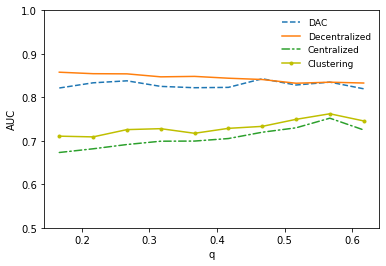

In [68]:

plt.plot(list_p, auc_alg,"--",label = 'DAC')
plt.plot(list_p, auc_b1,'',label = 'Decentralized')
plt.plot(list_p, auc_b2,linestyle=(0, (5, 2, 1, 2)), dash_capstyle='round',label = 'Centralized')
plt.plot(list_p, auc_clus,'y-o',markersize=3,label = 'Clustering')

plt.legend(loc='best',frameon=False,prop={'size': 9})
plt.xlabel('q')
plt.ylabel('AUC')
plt.ylim(0.5,1.0)
plt.show()

## P = 2/3

In [69]:
obs = 40
n = 10

In [70]:
auc_alg, auc_b1, auc_b2, auc_clus = [], [], [], []

p = 2/3
list_q = list(np.linspace(1/6,1-p,num=10,endpoint=False))

for q in list_q:

    result_1, result_2, result_3, result_4,result_5 = fit_models_upd(0.9,0.6,"bfgs")

    auc_alg.append(result_1)
    auc_b1.append(result_2)
    auc_b2.append(result_3)
    auc_clus.append(result_4)
    
    print('trial:', q)

False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'sku'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'sku'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'sku'}
         Current function value: 0.287681
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.423837
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.361164
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.226529
         Iterations: 41
         Function evaluations: 43
         Gradient evaluations: 4

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


         Current function value: 0.272659
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.486400
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.476841
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.481950
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.428747
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.424977
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.428747
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.376562
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.467889
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.374861
         Iterations: 98
         Function evaluations: 100
         Gradient evaluations: 100
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.592836
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.575148
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.305611
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'sku'}
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'sku'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'sku'}
         Current function value: 0.189764
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000005
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.383530
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.639677
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.631299
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.606240
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
False
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.126038
         Iterations: 42
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or

Optimization terminated successfully.
         Current function value: 0.126038
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.126763
         Iterations: 39
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.104026
         Iterations: 53
         Function evaluations: 55
         Gradient evaluations: 55
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.407940
         Iterations: 49
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.243508
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.635437
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.647854
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.615942
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.535135
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.599415
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000020
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.229365
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.244992
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.286805
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.000046
         Iterations: 94
         Function evaluations: 96
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.455398
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.567781
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.584102
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.530778
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.500755
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations:

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.495854
         Iterations: 95
         Function evaluations: 96
         Gradient evaluations: 96
Optimization terminated successfully.
         Current function value: 0.632299
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.320333
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.543056
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.546540
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.289781
         Iterations: 41
         Function evaluations: 42
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)



         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.372979
         Iterations: 86
         Function evaluations: 87
         Gradient evaluations: 87
Optimization terminated successfully.
         Current function value: 0.415383
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.420320
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.371250
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.314845
         Iterations: 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check

         Current function value: 0.298437
         Iterations: 100
         Function evaluations: 103
         Gradient evaluations: 103
Optimization terminated successfully.
         Current function value: 0.318350
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.128987
         Iterations: 51
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.344742
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.456478
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or

Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 86
         Function evaluations: 87
         Gradient evaluations: 87
Optimization terminated successfully.
         Current function value: 0.544908
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.496959
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.266044
         Iterations: 39
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.564421
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.514590
         Iterations: 35
         Function evaluations: 36
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.358853
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.366469
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.380302
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.349566
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.341571
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.421385
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.160990
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.318164
         Iterations: 55
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.217849
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.133639
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.482042
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.539220
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.153776
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.436040
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.208956
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.505043
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.329606
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.643268
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.507253
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.654171
         Iterations: 20
         Function evaluations: 23
         Gradient evaluations: 23
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.449054
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or

Optimization terminated successfully.
         Current function value: 0.000018
         Iterations: 61
         Function evaluations: 62
         Gradient evaluations: 62
Optimization terminated successfully.
         Current function value: 0.164970
         Iterations: 47
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.000021
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.000023
         Iterations: 53
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.180731
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
         Current function value: 0.103985
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.354389
         Iterations: 96
         Function evaluations: 97
         Gradient evaluations: 97
Optimization terminated successfully.
         Current function value: 0.371483
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.373641
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.349657
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'sku'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'sku'}
         Current function value: 0.269001
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.276948
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.353926
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.451946
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.296165
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.380608
         Iterations: 79
         Function evaluations: 81
         Gradient evaluations: 81
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.438650
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.281163
         Iterations: 41
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.389024
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.467167
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.295332
         Iterations: 40
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.432601
         Iterations: 36
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.289885
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.231318
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.318173
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.103039
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
         Current function value: 0.268596
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.277807
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.396147
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.539092
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.495969
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.553588
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
     

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'sku'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'sku'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'sku'}
         Current function value: 0.485858
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.599157
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.270548
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.157557
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.450268
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Opti

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.420717
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.390446
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.339188
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.529345
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.509175
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.499534
         Iterations: 34
         Function evaluations: 35
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.377635
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.359709
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.459714
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.569656
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.569656
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.562693
         Iterations: 30
         Function evaluations: 31
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.309329
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.487492
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.236895
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.000020
         Iterations: 43
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.300116
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.261603
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.177445
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.185573
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.189049
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.167696
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.422563
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.280948
         Iterations: 39
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.372471
         Iterations: 90
         Function evaluations: 91
         Gradient evaluations: 91
Optimization terminated successfully.
         Current function value: 0.394882
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.320631
         Iterations: 32
         Function evaluations: 33
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.444259
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.540893
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.573918
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.495913
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.505313
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.298790
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.388263
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.391150
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.263575
         Iterations: 43
         Function evaluations: 44
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.000020
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.077660
         Iterations: 63
         Function evaluations: 64
         Gradient evaluations: 64
Optimization terminated successfully.
         Current function value: 0.498923
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.082394
         Iterations: 61
         Function evaluations: 62
         Gradient evaluations: 62
Optimization terminated successfully.
         Current function value: 0.262729
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.554947
         Iterations: 36
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

         Current function value: 0.294249
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.599899
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.613400
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.000030
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
False
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.438445
         Iterations: 93
         Function evaluations: 94
         Gradient evaluations: 9

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.547880
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.582139
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'clus'}
False
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.396316
         Iterations: 93
         Function evaluations: 94
         Gradient evaluations: 94
Optimization terminated successfully.
         Current function value: 0.195535
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.359645
         Iterations: 41
         Function evaluations: 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


         Current function value: 0.214409
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.233889
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.239355
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.000056
         Iterations: 42
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.159132
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.363528
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.394151
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.253405
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.419695
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.284058
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.468869
         Iterations: 36
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.566872
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.525299
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.598758
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'sku'}
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'sku'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.303191
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Cu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000016
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.389657
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.515560
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.469827
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.148695
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.422504
         Iterations: 38
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.117877
         Iterations: 50
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.340165
         Iterations: 70
         Function evaluations: 71
         Gradient evaluations: 71
Optimization terminated successfully.
         Current function value: 0.365734
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.300353
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.375574
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'dept'}
         Current function 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.381970
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.515900
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.495885
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.500999
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.371720
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.329185
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.377812
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.316650
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.161448
         Iterations: 45
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.426047
         Iterations: 76
         Function evaluations: 78
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.461188
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.407004
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.440967
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.482248
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.332267
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
False
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'dept'}
         Current function value: 0.319873
         Iteratio

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.307053
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.428533
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.520101
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.343244
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'dept'}
         Current function value: 0.285137
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000008
         Iterati

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.424398
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.475838
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.255693
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.331540
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.282722
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'av

Optimization terminated successfully.
         Current function value: 0.261119
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.496939
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000017
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.383907
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.402552
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.000061
         Iterations: 51
         Function evaluations: 52
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.413837
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.397423
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.000016
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
         Current function value: 0.454165
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.640414
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.616067
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.535555
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.564293
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.520998
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.579307
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.463878
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.472312
         Iterations: 89
         Function evaluations: 90
         Gradient evaluations: 90
Optimization terminated successfully.
         Current function value: 0.502145
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.500913
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.420061
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'dept'}
False
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'dept'}
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'dept'}
         Current function value: 0.353120
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102


/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood


         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.666237
         Iterations: 21
         Function evaluations: 23
         Gradient evaluations: 23
Optimization terminated successfully.
         Current function value: 0.663689
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.632623
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'dept'}
         Current function value: 0.421345
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.414070
         Iterations: 38
         Function evaluations: 39
         Gradient eval

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.589603
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.552454
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.430474
         Iterations: 41
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.413722
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.382289
         Iterations: 39
         Function evaluations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.381057
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.401191
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.122830
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.299529
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.431680
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.390322
         Iterations: 39
         Function evaluations: 40
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.187916
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.000044
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.136072
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.111652
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.153766
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
         Current function value: 0.184941
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.638254
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'dept'}
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'dept'}
         Current function value: 0.246989
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.164217
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.000039
         Iterations: 69
         Function evaluations: 73
         Gradient evaluations: 73
Optimization terminated successfully.
         Current function value: 0.117537
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current functi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.598427
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'clus'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'sku'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'sku'}
         Current function value: 0.342474
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.193739
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.304961
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.282393
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 3

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.000059
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
         Current function value: 0.353705
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.514729
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.501615
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.428493
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.258138
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.325332
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
False
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'clus'}
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'sku'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'sku'}
         Current function value: 0.302203
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.539208
         Iterations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'sku'}
False
{0: 'sku', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'dept'}
False
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.370242
         Iterations: 88
         Function evaluations: 90
         Gradient evaluations: 90
Optimization terminated successfully.
         Current function value: 0.278996
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.239575
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.227152
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.131370
         Iterations: 49
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.369030
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.131039
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.123421
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.313732
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.259669
         Iterations: 45
         Function evaluations: 46
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


         Current function value: 0.368226
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000030
         Iterations: 54
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.366625
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.000020
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.482004
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.363120
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed

Optimization terminated successfully.
         Current function value: 0.450027
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.528488
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.564528
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.381751
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.385938
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 30
         Function evaluations: 31
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.222920
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.475585
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.378726
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.205583
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.396013
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.480368
         Iterations: 72
         Function evaluations: 73
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.354271
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
         Current function value: 0.363221
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.545107
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.558303
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.312768
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'dept'}
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'dept'}
         Current function value: 0.269286
         Iterations: 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

         Current function value: 0.267610
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.631365
         Iterations: 19
         Function evaluations: 20
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: 0.495574
         Iterations: 21
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
         Current function value: 0.683105
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.246828
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.291410
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.262134
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
False
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'dept'}
         Current function value: 0.338301
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.342230
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.428115
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.510755
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'dept'}
         Current function value: 0.267896
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000024
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.293351
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.318290
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current functi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.459653
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.450166
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.435643
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.434342
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 73
         Function evaluations: 74
         Gradient evaluations: 74
Optimization terminated successfully.
         Current function value: 0.155335
         Iterations: 49
         Function evaluations: 51
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.530128
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.286835
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.524082
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.378827
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.204063
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.285063
         Iterations: 60
         Function evaluations: 61
         Gradient evaluations: 61
Optimization terminated successfully.
         Current function value: 0.135456
         Iterations: 48
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.346301
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.252412
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.148587
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.133278
         Iterations: 51
         Function evaluations: 52
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.236455
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.244022
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.511807
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.219315
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.292128
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.251668
         Iterations: 43
         Function evaluations: 44
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.140169
         Iterations: 49
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.000021
         Iterations: 55
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.000034
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.143526
         Iterations: 100
         Function evaluations: 103
         Gradient evaluations: 103
Optimization terminated successfully.
         Current function value: 0.155339
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: Convergence

Optimization terminated successfully.
         Current function value: 0.668360
         Iterations: 21
         Function evaluations: 23
         Gradient evaluations: 23
Optimization terminated successfully.
         Current function value: 0.473795
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.407800
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.444713
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.277082
         Iterations: 42
         Function evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.471223
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.261612
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.481493
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.157843
         Iterations: 51
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.477066
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.168707
         Iterations: 50
         Function evaluations: 51
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.229950
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.107322
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.082151
         Iterations: 62
         Function evaluations: 63
         Gradient evaluations: 63
         Current function value: 0.109154
         Iterations: 100
         Function evaluations: 104
         Gradient evaluations: 104
Optimization terminated successfully.
         Current function value: 0.166184
         Iterations: 34
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.159640
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.333829
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.276732
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.230518
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.371465
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.427131
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.410173
         Iterations: 40
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.395601
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.334659
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.316077
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.421371
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.426251
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.434576
         Iterations: 35
         Function evaluations: 36
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.389464
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.389464
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.432977
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.323577
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'dept'}
         Current function value: 0.280581
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.447685
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.356283
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.367477
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.257256
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.496467
         Iterations: 35
         Function evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.463364
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.413979
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.319469
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.401596
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.236145
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.481378
         Iterations: 35
         Function evaluations: 36
  

Optimization terminated successfully.
         Current function value: 0.166112
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.205997
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.467358
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.254844
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.259377
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.379815
         Iterations: 40
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.318393
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.434431
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.361418
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.542887
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.566599
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.449293
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.250696
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
False
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'dept'}
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'sku', 4: 'dept'}
         Current function value: 0.369245
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.449675
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.286128
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.293171
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current functi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.360117
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.214987
         Iterations: 44
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.323265
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.201184
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.264219
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.612557
         Iterations: 29
         Function evaluations: 30
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.366373
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.352461
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.000059
         Iterations: 68
         Function evaluations: 69
         Gradient evaluations: 69
         Current function value: 0.305687
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.468411
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.502513
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.167331
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.388082
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.398647
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.416026
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.301708
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'clus'}
         Current function 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.285743
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.415103
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.459375
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.375142
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'sku', 4: 'dept'}
         Current function value: 0.384545
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000014
         Itera

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.524510
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.155045
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.297883
         Iterations: 41
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.257876
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.530320
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.000042
         Iterations: 48
         Function evaluations: 49
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.379173
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.382965
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.391115
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.374906
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'dept'}
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'dept'}
         Current function value: 0.363804
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current functi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.544047
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'sku'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.518777
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.511762
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.314985
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.400690
         Iterations: 40
         Function evaluations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.092084
         Iterations: 56
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.303069
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.291729
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.300119
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.226736
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.273254
         Iterations: 42
         Function evaluations: 43
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.501315
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.530580
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.498865
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.549173
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'dept'}
         Current function value: 0.371589
         Iterations: 100
     

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow

Optimization terminated successfully.
         Current function value: 0.363485
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.418799
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 41
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.472030
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.340836
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
         Current function value: 0.413127
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000019
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.416938
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.458305
         Iterations: 90
         Function evaluations: 91
         Gradient evaluations: 91
Optimization terminated successfully.
         Current function value: 0.492579
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.515502
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         C

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.280240
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.000044
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.000026
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.100430
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.162539
         Iterations: 46
         Function evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.224793
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.343737
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.130800
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.203707
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.154947
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.151673
         Iterations: 49
         Function evaluations: 51
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.132934
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.390214
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.510543
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.211050
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.625808
         Iterations: 27
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.541647
         Iterations: 35
         Function evaluations: 36
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.164837
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.119111
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
         Current function value: 0.229266
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.240945
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.259038
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.166269
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInve

Optimization terminated successfully.
         Current function value: 0.132823
         Iterations: 47
         Function evaluations: 49
         Gradient evaluations: 49
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'sku'}
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'sku'}
         Current function value: 0.263057
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.341543
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.512299
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

         Current function value: 0.296873
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.445334
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.454066
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.131786
         Iterations: 48
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.202506
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.340473
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.000023
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.253498
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.303373
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 52
         Function evaluations: 53
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.401801
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.240525
         Iterations: 43
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.390679
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.440931
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 0.344990
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.493379
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.245064
         Iterations: 40
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.476456
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.365963
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.466610
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated succ

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.428742
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.231861
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.375567
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.225461
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.421051
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.441643
         Iterations: 37
         Function evaluations: 38
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.233070
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.210154
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
         Current function value: 0.351009
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.603854
         Iterations: 20
         Function evaluations: 21
         Gradient evaluations: 21
Optimization terminated successfully.
         Current function value: 0.574229
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.607226
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.265789
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.265789
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.238781
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.364291
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.290132
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.085002
         Iterations: 60
         Function evaluations: 61
         Gradient evaluations: 61
Optimization terminated successfully.
         Current function value: 0.232717
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.171387
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.251312
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.202752
         Iterations: 47
         Function evaluations: 48
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountere

         Current function value: 0.383817
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.413909
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.432280
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.321961
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
False
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'clus'}
         Current function value: 0.357114
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.446754
         Itera

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.346024
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.668924
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.663862
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.663397
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'dept'}
         Current function value: 0.412003
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.467283
         Itera

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.579140
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.515896
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'dept'}
False
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
         Current function value: 0.410595
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.461400
         Iterations: 38
      

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.316746
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.000064
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.173434
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.192230
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.222735
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.223332
         Iterations: 36
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.384204
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.434686
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.334375
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.274115
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.307154
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.479437
         Iterations: 56
         Function evaluations: 57
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.484633
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'dept'}
         Current function value: 0.351099
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.219432
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.199408
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.419762
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.318162
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.373987
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.331963
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.236610
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.289022
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.155880
         Iterations: 38
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.313809
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.501542
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.536340
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.368556
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'sku'}
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'sku'}
         Current function value: 0.297913
         Iterations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.330093
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.205303
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.252732
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.236783
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.182371
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.399445
         Iterations: 39
         Function evaluations: 40
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.227488
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.533197
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.298265
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.258767
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.000024
         Iterations: 92
         Function evaluations: 93
         Gradient evaluations: 93
Optimization terminated successfully.
         Current function value: 0.476318
         Iterations: 35
         Function evaluations: 36
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.283057
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.375281
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.154921
         Iterations: 49
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.397926
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.243531
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.523228
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.463940
         Iterations: 82
         Function evaluations: 83
         Gradient evaluations: 83
Optimization terminated successfully.
         Current function value: 0.475394
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.442404
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.498826
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'clus'}
         Current function value: 0.347115
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current functi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.580543
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.473490
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.379760
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.318072
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.523736
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.200763
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.308417
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.509129
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.377116
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.437488
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.312065
         Iterations: 42
         Function evaluations: 43
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.222645
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.086531
         Iterations: 62
         Function evaluations: 63
         Gradient evaluations: 63
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.415209
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.328484
         Iterations: 67
         Function evaluations: 68
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.218656
         Iterations: 45
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.434004
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 0.326552
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.383437
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.227120
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


{0: 'dept', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'dept'}
         Current function value: 0.358197
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.376571
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.489364
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.154166
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.167241
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.388196
         Iterations: 38
         Function

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.477004
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.207517
         Iterations: 42
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.501597
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.448009
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.375756
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.370287
         Iterations: 91
         Function evaluations: 92
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.395267
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.496183
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.450410
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.295754
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.516671
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.355515
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.204671
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.445398
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.445398
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.432502
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.446806
         Iterations: 32
         Function evaluations: 34
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.455569
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.434162
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.433227
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.273055
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.392261
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.313555
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.359940
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.438210
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.304092
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 4

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.415356
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.460503
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.413602
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.322147
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.099566
         Iterations: 62
         Function evaluations: 63
         Gradient evaluations: 63
         Current function value: 0.384926
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.443065
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.421943
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.083602
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
         Current function value: 0.266719
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.460168
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.451171
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.424935
         Iterations: 92
         Function evaluations: 93
         Gradient evaluations: 93
Optimization terminated successfully.
         Current function value: 0.466314
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.472488
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.453766
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'sku'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'sku'}
         Current function value: 0.484203
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


False
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'sku'}
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'sku'}
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'dept'}
False
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'dept'}
         Current function value: 0.300251
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.184305
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.360714
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.148574
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.424382
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.285206
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.322166
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.150601
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.250309
         Iterations: 44
         Function evaluations: 45
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.525358
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.591366
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.567326
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.568574
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'sku'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'sku'}
         Current function value: 0.294186
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.445829
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.301953
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.482621
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.423658
         Iterations: 89
         Function evaluations: 90
         Gradient evaluations: 90
Optimization terminated successfully.
         Current function value: 0.456566
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'av

Optimization terminated successfully.
         Current function value: 0.515530
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'sku'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.276743
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.243739
         Iterations: 42
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.140232
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.407992
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.430869
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.351912
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.409001
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.382096
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.469937
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Fal

Optimization terminated successfully.
         Current function value: 0.392002
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.289204
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.114285
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.387727
         Iterations: 93
         Function evaluations: 94
         Gradient evaluations: 94
Optimization terminated successfully.
         Current function value: 0.571905
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.577949
         Iterations: 27
         Function evaluations: 28
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.406579
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.522968
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.528507
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.508084
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'sku'}
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.465947
         Iterations: 29
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.312812
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.340032
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.377034
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.324633
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.445384
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.399575
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.422397
         Iterations: 69
         Function evaluations: 70
         Gradient evaluations: 70
Optimization terminated successfully.
         Current function value: 0.426344
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.440703
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.377224
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.366492
         Iterations: 44
         Function evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.672488
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.319824
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.136431
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimiza

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.497087
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.439173
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.462531
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.443494
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.479056
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'de

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_m

Optimization terminated successfully.
         Current function value: 0.514215
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.311396
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.164708
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.426746
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.383268
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 42
         Function evaluations: 43
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.143677
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.000015
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.176150
         Iterations: 47
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.318644
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
         Current function value: 0.328720
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.461715
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.535536
         Iterations: 65
         Function evaluations: 66
         Gradient evaluations: 66
Optimization terminated successfully.
         Current function value: 0.616916
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.530003
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.585443
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
False
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'sku'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'dept'}
{0: 'dep

         Function evaluations: 51
         Gradient evaluations: 51
         Current function value: 0.366829
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.384449
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.381537
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.383056
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'dept'}
         Current function value: 0.349354
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated su

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.279326
         Iterations: 40
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.409069
         Iterations: 64
         Function evaluations: 65
         Gradient evaluations: 65
Optimization terminated successfully.
         Current function value: 0.446587
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.391511
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.486402
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountere

Optimization terminated successfully.
         Current function value: 0.611439
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.330845
         Iterations: 91
         Function evaluations: 92
         Gradient evaluations: 92
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.183313
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.129211
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


         Current function value: 0.360472
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.524370
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.563298
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.476629
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
False
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'sku', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'dept'}
         Current function value: 0.258547
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.359742
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.295168
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.144342
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.498365
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.217651
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.317915
         Iterations: 42
         Function evaluations: 43
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.597471
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.451525
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
False
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'sku'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.394628
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.466853
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.393641
         Iterations: 23
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.506722
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.445819
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.346083
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.337053
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.383177
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.380558
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.334752
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'sku'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'sku'}
Optimization terminated successfully.
         Current function value: 0.379505
         Iterations: 81
         Function evaluations: 82
         Gradient evaluations: 82
Optimization terminated successfully.
         Current function value: 0.467600
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.346651
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.550281
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.493276
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.592669
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.535628
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.637017
         Iterations: 25
         Function evaluations: 26
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.312145
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.298104
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.225305
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.000060
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.088467
         Iterations: 60
         Function evaluations: 61
         Gradient evaluations: 61
Optimization terminated successfully.
         Current function value: 0.295866
         Iterations: 46
         Function evaluations: 47
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.285915
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.304131
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.292752
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42


/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.000027
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.245616
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.402929
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.124549
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.218187
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.545502
         Iterations: 34
         Function evaluations: 35
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))



         Current function value: 0.529183
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.414088
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.404384
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.249815
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.266348
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.443920
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.407367
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'sku'}
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.312353
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.278273
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.091598
         Iterations: 50
         Function evaluations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.453858
         Iterations: 97
         Function evaluations: 98
         Gradient evaluations: 98
Optimization terminated successfully.
         Current function value: 0.561439
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.355662
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.555173
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.477889
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.000019
         Iterations: 55
         Function evaluations: 56
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.432066
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.203233
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.394162
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.370086
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.470610
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.477151
         Iterations: 38
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.438664
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.267837
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.204402
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.495035
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000026
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.209756
         Iterations: 48
         Function evaluations: 49
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.174011
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.478505
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.089218
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
         Current function value: 0.422926
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.451128
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.531911
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountere

         Current function value: 0.330270
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.538310
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.561748
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.399982
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.236413
         Iterations: 66
         Function evaluations: 67
         Gradient evaluations: 67
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.274490
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
False
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.385624
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.439907
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000047
         Iterations: 64
         Function evaluations: 65
         Gradient evaluations: 65
Optimization terminated successfully.
         Current function value: 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.075033
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.131816
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.298331
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.167737
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.260821
         Iterations: 35
         Function evaluations: 36
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.439268
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.269557
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.422497
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.561774
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.527307
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.192211
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.555740
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.133387
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.513372
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.556613
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.544109
         Iterations: 34
         Function evaluations: 35
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.422817
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.284327
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.535559
         Iterations: 30
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.298585
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.267030
         Iterations: 41
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.341376
         Iterations: 35
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: Convergence

Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.368689
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.424024
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.258796
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.563599
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.211338
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
trial: 0.2
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'dept'}
         Current function value: 0.414159
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.494159
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.168905
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.378063
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         C

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.389648
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.127952
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.297761
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.180771
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.098369
         Iterations: 56
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.278077
         Iterations: 96
         Function evaluations: 98
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.373014
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.426868
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.428774
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.400573
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.259277
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.296825
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.168564
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.282303
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.341042
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.206515
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.000022
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.000021
         Iterations: 88
         Function evaluations: 89
         Gradient evaluations: 89
Optimization terminated successfully.
         Current function value: 0.313930
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 39
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.342968
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.421415
         Iterations: 60
         Function evaluations: 61
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.289417
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.445602
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.299327
         Iterations: 40
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 44
         Function evaluations: 45
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.512973
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.415937
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.476840
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.517122
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.573835
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.636649
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.457502
         Iterations: 40
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.372178
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.543266
         Iterations: 31
         Function evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)



         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.522904
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 0.418201
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.680600
         Iterations: 23
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.681198
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.601906
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.298712
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.327854
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.305891
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.344354
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.336591
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.512225
         Iterations: 65
         Function evaluations: 66
         Gradient evaluations: 66
Optimization terminated successfully.
         Current function value: 0.519083
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.528263
         Iterations: 23
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.494251
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.370301
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.310734
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.202698
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.098373
         Iterations: 52
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.307693
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.229240
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountere

False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.473886
         Iterations: 97
         Function evaluations: 98
         Gradient evaluations: 98
Optimization terminated successfully.
         Current function value: 0.251209
         Iterations: 40
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.536028
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.528175
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.611334
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.134520
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.273873
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.205570
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.000015
         Iterations: 39
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.180406
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.088765
         Iterations: 55
         Function evaluations: 58
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.253779
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.547501
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.225628
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.332393
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.481100
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.377246
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed

         Current function value: 0.195762
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.326963
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.339711
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.184103
         Iterations: 44
         Function evaluations: 46
         Gradient evaluations: 46
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'dept'}
         Current function value: 0.402501
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successf

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

{0: 'dept', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'dept'}
         Current function value: 0.332386
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.379693
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.000029
         Iterations: 76
         Function evaluations: 78
         Gradient evaluations: 78
Optimization terminated successfully.
         Current function value: 0.346407
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.425420
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.251053
         Iterations: 43
         Functio

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.394048
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.535208
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.539933
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.519735
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
False
{0: 'clus', 1: 'sku', 2: 'sku', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'dept'}
         Current function value: 0.304553
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successful

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.351356
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.260641
         Iterations: 63
         Function evaluations: 64
         Gradient evaluations: 64
Optimization terminated successfully.
         Current function value: 0.176192
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.315892
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.465554
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.433888
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.414264
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000017
         Iterations: 33
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.160115
         Iterations: 44
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.402657
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.586351
         Iterations: 29
         Function evaluations: 30
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.420937
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.424208
         Iterations: 43
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.424739
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.422699
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.420084
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_m

Optimization terminated successfully.
         Current function value: 0.432771
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.425149
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'dept'}
         Current function value: 0.298693
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.181402
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.231738
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.211568
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.545536
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.208558
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.369794
         Iterations: 38
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

Optimization terminated successfully.
         Current function value: 0.310682
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.316509
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.324864
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.187199
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.171090
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.368143
         Iterations: 40
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.225229
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.353429
         Iterations: 76
         Function evaluations: 77
         Gradient evaluations: 77
Optimization terminated successfully.
         Current function value: 0.357754
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.331393
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.348080
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
False
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'clus'}
         Current functio

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.336237
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.575659
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.650150
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.514935
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.497838
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.334599
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.358449
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.303647
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.401201
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.356815
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

Optimization terminated successfully.
         Current function value: 0.405591
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.433113
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
False
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'dept'}
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'sku', 4: 'dept'}
         Current function value: 0.257690
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.478113
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.000035
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.214431
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.440866
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.418368
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.440148
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.436039
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.435693
         Iterations: 30
         Function evaluations: 31
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.408273
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.431930
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.418976
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.367970
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.325507
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.371656
         Iterations: 39
         Function evaluations: 40
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.269310
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.083815
         Iterations: 63
         Function evaluations: 64
         Gradient evaluations: 64
Optimization terminated successfully.
         Current function value: 0.480384
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.496243
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.326660
         Iterations: 42
         Function evaluations: 43
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.318969
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.265875
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.276754
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.492325
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.500594
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.388657
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.287906
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.475830
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.288085
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.425271
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.432386
         Iterations: 30
         Function evaluations: 31
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.482263
         Iterations: 83
         Function evaluations: 84
         Gradient evaluations: 84
Optimization terminated successfully.
         Current function value: 0.535922
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.565020
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.473651
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.314037
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


         Current function value: 0.375122
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.234023
         Iterations: 41
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.159085
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.522591
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.365787
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.000018
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.443341
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.252891
         Iterations: 40
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.454470
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.436221
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.361444
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.409393
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.627466
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.597444
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.645436
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'dept'}
         Current function value: 0.349939
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.369659
         Itera

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.354652
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.290478
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.357720
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.315606
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.464304
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.184624
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.466054
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.427243
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.447944
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.270169
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.501933
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
         Current function value: 0.395011
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.656081
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.608852
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.634352
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'clus'}
         Current function value: 0.330099
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.198165
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.363714
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000026
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.277457
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
         Current function value: 0.199792
         Iterations: 100
         Function evaluations: 103
         Gradient evaluations: 103
Optimization terminated successfully.
         Current function value: 0.212189
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.433987
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.423346
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.441586
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.276235
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.419538
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.375630
         Iterations: 39
         Function evaluations: 40
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow

Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.167172
         Iterations: 45
         Function evaluations: 49
         Gradient evaluations: 49
         Current function value: 0.226469
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.302992
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.316364
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.247862
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.287897
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.331398
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.488347
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.000017
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.331976
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.363034
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.523280
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.466318
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.469407
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.118560
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.423495
         Iterations: 38
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.238198
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.372320
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
         Current function value: 0.374306
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.550825
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.634771
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.451418
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'av

Optimization terminated successfully.
         Current function value: 0.000028
         Iterations: 85
         Function evaluations: 86
         Gradient evaluations: 86
Optimization terminated successfully.
         Current function value: 0.000016
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.000033
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 31
         Function evaluations: 32
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.369436
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.369436
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.364869
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.360195
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'sku'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'sku'}
         Current function value: 0.284004
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.541395
         Iterations: 46
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.570780
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.634205
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.626802
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.660023
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.089670
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.190735
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.472997
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.358730
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.177480
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.347085
         Iterations: 38
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


         Iterations: 47
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.205361
         Iterations: 44
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.186073
         Iterations: 99
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.204459
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.207369
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.185320
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'de

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.386123
         Iterations: 93
         Function evaluations: 94
         Gradient evaluations: 94
Optimization terminated successfully.
         Current function value: 0.428734
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.458021
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.373241
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'dept'}
False
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'sku'}
False
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'de

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.326840
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.225017
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
         Current function value: 0.331880
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.514251
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.438671
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.499424
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
tri

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed

Optimization terminated successfully.
         Current function value: 0.000124
         Iterations: 61
         Function evaluations: 65
         Gradient evaluations: 65
Optimization terminated successfully.
         Current function value: 0.000022
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.298134
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000020
         Iterations: 64
         Function evaluations: 65
         Gradient evaluations: 65
Optimization terminated successfully.
         Current function value: 0.292531
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 27
         Function evaluations: 29
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.211110
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.382142
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.106439
         Iterations: 60
         Function evaluations: 61
         Gradient evaluations: 61
Optimization terminated successfully.
         Current function value: 0.194223
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.337917
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.337917
         Iterations: 40
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.661845
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.655699
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.654352
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.523784
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimizat

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.277471
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.140183
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.219262
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
         Current function value: 0.271131
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.421576
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.324193
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.635642
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.360333
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.146768
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.412880
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.308679
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.187954
         Iterations: 46
         Function evaluations: 47
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.383139
         Iterations: 73
         Function evaluations: 74
         Gradient evaluations: 74
Optimization terminated successfully.
         Current function value: 0.386034
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.388474
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.370852
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.415557
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.499330
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.373947
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
         Current function value: 0.363075
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.486472
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.501535
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.163975
         Iterations: 48
         Function evaluations: 50
         Gradient evaluations: 50
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

         Current function value: 0.365000
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.574358
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.610185
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.288537
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.304660
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.475765
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.482784
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.374769
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.303213
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.452380
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.547798
         Iterations: 34
         Function evaluations: 35
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.364557
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.062315
         Iterations: 62
         Function evaluations: 63
         Gradient evaluations: 63
Optimization terminated successfully.
         Current function value: 0.381017
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
         Current function value: 0.352703
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.643402
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.448138
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: Convergence

{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.265543
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.265547
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.219475
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.000016
         Iterations: 79
         Function evaluations: 83
         Gradient evaluations: 83
Optimization terminated successfully.
         Current function value: 0.285635
         Iterations: 43
         Function evaluations: 44


/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.521061
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.354391
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.217369
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.452357
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.311023
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.368833
         Iterations: 39
         Function evaluations: 40
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.369809
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.486940
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.524198
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.404266
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.256971
         Iterations: 63
         Function evaluations: 64
         Gradient evaluations: 64
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.000019
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.297022
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.311386
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.514864
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.364984
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.156487
         Iterations: 52
         Function evaluations: 53
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.351661
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.434924
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.442375
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.367939
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.444256
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.214683
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.278373
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.178302
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.554239
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.459703
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.447881
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.641082
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.631374
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.618104
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'sku'}
False
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'dept'}
         Current function value: 0.375749
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.448971
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.421091
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.283760
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.362909
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.517961
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.401967
         Iterations: 34
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.448350
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.595403
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.291524
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.469244
         Iterations: 54
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.476009
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.500791
         Iterations: 32
         Function evaluations: 34
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or

Optimization terminated successfully.
         Current function value: 0.206320
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.327025
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.207996
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.194200
         Iterations: 96
         Function evaluations: 97
         Gradient evaluations: 97
Optimization terminated successfully.
         Current function value: 0.226535
         Iterations: 36
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


         Current function value: 0.211109
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.223501
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.458445
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.317943
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.213072
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.000024
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: Convergence

Optimization terminated successfully.
         Current function value: 0.515365
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.433058
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.372680
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.129221
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.589244
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.589244
         Iterations: 26
         Function evaluations: 27
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed t

Optimization terminated successfully.
         Current function value: 0.224038
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.136499
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
False
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'dept'}
{0: 'sku', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'dept'}
         Current function value: 0.308865
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.234632
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.358781
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.413061
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.400058
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
         Current function value: 0.394579
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.534417
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.526624
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.429274
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.363831
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.370916
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.262151
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.313731
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.516484
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.233747
         Iterations: 44
         Function evaluations: 45
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.256518
         Iterations: 95
         Function evaluations: 96
         Gradient evaluations: 96
Optimization terminated successfully.
         Current function value: 0.265567
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.292029
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.193036
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.467967
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.428908
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.426168
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.134362
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.000045
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.435928
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.372021
         Iterations: 40
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.494815
         Iterations: 84
         Function evaluations: 85
         Gradient evaluations: 85
Optimization terminated successfully.
         Current function value: 0.514673
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.548977
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.481612
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.438105
         Iterations: 63
         Function evaluations: 64
         Gradient evaluations: 64
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.366923
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.470725
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.268298
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.482483
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.651118
         Iterations: 20
         Function evaluations: 22
         Gradient evaluations:

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.465157
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.328238
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.000018
         Iterations: 43
         Function evaluations: 45
         Gradient evaluations: 45
         Current function value: 0.333477
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.393273
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.436946
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', H

Optimization terminated successfully.
         Current function value: 0.383147
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.281855
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.413479
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.455814
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.338529
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.485474
         Iterations: 36
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.174229
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.000021
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.000015
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.000035
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 32
         Function evaluations: 33
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood

Optimization terminated successfully.
         Current function value: 0.463724
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.295978
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.579262
         Iterations: 21
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
         Current function value: 0.576161
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.566988
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'sku'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'sku'}
         Current function value: 0.369566
         Iteratio

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_m

Optimization terminated successfully.
         Current function value: 0.575645
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.580465
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.567456
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'clus'}
         Current function value: 0.334461
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.408419
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.462781
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.232387
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.209117
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.168380
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'av

Optimization terminated successfully.
         Current function value: 0.318722
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.318722
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.321527
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.297245
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'clus'}
         Current function value: 0.242329
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 1

Optimization terminated successfully.
         Current function value: 0.306459
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.522598
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'dept', 1: 'sku', 2: 'sku', 3: 'dept', 4: 'clus'}
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.296940
         Iterations: 60
         Function evaluations: 61
         Gradient evaluations: 61
Optimization terminated successfully.
         Current function value: 0.292509
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.390431
         Iterations: 39
         Function evaluations:

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.280929
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.188754
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.452216
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.518295
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.400604
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.480437
         Iterations: 34
         Function evaluations: 35
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.449431
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.408139
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.491089
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.232118
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.436575
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.540499
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.404582
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.430900
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.180030
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.000058
         Iterations: 54
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.288465
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 44
         Function evaluations: 45
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.366459
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.565314
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.478688
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.589253
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.329761
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.577447
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.299099
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'dept'}
         Current function value: 0.428034
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.365135
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.323925
         Iterations: 39
         Function evaluations: 41
         Gradient evaluations: 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.247486
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.208498
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.231970
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.229785
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.314913
         Iterations: 41
         Function evaluations: 42
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.192050
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.154129
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
         Current function value: 0.295865
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.304012
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.318376
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.221910
         Iterations: 44
         Function evaluations: 46
         Gradient evaluations: 46
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.453389
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.560894
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'sku'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'sku'}
         Current function value: 0.415351
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.114892
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.318561
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed

Optimization terminated successfully.
         Current function value: 0.000015
         Iterations: 42
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.326684
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.445651
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.261548
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.000021
         Iterations: 61
         Function evaluations: 62
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.000071
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.109510
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.109510
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.066543
         Iterations: 55
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.118326
         Iterations: 54
         Function evaluations: 55
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountere

Optimization terminated successfully.
         Current function value: 0.326964
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.323050
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.278232
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 36
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.168152
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.110377
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.339801
         Iterations: 89
         Function evaluations: 91
         Gradient evaluations: 91
Optimization terminated successfully.
         Current function value: 0.373639
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.406120
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.291990
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'd

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.399044
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.277420
         Iterations: 41
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.393918
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.242526
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.416738
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.230673
         Iterations: 45
         Function evaluations: 46
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.372206
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.611336
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.611336
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.573855
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.631021
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'd

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.538842
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.425930
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.128648
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.321277
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.401084
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'av

Optimization terminated successfully.
         Current function value: 0.337054
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.312862
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.324581
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.281699
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.197994
         Iterations: 46
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.372117
         Iterations: 39
         Function evaluations: 40
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.450658
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.498944
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.401808
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.328322
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.192978
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.516620
         Iterations: 35
         Function evaluations: 36
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.153713
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.348320
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.404675
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.287927
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.113355
         Iterations: 57
         Function evaluations: 59
         Gradient evaluations: 59
         Current function value: 0.323018
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.310698
         Iterations: 67
         Function evaluations: 68
         Gradient evaluations: 68
Optimization terminated successfully.
         Current function value: 0.313802
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.300317
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.351980
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'sku'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'sku'}
         Current function value: 0.427899
         Iterations: 100
     

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.384404
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.273369
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.292863
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.363372
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.126813
         Iterations: 52
         Function evaluations: 53
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 59
         Function evaluations: 62
         Gradient evaluations: 62
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.138563
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
         Current function value: 0.135372
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.141299
         Iterations: 31
         Function evaluations: 35
         Gradient evaluations: 35
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.272495
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.308840
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.279386
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.458292
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.189360
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.089193
         Iterations: 44
         Function evaluations: 46
         Gradient evaluations: 46
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.207784
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.454963
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.201903
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.262243
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.369132
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.347079
         Iterations: 36
         Function evaluations: 38
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed

         Current function value: 0.378394
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.281113
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.303897
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.302019
         Iterations: 39
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.367705
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.460176
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.558374
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.408291
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.451365
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.496797
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.453205
         Iterations: 30
         Function evaluations: 31
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.289001
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.169279
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.096533
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.260386
         Iterations: 42
         Function evaluations: 44
         Gradient evaluations: 44
      

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.236837
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.137111
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.151134
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.458851
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.206940
         Iterations: 46
         Function evaluations: 47
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'av


         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.350075
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.514732
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.331583
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.609234
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.519274
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.601586
         Iterations: 28
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
False
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
         Current function value: 0.246661
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.474602
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.168759
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.158800
         Iterations: 47
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.112300
         Iterations: 51
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.144229
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.166884
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.201413
    

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.469113
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.000022
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.233935
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.163907
         Iterations: 49
         Function evaluations: 50
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.171622
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.370667
         Iterations: 85
         Function evaluations: 86
         Gradient evaluations: 86
Optimization terminated successfully.
         Current function value: 0.380904
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.352978
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.385240
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.631171
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.256928
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.552229
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.245327
         Iterations: 39
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.390284
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.379456
         Iterations: 32
         Function evaluations: 33
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000026
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value: 0.209597
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
         Current function value: 0.236115
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.253555
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.242512
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.246198
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', H

Optimization terminated successfully.
         Current function value: 0.368188
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.276659
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.107083
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.267064
         Iterations: 86
         Function evaluations: 87
         Gradient evaluations: 87
Optimization terminated successfully.
         Current function value: 0.284032
         Iterations: 35
         Function evaluations: 36
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.648800
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.680040
         Iterations: 22
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.686241
         Iterations: 20
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
         Current function value: 0.648604
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'sku', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'dept'}
False

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.189948
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
False
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.354983
         Iterations: 91
         Function evaluations: 92
         Gradient evaluations: 92
Optimization terminated successfully.
         Current function value: 0.362469
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.270623
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.454579
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.509275
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.321278
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.316797
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.295195
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.236586
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.129576
         Iterations: 54
         Function evaluations: 55
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.358096
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.286842
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.344771
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.290348
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.433150
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.437004
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.469937
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.377743
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.486677
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.446406
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.272813
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.362393
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.525506
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.274411
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.179507
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.075424
         Iterations: 64
         Function evaluations: 65
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.624542
         Iterations: 23
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.636384
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.529081
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'dept'}
False
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.428459
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.423388
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.223088
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.000018
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.574461
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.482154
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.234248
         Iterations: 45
         Function evaluations: 46
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed

Optimization terminated successfully.
         Current function value: 0.237454
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.175958
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.000020
         Iterations: 60
         Function evaluations: 61
         Gradient evaluations: 61
Optimization terminated successfully.
         Current function value: 0.094298
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 51
         Function evaluations: 52
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

         Current function value: 0.309905
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.373223
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.399717
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.310449
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.335747
         Iterations: 68
         Function evaluations: 69
         Gradient evaluations: 69
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.388628
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.401712
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.399482
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.333023
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.345257
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.364875
         Iterations: 37
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.567861
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.631493
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'sku'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'sku'}
         Current function value: 0.405548
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.540591
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.484384
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.125781
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.424303
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.101971
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.341615
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.277864
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.266140
         Iterations: 46
         Function evaluations: 47
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.526437
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.220037
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.459709
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.234389
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.358627
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.478934
         Iterations: 48
         Function evaluations: 49
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed

Optimization terminated successfully.
         Current function value: 0.425956
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.403769
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.314103
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.377053
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.256581
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.335914
         Iterations: 40
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.362977
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.267851
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.000030
         Iterations: 44
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.357109
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
         Current function value: 0.203462
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.416995
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.525628
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.439721
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.243122
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.443609
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.335175
         Iterations: 40
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.158921
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
         Current function value: 0.361197
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.425956
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.391189
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.430786
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'dept'}
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4:

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.462620
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.475720
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.378031
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
False
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.495182
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.527940
         Iterations: 34
         Function evaluations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.407947
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.486109
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.442383
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.309978
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.334054
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.396152
         Iterations: 40
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.144446
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.205744
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.125730
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
         Current function value: 0.164889
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.168365
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.109971
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.216496
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.120329
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.138633
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.000023
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.000017
         Iterations: 27
         Function evaluations: 29
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.409482
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.261259
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.458015
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.404216
         Iterations: 84
         Function evaluations: 85
         Gradient evaluations: 85
Optimization terminated successfully.
         Current function value: 0.492494
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.503740
         Iterations: 28
         Function evaluations: 29
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.478369
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.494922
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.435837
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.417505
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.278913
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminate

Optimization terminated successfully.
         Current function value: 0.482406
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.322348
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.250783
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.359442
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.395665
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


         Current function value: 0.617518
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.683729
         Iterations: 22
         Function evaluations: 23
         Gradient evaluations: 23
Optimization terminated successfully.
         Current function value: 0.670651
         Iterations: 23
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.637069
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.320339
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.385695
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
trial: 0.25
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.386557
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.214753
         Iterations: 45
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.535903
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.571756
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'sku'}
False
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.382091
         Iterations: 86
         Function evaluations: 88
         Gradient evaluations: 88
Optimization terminated successfully.
         Current function value: 0.414950
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.303337
         Iterations: 42
         Function evaluations: 4

Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.346275
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.123351
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.256416
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.341187
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.239668
         Iterations: 43
         Function evaluations: 44
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.467755
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.533106
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.552711
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.510395
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'clus'}
         Current function value: 0.295349
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.372457
         Itera

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


False
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'dept'}
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'dept'}
         Current function value: 0.280982
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.266452
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.368537
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.184228
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.133120
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current functi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.546710
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.258006
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.193190
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.524655
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.488331
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.328293
         Iterations: 42
         Function evaluations: 43
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.534265
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.566879
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.594326
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.482461
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.370427
         Iterations: 57
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed

Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.234669
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.275941
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.329775
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.434076
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.471859
         Iterations: 36
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.231869
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
         Current function value: 0.332703
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.391856
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.406764
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.364437
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.221348
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.312849
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.465923
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.368348
         Iterations: 75
         Function evaluations: 76
         Gradient evaluations: 76
Optimization terminated successfully.
         Current function value: 0.391632
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31


/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.435071
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.345161
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.529418
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.435305
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.416752
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed

Optimization terminated successfully.
         Current function value: 0.086396
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.181331
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.317107
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
         Current function value: 0.117286
         Iterations: 100
         Function evaluations: 103
         Gradient evaluations: 103
Optimization terminated successfully.
         Current function value: 0.186281
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47


/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.162324
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.190795
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.365157
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.356104
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.448104
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.361062
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.075912
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
         Current function value: 0.343751
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.433034
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.448900
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.471772
         Iterations: 67
         Function evaluations: 68
         Gradient evaluations: 68
Optimization terminated successfully.
         Current function value: 0.525234
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.506828
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.399872
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.269084
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.248707
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.283635
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.154581
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.324694
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
False
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
      

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.419558
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.465391
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.410269
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.494341
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'dept'}
         Current function value: 0.401330
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.246426
         Itera

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.535929
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.274476
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.231588
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.577053
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.384745
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.307976
         Iterations: 41
         Function evaluations: 42
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.324029
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.135256
         Iterations: 51
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.348261
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.000028
         Iterations: 68
         Function evaluations: 69
         Gradient evaluations: 69
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 40
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.500971
         Iterations: 36
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.385905
         Iterations: 43
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.416619
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.442063
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.215838
         Iterations: 39
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.222797
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.330785
         Iterations: 39
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)



         Current function value: 0.289046
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
         Current function value: 0.278961
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.480680
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.442217
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.479495
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}


/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.404342
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.187490
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.444674
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.484155
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.280465
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.422617
         Iterations: 38
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.296130
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.476484
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.467149
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.466958
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.319196
         Iterations: 44
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed t

Optimization terminated successfully.
         Current function value: 0.246670
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.358300
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.378396
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.222510
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.418382
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.313629
         Iterations: 40
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.309897
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.178053
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.208230
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.514676
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.135388
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.000053
         Iterations: 51
         Function evaluations: 54
         Gradient evaluations: 54
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.118501
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.399570
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.387664
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
         Current function value: 0.315742
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.414570
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31


/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.437458
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.381803
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'sku'}
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.332041
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.404294
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.200055
         Iterations: 44
         Function evaluations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.318730
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.222231
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.471773
         Iterations: 49
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.330276
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.518399
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.529050
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.226537
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.312229
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.175400
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.433487
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.269473
         Iterations: 42
         Function evaluations: 43
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.231335
         Iterations: 42
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.000024
         Iterations: 54
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.396705
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.301085
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 61
         Function evaluations: 62
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.298834
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.316783
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.351804
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.282081
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.370145
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.114670
         Iterations: 56
         Function evaluations: 57
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.469135
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.144358
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.184902
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.336923
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.535390
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.494297
         Iterations: 36
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.480628
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.448140
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.456557
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.301740
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.439500
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.288424
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.314474
         Iterations: 96
         Function evaluations: 97
         Gradient evaluations: 97
Optimization terminated successfully.
         Current function value: 0.329779
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.254925
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.348177
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed

Optimization terminated successfully.
         Current function value: 0.000018
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.426348
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.376070
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.000018
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.211971
         Iterations: 43
         Function evaluations: 44
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.223847
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.218418
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.118592
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.378034
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.370396
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.327636
         Iterations: 38
         Function evaluations: 40
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.474275
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.390700
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.375632
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.289834
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.364606
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.342016
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.391716
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.442420
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.411443
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.555818
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.109996
         Iterations: 60
         Function evaluations: 61
         Gradient evaluations: 61
Optimization terminated successfully.
         Current function value: 0.183507
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.497401
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.349397
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.428243
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.378993
         Iterations: 38
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.249410
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.449994
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.403639
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.357977
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.386459
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.500243
         Iterations: 36
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.576448
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.591056
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.515683
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.424808
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.317436
         Iterations: 40
         Function evaluations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)



         Function evaluations: 39
         Gradient evaluations: 39
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.323095
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value: 0.399685
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.164009
         Iterations: 47
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.389269
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.255781
         Iterations: 46
         Function eva

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.445309
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.430274
         Iterations: 94
         Function evaluations: 96
         Gradient evaluations: 96
Optimization terminated successfully.
         Current function value: 0.272433
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.275590
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.331012
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.206689
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.377745
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.267898
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.266818
         Iterations: 42
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.311475
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000025
         Iterations: 56
         Function evaluations: 58
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.337170
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.437690
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.421244
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.239442
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.448217
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
         Current function value: 0.418815
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


         Current function value: 0.419933
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.580268
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.560729
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.201842
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.381315
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.382870
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.538930
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.296401
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.245285
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.604567
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.150402
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.336550
         Iterations: 39
         Function evaluations: 40
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.587030
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.271537
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.096353
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.312395
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.492818
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.383766
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimi

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.327642
         Iterations: 55
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.418959
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.124740
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.523072
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.356513
         Iterations: 38
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.417770
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.438576
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
False
{0: 'sku', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'clus'}
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.413662
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.394260
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.378504
         Iterations: 35
         Function evaluations:

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.430723
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.485474
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.490919
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.166837
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
         Current function value: 0.351822
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.502397
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.513358
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.517082
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.525050
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.502050
         Iterations: 24
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'clus', 4: 'dept'}
         Current function value: 0.221781
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed

Optimization terminated successfully.
         Current function value: 0.333557
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.377453
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.191729
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'sku'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'sku'}
         Current function value: 0.323683
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.152159
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: Convergence

         Current function value: 0.277859
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.438167
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.448019
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.414690
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.283187
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.262328
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.327094
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.387075
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.239827
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.483620
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.390381
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.443857
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.166868
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.399855
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.523017
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.395060
         Iterations: 40
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.352220
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.280498
         Iterations: 39
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.308330
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.333063
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.478634
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.338312
         Iterations: 37
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.488076
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.490694
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.504637
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.655681
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.532866
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.635272
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.223093
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.446549
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.409694
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.259332
         Iterations: 42
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.214412
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.516639
         Iterations: 36
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

         Current function value: 0.343271
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.463604
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.366018
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.529679
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
False
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
         Current function value: 0.452922
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.598140
         Itera

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.000015
         Iterations: 68
         Function evaluations: 69
         Gradient evaluations: 69
Optimization terminated successfully.
         Current function value: 0.459439
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.501321
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.305942
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.446341
         Iterations: 70
         Function evaluations: 71
         Gradient evaluations: 71
Optimization terminated successfully.
         Current function value: 0.455580
         Iterations: 29
         Function evaluations: 30
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.261486
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.241096
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.267400
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'sku'}
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.409198
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.391449
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.389520
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'dept'}
         Current function value: 0.261590
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.170185
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.374049
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.411713
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.098820
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.416168
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.252574
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.245860
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.327895
    

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.379902
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.440648
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.222362
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.257679
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.090017
         Iterations: 64
         Function evaluations: 65
         Gradient evaluations: 65
Optimization terminated successfully.
         Current function value: 0.439057
         Iterations: 37
         Function evaluations: 38
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.324442
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
         Current function value: 0.338316
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.402069
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.393537
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.384491
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'sku'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'sku'}
         Current function value: 0.400121
         Iteratio

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.256367
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.460557
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
         Current function value: 0.345967
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.395582
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.277901
         Iterations: 63
         Function evaluations: 64
         Gradient evaluations: 64
Optimization terminated successfully.
         Current function value: 0.243330
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.231479
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.000027
         Iterations: 81
         Function evaluations: 84
         Gradient evaluations: 84
Optimization terminated successfully.
         Current function value: 0.180996
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.168080
         Iterations: 50
         Function evaluations: 51
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.151791
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.000019
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.286319
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.216850
         Iterations: 46
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.193174
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.213613
         Iterations: 44
         Function evaluations: 45
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.321854
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.395581
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.341663
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.351723
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.295025
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.413744
         Iterations: 43
         Function evaluations: 44
  

Optimization terminated successfully.
         Current function value: 0.322457
         Iterations: 60
         Function evaluations: 61
         Gradient evaluations: 61
Optimization terminated successfully.
         Current function value: 0.323369
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.285767
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.331374
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.539336
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.315637
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.129682
         Iterations: 49
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.243811
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.385816
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.410001
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.243502
         Iterations: 45
         Function evaluations: 46
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.250238
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.199846
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.220473
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.271159
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.128662
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.287035
         Iterations: 42
         Function evaluations: 43
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.264108
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.053691
         Iterations: 67
         Function evaluations: 69
         Gradient evaluations: 69
Optimization terminated successfully.
         Current function value: 0.273910
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.080938
         Iterations: 59
         Function evaluations: 61
         Gradient evaluations: 61
Optimization terminated successfully.
         Current function value: 0.355161
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.280729
         Iterations: 95
         Function evaluations: 96
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.313527
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.299072
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.227623
         Iterations: 44
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.253536
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.195231
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.417558
         Iterations: 38
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.322115
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.337060
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.310339
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.155705
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.432066
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.608980
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.616556
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.284539
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.283463
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.504572
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.491522
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.383047
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.518837
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.458166
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.495677
         Iterations: 36
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

         Current function value: 0.309094
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.220554
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.548210
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.220574
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.209165
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.354860
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.478082
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.254368
         Iterations: 40
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.222834
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.210113
         Iterations: 46
         Function evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.150208
         Iterations: 89
         Function evaluations: 92
         Gradient evaluations: 92
Optimization terminated successfully.
         Current function value: 0.164420
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.174207
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.128608
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
False
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.331668
         Iterations: 94
         Function evaluations:

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.077252
         Iterations: 57
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value: 0.233336
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.463964
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.404101
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.319138
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
         Current function value: 0.407497
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.431842
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.398799
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.390563
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.356555
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.216325
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.144375
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.090304
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.336195
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
         Current function value: 0.217832
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.234473
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46


/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.242447
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.223012
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.446937
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.389328
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.168236
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.406483
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.436575
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.477510
         Iterations: 23
         Function evaluations: 24
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: 0.265840
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.433774
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000047
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
         Current function value: 0.406447
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.546045
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.552697
         Iterations: 21
         Function evaluations: 22
         Gradient evaluations: 22
Optimization terminated successfully.
         Current function value: 0.530022
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.373458
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.000019
         Iterations: 47
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.266463
         Iterations: 41
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.436676
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39


/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.298267
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.237205
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.195163
         Iterations: 45
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.400348
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.403247
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.258730
         Iterations: 43
         Function evaluations: 44
  

Optimization terminated successfully.
         Current function value: 0.353246
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.175204
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
         Current function value: 0.287913
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.440482
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.405148
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.552673
         Iterations: 72
         Function evaluations: 73
         Gradient evaluations: 73
Optimization terminated successfully.
         Current function value: 0.579894
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.547213
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.563676
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.416011
         Iterations: 44
         Function evaluations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.320429
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.264379
         Iterations: 39
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.169669
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.395138
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.221673
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.547882
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'av

Optimization terminated successfully.
         Current function value: 0.242325
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.203440
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.346422
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.311685
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.272690
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.504362
         Iterations: 36
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.

Optimization terminated successfully.
         Current function value: 0.494039
         Iterations: 92
         Function evaluations: 93
         Gradient evaluations: 93
Optimization terminated successfully.
         Current function value: 0.537459
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.565577
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.189793
         Iterations: 46
         Function evaluations: 48
         Gradient evaluations: 48
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.371042
         Iterations: 54
         Function evaluations

Optimization terminated successfully.
         Current function value: 0.257842
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.374291
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.202738
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.523880
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.360782
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.432434
         Iterations: 37
         Function evaluations: 38
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed

Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.221707
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.179631
         Iterations: 82
         Function evaluations: 85
         Gradient evaluations: 85
Optimization terminated successfully.
         Current function value: 0.187663
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.187227
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.166141
         Iterations: 39
         Function evaluations: 40
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', H

Optimization terminated successfully.
         Current function value: 0.259803
         Iterations: 87
         Function evaluations: 89
         Gradient evaluations: 89
Optimization terminated successfully.
         Current function value: 0.277157
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.215564
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.397823
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.415798
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.457451
         Iterations: 100
         Function evaluations: 103
         Gradient evaluations: 103
Optimization terminated successfully.
         Current function value: 0.590812
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.200878
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.224274
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.153329
         Iterations: 45
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.686839
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
False
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'dept'}
         Current function value: 0.261622
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.135587
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.195948
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.369820
         Iterations: 40
    

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.302891
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.517450
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.306177
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.257994
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.131198
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.559899
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.582698
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.286507
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.139589
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.000030
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.521068
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.377713
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.186214
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.315617
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.460251
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.553945
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.521307
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.560444
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.479962
         Iterations: 91
         Function evaluations: 92
         Gradient evaluations: 92
Optimization terminated successfully.
         Current function value: 0.258037
         Iterations: 42
         Function evaluations:

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


         Current function value: 0.304765
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.342415
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.325230
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.384386
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.255019
         Iterations: 65
         Function evaluations: 66
         Gradient evaluations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.344367
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.258220
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.214779
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
         Current function value: 0.235737
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.384026
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.279616
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.364087
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.369017
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.365825
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.364363
         Iterations: 31
         Function evaluations: 32
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.486447
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.441711
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.507313
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.482817
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.456178
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


         Current function value: 0.146130
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.312189
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.278820
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.359533
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'sku'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'sku'}
         Current function value: 0.320527
   

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.364152
         Iterations: 88
         Function evaluations: 89
         Gradient evaluations: 89
Optimization terminated successfully.
         Current function value: 0.404573
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.401530
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.378108
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.418750
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.297943
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
         Current function value: 0.321783
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.345908
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.375214
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.275409
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'de

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.340776
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.599461
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.579592
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.565995
         Iterations: 25
         Function evaluations: 27
         Gradient evaluations: 27
False
{0: 'clus', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'sku'}
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
       

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.569816
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.548657
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.354047
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.350175
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.399179
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current funct

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.332131
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
False
{0: 'dept', 1: 'sku', 2: 'clus', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'sku'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'sku'}
Optimization terminated successfully.
         Current function value: 0.412730
         Iterations: 96
         Function evaluations: 97
         Gradient evaluations: 97
Optimization terminated successfully.
         Current function value: 0.543565
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.309524
         Iterations: 38
         Function evaluations: 40
         Gradient evaluations: 40
Optimizatio

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.506027
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.480026
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.540078
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.352813
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.496290
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.531874
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.361759
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.412089
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.213854
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.372215
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.536844
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.314831
         Iterations: 59
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value: 0.368055
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.171970
         Iterations: 51
         Function evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.629869
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.655752
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'sku', 4: 'dept'}
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'sku', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.252128
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.234430
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimizatio

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.281065
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.215569
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.180066
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.394541
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.196875
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.080822
         Iterations: 66
         Function evaluations: 67
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)



         Current function value: 0.000032
         Iterations: 50
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.261163
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.000022
         Iterations: 40
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.499314
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.337086
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.155886
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
     

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.275415
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.119065
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
         Current function value: 0.234751
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.250713
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.268309
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.231496
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.524519
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.508942
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.511469
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.504343
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.510688
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'sku', 3: 'dept', 4: 'dept'}
         Current functio

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountere

Optimization terminated successfully.
         Current function value: 0.000028
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.134007
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.238960
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.325339
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.252211
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
         Current function value: 0.499108
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.489390
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
trial: 0.2833333333333333
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.567113
         Iterations: 24
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.616773
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.458122
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.571646
         Iterations: 33
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.447220
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.250455
         Iterations: 41
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.000021
         Iterations: 69
         Function evaluations: 70
         Gradient evaluations: 70
Optimization terminated successfully.
         Current function value: 0.287094
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.209509
         Iterations: 45
         Function evaluations: 46
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hes

Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.238533
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.453609
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.348044
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000032
         Iterations: 38
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: 

Optimization terminated successfully.
         Current function value: 0.504244
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.318372
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.201367
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.193509
         Iterations: 49
         Function evaluations: 50
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.270751
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.306388
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.314431
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.000049
         Iterations: 67
         Function evaluations: 72
         Gradient evaluations: 72
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.418181
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.440123
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.446542
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.486744
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.321607
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.366380
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.253509
         Iterations: 42
         Function evaluations: 43
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.308643
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.342575
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.323998
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.363760
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.411244
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current fu

Optimization terminated successfully.
         Current function value: 0.347549
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.329842
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.520905
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.303823
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.277600
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.429963
         Iterations: 47
         Function evaluations: 48
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.477797
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.413352
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.444348
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.447759
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.450226
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.485152
         Iterations: 41
         Function evaluations: 42
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.295376
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.278849
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.305137
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.444181
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.350320
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
         Current function value: 0.415283
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.248680
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.417000
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.561986
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.465058
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.413135
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.421012
         Iterations: 33
         Function evaluations: 35
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'av

Optimization terminated successfully.
         Current function value: 0.371492
         Iterations: 91
         Function evaluations: 92
         Gradient evaluations: 92
Optimization terminated successfully.
         Current function value: 0.468490
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.486052
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.412617
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.401675
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.548109
         Iterations: 61
         Function evaluations: 62
         Gradient evaluations: 62
Optimization terminated successfully.
         Current function value: 0.582342
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.560787
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.590835
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.287425
         Iterations: 60
         Function evaluations: 61
         Gradient evaluations: 61
Optimization terminate

Optimization terminated successfully.
         Current function value: 0.382381
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.448065
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.402294
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.390254
         Iterations: 35
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.279962
         Iterations: 39
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.468808
         Iterations: 37
         Function evaluations: 38
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.398943
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.529878
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.244251
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
         Current function value: 0.442788
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.558650
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.527005
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.223447
         Iterations: 100
         Function evaluations: 103
         Gradient evaluations: 103
Optimization terminated successfully.
         Current function value: 0.234323
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.244794
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.215485
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.486876
         Iterations: 40
         Function evaluations: 42
         Gradient evaluations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.345556
         Iterations: 55
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.256908
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.310186
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.233857
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.173535
         Iterations: 49
         Function evaluations: 50
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarnin

Optimization terminated successfully.
         Current function value: 0.000015
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.000013
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.000049
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.000006
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 0.070881
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.138050
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.354299
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.212567
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.312756
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.421461
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.199033
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed

Optimization terminated successfully.
         Current function value: 0.000015
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: 0.000021
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.247888
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.000017
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.308009
         Iterations: 42
         Function evaluations: 43
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.190802
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.265263
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.262916
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.450722
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.377647
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.385626
         Iterations: 37
         Function evaluations: 38
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.288483
         Iterations: 93
         Function evaluations: 94
         Gradient evaluations: 94
Optimization terminated successfully.
         Current function value: 0.308948
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.357699
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.237532
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
False
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'sku', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
         Current function value: 0.415268
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.469362
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.537244
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'sku', 4: 'dept'}
         Current function value: 0.340500
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.356206
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.197116
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.420179
         Iterations: 64
         Function evaluations: 65
         Gradient evaluations: 65
Optimization terminated successfully.
         Current function value: 0.446848
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.440154
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.459605
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.342139
         Iterations: 56
         Function evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.246873
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.246873
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.308960
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.198108
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.319134
         Iterations: 48
         Function evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.130929
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.423930
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.408573
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.354091
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.259508
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 49
         Function evaluations: 50
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or

Optimization terminated successfully.
         Current function value: 0.462592
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.387472
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.493983
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.211133
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.211106
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.368809
         Iterations: 38
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed t

Optimization terminated successfully.
         Current function value: 0.126258
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.154042
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.179925
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.176029
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.236338
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 32
         Function evaluations: 33
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'av

         Current function value: 0.415642
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.445877
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.461906
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.409220
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.191672
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.207798
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.142565
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'clus'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.431188
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.393215
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimizat

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.353339
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.172218
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.494843
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.503817
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.488822
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.457655
         Iterations: 37
         Function evaluations: 38
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.288559
         Iterations: 79
         Function evaluations: 80
         Gradient evaluations: 80
Optimization terminated successfully.
         Current function value: 0.304587
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.269464
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.300514
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.238814
         Iterations: 65
         Function evaluations: 66
         Gradient evaluations: 66
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 73
         Function evaluations: 74
         Gradient evaluations: 74
Optimization terminated successfully.
         Current function value: 0.116089
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.311814
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.098364
         Iterations: 55
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.196438
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.126854
         Iterations: 39
         Function evaluations: 40
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'av

         Current function value: 0.165749
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.192407
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.207236
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.151473
         Iterations: 45
         Function evaluations: 47
         Gradient evaluations: 47
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.419692
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.310866
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.555140
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.271321
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.450858
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.449698
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.496601
         Iterations: 35
         Function evaluations: 36
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.399785
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.533360
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.456380
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.000034
         Iterations: 86
         Function evaluations: 88
         Gradient evaluations: 88
Optimization terminated successfully.
         Current function value: 0.305757
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.616965
         Iterations: 57
         Function evaluations: 58
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed

Optimization terminated successfully.
         Current function value: 0.477789
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.503914
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.510984
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.524820
         Iterations: 66
         Function evaluations: 67
         Gradient evaluations: 67
Optimization terminated successfully.
         Current function value: 0.566380
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.488880
         Iterations: 30
         Function evaluations: 31
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.134845
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.381450
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
         Current function value: 0.346280
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.540847
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.533857
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.525037
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Fal

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.332341
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.346291
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.357841
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.310120
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'clus'}
         Current function value: 0.346112
         Iterations: 100
         Function evaluations: 101
     

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.557926
         Iterations: 70
         Function evaluations: 71
         Gradient evaluations: 71
Optimization terminated successfully.
         Current function value: 0.615148
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.581734
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.630728
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.380449
         Iterations: 62
         Function evaluations: 63
         Gradient evaluations: 63
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.589798
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.491405
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.173081
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.129941
         Iterations: 52
         Function evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.202335
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.143636
         Iterations: 44
         Function evaluations: 48
         Gradient evaluations: 48
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.511981
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.552098
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.180348
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.286318
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.000016
         Iterations: 66
         Function evaluations: 67
         Gradient evaluations: 67
Optimization terminated successfully.
         Current function value: 0.167434
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.399329
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.052283
         Iterations: 68
         Function evaluations: 70
         Gradient evaluations: 70
Optimization terminated successfully.
         Current function value: 0.252257
    

Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.365016
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.166181
         Iterations: 52
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.068477
         Iterations: 55
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.256688
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.236548
         Iterations: 43
         Function evaluations: 45
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.225496
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.476960
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.305813
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.456436
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.235800
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.396177
         Iterations: 40
         Function evaluations: 41
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
         Current function value: 0.264553
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.663335
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.651743
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.646202
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.602953
         Iterations: 59
         Function evaluations: 61
         Gradient evaluations: 61
Optimization terminated successfully.
         Current function value: 0.673342
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.574173
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.517591
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'sku'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'sku'}
         Current function value: 0.420328
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 1

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.517217
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.601492
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.578966
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.631851
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.382632
         Iterations: 57
         Function evaluations: 58
         Gradient evaluations: 58
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.410531
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.375942
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.356455
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.362796
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.238210
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


False
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'sku', 3: 'clus', 4: 'dept'}
         Current function value: 0.349157
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.315720
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.378809
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.399400
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.433610
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current func

         Current function value: 0.413721
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.488387
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.498991
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.433444
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'clus', 1: 'sku', 2: 'clus', 3: 'clus', 4: 'dept'}
         Current function value: 0.334058
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.658360
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.673603
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'sku', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
         Current function value: 0.337476
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.414146
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.344598
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.359920
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.314010
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.359876
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.244286
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.000029
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.153945
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.183748
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.236814
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.456388
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.258693
         Iterations: 45
         Function evaluations: 46
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.457945
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.559593
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.599583
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.533370
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'sku', 3: 'dept', 4: 'dept'}
         Current function value: 0.443203
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.458422
         Itera

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.433732
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.626033
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.486732
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.669073
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'sku', 2: 'dept', 3: 'dept', 4: 'dept'}
         Current function value: 0.442039
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successf

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.518329
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.520658
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.492844
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.408460
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.444559
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.487200
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.516275
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.294740
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.388992
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.415307
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.442485
         Iterations: 39
         Function evaluations: 40
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed

Optimization terminated successfully.
         Current function value: 0.255480
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.000022
         Iterations: 39
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.154623
         Iterations: 46
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.000058
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.000018
         Iterations: 29
         Function evaluations: 30
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)



         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.147736
         Iterations: 48
         Function evaluations: 51
         Gradient evaluations: 51
         Current function value: 0.230484
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.340877
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.350076
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.322195
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept',

Optimization terminated successfully.
         Current function value: 0.521094
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.408307
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.433379
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.490991
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.424647
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.367310
         Iterations: 38
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInve

Optimization terminated successfully.
         Current function value: 0.000041
         Iterations: 40
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.111533
         Iterations: 54
         Function evaluations: 55
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: 0.148859
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.000016
         Iterations: 50
         Function evaluations: 51
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.418187
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.508252
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.542777
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.517870
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.536273
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'dept'}
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.485351
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.338078
         Iterations: 29
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.423672
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.344425
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.466585
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.395715
         Iterations: 38
         Function evaluations: 39
  

Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.087287
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.303422
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.254035
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: 0.256949
         Iterations: 43
         Function evaluations: 44
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.250182
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.334573
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.415484
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.550041
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.343770
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.464621
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.498119
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.312084
         Iterations: 60
         Function evaluations: 61
         Gradient evaluations: 61
Optimization terminated successfully.
         Current function value: 0.219431
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.264109
         Iterations: 43
         Function evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.096905
         Iterations: 54
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.547264
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.510490
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.160026
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.331566
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
         Current function value: 0.381747
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.399500
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.240487
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.232313
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.299506
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.393380
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.346622
         Iterations: 36
         Function evaluations: 38
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)



         Current function value: 0.439562
         Iterations: 27
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.420452
         Iterations: 35
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.438106
         Iterations: 26
         Function evaluations: 28
         Gradient evaluations: 28
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.410943
         Iterations: 52
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.398856
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.375235
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.621856
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: 0.599855
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.626194
         Iterations: 25
         Function evaluations: 26
         Gradient evaluations: 26
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.358792
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.343358
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.595733
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.622396
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.470042
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.422482
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.389719
         Iterations: 87
         Function evaluations: 88
         Gradient evaluations: 88
Optimization terminated successfully.
         Current function value: 0.422482
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.429365
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.395141
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'sku', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'sku', 4: 'dept'}
         Current function value: 0.306082
         Iterations: 100
      

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.245605
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.542691
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.567740
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.445884
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.428915
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations

Optimization terminated successfully.
         Current function value: 0.630158
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.404493
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.409764
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.362995
         Iterations: 37
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.165767
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
         Current function value: 0.408903
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)



         Current function value: 0.411125
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.473643
         Iterations: 86
         Function evaluations: 87
         Gradient evaluations: 87
Optimization terminated successfully.
         Current function value: 0.492776
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.484466
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.498858
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current func

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.497632
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.513053
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.595719
         Iterations: 28
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.518484
         Iterations: 34
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.624012
         Iterations: 27
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  

Optimization terminated successfully.
         Current function value: 0.428410
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.424857
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.326302
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000009
         Iterations: 61
         Function evaluations: 62
         Gradient evaluations: 62
Optimization terminated successfully.
         Current function value: 0.426120
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.351635
         Iterations: 38
         Function evaluations: 39
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.309508
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.349036
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.519103
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.456622
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
         Current function value: 0.337960
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.418618
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.151783
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.058068
         Iterations: 66
         Function evaluations: 69
         Gradient evaluations: 69
Optimization terminated successfully.
         Current function value: 0.464959
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.441855
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: 0.454724
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.479565
         Iterations: 29
         Function evaluations: 30
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.404397
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.386903
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.359819
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'clus', 4: 'dept'}
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.416992
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimiza

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimizati

Optimization terminated successfully.
         Current function value: 0.303586
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.352678
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.183349
         Iterations: 47
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.228855
         Iterations: 43
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.000052
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.133223
         Iterations: 53
         Function evaluations: 54
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.567562
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.563944
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.517410
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.515473
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.608086
         Iterations: 34
         Function evaluations: 35
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.272922
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.227464
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.224656
         Iterations: 74
         Function evaluations: 75
         Gradient evaluations: 75
Optimization terminated successfully.
         Current function value: 0.235667
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.000014
         Iterations: 31
         Function evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.206529
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.678757
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: 0.594558
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.623845
         Iterations: 24
         Function evaluations: 25
         Gradient evaluations: 25
False
{0: 'clus', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'clus'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.316202
         Iterations: 45
 

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.386296
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.437417
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: 0.382163
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.445037
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
False
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'clus', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.344370
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.385529
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.416107
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.306981
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'clus', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.407968
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.406470
         Iterations: 30
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.131226
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.351431
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.511584
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.530497
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.399668
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.416398
         Iterations: 39
         Function evaluations: 40
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.301488
         Iterations: 61
         Function evaluations: 62
         Gradient evaluations: 62
Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 47
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.267201
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.103710
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.137052
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: 0.312640
         Iterations: 42
         Function evaluations: 43
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.279995
         Iterations: 63
         Function evaluations: 64
         Gradient evaluations: 64
Optimization terminated successfully.
         Current function value: 0.212897
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.000007
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.235573
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.259659
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.284548
         Iterations: 43
         Function evaluations: 44
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.368625
         Iterations: 55
         Function evaluations: 56
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: 0.283287
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.252607
         Iterations: 41
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.449665
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.379331
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.147680
         Iterations: 54
         Function evaluations: 55
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.547318
         Iterations: 26
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 0.432157
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.586622
         Iterations: 27
         Function evaluations: 28
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: 0.519465
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.526591
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.399528
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.377993
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: 0.244294
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.451654
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.302131
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.000027
         Iterations: 69
         Function evaluations: 70
         Gradient evaluations: 70
Optimization terminated successfully.
         Current function value: 0.221163
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.142748
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: 0.427482
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.367268
         Iterations: 36
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.380265
         Iterations: 35
         Function evaluations: 37
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.364203
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.438117
         Iterations: 30
         Function evaluations: 31
         Gradient evaluations: 31
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.539801
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.530834
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.404352
         Iterations: 39
         Function evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.430862
         Iterations: 51
         Function evaluations: 53
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: 0.462518
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.280078
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.467751
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.365644
         Iterations: 39
         Function evaluations: 40
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: 0.419455
         Iterations: 37
         Function evaluations: 38
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.265439
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.375417
         Iterations: 64
         Function evaluations: 65
         Gradient evaluations: 65
Optimization terminated successfully.
         Current function value: 0.453390
         Iterations: 33
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.000010
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.238298
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
Optimization terminate

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.268651
         Iterations: 81
         Function evaluations: 82
         Gradient evaluations: 82
Optimization terminated successfully.
         Current function value: 0.279835
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.306901
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.257779
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'clus'}
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.298284
         Iterations: 33
         Function evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.391690
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.321493
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: 0.173143
         Iterations: 50
         Function evaluations: 51
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: 0.496480
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.539226
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminate

Optimization terminated successfully.
         Current function value: 0.567673
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.580805
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.466804
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.566981
         Iterations: 31
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.560623
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.563875
         Iterations: 27
         Function evaluations: 28
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.357848
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.514630
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: 0.507856
         Iterations: 34
         Function evaluations: 35
         Gradient evaluations: 35
Optimization terminated successfully.
         Current function value: 0.479883
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'clus'}
Optimization terminated successfully.
         Current function value: 0.435377
         Iterations: 53
         Function evaluations: 54
         Gradient evaluations: 54
Optimization terminated successfully.
         Current fu

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.396293
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.480377
         Iterations: 28
         Function evaluations: 29
         Gradient evaluations: 29
False
{0: 'clus', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'clus'}
False
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
{0: 'clus', 1: 'clus', 2: 'dept', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.382868
         Iterations: 58
         Function evaluations: 59
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.485430
         Iterations: 37
         Function evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.000045
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.348566
         Iterations: 41
         Function evaluations: 42
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: 0.000028
         Iterations: 37
         Function evaluations: 38
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: 0.407912
         Iterations: 38
         Function evaluations: 39
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: 0.000008
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
         Current function value: 0.190079
         Iterations: 100
         Function evaluations: 103
         Gradient evaluations: 103
Opt

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.441616
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.251922
         Iterations: 43
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.443503
         Iterations: 35
         Function evaluations: 36
         Gradient evaluations: 36
Optimization terminated successfully.
         Current function value: 0.485747
         Iterations: 36
         Function evaluations: 37
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: 0.494612
         Iterations: 32
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.533042
         Iterations: 70
         Function evaluations: 71
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


Optimization terminated successfully.
         Current function value: 0.000029
         Iterations: 56
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.155731
         Iterations: 48
         Function evaluations: 49
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: 0.000011
         Iterations: 43
         Function evaluations: 44
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: 0.343092
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
         Current function value: 0.269359
         Iterations: 100
         Function evaluations: 101
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: 0.326774
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41


/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Optimization terminated successfully.
         Current function value: 0.315495
         Iterations: 42
         Function evaluations: 43
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: 0.321813
         Iterations: 40
         Function evaluations: 41
         Gradient evaluations: 41
False
{0: 'dept', 1: 'dept', 2: 'dept', 3: 'dept', 4: 'dept'}
False
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
{0: 'dept', 1: 'dept', 2: 'clus', 3: 'dept', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.424266
         Iterations: 44
         Function evaluations: 45
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: 0.390079
         Iterations: 32
         Function evaluations: 33
         Gradient evaluations: 33
Optimization terminated successfully.
         Current function value: 0.488174
         Iterations: 36
         Function evaluation

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1736: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))


Optimization terminated successfully.
         Current function value: 0.000012
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.000032
         Iterations: 58
         Function evaluations: 60
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value: 0.203878
         Iterations: 46
         Function evaluations: 47
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: 0.210869
         Iterations: 49
         Function evaluations: 50
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: 0.000019
         Iterations: 54
         Function evaluations: 57
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: 0.529894
         Iterations: 84
         Function evaluations: 85
  

/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/arthur.pentecoste/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


         Current function value: 0.240223
         Iterations: 100
         Function evaluations: 102
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: 0.511463
         Iterations: 33
         Function evaluations: 34
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: 0.540541
         Iterations: 31
         Function evaluations: 32
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: 0.442361
         Iterations: 29
         Function evaluations: 30
         Gradient evaluations: 30
False
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
{0: 'dept', 1: 'clus', 2: 'dept', 3: 'clus', 4: 'dept'}
Optimization terminated successfully.
         Current function value: 0.435927
         Iterations: 51
         Function evaluations: 52
         Gradient evaluations: 52
Optimization terminated successfully.
         Current fu

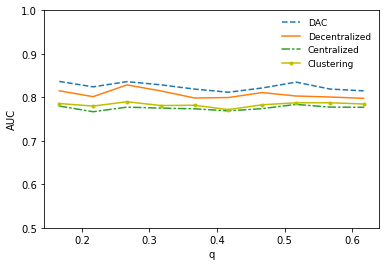

In [71]:

plt.plot(list_p, auc_alg,"--",label = 'DAC')
plt.plot(list_p, auc_b1,'',label = 'Decentralized')
plt.plot(list_p, auc_b2,linestyle=(0, (5, 2, 1, 2)), dash_capstyle='round',label = 'Centralized')
plt.plot(list_p, auc_clus,'y-o',markersize=3,label = 'Clustering')

plt.legend(loc='best',frameon=False,prop={'size': 9})
plt.xlabel('q')
plt.ylabel('AUC')
plt.ylim(0.5,1.0)
plt.show()

In [ ]:
auc_alg, auc_b1, auc_b2, auc_clus = [], [], [], []

p = 2/3
list_q = list(np.linspace(0,1-p,num=10,endpoint=False))

for q in list_q:

    result_1, result_2, result_3, result_4,result_5 = fit_models_upd(0.9,0.3,"bfgs")

    auc_alg.append(result_1)
    auc_b1.append(result_2)
    auc_b2.append(result_3)
    auc_clus.append(result_4)
    
    print('trial:', q)

In [ ]:
plt.plot(list_p, auc_alg,"--",label = 'DAC')
plt.plot(list_p, auc_b1,'',label = 'Decentralized')
plt.plot(list_p, auc_b2,linestyle=(0, (5, 2, 1, 2)), dash_capstyle='round',label = 'Centralized')
plt.plot(list_p, auc_clus,'y-o',markersize=3,label = 'Clustering')

plt.legend(loc='best',frameon=False,prop={'size': 9})
plt.xlabel('q')
plt.ylabel('AUC')
plt.ylim(0.5,1.0)
plt.show()

## Without noise

In [ ]:
fit_models_upd(0.9,0.3,"bfgs")

## With sigma = 1

In [ ]:
fit_models_upd(0.9,0.3,"bfgs")

In [ ]:
fit_models_upd(0.9,0.3,"newton")

## With different thresholds

In [ ]:
fit_models_upd(0.9,0.6,"bfgs")

# p=2/3 q=1/6

## sigma = 1

In [ ]:
p=2/3
q=1/6
sigma = 1
fit_models_upd(0.9,0.3,"bfgs")

In [ ]:
p=2/3
q=1/6
sigma = 1
fit_models_upd(0.9,0.3,"newton")

## 0.9 0/6

In [ ]:
p=2/3
q=1/6
sigma = 1
fit_models_upd(0.9,0.6,"bfgs")

In [ ]:
p=2/3
q=1/6
sigma = 1
fit_models_upd(0.9,0.6,"bfgs")

In [ ]:
p=2/3
q=1/3
sigma = 1
fit_models_upd(0.9,0.6,"bfgs")

In [ ]:
p=2/3
q=1/3

fit_models_upd(0.9,0.6,"bfgs")

# with only 10obs

In [ ]:
fit_models_upd(0.9,0.3,"bfgs")

In [ ]:
fit_models_upd(0.9,0.6,"bfgs")

In [ ]:
fit_models_upd(0.9,0.7,"bfgs")

In [ ]:
fit_models_upd(0.8,0.6,"bfgs")

# Varying the number of observations

In [ ]:
list_m = [i for i in range(10,110,10)]


auc_alg, auc_b1, auc_b2, auc_clus = [], [], [], []
for obs in list_m:
    result_1, result_2, result_3, result_4 = fit_models_upd(0.9,0.6,"bfgs")
    auc_alg.append(result_1)
    auc_b1.append(result_2)
    auc_b2.append(result_3)
    auc_clus.append(result_4)
    print("dac",result_1)
    print("dec",result_2)
    print("observations:",obs)

In [ ]:

plt.plot(list_n, auc_alg,"--",label = 'DAC')
plt.plot(list_n, auc_b1,'',label = 'Decentralized')
plt.plot(list_n, auc_b2,linestyle=(0, (5, 2, 1, 2)), dash_capstyle='round',label = 'Centralized')
plt.plot(list_n, auc_clus,'y-o',markersize=3,label = 'Clustering')

plt.legend(loc='best',frameon=False,prop={'size': 8})
plt.xlabel('n')
plt.ylabel('AUC')
plt.ylim(0.5,1.1)
plt.show()

# Varying the number of items

In [ ]:
list_n = [i for i in range(10,30,5)]


auc_alg, auc_b1, auc_b2, auc_clus = [], [], [], []
for n in list_n:
    result_1, result_2, result_3, result_4 = fit_models_upd(0.9,0.6,"bfgs")
    auc_alg.append(result_1)
    auc_b1.append(result_2)
    auc_b2.append(result_3)
    auc_clus.append(result_4)
    print("dac",result_1)
    print("dec",result_2)
    print("items:",n)


In [ ]:

plt.plot(list_n, auc_alg,"--",label = 'DAC')
plt.plot(list_n, auc_b1,'',label = 'Decentralized')
plt.plot(list_n, auc_b2,linestyle=(0, (5, 2, 1, 2)), dash_capstyle='round',label = 'Centralized')
plt.plot(list_n, auc_clus,'y-o',markersize=3,label = 'Clustering')

plt.legend(loc='best',frameon=False,prop={'size': 8})
plt.xlabel('n')
plt.ylabel('AUC')
plt.ylim(0.5,1.1)
plt.show()

In [ ]:
#T=500 0.9 0.4
plt.plot(list_n, auc_alg,"--",label = 'DAC')
plt.plot(list_n, auc_b1,'',label = 'Decentralized')
plt.plot(list_n, auc_b2,linestyle=(0, (5, 2, 1, 2)), dash_capstyle='round',label = 'Centralized')
plt.plot(list_n, auc_clus,'y-o',markersize=3,label = 'Clustering')

plt.legend(loc='best',frameon=False,prop={'size': 8})
plt.xlabel('n')
plt.ylabel('AUC')
plt.ylim(0.5,1.1)
plt.show()

In [ ]:
plt.plot(list_n, auc_alg,"--",label = 'DAC')
plt.plot(list_n, auc_b1,'',label = 'Decentralized')
plt.plot(list_n, auc_b2,linestyle=(0, (5, 2, 1, 2)), dash_capstyle='round',label = 'Centralized')
plt.plot(list_n, auc_clus,'y-o',markersize=3,label = 'Clustering')

plt.legend(loc='best',frameon=False,prop={'size': 8})
plt.xlabel('n')
plt.ylabel('AUC')
plt.ylim(0.5,1.1)
plt.show()

In [ ]:
plt.plot(list_n, auc_alg,"--",label = 'DAC')
plt.plot(list_n, auc_b1,'',label = 'Decentralized')
plt.plot(list_n, auc_b2,linestyle=(0, (5, 2, 1, 2)), dash_capstyle='round',label = 'Centralized')
plt.plot(list_n, auc_clus,'y-o',markersize=3,label = 'Clustering')

plt.legend(loc='best',frameon=False,prop={'size': 8})
plt.xlabel('n')
plt.ylabel('AUC')
plt.ylim(0.5,1.1)
plt.show()

In [ ]:
plt.plot(list_n, auc_alg,"--",label = 'DAC')
plt.plot(list_n, auc_b1,'',label = 'Decentralized')
plt.plot(list_n, auc_b2,linestyle=(0, (5, 2, 1, 2)), dash_capstyle='round',label = 'Centralized')
plt.plot(list_n, auc_clus,'y-o',markersize=3,label = 'Clustering')

plt.legend(loc='best',frameon=False,prop={'size': 8})
plt.xlabel('n')
plt.ylabel('AUC')
plt.ylim(0.5,1.1)
plt.show()

In [ ]:
n = 10
fit_models_upd(0.9,0.3,"bfgs")

In [ ]:
n = 10
fit_models_upd(0.9,0.4,"bfgs")

In [ ]:
n = 10
fit_models_upd(0.9,0.6,"bfgs")

# VARYING FEATURES

# VARYING OBSERVATIONS

In [ ]:
fit_models_upd(0.9,0.2,"bfgs")

In [ ]:
fit_models_upd(0.8,0.2,"bfgs")

In [ ]:
fit_models_upd(0.9,0.3,"bfgs")

In [ ]:
fit_models_upd(0.9,0.3,"lbfgs")

In [ ]:
fit_models_upd(0.9,0.3,"lbfgs")

In [ ]:
fit_models_upd(0.9,0.3,"nm")

In [ ]:
fit_models_upd(0.9,0.3,"newton")

In [ ]:
fit_models_upd(0.9,0.3,"newton")

In [ ]:
fit_models_upd(0.9,0.3,"powell")

In [ ]:
fit_models_upd(0.9,0.3,"cg")

In [ ]:
fit_models_upd(0.9,0.3,"ncg")

In [ ]:
fit_models_upd(0.9,0.3,"basinhopping")

# Without flag

In [ ]:
def fit_models_upd(Ru,Rl,method):
    auc_alg_t, auc_b1_t, auc_b2_t, auc_lasso_t, auc_clus_t,auc_true_t =  np.zeros(T), np.zeros(T),np.zeros(T), np.zeros(T), np.zeros(T),np.zeros(T)
    

    for t in range(T):

        # generate data
        data = np.random.rand(n*obs,d)
        data_test = np.random.rand(int(n*obs/2),d)

            # generate clusters and betas
        feature_dict = {}
        clus_dict = {} # might not be used depending on the feature dict

        for i in range(d):
                # whether this feature should be estimated at the department level
            feature_dict[i] = np.random.choice(['dept', 'clus', 'sku'], p = [p, q, 1-p-q])
        print(feature_dict)

        items = set(range(n))

        for i in range(z):
            clus_items = random.sample(items,int(n/z))
            clus_dict[i] = clus_items
            items = items - set(clus_items)

        # generate Beta
        beta_dict = {}            
        num_cols = 0
        for i in range(d):
            if feature_dict[i] == 'dept':
                beta_dict[i] = (np.random.random_sample() - 0.5) * 10
                num_cols += 1
            elif feature_dict[i] == 'clus':
                beta_dict[i] = (np.random.random_sample(size = z) - 0.5) * 10
                num_cols += z
            else:
                beta_dict[i] = (np.random.random_sample(size = n) - 0.5) * 10
                num_cols += n

        X_true = np.zeros((n*obs, num_cols))
        X_test = np.zeros((int(n*obs/2), num_cols))

        beta = np.zeros(num_cols)
        count = 0
        for i in range(d):
            if feature_dict[i] == 'dept':
                beta[count] = beta_dict[i]
                X_true[:,count] = data[:,i]
                X_test[:,count] = data_test[:,i]

                count += 1

            elif feature_dict[i] == 'clus':
                for j in range(z):
                    clus_items = clus_dict[j]
                    for sku in clus_items:
                        X_true[sku*obs:(sku+1)*obs, count] = data[sku*obs:(sku+1)*obs, i]
                        X_test[int(sku*obs/2):int((sku+1)*obs/2), count] = data_test[int(sku*obs/2):int((sku+1)*obs/2), i]

                    beta[count] = beta_dict[i][j]
                    count += 1
            else:
                for j in range(n):
                    X_true[j*obs:(j+1)*obs, count] = data[j*obs:(j+1)*obs, i]
                    X_test[int(j*obs/2):int((j+1)*obs/2), count] = data_test[int(j*obs/2):int((j+1)*obs/2), i]
                    beta[count] = beta_dict[i][j]
                    count += 1
            #epsilon = np.random.multivariate_normal(np.zeros(n*obs), np.identity(n*obs)*sigma)
            #epsilon_test = np.random.multivariate_normal(np.zeros(int(n*obs/2)), np.identity(int(n*obs/2))*sigma)
        mu = np.dot(X_true, beta)
            #+epsilon
        mu_test = np.dot(X_test, beta)
            #+epsilon_test
        y = bernoulli.rvs(size=len(mu),p=expit(mu)) #generate y from a bernoulli distribution with p = logit(X*beta)
        y_test = bernoulli.rvs(size=len(mu_test),p=expit(mu_test))
            
            #we are going to test if some features only have labels 1 or 0 and repeat 
            #the data generation until we have balanced generated data
           

        #TRUE DAC
        #model_true = sm.Logit(y, X_true).fit(method=method,maxiter=100)
        #y_pred = model_true.predict(X_test)
        #auc_true_t[t] = roc_auc_score(y_test, np.array(y_pred))
        
        #DECENTRALIZED
        
        y_pred = []
        logit_models = {}
        for i in range(n):

            logit_models[i] = sm.Logit(y[i*obs:(i+1)*obs],data[i*obs:(i+1)*obs,:]).fit(method=method,maxiter=100)
            y_pred += list(logit_models[i].predict(data_test[int(i*obs/2):int((i+1)*obs/2),:]))

        auc_b1_t[t] = roc_auc_score(y_test,np.array(y_pred))
        
        
        #DAC
        
        aggre_level = []
        clus_columns = []
        all_coeff = np.zeros((n,d))
        all_coeff[0,:] = logit_models[0].params
        n_cols_alg = 0

        for j in range(d):

            # a n-1 vector recording if two betas have the same mean
            test_j = np.zeros(n-1)

            for i in range(1,n):
               #print(i,j)
                all_coeff[i,j] = logit_models[i].params[j]

                z_stat = ( np.abs(logit_models[0].params[j] - logit_models[i].params[j]) / 
                          np.sqrt(np.square(logit_models[0].bse[j]) + np.square(logit_models[i].bse[j])) )
                p_value = 1 - norm.cdf(z_stat)
                if p_value >= 0.05:  #P-value ->0.05
                    test_j[i-1] = 1

            if np.sum(test_j) >= Ru*(n-1):
                aggre_level.append('dept')
                n_cols_alg += 1

            elif np.sum(test_j) <= Rl*(n-1):
                aggre_level.append('sku')
                n_cols_alg += n

            else:
                aggre_level.append('clus')
                clus_columns.append(j)
                n_cols_alg += z

        if len(clus_columns) > 0:
            X_clus = all_coeff[:, clus_columns]
            kmeans = KMeans(n_clusters=z, random_state=0).fit(X_clus)

        X_alg = np.zeros((n*obs, n_cols_alg))
        X_test = np.zeros((int(n*obs/2), n_cols_alg))

        count = 0
        for i in range(d):
            if aggre_level[i] == 'dept':
                X_alg[:,count] = data[:,i]
                X_test[:,count] = data_test[:,i]
                count += 1

            elif aggre_level[i] == 'clus':
                for j in range(z):
                    clus_items = list(np.where(kmeans.labels_ == j)[0])
                    for sku in clus_items:
                        X_alg[sku*obs:(sku+1)*obs, count] = data[sku*obs:(sku+1)*obs, i]
                        X_test[int(sku*obs/2):int((sku+1)*obs/2), count] = data_test[int(sku*obs/2):int((sku+1)*obs/2), i]


                    count += 1
            else:
                for j in range(n):
                    X_alg[j*obs:(j+1)*obs, count] = data[j*obs:(j+1)*obs, i]
                    X_test[int(j*obs/2):int((j+1)*obs/2), count] = data_test[int(j*obs/2):int((j+1)*obs/2), i]
                    count += 1
                    
                    
        model_0 = sm.Logit(y,X_alg).fit(method=method,maxiter=100)
        auc_alg_t[t] = roc_auc_score(y_test,model_0.predict(X_test))
        
        
        # CENTRALIZED
        
        model_0 = sm.Logit(y,data).fit(method=method,maxiter=100)
        auc_b2_t[t] = roc_auc_score(y_test,model_0.predict(data_test))
        

        # CLUSTER 
        
        X_clus = np.zeros((n, d))
        count = 0
        y_pred = np.zeros(int(n*obs/2))
        for i in range(n):
            X_clus[count, :] = np.mean(data[i*obs:(i+1)*obs,:], axis = 0)
            count += 1
        
        kmeans = KMeans(n_clusters=z, random_state=0).fit(X_clus)
        for i in range(z):
            clus_items = list(np.where(kmeans.labels_ == i)[0])
            base_rows = np.array(list(range(obs)))
            base_rows_test = np.array(list(range(int(obs/2))))
            rows = []
            test_rows = []
            for j in clus_items:
                rows += list(range( j*obs, (j+1)*obs ))
                test_rows += list(range( j*int(obs/2), (j+1)*int(obs/2) ))
            
            model_i = sm.Logit(y[np.ix_(rows)], data[np.ix_(rows)]).fit(method=method,maxiter=100)
            y_pred[np.ix_(test_rows)] = model_i.predict(data_test[np.ix_(test_rows)])

        auc_clus_t[t] = roc_auc_score(y_test,np.array(y_pred))
        print(auc_alg_t[t])
        print(auc_b1_t[t])
        
        
    return(np.mean(auc_alg_t),np.std(auc_alg_t),np.mean(auc_b1_t),np.std(auc_b1_t))

In [ ]:
fit_models_upd(0.9,0.2,method='bfgs')

In [ ]:
import statsmodels.api as sm

In [ ]:
import statsmodels.api as sm
logit_model=sm.Logit(y,X)
result=logit_model.fit()
print(result.summary2())

In [ ]:
if np.mean(l)*(1-np.mean(l)) ==0:
    print(l)

In [ ]:
y = [0,0,0,0,0,0,0,0,0,0,]
i=0

In [ ]:
list(np.full(shape=int(obs/2),fill_value = y[i*obs:(i+1)*obs][0]))

In [ ]:
def fit_models_upd(Ru,Rl):
    

    auc_alg_t, auc_b1_t, auc_b2_t, auc_lasso_t, auc_clus_t,auc_true_t = np.zeros(T), np.zeros(T), np.zeros(T), np.zeros(T), np.zeros(T),np.zeros(T)
    
    
    for t in range(T):

        # generate data
        data = np.random.rand(n*obs,d)
        data_test = np.random.rand(int(n*obs/2),d)

        # generate clusters and betas
        feature_dict = {}
        clus_dict = {} # might not be used depending on the feature dict

        for i in range(d):
            # whether this feature should be estimated at the department level
            feature_dict[i] = np.random.choice(['dept', 'clus', 'sku'], p = [p, q, 1-p-q])


        items = set(range(n))

        for i in range(z):
            clus_items = random.sample(items,int(n/z))
            clus_dict[i] = clus_items
            items = items - set(clus_items)

        # generate Beta
        beta_dict = {}
        num_cols = 0
        for i in range(d):
            if feature_dict[i] == 'dept':
                beta_dict[i] = (np.random.random_sample() - 0.5) * 10
                num_cols += 1
            elif feature_dict[i] == 'clus':
                beta_dict[i] = (np.random.random_sample(size = z) - 0.5) * 10
                num_cols += z
            else:
                beta_dict[i] = (np.random.random_sample(size = n) - 0.5) * 10
                num_cols += n

        X_true = np.zeros((n*obs, num_cols))
        X_test = np.zeros((int(n*obs/2), num_cols))

        beta = np.zeros(num_cols)
        count = 0
        for i in range(d):
            if feature_dict[i] == 'dept':
                beta[count] = beta_dict[i]
                X_true[:,count] = data[:,i]
                X_test[:,count] = data_test[:,i]

                count += 1

            elif feature_dict[i] == 'clus':
                for j in range(z):
                    clus_items = clus_dict[j]
                    for sku in clus_items:
                        X_true[sku*obs:(sku+1)*obs, count] = data[sku*obs:(sku+1)*obs, i]
                        X_test[int(sku*obs/2):int((sku+1)*obs/2), count] = data_test[int(sku*obs/2):int((sku+1)*obs/2), i]

                    beta[count] = beta_dict[i][j]
                    count += 1
            else:
                for j in range(n):
                    X_true[j*obs:(j+1)*obs, count] = data[j*obs:(j+1)*obs, i]
                    X_test[int(j*obs/2):int((j+1)*obs/2), count] = data_test[int(j*obs/2):int((j+1)*obs/2), i]
                    beta[count] = beta_dict[i][j]
                    count += 1

        mu = np.dot(X_true, beta)
        mu_test = np.dot(X_test, beta)
        
        y = bernoulli.rvs(size=len(mu),p=expit(mu)) #generate y from a bernoulli distribution with p = logit(X*beta)
        y_test = bernoulli.rvs(size=len(mu_test),p=expit(mu_test))
        
        
        
        
        
        #DECENTRALIZED
        
        y_pred = []
        logit_models = {}
        for i in range(n):

            
            try:
                logit_models[i] = LogisticRegression().fit(data[i*obs:(i+1)*obs,:],y[i*obs:(i+1)*obs])
                
                y_pred += list(logit_models[i].predict(data_test[int(i*obs/2):int((i+1)*obs/2),:]))
                print(y[i*obs:(i+1)*obs])
                print(logit_models[i].coef_)
            except:
                y_pred += list(np.full(shape=int(obs/2),fill_value = y[i*obs:(i+1)*obs][0]))
                logit_models[i] = [[-0.0569363  -0.43993644 -0.40889615  -0.39230954 -0.25587721]]
            
        auc_b1_t[t] = roc_auc_score(y_test,np.array(y_pred))
        
        
        
        
        #DAC
        
        aggre_level = []
        clus_columns = []
        all_coeff = np.zeros((n,d))
        all_coeff[0,:] = logit_models[0].coef_
        n_cols_alg = 0

        for j in range(d):

            # a n-1 vector recording if two betas have the same mean
            test_j = np.zeros(n-1)

            for i in range(1,n):
                print(i,j)
                all_coeff[i,j] = logit_models[i].coef[j]

                z_stat = ( np.abs(logit_models[0].coef[j] - logit_models[i].coef[j]) / 
                          np.sqrt(np.square(logit_models[0].bse[j]) + np.square(logit_models[i].bse[j])) )
                p_value = 1 - norm.cdf(z_stat)
                if p_value >= 0.05:  #P-value ->0.05
                    test_j[i-1] = 1

            if np.sum(test_j) >= Ru*(n-1):
                aggre_level.append('dept')
                n_cols_alg += 1

            elif np.sum(test_j) <= Rl*(n-1):
                aggre_level.append('sku')
                n_cols_alg += n

            else:
                aggre_level.append('clus')
                clus_columns.append(j)
                n_cols_alg += z

        if len(clus_columns) > 0:
            X_clus = all_coeff[:, clus_columns]
            kmeans = KMeans(n_clusters=z, random_state=0).fit(X_clus)

        X_alg = np.zeros((n*obs, n_cols_alg))
        X_test = np.zeros((int(n*obs/2), n_cols_alg))

        count = 0
        for i in range(d):
            if aggre_level[i] == 'dept':
                X_alg[:,count] = data[:,i]
                X_test[:,count] = data_test[:,i]
                count += 1

            elif aggre_level[i] == 'clus':
                for j in range(z):
                    clus_items = list(np.where(kmeans.labels_ == j)[0])
                    for sku in clus_items:
                        X_alg[sku*obs:(sku+1)*obs, count] = data[sku*obs:(sku+1)*obs, i]
                        X_test[int(sku*obs/2):int((sku+1)*obs/2), count] = data_test[int(sku*obs/2):int((sku+1)*obs/2), i]


                    count += 1
            else:
                for j in range(n):
                    X_alg[j*obs:(j+1)*obs, count] = data[j*obs:(j+1)*obs, i]
                    X_test[int(j*obs/2):int((j+1)*obs/2), count] = data_test[int(j*obs/2):int((j+1)*obs/2), i]
                    count += 1
                    
                    
        model_0 = LogisticRegression().fit(X_alg,y)
        auc_alg_t[t] = roc_auc_score(y_test,model_0.predict(x_pred))
        
                                    
    return(np.mean(auc_alg_t),np.mean(auc_b1_t))
        
    
        
        
        